# Import Libraries

In [ ]:
import sys
sys.path.append("..")
import seaborn as sb
import dgl
import torch

import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import TSNE
from tqdm import tqdm
import torch.nn.functional as F

import statistics
import argparse
import random

from dgl.data import CitationGraphDataset
# from dgl.nn import GINConv, GraphConv, SAGEConv
import seaborn as sb
import torch
import torch.nn as nn
from torch.autograd import Variable
from scipy.optimize import linear_sum_assignment
import scipy
import scipy.optimize
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
from torch.utils.data import Dataset
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import sklearn as sk
import networkx as nx


import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.multiprocessing as mp
import random
import math


import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.data import Data

from torch_geometric.nn import GCNConv,GINConv,SAGEConv,GATConv,PNAConv, GraphSAGE
from torch_geometric.utils import add_self_loops
from torch_geometric.transforms import normalize_features
from pygod.utils import load_data
from pygod.utils.utility import check_parameter
from pygod.metrics import eval_roc_auc
from pygod.generator import gen_contextual_outliers, gen_structural_outliers
from scipy.linalg import sqrtm

# Utils

In [2]:

def _normalize(x):
    x_min = x.min()
    x_max = x.max()
    x_norm = (x - x_min)/x_max
    return x_norm

def gen_joint_structural_outliers(data, m, n, random_state=None):
    """
    We randomly select n nodes from the network which will be the anomalies 
    and for each node we select m nodes from the network. 
    We connect each of n nodes with the m other nodes.

    Parameters
    ----------
    data : PyTorch Geometric Data instance (torch_geometric.data.Data)
        The input data.
    m : int
        Number nodes in the outlier cliques.
    n : int
        Number of outlier cliques.
    p : int, optional
        Probability of edge drop in cliques. Default: ``0``.
    random_state : int, optional
        The seed to control the randomness, Default: ``None``.

    Returns
    -------
    data : PyTorch Geometric Data instance (torch_geometric.data.Data)
        The structural outlier graph with injected edges.
    y_outlier : torch.Tensor
        The outlier label tensor where 1 represents outliers and 0 represents
        regular nodes.
    """

    if not isinstance(data, Data):
        raise TypeError("data should be torch_geometric.data.Data")

    if isinstance(m, int):
        check_parameter(m, low=0, high=data.num_nodes, param_name='m')
    else:
        raise ValueError("m should be int, got %s" % m)

    if isinstance(n, int):
        check_parameter(n, low=0, high=data.num_nodes, param_name='n')
    else:
        raise ValueError("n should be int, got %s" % n)

    check_parameter(m * n, low=0, high=data.num_nodes, param_name='m*n')

    if random_state:
        np.random.seed(random_state)


    outlier_idx = np.random.choice(data.num_nodes, size=n, replace=False)
    all_nodes = [i for i in range(data.num_nodes)]
    rem_nodes = []
    
    for node in all_nodes:
        if node is not outlier_idx:
            rem_nodes.append(node)
    
    
    
    new_edges = []
    
    # connect all m nodes in each clique
    for i in range(0, n):
        other_idx = np.random.choice(data.num_nodes, size=m, replace=False)
        for j in other_idx:
            new_edges.append(torch.tensor([[i, j]], dtype=torch.long))
                    

    new_edges = torch.cat(new_edges)


    y_outlier = torch.zeros(data.x.shape[0], dtype=torch.long)
    y_outlier[outlier_idx] = 1

    data.edge_index = torch.cat([data.edge_index, new_edges.T], dim=1)

    return data, y_outlier


def KL_neighbor_loss(predictions, targets, mask_len):
    x1 = predictions.squeeze().cpu().detach()
    x2 = targets.squeeze().cpu().detach()
    
    mean_x1 = x1.mean(0)
    mean_x2 = x2.mean(0)
    
    nn = x1.shape[0]
    h_dim = x1.shape[1]
    
    cov_x1 = (x1-mean_x1).transpose(1,0).matmul(x1-mean_x1) / max((nn-1),1)
    cov_x2 = (x2-mean_x2).transpose(1,0).matmul(x2-mean_x2) / max((nn-1),1)
    
    eye = torch.eye(h_dim)
    cov_x1 = cov_x1 + eye
    cov_x2 = cov_x2 + eye
    
    KL_loss = 0.5 * (math.log(torch.det(cov_x1) / torch.det(cov_x2)) - h_dim  + torch.trace(torch.inverse(cov_x2).matmul(cov_x1)) 
            + (mean_x2 - mean_x1).reshape(1,-1).matmul(torch.inverse(cov_x2)).matmul(mean_x2 - mean_x1))
    KL_loss = KL_loss.to(device)
    return KL_loss

def W2_neighbor_loss(predictions, targets, mask_len):
    
    x1 = predictions.squeeze().cpu().detach()
    x2 = targets.squeeze().cpu().detach()
    
    mean_x1 = x1.mean(0)
    mean_x2 = x2.mean(0)

    nn = x1.shape[0]
    
    cov_x1 = (x1-mean_x1).transpose(1,0).matmul(x1-mean_x1) / (nn-1)
    cov_x2 = (x2-mean_x2).transpose(1,0).matmul(x2-mean_x2) / (nn-1)
    

    W2_loss = torch.square(mean_x1-mean_x2).sum() + torch.trace(cov_x1 + cov_x2 
                     + 2 * sqrtm(sqrtm(cov_x1) @ (cov_x2.numpy()) @ (sqrtm(cov_x1))))

    return W2_loss



# Layers

In [3]:
class MLP(nn.Module):
    def __init__(self, num_layers, input_dim, hidden_dim, output_dim):
        

        super(MLP, self).__init__()

        self.linear_or_not = True  # default is linear model
        self.num_layers = num_layers

        if num_layers < 1:
            raise ValueError("number of layers should be positive!")
        elif num_layers == 1:
            # Linear model
            self.linear = nn.Linear(input_dim, output_dim)
        else:
            # Multi-layer model
            self.linear_or_not = False
            self.linears = torch.nn.ModuleList()
            self.batch_norms = torch.nn.ModuleList()

            self.linears.append(nn.Linear(input_dim, hidden_dim))
            for layer in range(num_layers - 2):
                self.linears.append(nn.Linear(hidden_dim, hidden_dim))
            self.linears.append(nn.Linear(hidden_dim, output_dim))

            for layer in range(num_layers - 1):
                self.batch_norms.append(nn.BatchNorm1d((hidden_dim)))

    def forward(self, x):
        if self.linear_or_not:
            # If linear model
            return self.linear(x)
        else:
            # If MLP
            h = x
            for layer in range(self.num_layers - 1):
                h = self.linears[layer](h)
                
                if len(h.shape) > 2:
                    h = torch.transpose(h, 0, 1)
                    h = torch.transpose(h, 1, 2)
                    
                h = self.batch_norms[layer](h)
                
                if len(h.shape) > 2:
                    h = torch.transpose(h, 1, 2)
                    h = torch.transpose(h, 0, 1)

                h = F.relu(h)
                # h = F.relu(self.linears[layer](h))
                
            return self.linears[self.num_layers - 1](h)


class MLP_generator(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(MLP_generator, self).__init__()
        self.linear = nn.Linear(input_dim, output_dim)
        self.linear2 = nn.Linear(output_dim, output_dim)
        self.linear3 = nn.Linear(output_dim, output_dim)
        self.linear4 = nn.Linear(output_dim, output_dim)

    def forward(self, embedding):
        neighbor_embedding = F.relu(self.linear(embedding))
        neighbor_embedding = F.relu(self.linear2(neighbor_embedding))
        neighbor_embedding = F.relu(self.linear3(neighbor_embedding))
        neighbor_embedding = self.linear4(neighbor_embedding)
        return neighbor_embedding


class PairNorm(nn.Module):
    def __init__(self, mode='PN', scale=10):
        
        assert mode in ['None', 'PN', 'PN-SI', 'PN-SCS']
        super(PairNorm, self).__init__()
        self.mode = mode
        self.scale = scale

        # Scale can be set based on origina data, and also the current feature lengths.
        # We leave the experiments to future. A good pool we used for choosing scale:
        # [0.1, 1, 10, 50, 100]
    def forward(self, x):
        if self.mode == 'None':
            return x
        col_mean = x.mean(dim=0)
        if self.mode == 'PN':
            x = x - col_mean
            rownorm_mean = (1e-6 + x.pow(2).sum(dim=1).mean()).sqrt()
            x = self.scale * x / rownorm_mean
        if self.mode == 'PN-SI':
            x = x - col_mean
            rownorm_individual = (1e-6 + x.pow(2).sum(dim=1, keepdim=True)).sqrt()
            x = self.scale * x / rownorm_individual
        if self.mode == 'PN-SCS':
            rownorm_individual = (1e-6 + x.pow(2).sum(dim=1, keepdim=True)).sqrt()
            x = self.scale * x / rownorm_individual - col_mean
        return x


# FNN
class FNN(nn.Module):
    def __init__(self, in_features, hidden, out_features, layer_num):
        super(FNN, self).__init__()
        self.linear1 = MLP(layer_num, in_features, hidden, out_features)
        self.linear2 = nn.Linear(out_features, out_features)
    def forward(self, embedding):
        x = self.linear1(embedding)
        x = self.linear2(F.relu(x))
        x = F.relu(x)
        return x


# GAD-NR

In [4]:

# Training
def train(data, y, yc, ys, yj, ysj, lr, epoch, device, encoder, lambda_loss1, lambda_loss2, lambda_loss3, hidden_dim, sample_size=10,loss_step=20,
          real_loss=False,calculate_contextual=False,calculate_structural=False):
    '''
     Main training function
     INPUT:
     -----------------------
     data : torch geometric dataset object
     lr    :    learning rate
     epoch     :    number of training epoch
     device     :   CPU or GPU
     encoder    :    GCN or GIN or GraphSAGE
     lambda_loss    :   Trade-off between degree loss and neighborhood reconstruction loss
     hidden_dim     :   latent variable dimension
    '''
    
    in_nodes = data.edge_index[0,:]
    out_nodes = data.edge_index[1,:]
    
    
    neighbor_dict = {}
    for in_node, out_node in zip(in_nodes, out_nodes):
        if in_node.item() not in neighbor_dict:
            neighbor_dict[in_node.item()] = []
        neighbor_dict[in_node.item()].append(out_node.item())

    neighbor_num_list = []
    for i in neighbor_dict:
        neighbor_num_list.append(len(neighbor_dict[i]))
    
    neighbor_num_list = torch.tensor(neighbor_num_list).to(device)
    
    in_dim = data.x.shape[1]
    GNNModel = GNNStructEncoder(in_dim, hidden_dim, hidden_dim, 2, sample_size, device=device, 
                    neighbor_num_list=neighbor_num_list, GNN_name=encoder, 
                    lambda_loss1=lambda_loss1, lambda_loss2=lambda_loss2,lambda_loss3=lambda_loss3)
    GNNModel.to(device)
    degree_params = list(map(id, GNNModel.degree_decoder.parameters()))
    base_params = filter(lambda p: id(p) not in degree_params,
                         GNNModel.parameters())

    opt = torch.optim.Adam([{'params': base_params}, {'params': GNNModel.degree_decoder.parameters(), 'lr': 1e-2}],lr=lr, weight_decay=0.0003)
    min_loss = float('inf')
    arg_min_loss_per_node = None
    
    best_auc = 0
    best_auc_contextual = 0
    best_auc_dense_structural = 0
    best_auc_joint_structural = 0
    best_auc_structure_type = 0
    
        
    loss_values = []
    for i in tqdm(range(1,epoch+1,1)):
        
        
        if i%loss_step==0:
            GNNModel.lambda_loss2 = GNNModel.lambda_loss2 + 0.5
            GNNModel.lambda_loss3 = GNNModel.lambda_loss3 / 2
        
        loss,loss_per_node,h_loss,degree_loss,feature_loss = GNNModel(data.edge_index, data.x, neighbor_num_list, neighbor_dict, device=device)
        
        
        
        loss_per_node = loss_per_node.cpu().detach()
        
        h_loss = h_loss.cpu().detach()
        degree_loss = degree_loss.cpu().detach()
        feature_loss = feature_loss.cpu().detach()
        
        h_loss_norm = h_loss / (torch.max(h_loss) - torch.min(h_loss))
        degree_loss_norm = degree_loss / (torch.max(degree_loss) - torch.min(degree_loss))
        feature_loss_norm = feature_loss / (torch.max(feature_loss) - torch.min(feature_loss))
        
        comb_loss = args.h_loss_weight * h_loss_norm + args.degree_loss_weight *  degree_loss_norm + args.feature_loss_weight * feature_loss_norm
        
        if real_loss:
            comp_loss = loss_per_node
        else:
            comp_loss = comb_loss
            
        
        auc_score = eval_roc_auc(y.numpy(), comp_loss.numpy()) * 100
        print("Dataset Name: ",dataset_str, ", AUC Score(benchmark/combined): ", auc_score)
        
        contextual_auc_score = eval_roc_auc(yc.numpy(), comp_loss.numpy()) * 100
        print("Dataset Name: ",dataset_str, ", AUC Score (contextual): ", contextual_auc_score)

        dense_structural_auc_score = eval_roc_auc(ys.numpy(), comp_loss.numpy()) * 100
        print("Dataset Name: ",dataset_str, ", AUC Score (structural): ", dense_structural_auc_score)
        
        joint_type_auc_score = eval_roc_auc(yj.numpy(), comp_loss.numpy()) * 100
        print("Dataset Name: ",dataset_str, ", AUC Score (joint-type): ", joint_type_auc_score)
        
        structure_type_auc_score = eval_roc_auc(ysj.numpy(), comp_loss.numpy()) * 100
        print("Dataset Name: ",dataset_str, ", AUC Score (structure type): ", structure_type_auc_score) 
        
        best_auc = max(best_auc, auc_score)
        best_auc_contextual = max(best_auc_contextual, contextual_auc_score)
        best_auc_dense_structural = max(best_auc_dense_structural, dense_structural_auc_score)
        best_auc_joint_type = max(best_auc_joint_structural, joint_type_auc_score)
        best_auc_structure_type = max(best_auc_structure_type, structure_type_auc_score)
        
        
        
        print("===========================================================================================")
        print("Dataset Name: ",dataset_str, " Best AUC Score(benchmark/combined): ", best_auc)
        
        print("Dataset Name: ",dataset_str, " Best AUC Score (contextual): ", best_auc_contextual)

        
        print("Dataset Name: ",dataset_str, " Best AUC Score (structural): ", best_auc_dense_structural)
        
        
        print("Dataset Name: ",dataset_str, " Best AUC Score (joint-type): ", best_auc_joint_type)
        
        
        print("Dataset Name: ",dataset_str, " Best AUC Score (structure type): ", best_auc_structure_type) 
        print("===========================================================================================")
        
        
        if loss < min_loss:
            min_loss = loss
            arg_min_loss_per_node = loss_per_node
        opt.zero_grad()
        loss.backward()
        opt.step()
        
        
        
        loss = loss.cpu().detach()
        loss_values.append(loss)
        
        
        if args.plot_loss:

            plt.plot(np.array(loss_values), 'r')
            plt.show()
    
    return min_loss.item(), arg_min_loss_per_node.cpu().detach()




def evaluate(model, embeddings, labels, mask):
    model.eval()
    with torch.no_grad():
        logits = model(embeddings)
        logits = logits[mask]
        labels = labels[mask]
        _, indices = torch.max(logits, dim=1)
        correct = torch.sum(indices == labels)
        return correct.item() * 1.0 / len(labels)


def train_real_datasets(dataset_str, epoch_num = 10, lr = 5e-6, encoder = "GCN", 
                        lambda_loss1=1e-2, lambda_loss2=1e-3, lambda_loss3=1e-3, sample_size=8, loss_step=20, hidden_dim=None,
                        real_loss=False,calculate_contextual=False,calculate_structural=False):
    
    data = load_data(dataset_str)
    node_features = data.x
    
    if args.normalize_feat:
    
        node_features_min = node_features.min()
        node_features_max = node_features.max()
        node_features = (node_features - node_features_min)/node_features_max
        data.x = node_features
    
    yc = []
    ys = []
    yj = []
    
    if calculate_contextual:
        
        if dataset_str == "inj_cora":
            yc = data.y >> 0 & 1 # contextual outliers
        else:
            data, yc = gen_contextual_outliers(data=data,n=args.contextual_n,k=args.contextual_k)
            
        yc = yc.cpu().detach()
    
    
    if calculate_structural:
        
        if dataset_str == "inj_cora":
            ys = data.y >> 1 & 1 # structural outliers
        else:
            data, ys = gen_structural_outliers(data=data,n=args.structural_n,m=args.structural_m,p=0.2)
            
        ys = ys.cpu().detach()
        data, yj = gen_joint_structural_outliers(data=data,n=args.structural_n,m=args.structural_m)
        
    
    if args.use_combine_outlier:
        data.y = torch.logical_or(ys, yc).int()
        
    ysj = torch.logical_or(ys, yj).int()
    y = data.y.bool()    # binary labels (inlier/outlier)
    y = y.cpu().detach()
    
    edge_index = data.edge_index.cpu()
    
    num_nodes = node_features.shape[0]
    self_edges = torch.tensor([[i for i in range(num_nodes)],[i for i in range(num_nodes)]])
    edge_index = torch.cat([edge_index,self_edges],dim=1)
    data.edge_index = edge_index
    data = data.to(device)
    

    loss, loss_per_node, = train(data, y, yc, ys, yj, ysj, lr=lr, epoch=epoch_num, device=device, encoder=encoder, lambda_loss1=lambda_loss1, 
          lambda_loss2=lambda_loss2, lambda_loss3=lambda_loss3, hidden_dim=hidden_dim, sample_size=sample_size,loss_step=loss_step,
                                 real_loss=real_loss,calculate_contextual=calculate_contextual,calculate_structural=calculate_structural)

In [5]:
# generate ground truth neighbors Hv
def generate_gt_neighbor(neighbor_dict, node_embeddings, neighbor_num_list, in_dim):
    max_neighbor_num = max(neighbor_num_list)
    all_gt_neighbor_embeddings = []
    for i, embedding in enumerate(node_embeddings):
        neighbor_indexes = neighbor_dict[i]
        neighbor_embeddings = []
        for index in neighbor_indexes:
            neighbor_embeddings.append(node_embeddings[index].tolist())
        if len(neighbor_embeddings) < max_neighbor_num:
            for _ in range(max_neighbor_num - len(neighbor_embeddings)):
                neighbor_embeddings.append(torch.zeros(in_dim).tolist())
        all_gt_neighbor_embeddings.append(neighbor_embeddings)
    return all_gt_neighbor_embeddings


# Main Autoencoder structure here
class GNNStructEncoder(nn.Module):
    def __init__(self, in_dim0, in_dim, hidden_dim, layer_num, sample_size, device, neighbor_num_list, 
                 GNN_name="GIN", norm_mode="PN-SCS", norm_scale=20, lambda_loss1=0.01, lambda_loss2=0.001, lambda_loss3=0.0001):
        
        super(GNNStructEncoder, self).__init__()
        
        self.mlp0 = nn.Linear(in_dim0, hidden_dim)
        self.norm = PairNorm(norm_mode, norm_scale)
        self.out_dim = hidden_dim
        self.lambda_loss1 = lambda_loss1
        self.lambda_loss2 = lambda_loss2
        self.lambda_loss3 = lambda_loss3
        # GNN Encoder
        if GNN_name == "GIN":
            self.linear1 = MLP(layer_num, hidden_dim, hidden_dim, hidden_dim)
            self.graphconv1 = GINConv(self.linear1)
            self.linear2 = MLP(layer_num, hidden_dim, hidden_dim, hidden_dim)
            self.graphconv2 = GINConv(self.linear2)
        elif GNN_name == "GCN":
            self.graphconv1 = GCNConv(hidden_dim, hidden_dim)
            self.graphconv2 = GCNConv(hidden_dim, hidden_dim)
        elif GNN_name == "GAT":
            self.graphconv1 = GATConv(hidden_dim, hidden_dim)
            self.graphconv2 = GATConv(hidden_dim, hidden_dim)
        else:
            self.graphconv1 = SAGEConv(hidden_dim, hidden_dim, aggr='sum')
            # self.graphconv2 = SAGEConv(hidden_dim, hidden_dim, aggr='mean')
            
            # self.graphconv1 = GraphSAGE(hidden_dim, hidden_dim, aggr='mean', num_layers=1)
            

        self.neighbor_num_list = neighbor_num_list
        self.tot_node = len(neighbor_num_list)

        self.gaussian_mean = nn.Parameter(
            torch.FloatTensor(sample_size, hidden_dim).uniform_(-0.5 / hidden_dim,
                                                                                     0.5 / hidden_dim)).to(device)
        self.gaussian_log_sigma = nn.Parameter(
            torch.FloatTensor(sample_size, hidden_dim).uniform_(-0.5 / hidden_dim,
                                                                                     0.5 / hidden_dim)).to(device)
        self.m = torch.distributions.Normal(torch.zeros(sample_size, hidden_dim),
                                            torch.ones(sample_size, hidden_dim))
        
        self.m_batched = torch.distributions.Normal(torch.zeros(sample_size, self.tot_node, hidden_dim),
                                            torch.ones(sample_size, self.tot_node, hidden_dim))

        self.m_h = torch.distributions.Normal(torch.zeros(sample_size, hidden_dim),
                                            50* torch.ones(sample_size, hidden_dim))

        # Before MLP Gaussian Means, and std

        self.mlp_gaussian_mean = nn.Parameter(
            torch.FloatTensor(hidden_dim).uniform_(-0.5 / hidden_dim, 0.5 / hidden_dim)).to(device)
        self.mlp_gaussian_log_sigma = nn.Parameter(
            torch.FloatTensor(hidden_dim).uniform_(-0.5 / hidden_dim, 0.5 / hidden_dim)).to(device)
        self.mlp_m = torch.distributions.Normal(torch.zeros(hidden_dim), torch.ones(hidden_dim))

        self.mlp_mean = FNN(hidden_dim, hidden_dim, hidden_dim, 3)
        self.mlp_sigma = FNN(hidden_dim, hidden_dim, hidden_dim, 3)
        self.softplus = nn.Softplus()

        self.mean_agg = SAGEConv(hidden_dim, hidden_dim, aggr='mean', normalize = False)
        # self.mean_agg = GraphSAGE(hidden_dim, hidden_dim, aggr='mean', num_layers=1)
        self.std_agg = PNAConv(hidden_dim, hidden_dim, aggregators=["std"],scalers=["identity"], deg=neighbor_num_list)        
        self.layer1_generator = MLP_generator(hidden_dim, hidden_dim)
        
        # Decoders
        self.degree_decoder = FNN(hidden_dim, hidden_dim, 1, 4)
        self.feature_decoder = FNN(hidden_dim, hidden_dim, in_dim, 3)
        self.degree_loss_func = nn.MSELoss()
        self.feature_loss_func = nn.MSELoss()
        self.pool = mp.Pool(4)
        self.in_dim = in_dim
        self.sample_size = sample_size 
        self.init_projection = FNN(in_dim, hidden_dim, hidden_dim, 1)
        

    def forward_encoder(self, x, edge_index):
        
        # Apply graph convolution and activation, pair-norm to avoid trivial solution
        h0 = self.mlp0(x)
        l1 = self.graphconv1(h0, edge_index)
        return l1, h0
        
        

    # Sample neighbors from neighbor set, if the length of neighbor set less than sample size, then do the padding.
    def sample_neighbors(self, indexes, neighbor_dict, gt_embeddings):
        sampled_embeddings_list = []
        mark_len_list = []
        for index in indexes:
            sampled_embeddings = []
            neighbor_indexes = neighbor_dict[index]
            if len(neighbor_indexes) < self.sample_size:
                mask_len = len(neighbor_indexes)
                sample_indexes = neighbor_indexes
            else:
                sample_indexes = random.sample(neighbor_indexes, self.sample_size)
                mask_len = self.sample_size
            for index in sample_indexes:
                sampled_embeddings.append(gt_embeddings[index].tolist())
            if len(sampled_embeddings) < self.sample_size:
                for _ in range(self.sample_size - len(sampled_embeddings)):
                    sampled_embeddings.append(torch.zeros(self.out_dim).tolist())
            sampled_embeddings_list.append(sampled_embeddings)
            mark_len_list.append(mask_len)
        
        return sampled_embeddings_list, mark_len_list
    
    def reconstruction_neighbors2(self, l1, h0, edge_index):
                
        recon_loss = 0
        recon_loss_per_node = []
    
        sample_sz_per_node = [self.sample_size]* self.tot_node

        # mean_neigh = self.graphconv1(h0, edge_index)
        mean_neigh = self.mean_agg(h0, edge_index).detach()
        std_neigh = self.std_agg(h0, edge_index).detach()
        # mean_neigh = self.graphconv2(mean_neigh, edge_index)
        # mean_neigh = l1
        # mean_neigh = self.mean_agg(h0, edge_index, num_sampled_nodes_per_hop=sample_sz_per_node)
        
        
        cov_neigh = torch.bmm(std_neigh.unsqueeze(dim=-1),std_neigh.unsqueeze(dim=1))
        
        target_mean = mean_neigh
        target_cov = cov_neigh
        
        self_embedding = l1
        # self_embedding = _normalize(self_embedding)
        
        self_embedding = self_embedding.unsqueeze(0)
        self_embedding = self_embedding.repeat(self.sample_size, 1, 1)
        generated_mean = self.mlp_mean(self_embedding)
        generated_sigma = self.mlp_sigma(self_embedding)

        
        std_z = self.m_batched.sample().to(device)
        var = generated_mean + generated_sigma.exp() * std_z
        nhij = self.layer1_generator(var)
        
        generated_mean = torch.mean(nhij,dim=0)
        generated_std = torch.std(nhij,dim=0)
        generated_cov = torch.bmm(generated_std.unsqueeze(dim=-1),generated_std.unsqueeze(dim=1))/self.sample_size
        
        
        tot_nodes = l1.shape[0]
        h_dim = l1.shape[1]
        
        single_eye = torch.eye(h_dim).to(device)
        single_eye = single_eye.unsqueeze(dim=0)
        batch_eye = single_eye.repeat(tot_nodes,1,1)
        
        target_cov = target_cov + batch_eye
        generated_cov = generated_cov + batch_eye

        
        det_target_cov = torch.linalg.det(target_cov) 
        det_generated_cov = torch.linalg.det(generated_cov) 
        trace_mat = torch.matmul(torch.inverse(generated_cov),target_cov)
             
        
        x = torch.bmm(torch.unsqueeze(generated_mean - target_mean,dim=1),torch.inverse(generated_cov))
        y = torch.unsqueeze(generated_mean - target_mean,dim=-1)
        z = torch.bmm(x,y).squeeze()
        
        KL_loss = 0.5 * (torch.log(det_target_cov / det_generated_cov) - h_dim  + trace_mat.diagonal(offset=0, dim1=-1, dim2=-2).sum(-1) + z)
        
        recon_loss = torch.mean(KL_loss)
        recon_loss_per_node = KL_loss
        
        
        return recon_loss, recon_loss_per_node
    
                
        # self_embedding_min = self_embedding.min()
        # self_embedding_max = self_embedding.max()
        # self_embedding = (self_embedding - self_embedding_min)/(self_embedding_max+1e-14)
        # generated_mean = self.mean_generator(self_embedding)
        # generated_mean = _normalize(generated_mean)
        # generated_std = self.std_generator(self_embedding)
        # generated_std = _normalize(generated_std)
        # generated_std = generated_std.abs().squeeze()
        # generated_std = self.softplus(generated_std)
        # generated_std = generated_std.exp().squeeze()
        
        # cov_x1 = (x1-mean_x1).transpose(1,0).matmul(x1-mean_x1) / max((nn-1),1)
        # cov_x2 = (x2-mean_x2).transpose(1,0).matmul(x2-mean_x2) / max((nn-1),1)
        
        # generated_cov = generated_cov + torch.rand(generated_cov.shape).to(device)
        # generated_cov = generated_cov * batch_eye
        
        # print(torch.isfinite(det_target_cov).all())
        # print(torch.isfinite(det_generated_cov).all()) 
        
        # KL_loss = 0.5 * (math.log(torch.det(cov_x1) / torch.det(cov_x2)) - h_dim  + torch.trace(torch.inverse(cov_x2).matmul(cov_x1)) 
        #     + (mean_x2 - mean_x1).reshape(1,-1).matmul(torch.inverse(cov_x2)).matmul(mean_x2 - mean_x1))
    

    def reconstruction_neighbors(self, FNN_generator, neighbor_indexes, neighbor_dict, from_layer, to_layer, device):
        
        
        local_index_loss = 0
        local_index_loss_per_node = []
        sampled_embeddings_list, mark_len_list = self.sample_neighbors(neighbor_indexes, neighbor_dict, to_layer)
        for i, neighbor_embeddings1 in enumerate(sampled_embeddings_list):
            # Generating h^k_v, reparameterization trick
            
            # print(len(neighbor_embeddings1))
            
            index = neighbor_indexes[i]
            mask_len1 = mark_len_list[i]
            mean = from_layer[index].repeat(self.sample_size, 1)
            mean = self.mlp_mean(mean)
            sigma = from_layer[index].repeat(self.sample_size, 1)
            sigma = self.mlp_sigma(sigma)
            std_z = self.m.sample().to(device)
            var = mean + sigma.exp() * std_z
            nhij = FNN_generator(var)
            
            generated_neighbors = nhij
            sum_neighbor_norm = 0
            
            for indexi, generated_neighbor in enumerate(generated_neighbors):
                sum_neighbor_norm += torch.norm(generated_neighbor) / math.sqrt(self.out_dim)
            generated_neighbors = torch.unsqueeze(generated_neighbors, dim=0).to(device)
            target_neighbors = torch.unsqueeze(torch.FloatTensor(neighbor_embeddings1), dim=0).to(device)
            
            if args.neigh_loss == "KL":
                KL_loss = KL_neighbor_loss(generated_neighbors, target_neighbors, mask_len1)
                local_index_loss += KL_loss
                local_index_loss_per_node.append(KL_loss)
            
            else:
                W2_loss = W2_neighbor_loss(generated_neighbors, target_neighbors, mask_len1)
                local_index_loss += W2_loss
                local_index_loss_per_node.append(W2_loss)
            
            
        local_index_loss_per_node = torch.stack(local_index_loss_per_node)
        return local_index_loss, local_index_loss_per_node
    

    def neighbor_decoder(self, gij, ground_truth_degree_matrix, h0, neighbor_dict, device, h, edge_index):
        
        # Degree decoder below:
        tot_nodes = gij.shape[0]
        degree_logits = self.degree_decoding(gij)
        ground_truth_degree_matrix = torch.unsqueeze(ground_truth_degree_matrix, dim=1)
        degree_loss = self.degree_loss_func(degree_logits, ground_truth_degree_matrix.float())
        degree_loss_per_node = (degree_logits-ground_truth_degree_matrix).pow(2)
        _, degree_masks = torch.max(degree_logits.data, dim=1)
        h_loss = 0
        feature_loss = 0
        # layer 1
        loss_list = []
        loss_list_per_node = []
        feature_loss_list = []
        # Sample multiple times to remove noise
        for _ in range(3):
            local_index_loss_sum = 0
            local_index_loss_sum_per_node = []
            indexes = []
            h0_prime = self.feature_decoder(gij)
            feature_losses = self.feature_loss_func(h0, h0_prime)
            feature_losses_per_node = (h0-h0_prime).pow(2).mean(1)
            feature_loss_list.append(feature_losses_per_node)
            

            
            # local_index_loss, local_index_loss_per_node = self.reconstruction_neighbors(self.layer1_generator, indexes, neighbor_dict, gij, h0, device)
            local_index_loss, local_index_loss_per_node = self.reconstruction_neighbors2(gij,h0,edge_index)
            
            # print(local_index_loss, local_index_loss2)
            # print(local_index_loss_per_node, local_index_loss_per_node2)

            loss_list.append(local_index_loss)
            loss_list_per_node.append(local_index_loss_per_node)
            
        loss_list = torch.stack(loss_list)
        h_loss += torch.mean(loss_list)
        
        loss_list_per_node = torch.stack(loss_list_per_node)
        h_loss_per_node = torch.mean(loss_list_per_node,dim=0)
        
        feature_loss_per_node = torch.mean(torch.stack(feature_loss_list),dim=0)
        feature_loss += torch.mean(torch.stack(feature_loss_list))
                
        h_loss_per_node = h_loss_per_node.reshape(tot_nodes,1)
        degree_loss_per_node = degree_loss_per_node.reshape(tot_nodes,1)
        feature_loss_per_node = feature_loss_per_node.reshape(tot_nodes,1)
        
        loss = self.lambda_loss1 * h_loss + degree_loss * self.lambda_loss3 + self.lambda_loss2 * feature_loss
        loss_per_node = self.lambda_loss1 * h_loss_per_node + degree_loss_per_node * self.lambda_loss3 + self.lambda_loss2 * feature_loss_per_node
        

        return loss,loss_per_node,h_loss_per_node,degree_loss_per_node,feature_loss_per_node

    def degree_decoding(self, node_embeddings):
        degree_logits = F.relu(self.degree_decoder(node_embeddings))
        return degree_logits

    def forward(self, edge_index, x, ground_truth_degree_matrix, neighbor_dict, device):
        
        # Generate GNN encodings
        l1, h0 = self.forward_encoder(x, edge_index)
        loss, loss_per_node,h_loss,degree_loss,feature_loss = self.neighbor_decoder(l1, ground_truth_degree_matrix, h0, neighbor_dict, device, x, edge_index)
        
        return loss, loss_per_node,h_loss,degree_loss,feature_loss


# Execution

GAD-NR: Graph Anomaly Detection via Neighborhood Reconstruction
Dataset:  disney lr: 0.01 lambda_loss1 (neighbor): 0.01 lambda_loss2 (feature): 0.1 lambda_loss3 (degree): 0.8 sample_size: 10 dimension: 16 encoder: SAGE loss_step: 5000 real_loss: False h_loss_weight: 0 feature_loss_weight 2.5 degree_loss_weight: 1.0 calculate_contextual True calculate_structural True


  0%|          | 0/500 [00:00<?, ?it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney , AUC Score (contextual):  94.21487603305785
Dataset Name:  disney , AUC Score (structural):  59.08256880733944
Dataset Name:  disney , AUC Score (joint-type):  60.60606060606061
Dataset Name:  disney , AUC Score (structure type):  58.54865310610226
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  59.08256880733944
Dataset Name:  disney  Best AUC Score (joint-type):  60.60606060606061
Dataset Name:  disney  Best AUC Score (structure type):  58.54865310610226


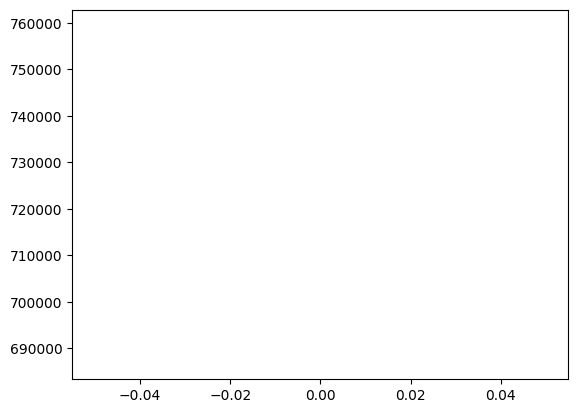

  0%|          | 1/500 [00:00<02:03,  4.05it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney , AUC Score (contextual):  94.21487603305785
Dataset Name:  disney , AUC Score (structural):  59.14373088685016
Dataset Name:  disney , AUC Score (joint-type):  61.15702479338842
Dataset Name:  disney , AUC Score (structure type):  58.71357888949973
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  59.14373088685016
Dataset Name:  disney  Best AUC Score (joint-type):  61.15702479338842
Dataset Name:  disney  Best AUC Score (structure type):  58.71357888949973


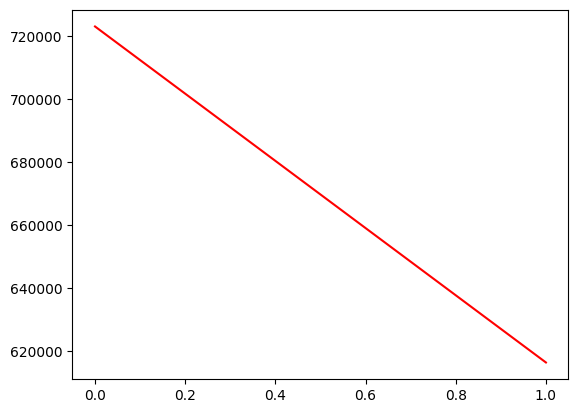

  0%|          | 2/500 [00:00<01:57,  4.24it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.32203389830508
Dataset Name:  disney , AUC Score (contextual):  93.93939393939394
Dataset Name:  disney , AUC Score (structural):  59.38837920489296
Dataset Name:  disney , AUC Score (joint-type):  61.43250688705234
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  59.38837920489296
Dataset Name:  disney  Best AUC Score (joint-type):  61.43250688705234
Dataset Name:  disney  Best AUC Score (structure type):  58.98845519516218


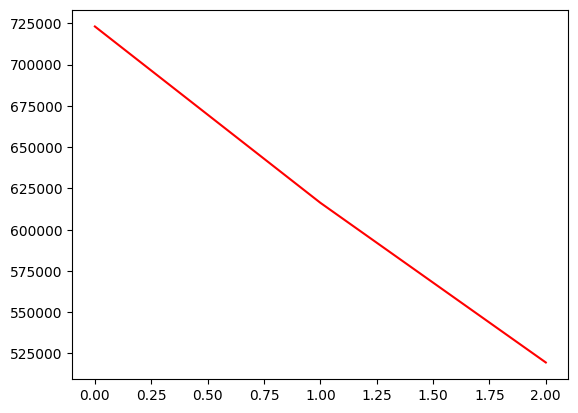

  1%|          | 3/500 [00:00<01:57,  4.23it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.039548022598865
Dataset Name:  disney , AUC Score (contextual):  93.66391184573003
Dataset Name:  disney , AUC Score (structural):  59.32721712538226
Dataset Name:  disney , AUC Score (joint-type):  61.707988980716244
Dataset Name:  disney , AUC Score (structure type):  58.98845519516217
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  59.38837920489296
Dataset Name:  disney  Best AUC Score (joint-type):  61.707988980716244
Dataset Name:  disney  Best AUC Score (structure type):  58.98845519516218


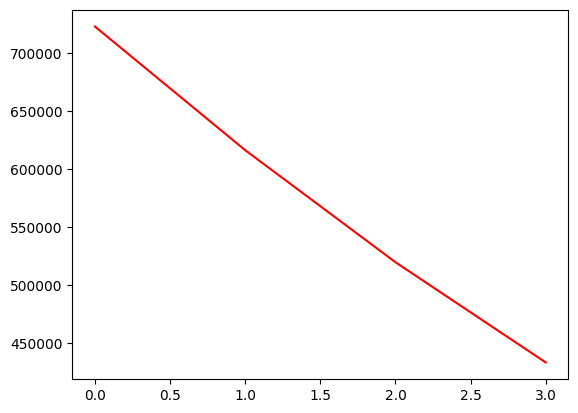

  1%|          | 4/500 [00:00<01:53,  4.37it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.039548022598865
Dataset Name:  disney , AUC Score (contextual):  93.66391184573003
Dataset Name:  disney , AUC Score (structural):  59.32721712538226
Dataset Name:  disney , AUC Score (joint-type):  61.707988980716244
Dataset Name:  disney , AUC Score (structure type):  58.98845519516217
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  59.38837920489296
Dataset Name:  disney  Best AUC Score (joint-type):  61.707988980716244
Dataset Name:  disney  Best AUC Score (structure type):  58.98845519516218


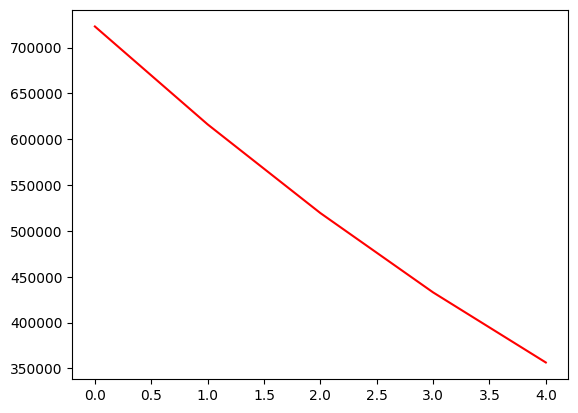

  1%|          | 5/500 [00:01<01:58,  4.18it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.89830508474576
Dataset Name:  disney , AUC Score (contextual):  93.93939393939394
Dataset Name:  disney , AUC Score (structural):  59.38837920489297
Dataset Name:  disney , AUC Score (joint-type):  61.707988980716244
Dataset Name:  disney , AUC Score (structure type):  59.04343045629468
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  59.38837920489297
Dataset Name:  disney  Best AUC Score (joint-type):  61.707988980716244
Dataset Name:  disney  Best AUC Score (structure type):  59.04343045629468


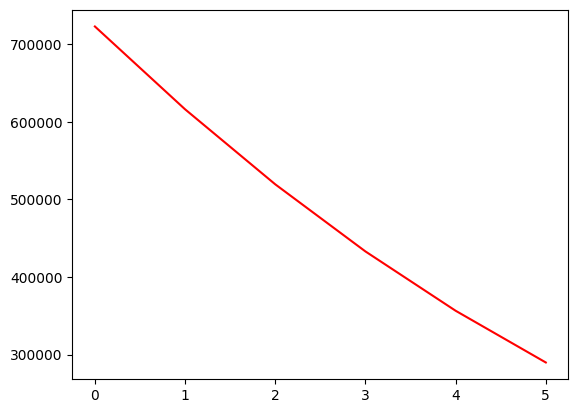

  1%|          | 6/500 [00:01<01:51,  4.42it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.75706214689265
Dataset Name:  disney , AUC Score (contextual):  93.93939393939394
Dataset Name:  disney , AUC Score (structural):  59.449541284403665
Dataset Name:  disney , AUC Score (joint-type):  62.25895316804407
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  59.449541284403665
Dataset Name:  disney  Best AUC Score (joint-type):  62.25895316804407
Dataset Name:  disney  Best AUC Score (structure type):  59.20835623969214


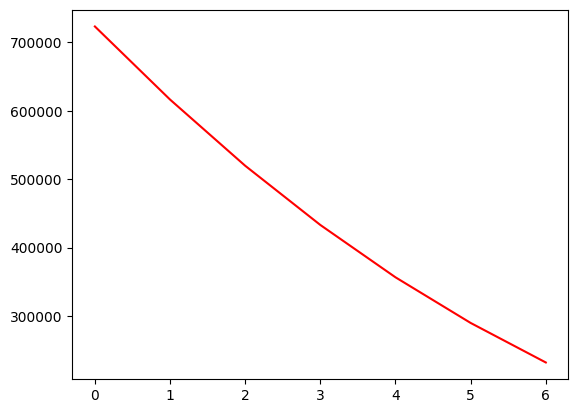

  1%|▏         | 7/500 [00:01<02:33,  3.20it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.75706214689265
Dataset Name:  disney , AUC Score (contextual):  93.38842975206612
Dataset Name:  disney , AUC Score (structural):  60.06116207951071
Dataset Name:  disney , AUC Score (joint-type):  63.08539944903582
Dataset Name:  disney , AUC Score (structure type):  59.923034634414506
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  60.06116207951071
Dataset Name:  disney  Best AUC Score (joint-type):  63.08539944903582
Dataset Name:  disney  Best AUC Score (structure type):  59.923034634414506


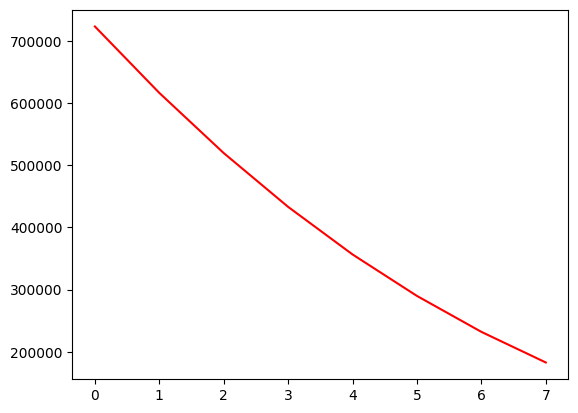

  2%|▏         | 8/500 [00:02<02:17,  3.58it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.75706214689265
Dataset Name:  disney , AUC Score (contextual):  93.38842975206612
Dataset Name:  disney , AUC Score (structural):  60.0611620795107
Dataset Name:  disney , AUC Score (joint-type):  63.91184573002755
Dataset Name:  disney , AUC Score (structure type):  60.08796041781198
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  60.06116207951071
Dataset Name:  disney  Best AUC Score (joint-type):  63.91184573002755
Dataset Name:  disney  Best AUC Score (structure type):  60.08796041781198


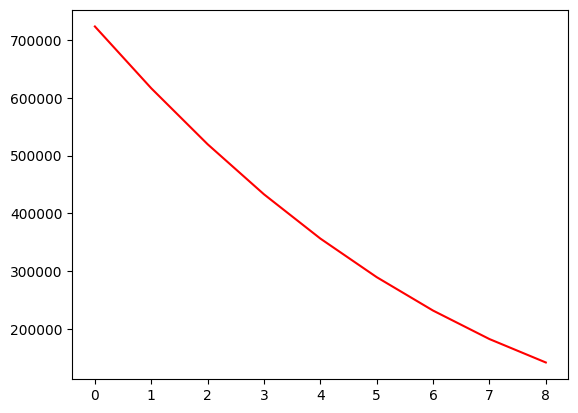

  2%|▏         | 9/500 [00:02<02:01,  4.03it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.33333333333333
Dataset Name:  disney , AUC Score (contextual):  93.38842975206612
Dataset Name:  disney , AUC Score (structural):  60.305810397553515
Dataset Name:  disney , AUC Score (joint-type):  64.73829201101928
Dataset Name:  disney , AUC Score (structure type):  60.472787245739426
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  60.305810397553515
Dataset Name:  disney  Best AUC Score (joint-type):  64.73829201101928
Dataset Name:  disney  Best AUC Score (structure type):  60.472787245739426


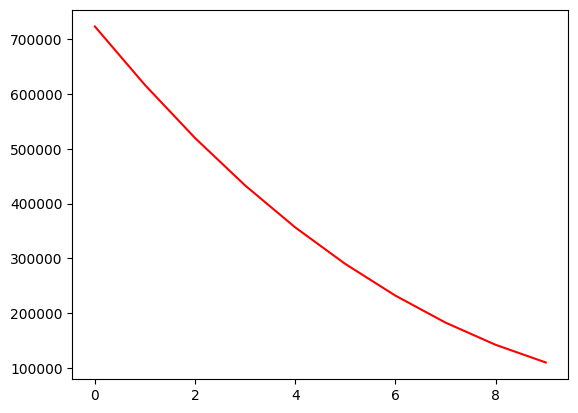

  2%|▏         | 10/500 [00:02<01:48,  4.50it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.75706214689265
Dataset Name:  disney , AUC Score (contextual):  93.66391184573003
Dataset Name:  disney , AUC Score (structural):  60.42813455657492
Dataset Name:  disney , AUC Score (joint-type):  66.39118457300276
Dataset Name:  disney , AUC Score (structure type):  60.912589334799335
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  66.39118457300276
Dataset Name:  disney  Best AUC Score (structure type):  60.912589334799335


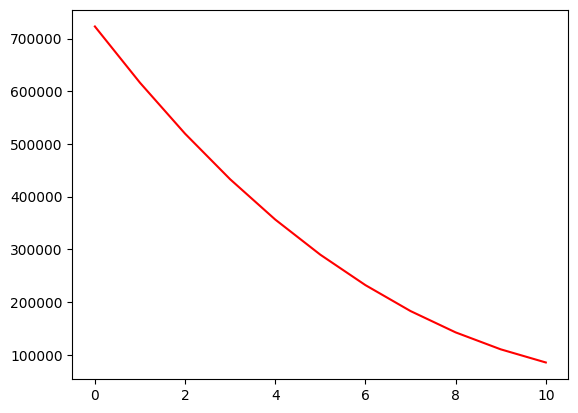

  2%|▏         | 11/500 [00:02<01:44,  4.67it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.03954802259888
Dataset Name:  disney , AUC Score (contextual):  93.1129476584022
Dataset Name:  disney , AUC Score (structural):  60.42813455657492
Dataset Name:  disney , AUC Score (joint-type):  69.6969696969697
Dataset Name:  disney , AUC Score (structure type):  61.57229246838922
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  69.6969696969697
Dataset Name:  disney  Best AUC Score (structure type):  61.57229246838922


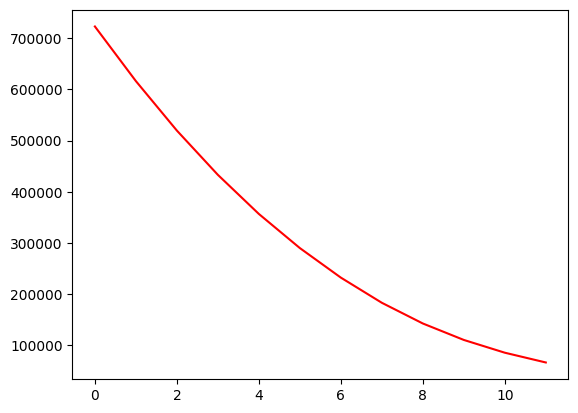

  2%|▏         | 12/500 [00:02<01:41,  4.80it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.75706214689266
Dataset Name:  disney , AUC Score (contextual):  92.83746556473828
Dataset Name:  disney , AUC Score (structural):  60.12232415902141
Dataset Name:  disney , AUC Score (joint-type):  70.79889807162535
Dataset Name:  disney , AUC Score (structure type):  61.46234194612424
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  70.79889807162535
Dataset Name:  disney  Best AUC Score (structure type):  61.57229246838922


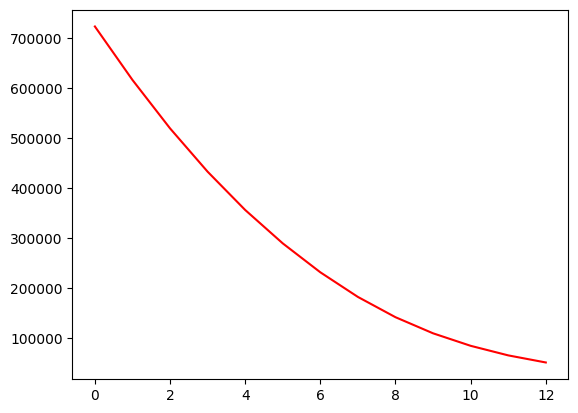

  3%|▎         | 13/500 [00:03<01:41,  4.81it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.33333333333333
Dataset Name:  disney , AUC Score (contextual):  92.56198347107438
Dataset Name:  disney , AUC Score (structural):  60.183486238532105
Dataset Name:  disney , AUC Score (joint-type):  75.48209366391185
Dataset Name:  disney , AUC Score (structure type):  62.341946124244096
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.48209366391185
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


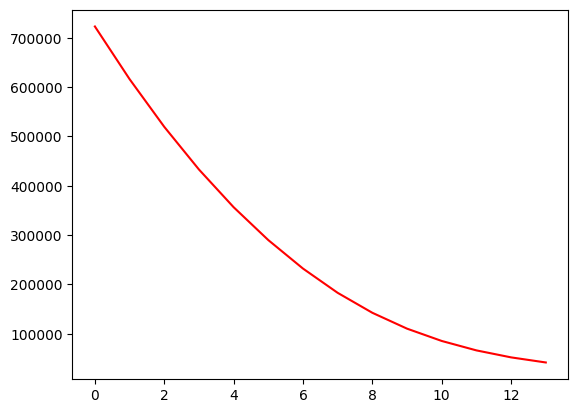

  3%|▎         | 14/500 [00:03<01:51,  4.37it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.18079096045198
Dataset Name:  disney , AUC Score (contextual):  92.28650137741047
Dataset Name:  disney , AUC Score (structural):  59.69418960244648
Dataset Name:  disney , AUC Score (joint-type):  78.23691460055096
Dataset Name:  disney , AUC Score (structure type):  62.231995601979115
Dataset Name:  disney  Best AUC Score(benchmark/combined):  59.46327683615817
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.23691460055096
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


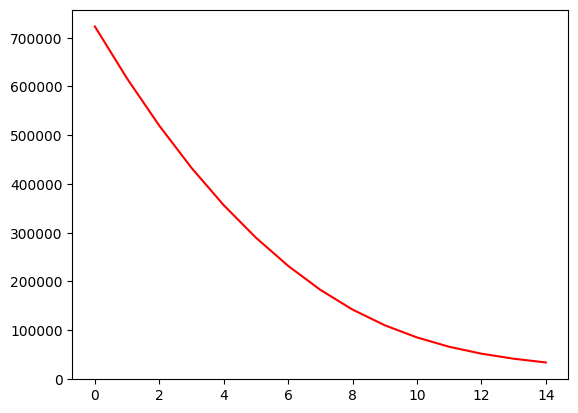

  3%|▎         | 15/500 [00:03<01:58,  4.11it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  61.86440677966102
Dataset Name:  disney , AUC Score (contextual):  92.56198347107438
Dataset Name:  disney , AUC Score (structural):  58.96024464831804
Dataset Name:  disney , AUC Score (joint-type):  79.61432506887051
Dataset Name:  disney , AUC Score (structure type):  61.73721825178669
Dataset Name:  disney  Best AUC Score(benchmark/combined):  61.86440677966102
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  79.61432506887051
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


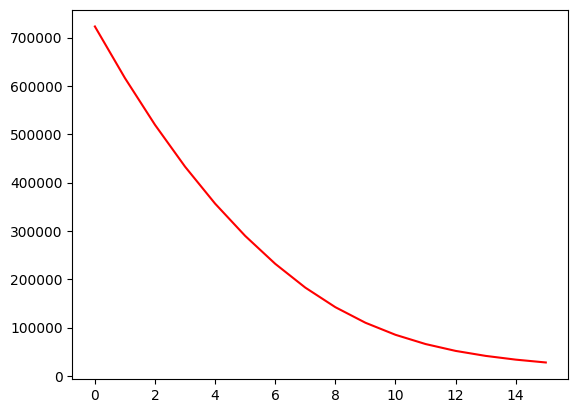

  3%|▎         | 16/500 [00:03<01:59,  4.06it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.4180790960452
Dataset Name:  disney , AUC Score (contextual):  93.1129476584022
Dataset Name:  disney , AUC Score (structural):  57.308868501529055
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  60.747663551401864
Dataset Name:  disney  Best AUC Score(benchmark/combined):  63.4180790960452
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


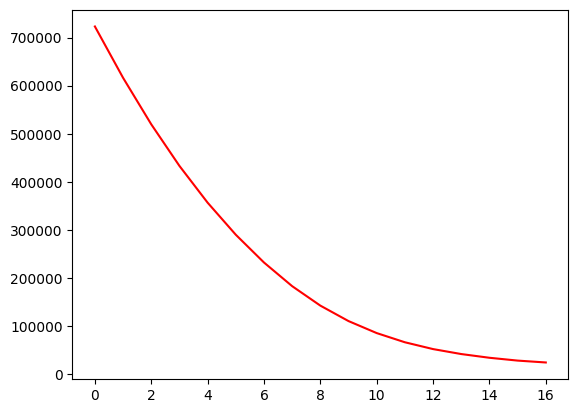

  3%|▎         | 17/500 [00:04<02:00,  4.01it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  64.54802259887005
Dataset Name:  disney , AUC Score (contextual):  93.38842975206612
Dataset Name:  disney , AUC Score (structural):  54.7400611620795
Dataset Name:  disney , AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney , AUC Score (structure type):  58.21880153930731
Dataset Name:  disney  Best AUC Score(benchmark/combined):  64.54802259887005
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305785
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


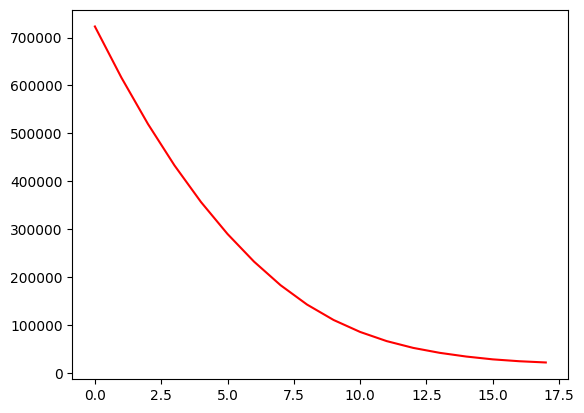

  4%|▎         | 18/500 [00:04<02:00,  4.00it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney , AUC Score (contextual):  94.21487603305786
Dataset Name:  disney , AUC Score (structural):  52.11009174311927
Dataset Name:  disney , AUC Score (joint-type):  79.88980716253444
Dataset Name:  disney , AUC Score (structure type):  55.4150632215503
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  79.88980716253444
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


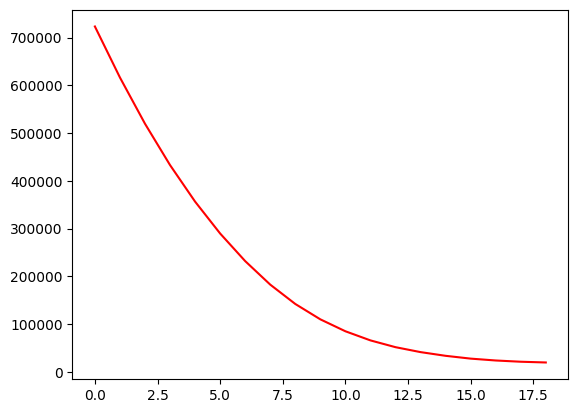

  4%|▍         | 19/500 [00:04<02:07,  3.78it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.13559322033899
Dataset Name:  disney , AUC Score (contextual):  94.21487603305785
Dataset Name:  disney , AUC Score (structural):  49.84709480122325
Dataset Name:  disney , AUC Score (joint-type):  74.3801652892562
Dataset Name:  disney , AUC Score (structure type):  52.226498075865855
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  74.3801652892562
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


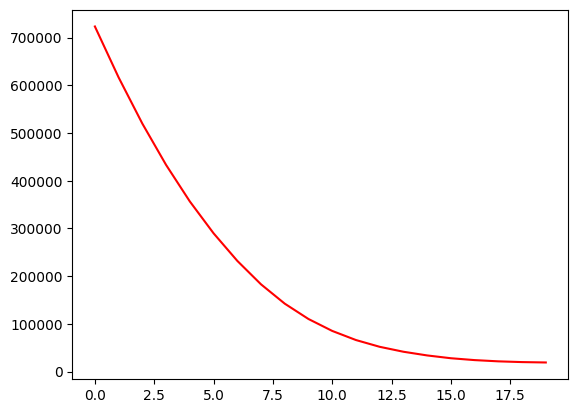

  4%|▍         | 20/500 [00:04<02:07,  3.77it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.005649717514125
Dataset Name:  disney , AUC Score (contextual):  93.1129476584022
Dataset Name:  disney , AUC Score (structural):  48.37920489296636
Dataset Name:  disney , AUC Score (joint-type):  71.07438016528926
Dataset Name:  disney , AUC Score (structure type):  50.357339197361185
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  71.07438016528926
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


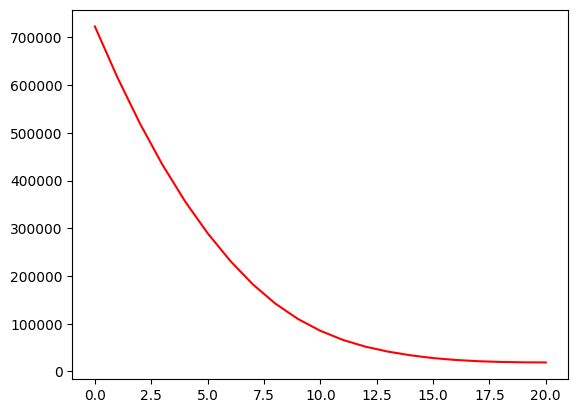

  4%|▍         | 21/500 [00:05<02:12,  3.61it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.005649717514125
Dataset Name:  disney , AUC Score (contextual):  90.08264462809917
Dataset Name:  disney , AUC Score (structural):  47.88990825688074
Dataset Name:  disney , AUC Score (joint-type):  70.52341597796143
Dataset Name:  disney , AUC Score (structure type):  49.697636063771306
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  70.52341597796143
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


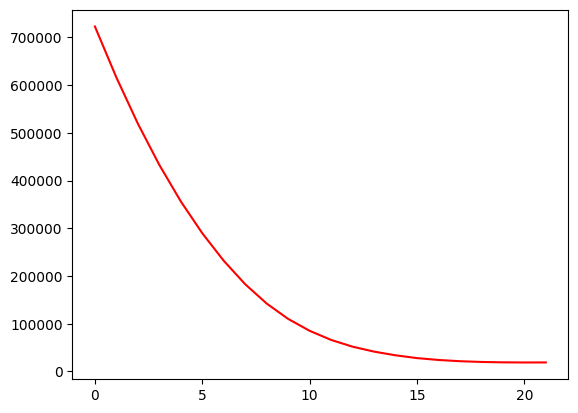

  4%|▍         | 22/500 [00:05<02:12,  3.60it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.71186440677966
Dataset Name:  disney , AUC Score (contextual):  87.87878787878789
Dataset Name:  disney , AUC Score (structural):  47.217125382263
Dataset Name:  disney , AUC Score (joint-type):  69.69696969696969
Dataset Name:  disney , AUC Score (structure type):  48.98295766904893
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  69.69696969696969
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


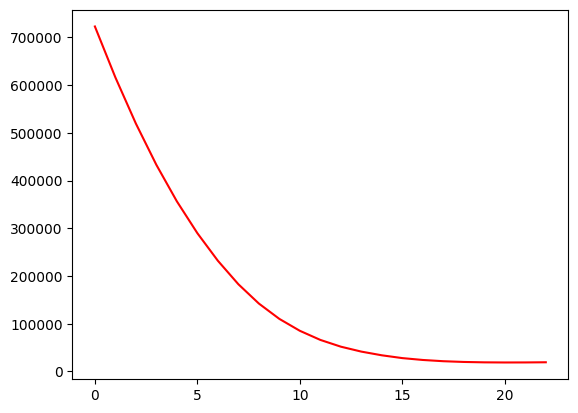

  5%|▍         | 23/500 [00:05<02:13,  3.57it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.28813559322034
Dataset Name:  disney , AUC Score (contextual):  87.32782369146005
Dataset Name:  disney , AUC Score (structural):  47.70642201834862
Dataset Name:  disney , AUC Score (joint-type):  69.42148760330579
Dataset Name:  disney , AUC Score (structure type):  49.42275975810885
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  69.42148760330579
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


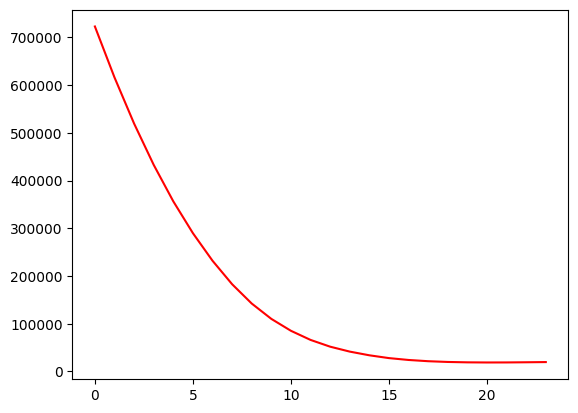

  5%|▍         | 24/500 [00:06<02:07,  3.72it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.27683615819208
Dataset Name:  disney , AUC Score (contextual):  88.98071625344353
Dataset Name:  disney , AUC Score (structural):  48.86850152905198
Dataset Name:  disney , AUC Score (joint-type):  71.34986225895317
Dataset Name:  disney , AUC Score (structure type):  50.90709180868609
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  71.34986225895317
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


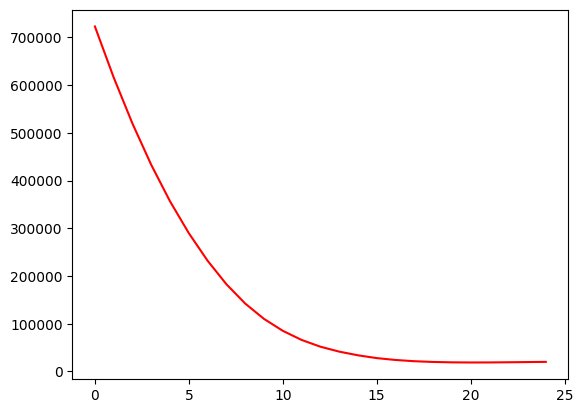

  5%|▌         | 25/500 [00:06<01:57,  4.03it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.85310734463276
Dataset Name:  disney , AUC Score (contextual):  89.25619834710743
Dataset Name:  disney , AUC Score (structural):  49.72477064220183
Dataset Name:  disney , AUC Score (joint-type):  71.07438016528926
Dataset Name:  disney , AUC Score (structure type):  51.676745464540964
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  71.07438016528926
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


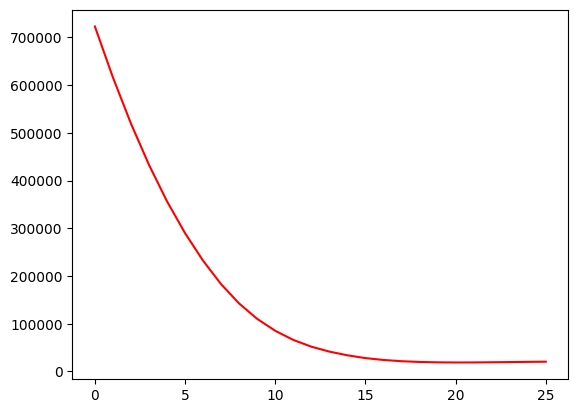

  5%|▌         | 26/500 [00:06<01:51,  4.25it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.57062146892656
Dataset Name:  disney , AUC Score (contextual):  90.633608815427
Dataset Name:  disney , AUC Score (structural):  50.33639143730887
Dataset Name:  disney , AUC Score (joint-type):  71.07438016528927
Dataset Name:  disney , AUC Score (structure type):  52.22649807586587
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  71.07438016528927
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


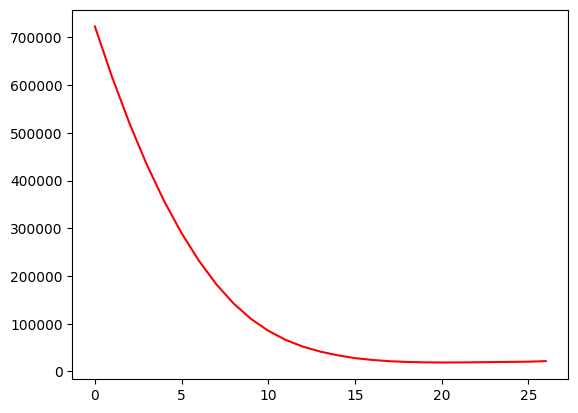

  5%|▌         | 27/500 [00:06<01:42,  4.63it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.14689265536724
Dataset Name:  disney , AUC Score (contextual):  91.18457300275482
Dataset Name:  disney , AUC Score (structural):  50.8868501529052
Dataset Name:  disney , AUC Score (joint-type):  72.45179063360882
Dataset Name:  disney , AUC Score (structure type):  52.99615173172072
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.45179063360882
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


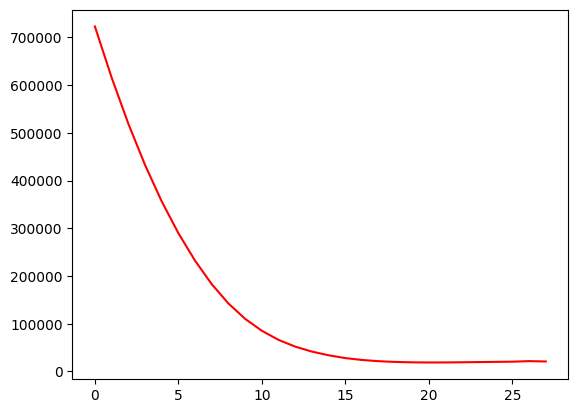

  6%|▌         | 28/500 [00:06<01:35,  4.94it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.42937853107344
Dataset Name:  disney , AUC Score (contextual):  91.73553719008264
Dataset Name:  disney , AUC Score (structural):  51.559633027522935
Dataset Name:  disney , AUC Score (joint-type):  73.00275482093663
Dataset Name:  disney , AUC Score (structure type):  53.7108301264431
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.00275482093663
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


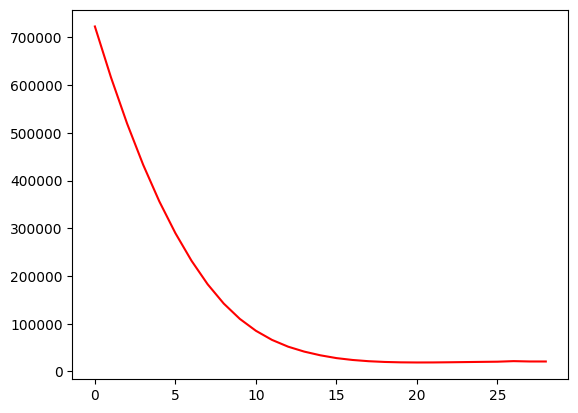

  6%|▌         | 29/500 [00:07<01:47,  4.38it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.994350282485875
Dataset Name:  disney , AUC Score (contextual):  91.73553719008265
Dataset Name:  disney , AUC Score (structural):  51.80428134556574
Dataset Name:  disney , AUC Score (joint-type):  73.00275482093663
Dataset Name:  disney , AUC Score (structure type):  53.93073117097307
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.00275482093663
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


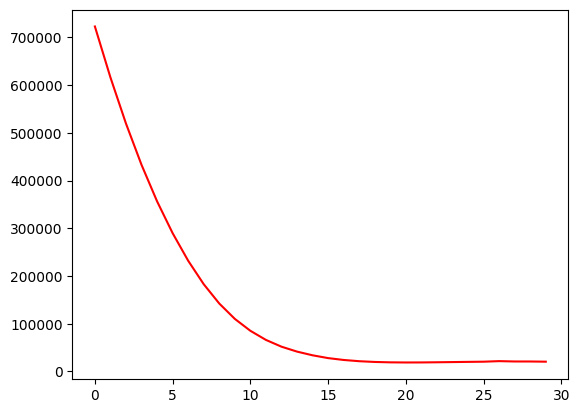

  6%|▌         | 30/500 [00:07<01:55,  4.06it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.994350282485875
Dataset Name:  disney , AUC Score (contextual):  91.73553719008265
Dataset Name:  disney , AUC Score (structural):  51.74311926605504
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney , AUC Score (structure type):  53.82078064870808
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


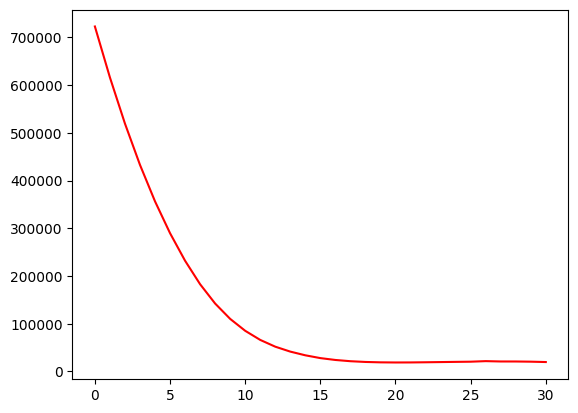

  6%|▌         | 31/500 [00:07<02:01,  3.86it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.85310734463276
Dataset Name:  disney , AUC Score (contextual):  91.73553719008265
Dataset Name:  disney , AUC Score (structural):  51.86544342507645
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney , AUC Score (structure type):  53.93073117097307
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


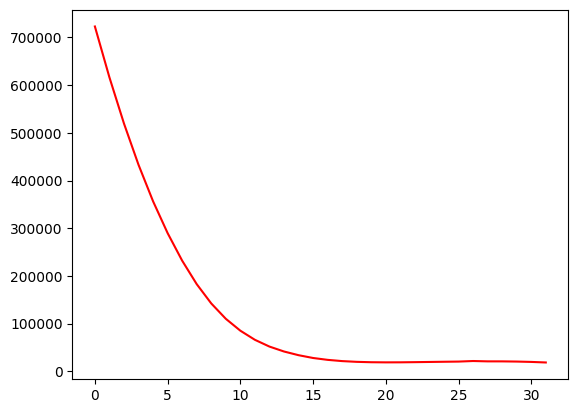

  6%|▋         | 32/500 [00:07<02:04,  3.76it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.57062146892656
Dataset Name:  disney , AUC Score (contextual):  91.46005509641873
Dataset Name:  disney , AUC Score (structural):  51.68195718654434
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney , AUC Score (structure type):  53.7658053875756
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


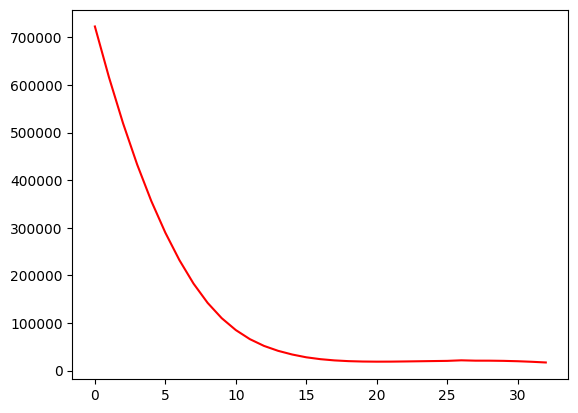

  7%|▋         | 33/500 [00:08<02:07,  3.68it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.42937853107344
Dataset Name:  disney , AUC Score (contextual):  90.633608815427
Dataset Name:  disney , AUC Score (structural):  51.0703363914373
Dataset Name:  disney , AUC Score (joint-type):  72.45179063360882
Dataset Name:  disney , AUC Score (structure type):  53.16107751511821
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.45179063360882
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


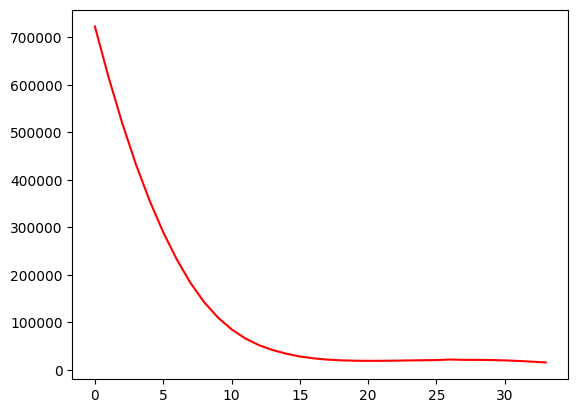

  7%|▋         | 34/500 [00:08<02:04,  3.75it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.27683615819208
Dataset Name:  disney , AUC Score (contextual):  88.98071625344353
Dataset Name:  disney , AUC Score (structural):  50.03058103975535
Dataset Name:  disney , AUC Score (joint-type):  71.34986225895317
Dataset Name:  disney , AUC Score (structure type):  52.0065970313359
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  71.34986225895317
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


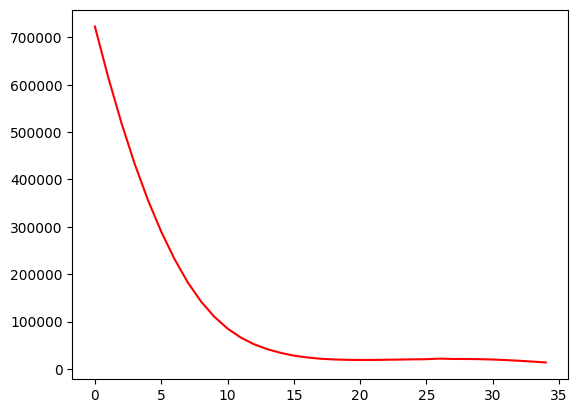

  7%|▋         | 35/500 [00:08<01:51,  4.16it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.700564971751405
Dataset Name:  disney , AUC Score (contextual):  86.50137741046832
Dataset Name:  disney , AUC Score (structural):  48.74617737003058
Dataset Name:  disney , AUC Score (joint-type):  71.900826446281
Dataset Name:  disney , AUC Score (structure type):  50.79714128642112
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  71.900826446281
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


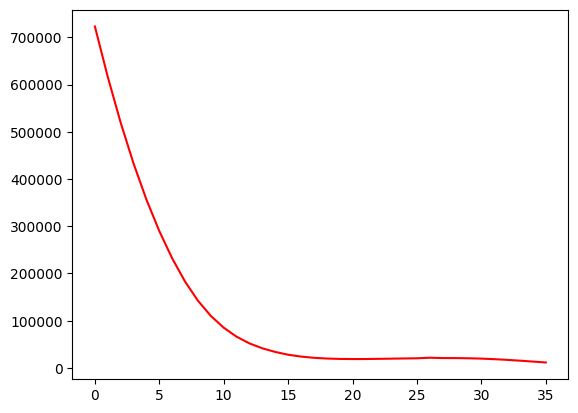

  7%|▋         | 36/500 [00:08<01:54,  4.06it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.4180790960452
Dataset Name:  disney , AUC Score (contextual):  82.36914600550963
Dataset Name:  disney , AUC Score (structural):  46.42201834862385
Dataset Name:  disney , AUC Score (joint-type):  69.14600550964187
Dataset Name:  disney , AUC Score (structure type):  48.15832875206157
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  69.14600550964187
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


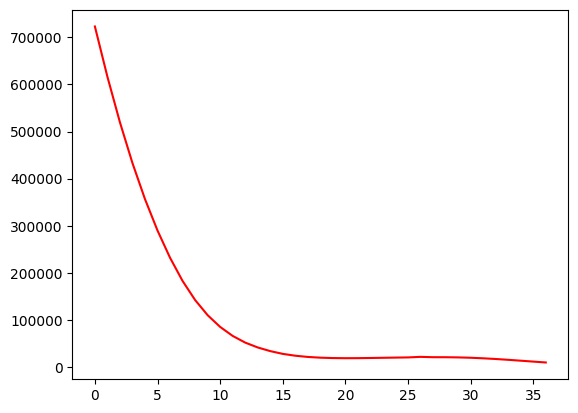

  7%|▋         | 37/500 [00:09<01:52,  4.12it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.700564971751405
Dataset Name:  disney , AUC Score (contextual):  76.85950413223141
Dataset Name:  disney , AUC Score (structural):  44.58715596330275
Dataset Name:  disney , AUC Score (joint-type):  70.24793388429754
Dataset Name:  disney , AUC Score (structure type):  46.61902144035185
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  70.24793388429754
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


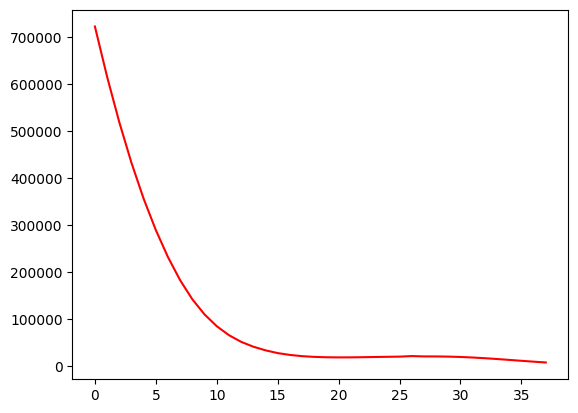

  8%|▊         | 38/500 [00:09<01:44,  4.41it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  64.12429378531074
Dataset Name:  disney , AUC Score (contextual):  75.75757575757575
Dataset Name:  disney , AUC Score (structural):  44.03669724770643
Dataset Name:  disney , AUC Score (joint-type):  70.24793388429752
Dataset Name:  disney , AUC Score (structure type):  46.01429356789445
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  70.24793388429752
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


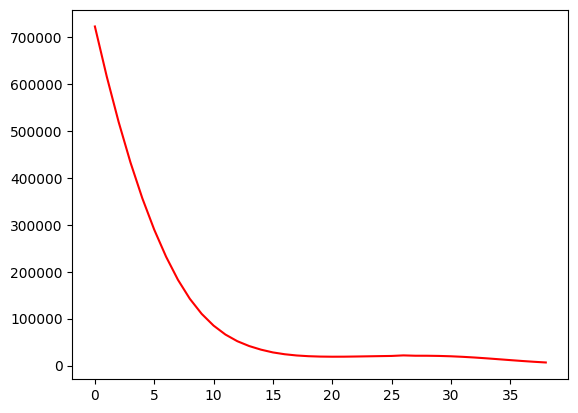

  8%|▊         | 39/500 [00:09<01:43,  4.45it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  64.97175141242938
Dataset Name:  disney , AUC Score (contextual):  74.3801652892562
Dataset Name:  disney , AUC Score (structural):  45.4434250764526
Dataset Name:  disney , AUC Score (joint-type):  69.9724517906336
Dataset Name:  disney , AUC Score (structure type):  47.00384826827928
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  69.9724517906336
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


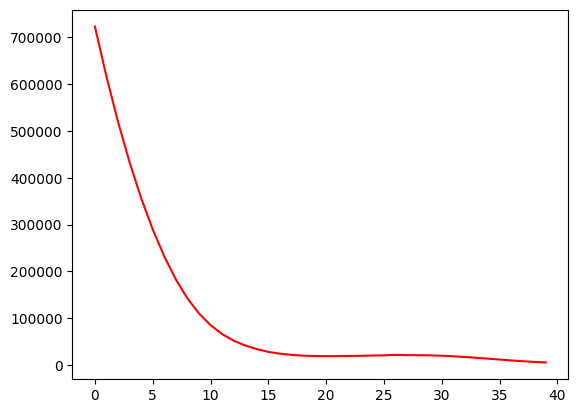

  8%|▊         | 40/500 [00:09<01:41,  4.54it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.2542372881356
Dataset Name:  disney , AUC Score (contextual):  72.17630853994491
Dataset Name:  disney , AUC Score (structural):  46.850152905198776
Dataset Name:  disney , AUC Score (joint-type):  71.07438016528926
Dataset Name:  disney , AUC Score (structure type):  48.26827927432656
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  71.07438016528926
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


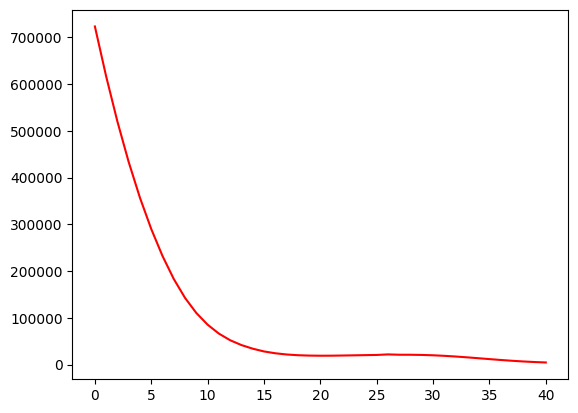

  8%|▊         | 41/500 [00:09<01:40,  4.56it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.559322033898304
Dataset Name:  disney , AUC Score (contextual):  74.3801652892562
Dataset Name:  disney , AUC Score (structural):  49.0519877675841
Dataset Name:  disney , AUC Score (joint-type):  71.34986225895315
Dataset Name:  disney , AUC Score (structure type):  50.19241341396372
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  71.34986225895315
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


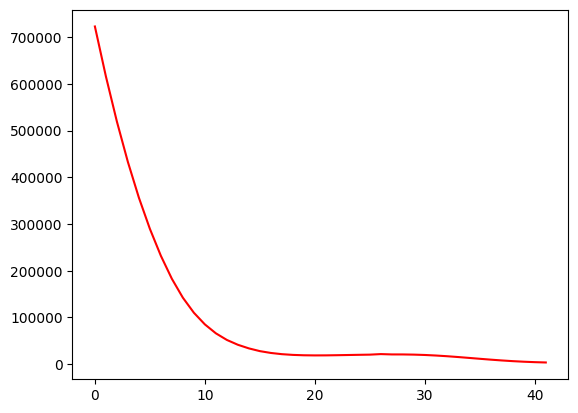

  8%|▊         | 42/500 [00:10<01:49,  4.18it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  60.31073446327684
Dataset Name:  disney , AUC Score (contextual):  73.27823691460054
Dataset Name:  disney , AUC Score (structural):  50.58103975535169
Dataset Name:  disney , AUC Score (joint-type):  71.90082644628099
Dataset Name:  disney , AUC Score (structure type):  51.676745464540964
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  71.90082644628099
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


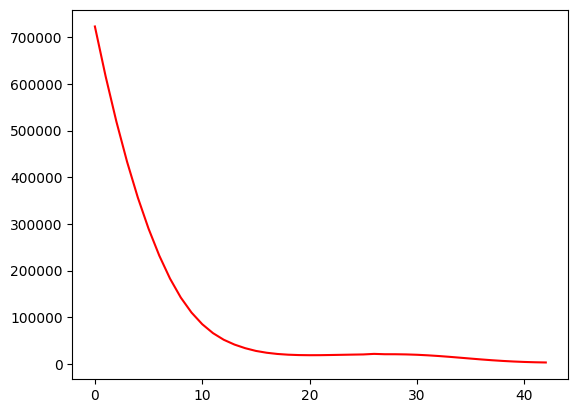

  9%|▊         | 43/500 [00:10<01:55,  3.95it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  60.31073446327684
Dataset Name:  disney , AUC Score (contextual):  73.00275482093664
Dataset Name:  disney , AUC Score (structural):  51.620795107033636
Dataset Name:  disney , AUC Score (joint-type):  73.82920110192838
Dataset Name:  disney , AUC Score (structure type):  53.16107751511821
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.82920110192838
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


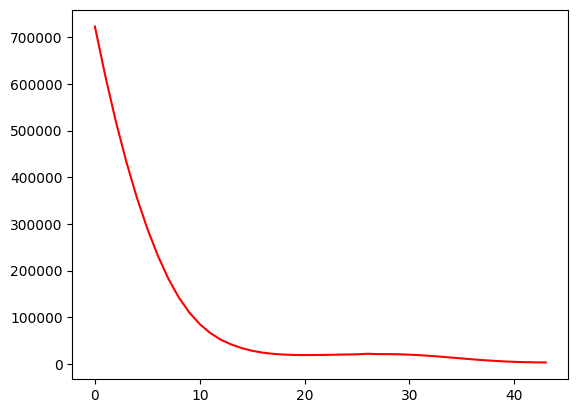

  9%|▉         | 44/500 [00:10<01:54,  3.97it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  60.02824858757062
Dataset Name:  disney , AUC Score (contextual):  72.1763085399449
Dataset Name:  disney , AUC Score (structural):  52.90519877675841
Dataset Name:  disney , AUC Score (joint-type):  77.1349862258953
Dataset Name:  disney , AUC Score (structure type):  55.03023639362288
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  77.1349862258953
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


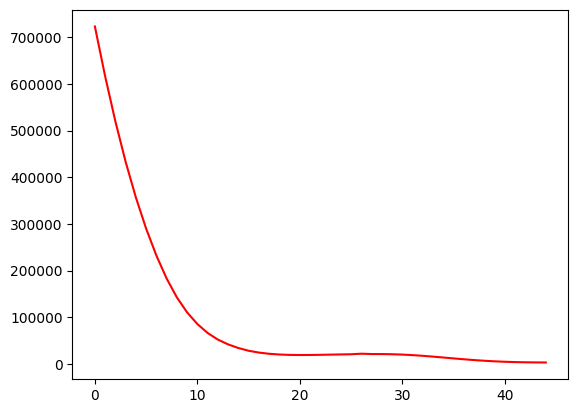

  9%|▉         | 45/500 [00:10<01:48,  4.19it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  61.72316384180792
Dataset Name:  disney , AUC Score (contextual):  73.27823691460054
Dataset Name:  disney , AUC Score (structural):  55.16819571865443
Dataset Name:  disney , AUC Score (joint-type):  81.26721763085399
Dataset Name:  disney , AUC Score (structure type):  57.94392523364487
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.26721763085399
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


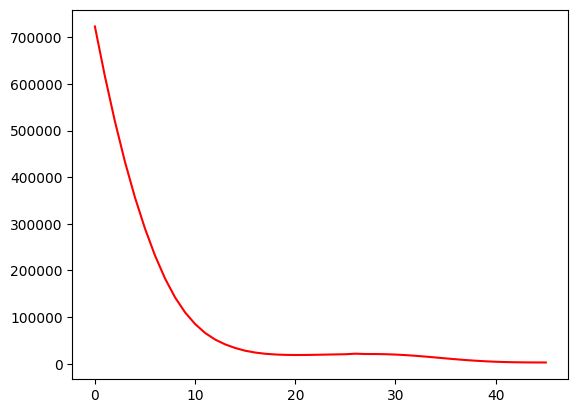

  9%|▉         | 46/500 [00:11<01:42,  4.41it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  60.59322033898306
Dataset Name:  disney , AUC Score (contextual):  76.5840220385675
Dataset Name:  disney , AUC Score (structural):  55.96330275229357
Dataset Name:  disney , AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney , AUC Score (structure type):  58.87850467289719
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


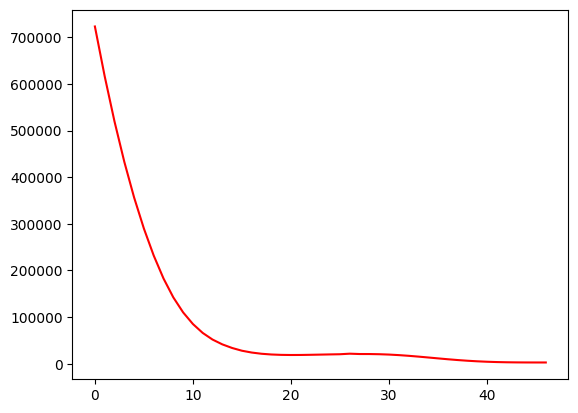

  9%|▉         | 47/500 [00:11<01:45,  4.31it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  60.451977401129945
Dataset Name:  disney , AUC Score (contextual):  79.61432506887051
Dataset Name:  disney , AUC Score (structural):  57.064220183486235
Dataset Name:  disney , AUC Score (joint-type):  82.09366391184574
Dataset Name:  disney , AUC Score (structure type):  60.19791094007696
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.09366391184574
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


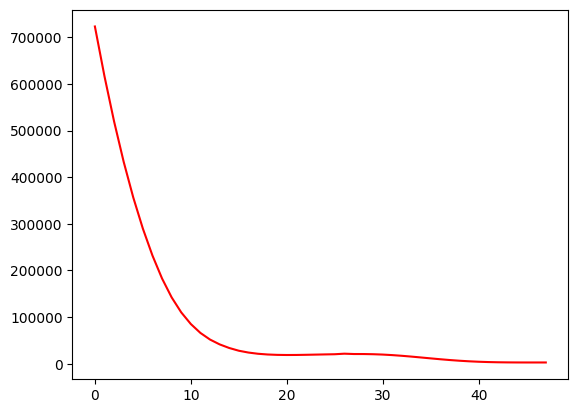

 10%|▉         | 48/500 [00:11<01:36,  4.68it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.18079096045198
Dataset Name:  disney , AUC Score (contextual):  80.99173553719008
Dataset Name:  disney , AUC Score (structural):  58.532110091743114
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  61.79219351291919
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


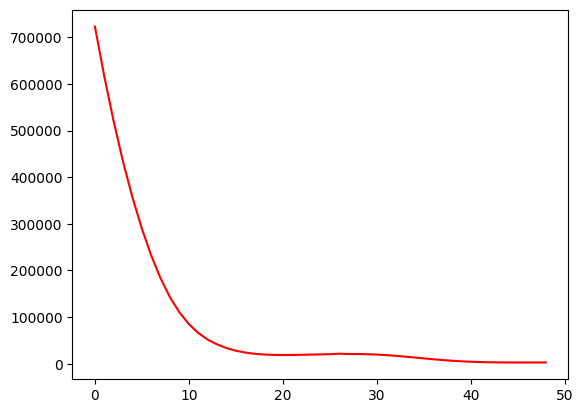

 10%|▉         | 49/500 [00:11<01:46,  4.23it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.61581920903956
Dataset Name:  disney , AUC Score (contextual):  82.92011019283746
Dataset Name:  disney , AUC Score (structural):  58.776758409785934
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  61.90214403518417
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


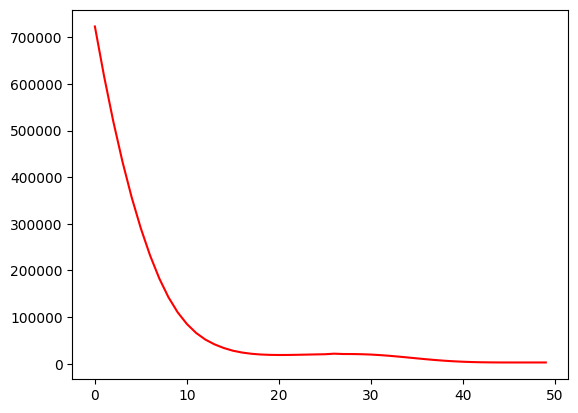

 10%|█         | 50/500 [00:12<01:37,  4.60it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.03954802259888
Dataset Name:  disney , AUC Score (contextual):  84.57300275482093
Dataset Name:  disney , AUC Score (structural):  58.96024464831804
Dataset Name:  disney , AUC Score (joint-type):  80.99173553719008
Dataset Name:  disney , AUC Score (structure type):  61.792193512919184
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.99173553719008
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


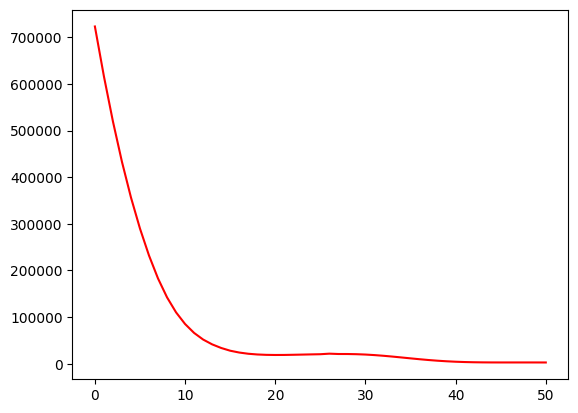

 10%|█         | 51/500 [00:12<01:35,  4.72it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.47457627118644
Dataset Name:  disney , AUC Score (contextual):  86.2258953168044
Dataset Name:  disney , AUC Score (structural):  59.021406727828754
Dataset Name:  disney , AUC Score (joint-type):  81.26721763085398
Dataset Name:  disney , AUC Score (structure type):  61.90214403518417
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.26721763085398
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


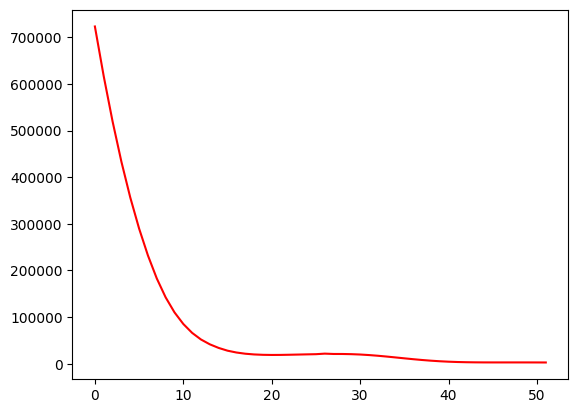

 10%|█         | 52/500 [00:12<01:38,  4.55it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.7683615819209
Dataset Name:  disney , AUC Score (contextual):  86.77685950413223
Dataset Name:  disney , AUC Score (structural):  59.26605504587156
Dataset Name:  disney , AUC Score (joint-type):  81.26721763085398
Dataset Name:  disney , AUC Score (structure type):  62.12204507971413
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.26721763085398
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


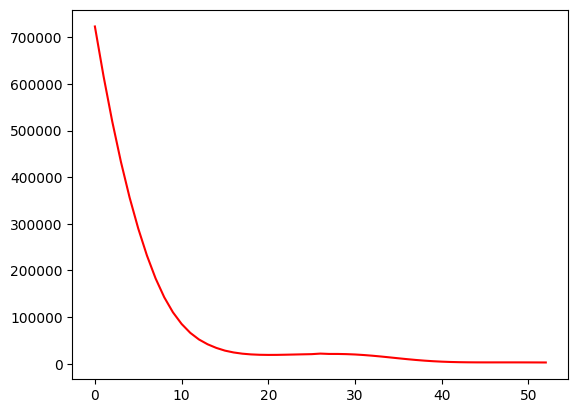

 11%|█         | 53/500 [00:12<01:32,  4.86it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.20338983050846
Dataset Name:  disney , AUC Score (contextual):  87.32782369146005
Dataset Name:  disney , AUC Score (structural):  59.510703363914374
Dataset Name:  disney , AUC Score (joint-type):  81.26721763085398
Dataset Name:  disney , AUC Score (structure type):  62.34194612424409
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.26721763085398
Dataset Name:  disney  Best AUC Score (structure type):  62.341946124244096


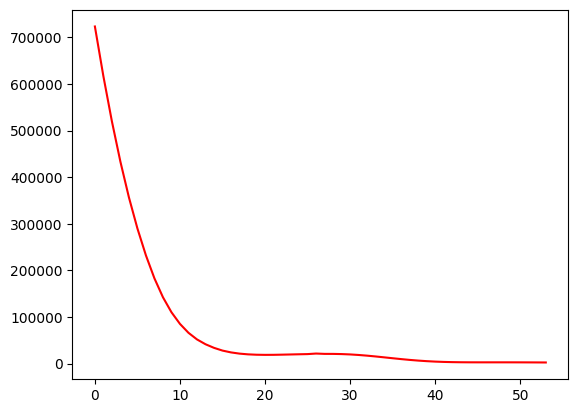

 11%|█         | 54/500 [00:12<01:42,  4.35it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.34463276836158
Dataset Name:  disney , AUC Score (contextual):  88.15426997245179
Dataset Name:  disney , AUC Score (structural):  59.999999999999986
Dataset Name:  disney , AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney , AUC Score (structure type):  62.616822429906534
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


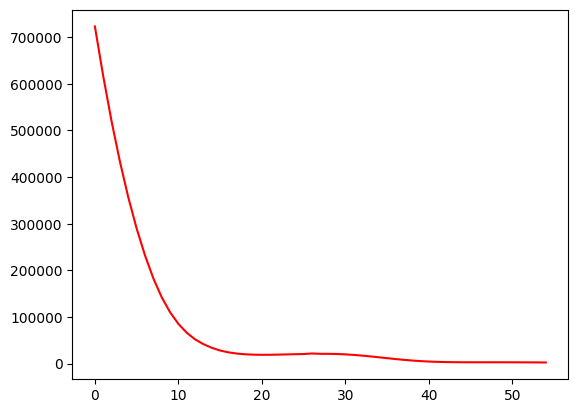

 11%|█         | 55/500 [00:13<01:53,  3.94it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.20338983050848
Dataset Name:  disney , AUC Score (contextual):  88.15426997245179
Dataset Name:  disney , AUC Score (structural):  59.81651376146788
Dataset Name:  disney , AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney , AUC Score (structure type):  62.45189664650908
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


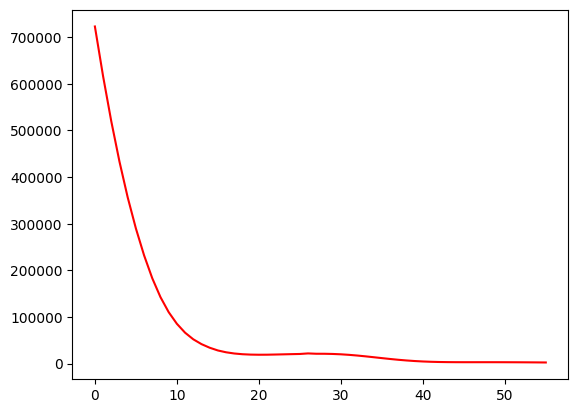

 11%|█         | 56/500 [00:13<01:54,  3.88it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.20338983050848
Dataset Name:  disney , AUC Score (contextual):  88.15426997245179
Dataset Name:  disney , AUC Score (structural):  59.8776758409786
Dataset Name:  disney , AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney , AUC Score (structure type):  62.50687190764156
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


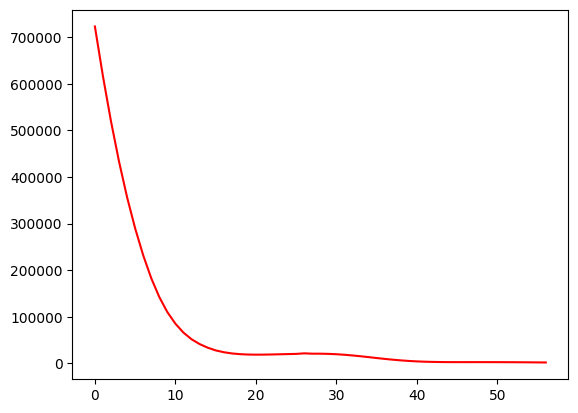

 11%|█▏        | 57/500 [00:13<01:43,  4.30it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.6271186440678
Dataset Name:  disney , AUC Score (contextual):  87.87878787878786
Dataset Name:  disney , AUC Score (structural):  59.69418960244648
Dataset Name:  disney , AUC Score (joint-type):  80.16528925619834
Dataset Name:  disney , AUC Score (structure type):  62.2869708631116
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.16528925619834
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


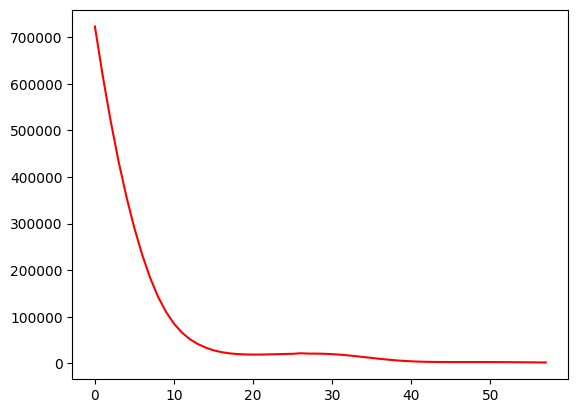

 12%|█▏        | 58/500 [00:14<02:05,  3.52it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.6271186440678
Dataset Name:  disney , AUC Score (contextual):  87.05234159779614
Dataset Name:  disney , AUC Score (structural):  59.38837920489297
Dataset Name:  disney , AUC Score (joint-type):  80.99173553719008
Dataset Name:  disney , AUC Score (structure type):  62.177020340846624
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.99173553719008
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


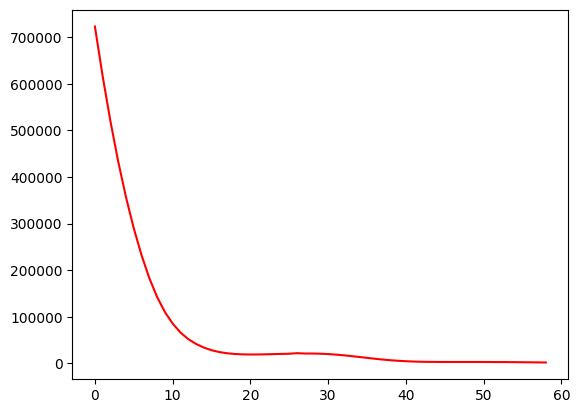

 12%|█▏        | 59/500 [00:14<01:55,  3.81it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.48587570621469
Dataset Name:  disney , AUC Score (contextual):  85.12396694214875
Dataset Name:  disney , AUC Score (structural):  59.63302752293578
Dataset Name:  disney , AUC Score (joint-type):  80.71625344352617
Dataset Name:  disney , AUC Score (structure type):  62.34194612424409
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.71625344352617
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


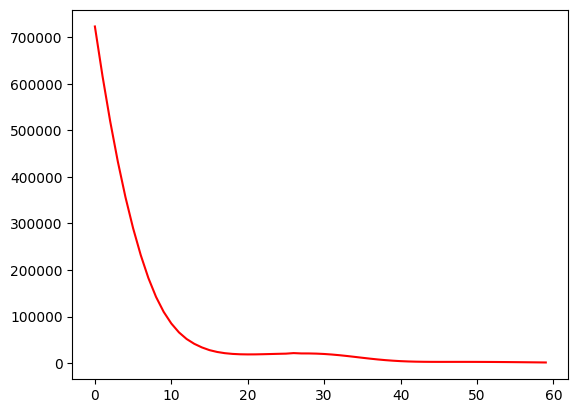

 12%|█▏        | 60/500 [00:14<01:48,  4.07it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.6271186440678
Dataset Name:  disney , AUC Score (contextual):  83.19559228650138
Dataset Name:  disney , AUC Score (structural):  59.81651376146788
Dataset Name:  disney , AUC Score (joint-type):  79.88980716253444
Dataset Name:  disney , AUC Score (structure type):  62.34194612424409
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  79.88980716253444
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


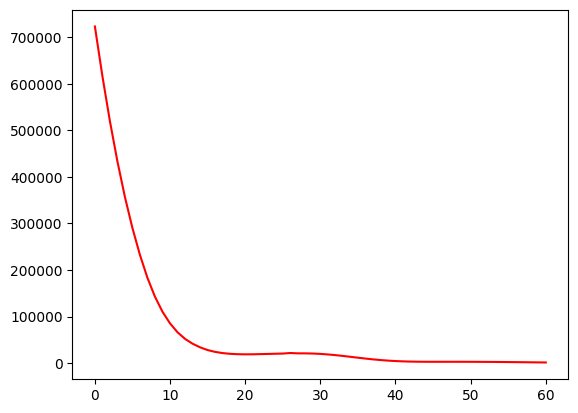

 12%|█▏        | 61/500 [00:14<01:43,  4.24it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.90960451977401
Dataset Name:  disney , AUC Score (contextual):  81.5426997245179
Dataset Name:  disney , AUC Score (structural):  59.69418960244648
Dataset Name:  disney , AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney , AUC Score (structure type):  62.2869708631116
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


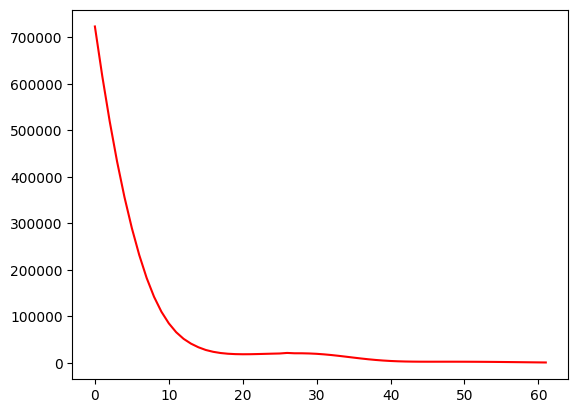

 12%|█▏        | 62/500 [00:14<01:37,  4.50it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.03954802259888
Dataset Name:  disney , AUC Score (contextual):  79.33884297520662
Dataset Name:  disney , AUC Score (structural):  58.96024464831804
Dataset Name:  disney , AUC Score (joint-type):  80.99173553719008
Dataset Name:  disney , AUC Score (structure type):  61.6822429906542
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.99173553719008
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


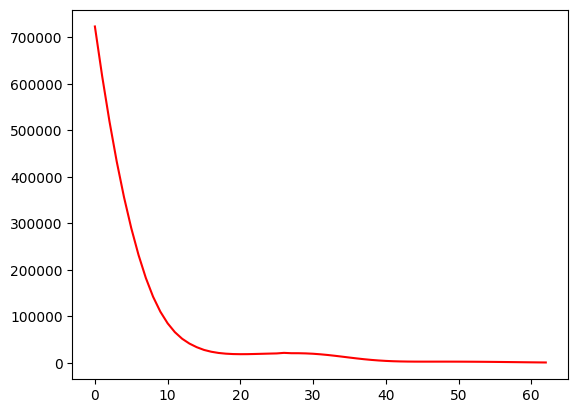

 13%|█▎        | 63/500 [00:15<01:40,  4.34it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.32203389830508
Dataset Name:  disney , AUC Score (contextual):  76.5840220385675
Dataset Name:  disney , AUC Score (structural):  57.79816513761467
Dataset Name:  disney , AUC Score (joint-type):  80.44077134986227
Dataset Name:  disney , AUC Score (structure type):  60.52776250687191
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.44077134986227
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


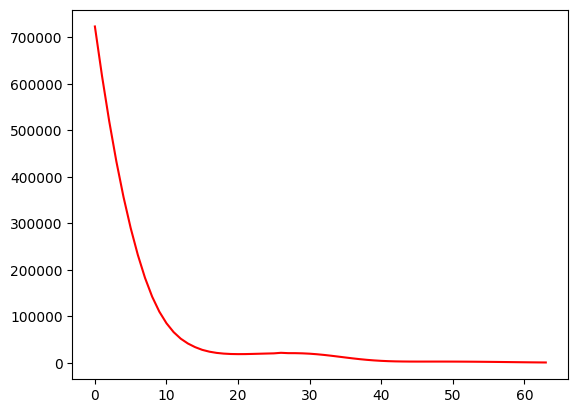

 13%|█▎        | 64/500 [00:15<01:39,  4.37it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.61581920903956
Dataset Name:  disney , AUC Score (contextual):  73.82920110192836
Dataset Name:  disney , AUC Score (structural):  57.18654434250765
Dataset Name:  disney , AUC Score (joint-type):  78.23691460055096
Dataset Name:  disney , AUC Score (structure type):  59.4282572842221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.23691460055096
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


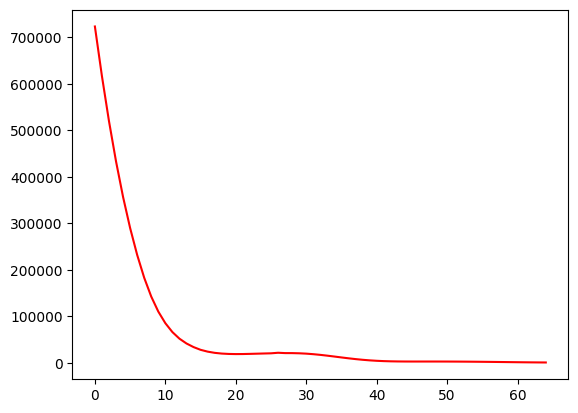

 13%|█▎        | 65/500 [00:15<01:48,  4.02it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.61581920903956
Dataset Name:  disney , AUC Score (contextual):  70.24793388429752
Dataset Name:  disney , AUC Score (structural):  56.146788990825684
Dataset Name:  disney , AUC Score (joint-type):  77.68595041322314
Dataset Name:  disney , AUC Score (structure type):  58.108851017042326
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  77.68595041322314
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


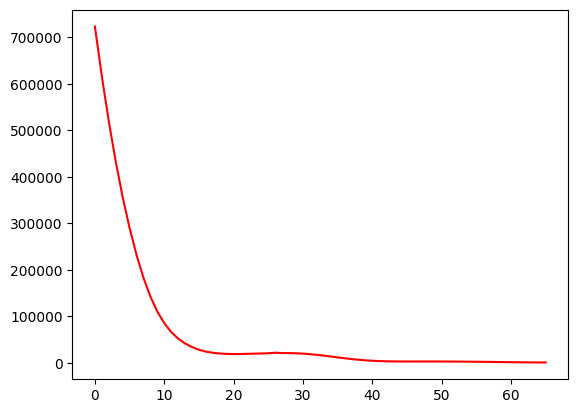

 13%|█▎        | 66/500 [00:15<01:45,  4.12it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.47457627118644
Dataset Name:  disney , AUC Score (contextual):  69.14600550964187
Dataset Name:  disney , AUC Score (structural):  55.41284403669724
Dataset Name:  disney , AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney , AUC Score (structure type):  57.06432105552501
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


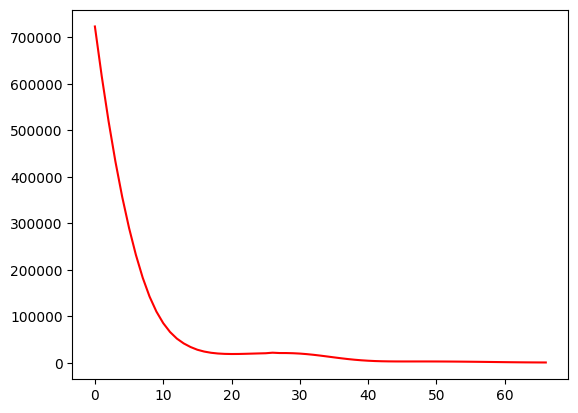

 13%|█▎        | 67/500 [00:16<01:37,  4.45it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.34463276836158
Dataset Name:  disney , AUC Score (contextual):  66.94214876033058
Dataset Name:  disney , AUC Score (structural):  54.006116207951074
Dataset Name:  disney , AUC Score (joint-type):  74.93112947658402
Dataset Name:  disney , AUC Score (structure type):  55.4150632215503
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  74.93112947658402
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


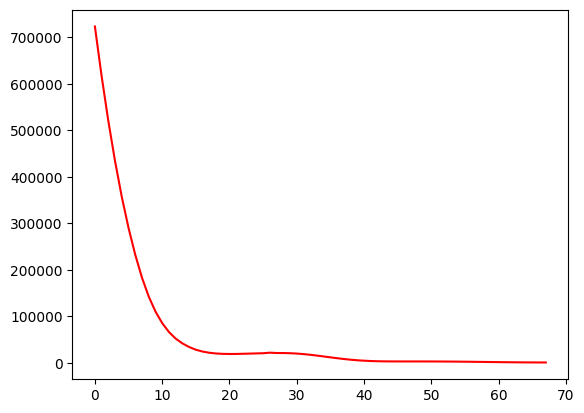

 14%|█▎        | 68/500 [00:16<01:31,  4.72it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  53.813559322033896
Dataset Name:  disney , AUC Score (contextual):  64.18732782369145
Dataset Name:  disney , AUC Score (structural):  52.53822629969419
Dataset Name:  disney , AUC Score (joint-type):  70.24793388429752
Dataset Name:  disney , AUC Score (structure type):  53.16107751511821
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  70.24793388429752
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


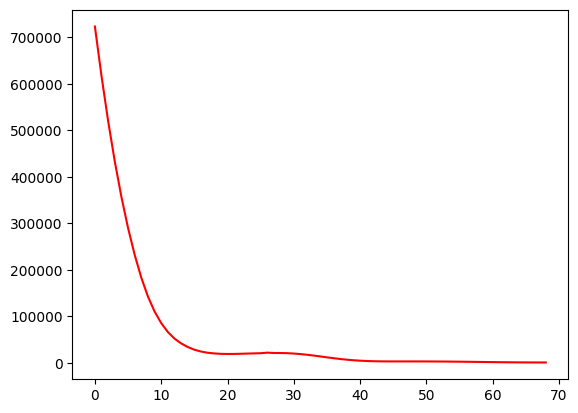

 14%|█▍        | 69/500 [00:16<01:27,  4.90it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.68361581920904
Dataset Name:  disney , AUC Score (contextual):  61.43250688705234
Dataset Name:  disney , AUC Score (structural):  51.559633027522935
Dataset Name:  disney , AUC Score (joint-type):  68.87052341597796
Dataset Name:  disney , AUC Score (structure type):  51.89664650907093
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  68.87052341597796
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


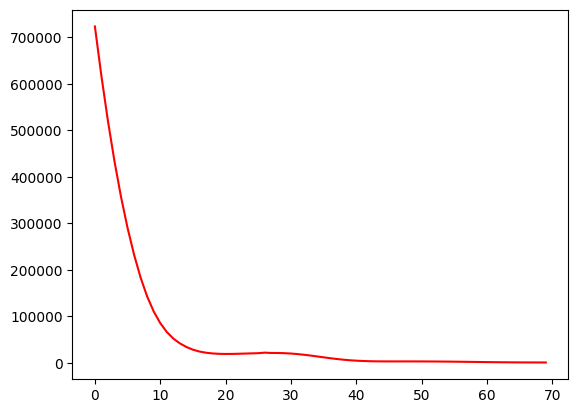

 14%|█▍        | 70/500 [00:16<01:29,  4.83it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.40112994350282
Dataset Name:  disney , AUC Score (contextual):  58.1267217630854
Dataset Name:  disney , AUC Score (structural):  50.9480122324159
Dataset Name:  disney , AUC Score (joint-type):  68.04407713498622
Dataset Name:  disney , AUC Score (structure type):  51.12699285321606
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  68.04407713498622
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


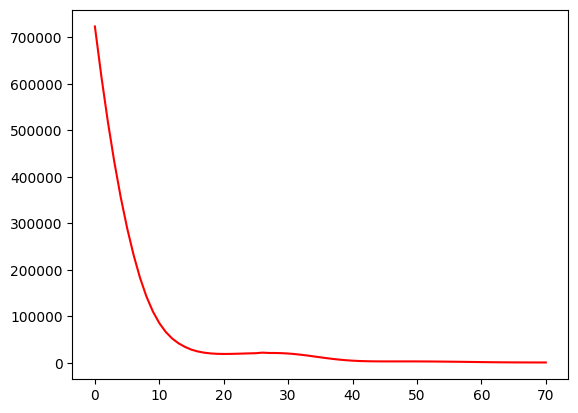

 14%|█▍        | 71/500 [00:16<01:30,  4.76it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.54237288135594
Dataset Name:  disney , AUC Score (contextual):  57.57575757575757
Dataset Name:  disney , AUC Score (structural):  51.00917431192661
Dataset Name:  disney , AUC Score (joint-type):  68.04407713498622
Dataset Name:  disney , AUC Score (structure type):  51.18196811434854
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  68.04407713498622
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


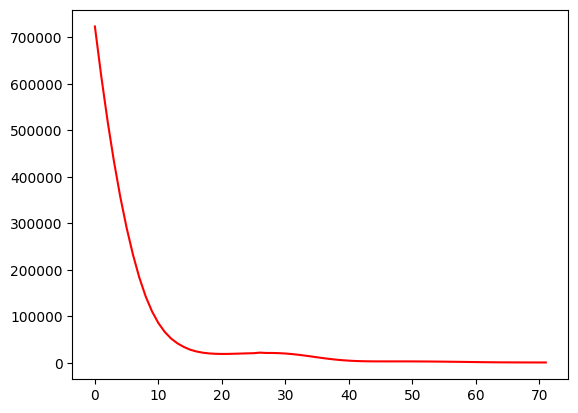

 14%|█▍        | 72/500 [00:17<01:34,  4.51it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.542372881355924
Dataset Name:  disney , AUC Score (contextual):  52.61707988980716
Dataset Name:  disney , AUC Score (structural):  49.847094801223236
Dataset Name:  disney , AUC Score (joint-type):  67.21763085399449
Dataset Name:  disney , AUC Score (structure type):  49.97251236943375
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  67.21763085399449
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


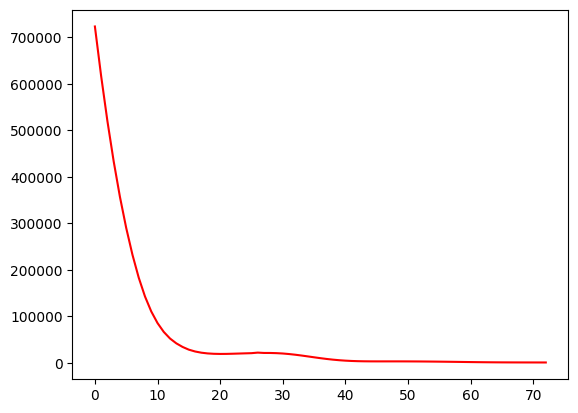

 15%|█▍        | 73/500 [00:17<01:37,  4.37it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.68361581920904
Dataset Name:  disney , AUC Score (contextual):  46.5564738292011
Dataset Name:  disney , AUC Score (structural):  48.74617737003057
Dataset Name:  disney , AUC Score (joint-type):  66.94214876033058
Dataset Name:  disney , AUC Score (structure type):  48.98295766904893
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  66.94214876033058
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


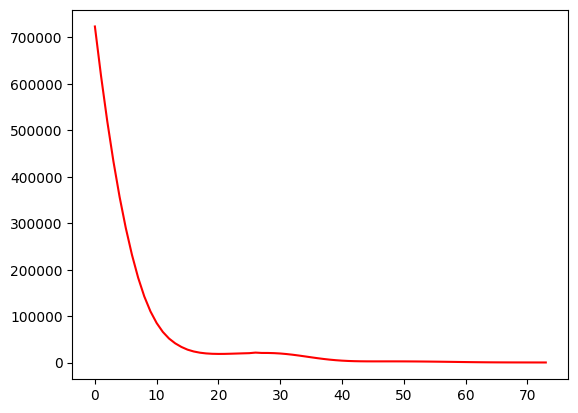

 15%|█▍        | 74/500 [00:17<01:36,  4.40it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.40112994350282
Dataset Name:  disney , AUC Score (contextual):  42.69972451790634
Dataset Name:  disney , AUC Score (structural):  47.95107033639143
Dataset Name:  disney , AUC Score (joint-type):  66.66666666666666
Dataset Name:  disney , AUC Score (structure type):  48.21330401319407
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  66.66666666666666
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


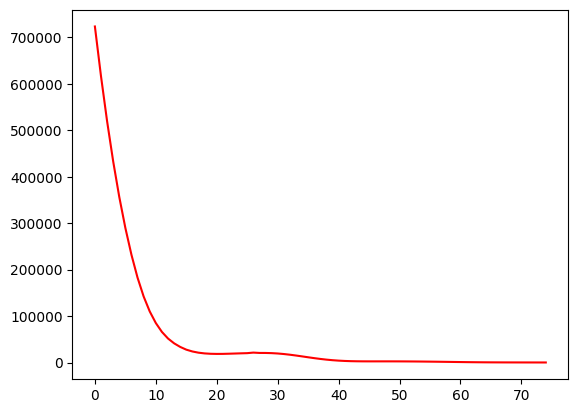

 15%|█▌        | 75/500 [00:17<01:45,  4.01it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.542372881355924
Dataset Name:  disney , AUC Score (contextual):  40.77134986225895
Dataset Name:  disney , AUC Score (structural):  47.21712538226299
Dataset Name:  disney , AUC Score (joint-type):  66.66666666666666
Dataset Name:  disney , AUC Score (structure type):  47.55360087960418
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  66.66666666666666
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


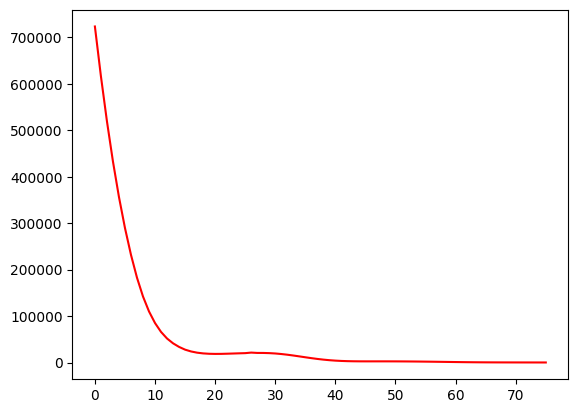

 15%|█▌        | 76/500 [00:18<01:43,  4.11it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.40112994350283
Dataset Name:  disney , AUC Score (contextual):  39.11845730027548
Dataset Name:  disney , AUC Score (structural):  47.2782874617737
Dataset Name:  disney , AUC Score (joint-type):  66.11570247933884
Dataset Name:  disney , AUC Score (structure type):  47.498625618471685
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  66.11570247933884
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


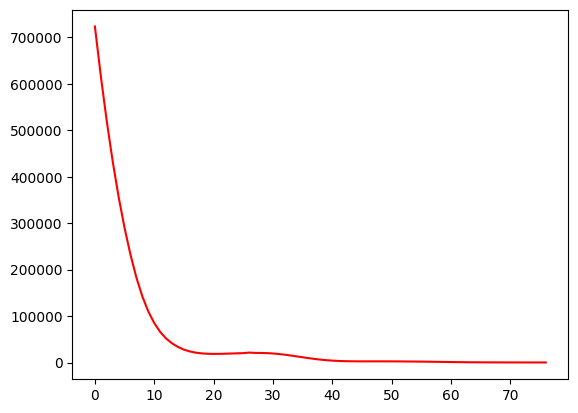

 15%|█▌        | 77/500 [00:18<01:41,  4.16it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.259887005649716
Dataset Name:  disney , AUC Score (contextual):  37.46556473829201
Dataset Name:  disney , AUC Score (structural):  46.97247706422018
Dataset Name:  disney , AUC Score (joint-type):  66.39118457300275
Dataset Name:  disney , AUC Score (structure type):  47.27872457394173
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  66.39118457300275
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


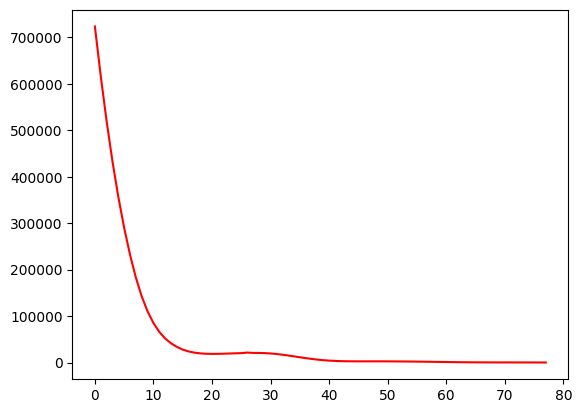

 16%|█▌        | 78/500 [00:18<01:48,  3.88it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.259887005649716
Dataset Name:  disney , AUC Score (contextual):  36.91460055096418
Dataset Name:  disney , AUC Score (structural):  47.09480122324158
Dataset Name:  disney , AUC Score (joint-type):  65.84022038567493
Dataset Name:  disney , AUC Score (structure type):  47.33369983507421
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  65.84022038567493
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


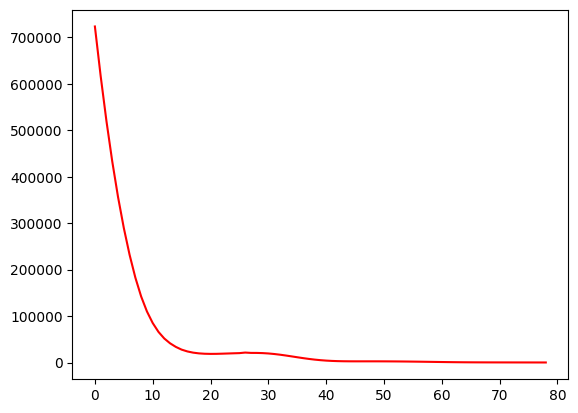

 16%|█▌        | 79/500 [00:19<01:53,  3.70it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.1186440677966
Dataset Name:  disney , AUC Score (contextual):  37.465564738292
Dataset Name:  disney , AUC Score (structural):  47.40061162079511
Dataset Name:  disney , AUC Score (joint-type):  64.46280991735537
Dataset Name:  disney , AUC Score (structure type):  47.388675096206704
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  64.46280991735537
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


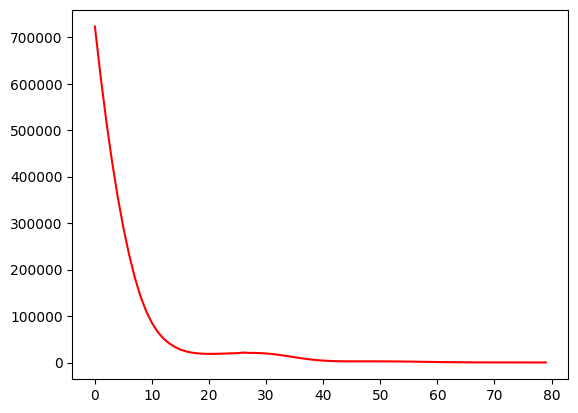

 16%|█▌        | 80/500 [00:19<01:59,  3.53it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  51.69491525423729
Dataset Name:  disney , AUC Score (contextual):  36.63911845730027
Dataset Name:  disney , AUC Score (structural):  47.645259938837924
Dataset Name:  disney , AUC Score (joint-type):  64.46280991735537
Dataset Name:  disney , AUC Score (structure type):  47.608576140736666
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  64.46280991735537
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


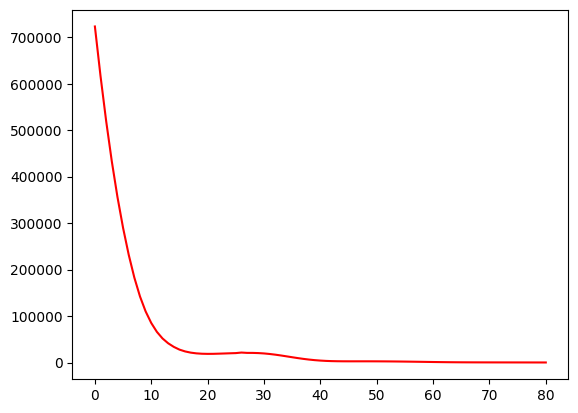

 16%|█▌        | 81/500 [00:19<02:00,  3.49it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.98870056497176
Dataset Name:  disney , AUC Score (contextual):  36.63911845730027
Dataset Name:  disney , AUC Score (structural):  47.95107033639144
Dataset Name:  disney , AUC Score (joint-type):  63.636363636363626
Dataset Name:  disney , AUC Score (structure type):  47.71852666300165
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  63.636363636363626
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


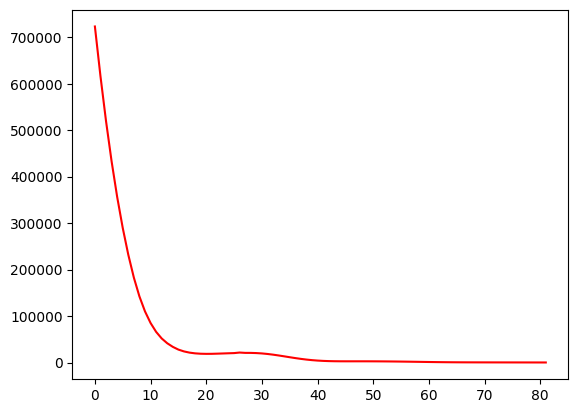

 16%|█▋        | 82/500 [00:19<02:01,  3.43it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.42372881355932
Dataset Name:  disney , AUC Score (contextual):  35.53719008264463
Dataset Name:  disney , AUC Score (structural):  47.88990825688074
Dataset Name:  disney , AUC Score (joint-type):  62.53443526170799
Dataset Name:  disney , AUC Score (structure type):  47.55360087960418
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  62.53443526170799
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


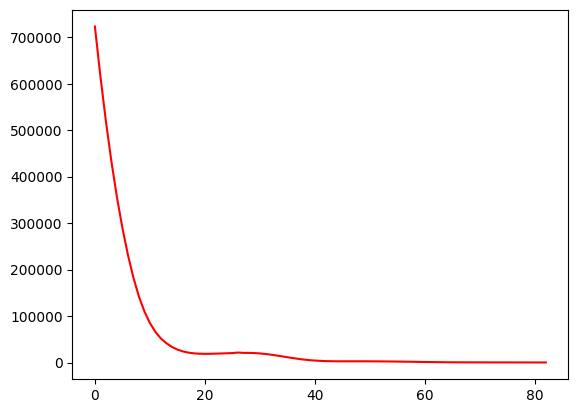

 17%|█▋        | 83/500 [00:20<01:52,  3.71it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  48.728813559322035
Dataset Name:  disney , AUC Score (contextual):  33.608815426997246
Dataset Name:  disney , AUC Score (structural):  49.174311926605505
Dataset Name:  disney , AUC Score (joint-type):  60.88154269972451
Dataset Name:  disney , AUC Score (structure type):  48.37822979659154
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  60.88154269972451
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


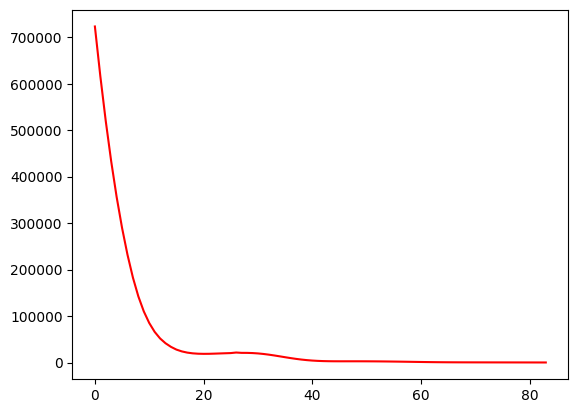

 17%|█▋        | 84/500 [00:20<01:53,  3.65it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  48.163841807909606
Dataset Name:  disney , AUC Score (contextual):  35.53719008264463
Dataset Name:  disney , AUC Score (structural):  49.72477064220183
Dataset Name:  disney , AUC Score (joint-type):  60.606060606060595
Dataset Name:  disney , AUC Score (structure type):  48.873007146783955
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  60.606060606060595
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


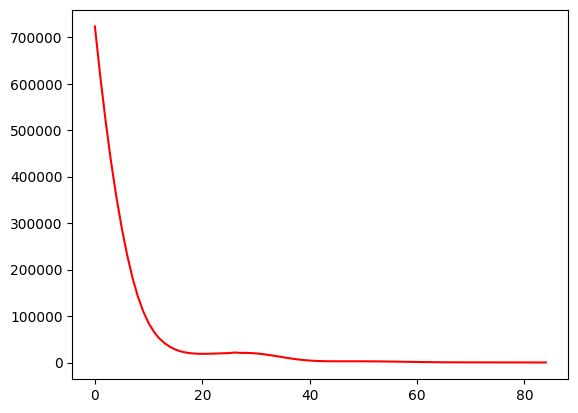

 17%|█▋        | 85/500 [00:20<01:55,  3.59it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.881355932203384
Dataset Name:  disney , AUC Score (contextual):  37.1900826446281
Dataset Name:  disney , AUC Score (structural):  50.33639143730887
Dataset Name:  disney , AUC Score (joint-type):  59.50413223140496
Dataset Name:  disney , AUC Score (structure type):  49.20285871357889
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  59.50413223140496
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


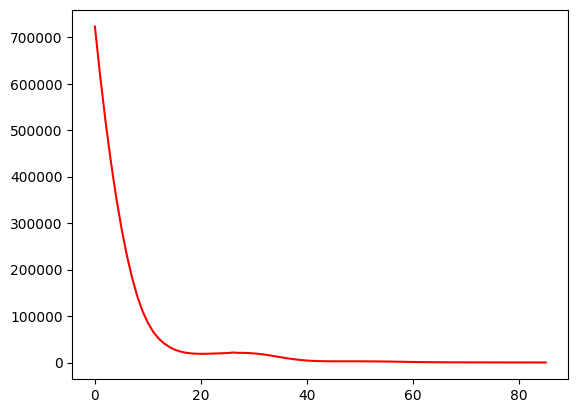

 17%|█▋        | 86/500 [00:20<01:56,  3.54it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.316384180790955
Dataset Name:  disney , AUC Score (contextual):  40.77134986225895
Dataset Name:  disney , AUC Score (structural):  51.49847094801223
Dataset Name:  disney , AUC Score (joint-type):  59.50413223140496
Dataset Name:  disney , AUC Score (structure type):  50.24738867509622
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  59.50413223140496
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


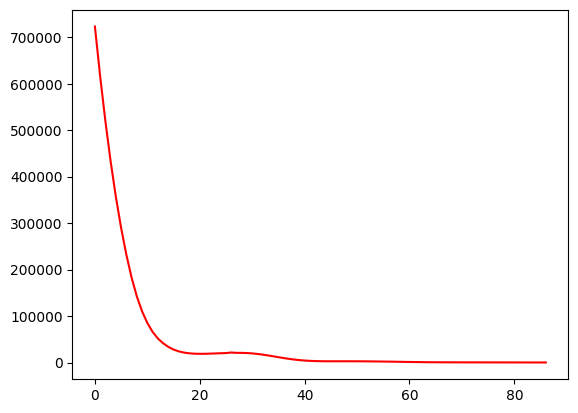

 17%|█▋        | 87/500 [00:21<01:57,  3.52it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.03389830508475
Dataset Name:  disney , AUC Score (contextual):  44.07713498622589
Dataset Name:  disney , AUC Score (structural):  51.86544342507645
Dataset Name:  disney , AUC Score (joint-type):  58.67768595041321
Dataset Name:  disney , AUC Score (structure type):  50.41231445849368
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  58.67768595041321
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


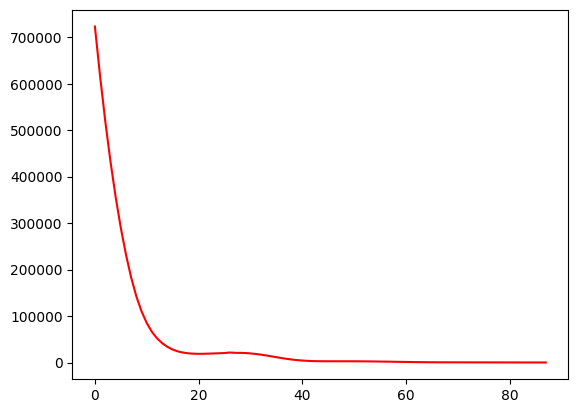

 18%|█▊        | 88/500 [00:21<01:57,  3.52it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.175141242937855
Dataset Name:  disney , AUC Score (contextual):  47.382920110192835
Dataset Name:  disney , AUC Score (structural):  52.59938837920489
Dataset Name:  disney , AUC Score (joint-type):  57.85123966942148
Dataset Name:  disney , AUC Score (structure type):  50.90709180868609
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.85123966942148
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


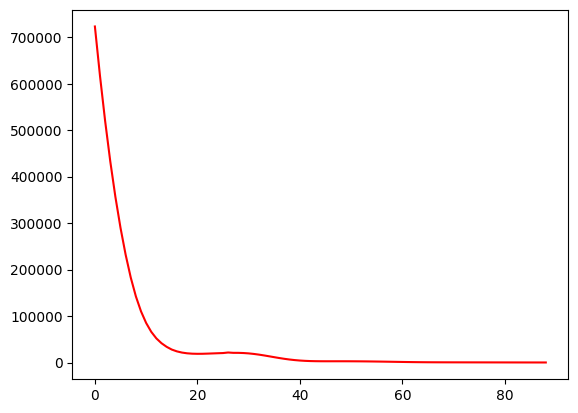

 18%|█▊        | 89/500 [00:21<01:48,  3.78it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  46.46892655367231
Dataset Name:  disney , AUC Score (contextual):  49.86225895316804
Dataset Name:  disney , AUC Score (structural):  52.59938837920489
Dataset Name:  disney , AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney , AUC Score (structure type):  50.74216602528862
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


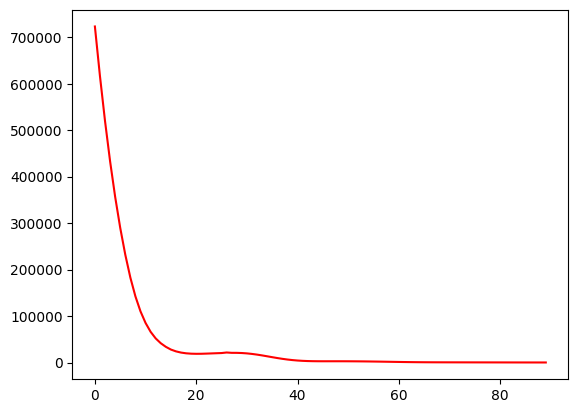

 18%|█▊        | 90/500 [00:22<01:41,  4.02it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  46.61016949152542
Dataset Name:  disney , AUC Score (contextual):  53.4435261707989
Dataset Name:  disney , AUC Score (structural):  53.027522935779814
Dataset Name:  disney , AUC Score (joint-type):  55.09641873278237
Dataset Name:  disney , AUC Score (structure type):  50.79714128642111
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  55.09641873278237
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


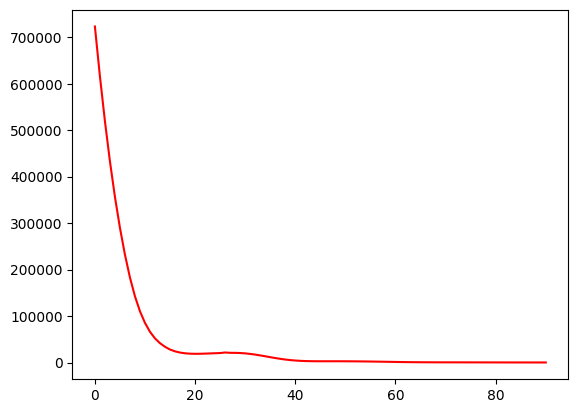

 18%|█▊        | 91/500 [00:22<01:36,  4.25it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.175141242937855
Dataset Name:  disney , AUC Score (contextual):  53.99449035812671
Dataset Name:  disney , AUC Score (structural):  53.21100917431193
Dataset Name:  disney , AUC Score (joint-type):  55.37190082644627
Dataset Name:  disney , AUC Score (structure type):  51.01704233095107
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  55.37190082644627
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


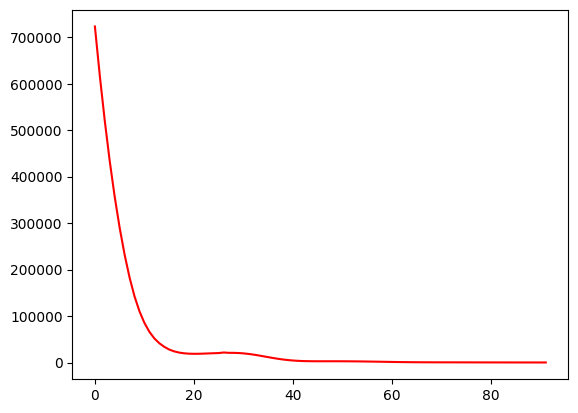

 18%|█▊        | 92/500 [00:22<01:32,  4.40it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.59887005649718
Dataset Name:  disney , AUC Score (contextual):  55.9228650137741
Dataset Name:  disney , AUC Score (structural):  53.57798165137615
Dataset Name:  disney , AUC Score (joint-type):  55.09641873278237
Dataset Name:  disney , AUC Score (structure type):  51.4018691588785
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  55.09641873278237
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


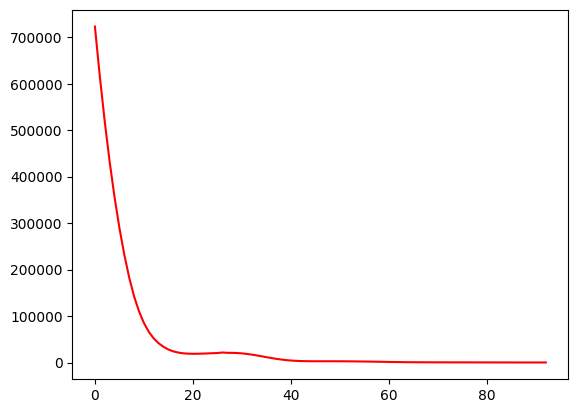

 19%|█▊        | 93/500 [00:22<01:29,  4.54it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  48.0225988700565
Dataset Name:  disney , AUC Score (contextual):  57.30027548209365
Dataset Name:  disney , AUC Score (structural):  53.76146788990825
Dataset Name:  disney , AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney , AUC Score (structure type):  51.346893897746014
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


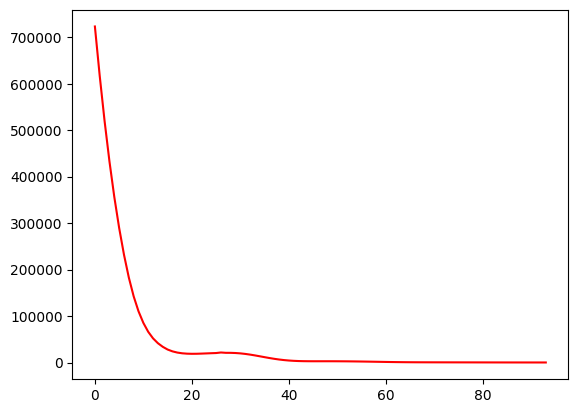

 19%|█▉        | 94/500 [00:22<01:29,  4.54it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.59887005649717
Dataset Name:  disney , AUC Score (contextual):  58.1267217630854
Dataset Name:  disney , AUC Score (structural):  53.57798165137615
Dataset Name:  disney , AUC Score (joint-type):  54.26997245179063
Dataset Name:  disney , AUC Score (structure type):  51.23694337548103
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  54.26997245179063
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


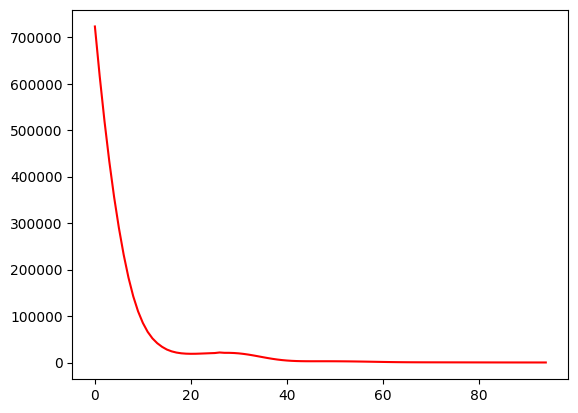

 19%|█▉        | 95/500 [00:23<01:39,  4.05it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.31638418079096
Dataset Name:  disney , AUC Score (contextual):  58.40220385674931
Dataset Name:  disney , AUC Score (structural):  53.822629969418955
Dataset Name:  disney , AUC Score (joint-type):  53.16804407713498
Dataset Name:  disney , AUC Score (structure type):  51.23694337548103
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.16804407713498
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


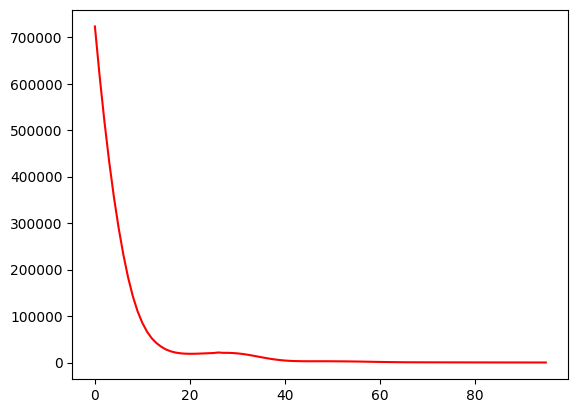

 19%|█▉        | 96/500 [00:23<01:42,  3.96it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.31638418079096
Dataset Name:  disney , AUC Score (contextual):  58.126721763085385
Dataset Name:  disney , AUC Score (structural):  53.88379204892966
Dataset Name:  disney , AUC Score (joint-type):  51.79063360881542
Dataset Name:  disney , AUC Score (structure type):  51.01704233095107
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  51.79063360881542
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


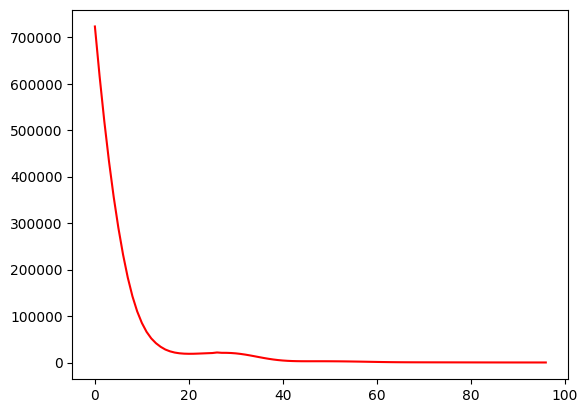

 19%|█▉        | 97/500 [00:23<01:44,  3.86it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.03389830508474
Dataset Name:  disney , AUC Score (contextual):  58.40220385674931
Dataset Name:  disney , AUC Score (structural):  54.128440366972484
Dataset Name:  disney , AUC Score (joint-type):  51.2396694214876
Dataset Name:  disney , AUC Score (structure type):  51.12699285321606
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  51.2396694214876
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


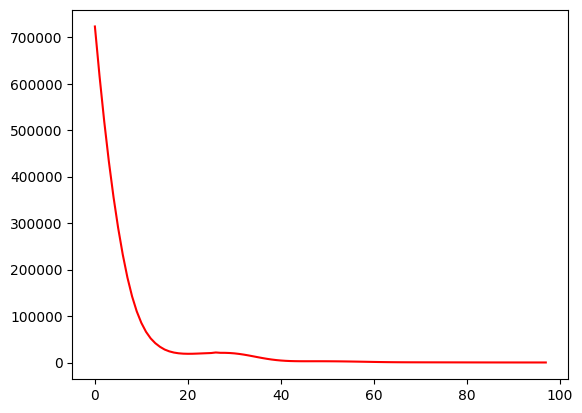

 20%|█▉        | 98/500 [00:23<01:37,  4.11it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.175141242937855
Dataset Name:  disney , AUC Score (contextual):  58.953168044077145
Dataset Name:  disney , AUC Score (structural):  54.25076452599388
Dataset Name:  disney , AUC Score (joint-type):  51.23966942148761
Dataset Name:  disney , AUC Score (structure type):  51.23694337548103
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  51.23966942148761
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


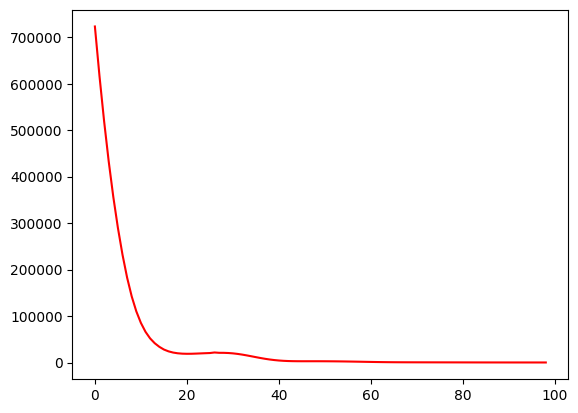

 20%|█▉        | 99/500 [00:24<01:32,  4.32it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.31638418079096
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  54.006116207951074
Dataset Name:  disney , AUC Score (joint-type):  50.96418732782369
Dataset Name:  disney , AUC Score (structure type):  50.96206706981859
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  50.96418732782369
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


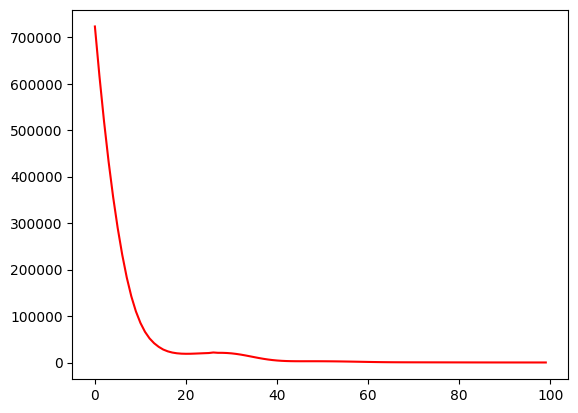

 20%|██        | 100/500 [00:24<01:27,  4.59it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.31638418079096
Dataset Name:  disney , AUC Score (contextual):  58.1267217630854
Dataset Name:  disney , AUC Score (structural):  53.822629969418955
Dataset Name:  disney , AUC Score (joint-type):  50.688705234159784
Dataset Name:  disney , AUC Score (structure type):  50.742166025288626
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  50.688705234159784
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


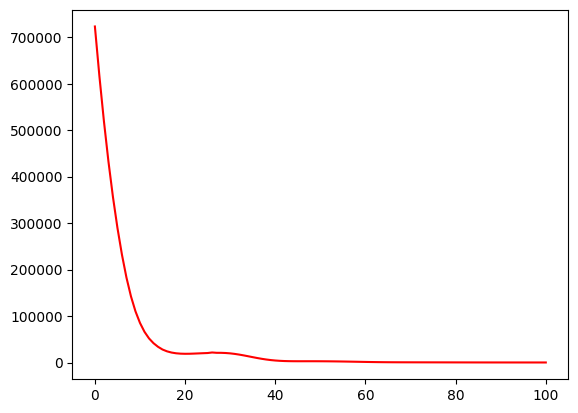

 20%|██        | 101/500 [00:24<01:21,  4.88it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  46.75141242937853
Dataset Name:  disney , AUC Score (contextual):  56.473829201101935
Dataset Name:  disney , AUC Score (structural):  54.00611620795106
Dataset Name:  disney , AUC Score (joint-type):  50.688705234159784
Dataset Name:  disney , AUC Score (structure type):  50.90709180868609
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  50.688705234159784
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


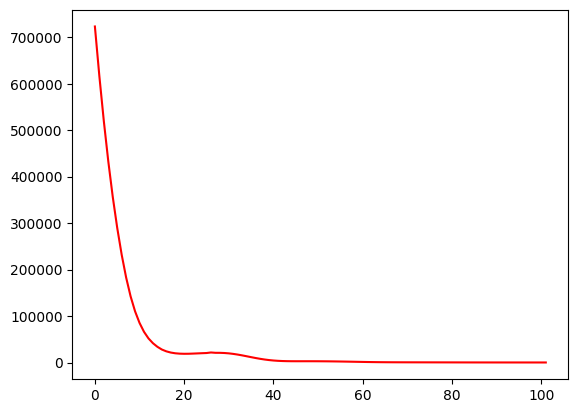

 20%|██        | 102/500 [00:24<01:18,  5.09it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  46.75141242937853
Dataset Name:  disney , AUC Score (contextual):  54.82093663911846
Dataset Name:  disney , AUC Score (structural):  54.12844036697248
Dataset Name:  disney , AUC Score (joint-type):  50.13774104683195
Dataset Name:  disney , AUC Score (structure type):  50.90709180868609
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  50.13774104683195
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


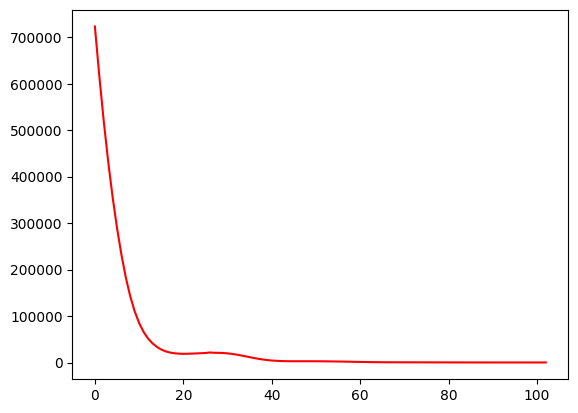

 21%|██        | 103/500 [00:24<01:24,  4.71it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  45.90395480225988
Dataset Name:  disney , AUC Score (contextual):  52.61707988980716
Dataset Name:  disney , AUC Score (structural):  54.00611620795106
Dataset Name:  disney , AUC Score (joint-type):  50.13774104683195
Dataset Name:  disney , AUC Score (structure type):  50.79714128642111
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  50.13774104683195
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


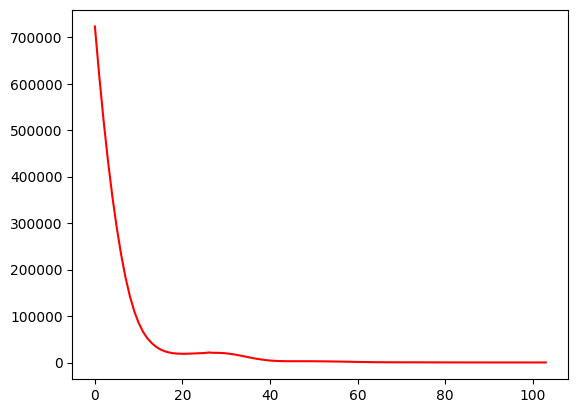

 21%|██        | 104/500 [00:25<01:32,  4.27it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  45.62146892655367
Dataset Name:  disney , AUC Score (contextual):  51.515151515151516
Dataset Name:  disney , AUC Score (structural):  54.067278287461775
Dataset Name:  disney , AUC Score (joint-type):  49.586776859504134
Dataset Name:  disney , AUC Score (structure type):  50.742166025288626
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  49.586776859504134
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


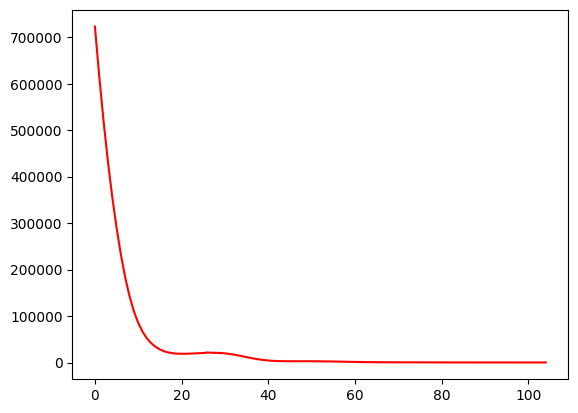

 21%|██        | 105/500 [00:25<01:30,  4.38it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  44.774011299435024
Dataset Name:  disney , AUC Score (contextual):  49.311294765840216
Dataset Name:  disney , AUC Score (structural):  54.006116207951074
Dataset Name:  disney , AUC Score (joint-type):  48.760330578512395
Dataset Name:  disney , AUC Score (structure type):  50.522264980758656
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  48.760330578512395
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


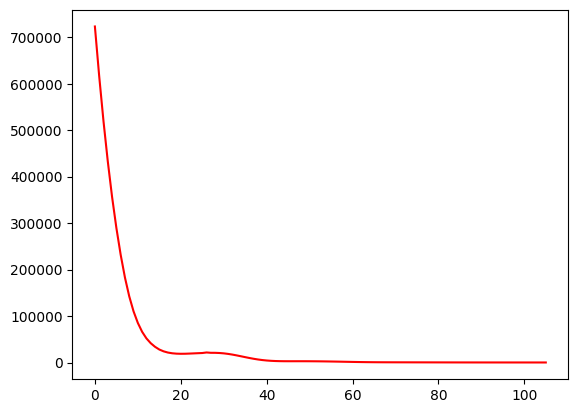

 21%|██        | 106/500 [00:25<01:23,  4.71it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  44.06779661016949
Dataset Name:  disney , AUC Score (contextual):  44.90358126721763
Dataset Name:  disney , AUC Score (structural):  53.88379204892966
Dataset Name:  disney , AUC Score (joint-type):  48.48484848484848
Dataset Name:  disney , AUC Score (structure type):  50.35733919736119
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  48.48484848484848
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


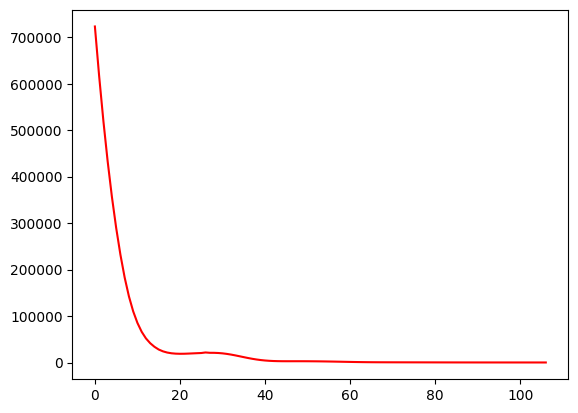

 21%|██▏       | 107/500 [00:25<01:21,  4.80it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.78531073446327
Dataset Name:  disney , AUC Score (contextual):  43.25068870523416
Dataset Name:  disney , AUC Score (structural):  53.822629969418955
Dataset Name:  disney , AUC Score (joint-type):  48.48484848484848
Dataset Name:  disney , AUC Score (structure type):  50.30236393622871
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  48.48484848484848
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


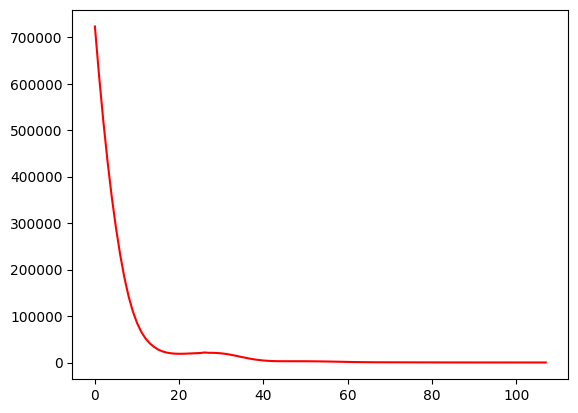

 22%|██▏       | 108/500 [00:26<01:47,  3.65it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.78531073446327
Dataset Name:  disney , AUC Score (contextual):  42.14876033057851
Dataset Name:  disney , AUC Score (structural):  53.88379204892966
Dataset Name:  disney , AUC Score (joint-type):  48.76033057851239
Dataset Name:  disney , AUC Score (structure type):  50.41231445849368
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  48.76033057851239
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


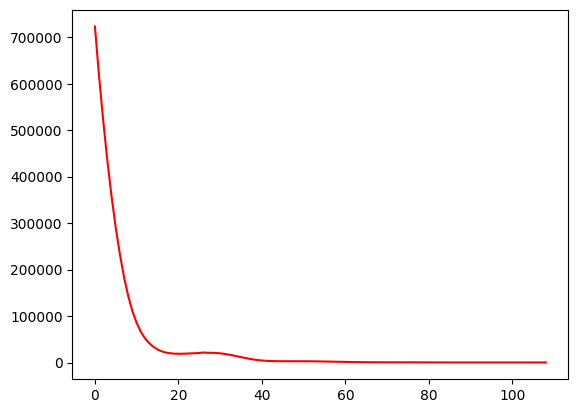

 22%|██▏       | 109/500 [00:26<01:35,  4.10it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.79661016949152
Dataset Name:  disney , AUC Score (contextual):  38.01652892561983
Dataset Name:  disney , AUC Score (structural):  53.76146788990825
Dataset Name:  disney , AUC Score (joint-type):  49.035812672176306
Dataset Name:  disney , AUC Score (structure type):  50.357339197361185
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  49.035812672176306
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


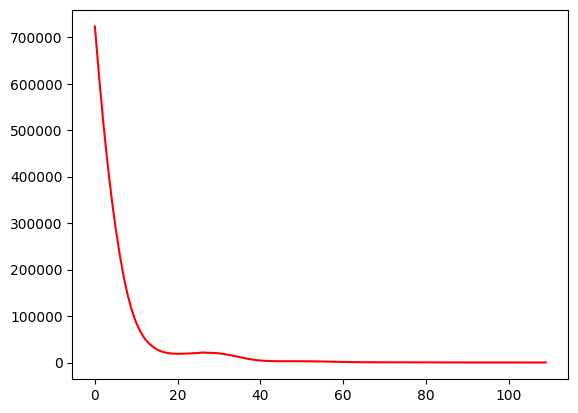

 22%|██▏       | 110/500 [00:26<01:40,  3.87it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.07909604519774
Dataset Name:  disney , AUC Score (contextual):  36.91460055096418
Dataset Name:  disney , AUC Score (structural):  53.76146788990825
Dataset Name:  disney , AUC Score (joint-type):  49.035812672176306
Dataset Name:  disney , AUC Score (structure type):  50.357339197361185
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  49.035812672176306
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


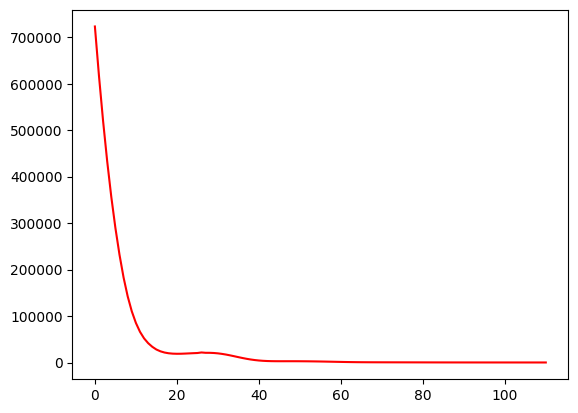

 22%|██▏       | 111/500 [00:26<01:35,  4.09it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.220338983050844
Dataset Name:  disney , AUC Score (contextual):  34.15977961432507
Dataset Name:  disney , AUC Score (structural):  53.39449541284404
Dataset Name:  disney , AUC Score (joint-type):  49.311294765840216
Dataset Name:  disney , AUC Score (structure type):  50.08246289169873
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  49.311294765840216
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


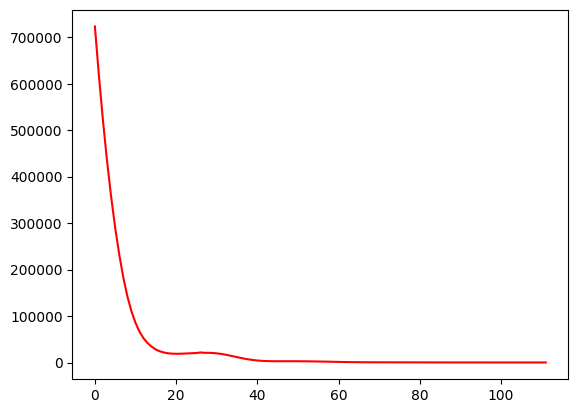

 22%|██▏       | 112/500 [00:27<01:30,  4.30it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.50282485875706
Dataset Name:  disney , AUC Score (contextual):  32.231404958677686
Dataset Name:  disney , AUC Score (structural):  53.27217125382262
Dataset Name:  disney , AUC Score (joint-type):  49.86225895316804
Dataset Name:  disney , AUC Score (structure type):  50.08246289169874
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  49.86225895316804
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


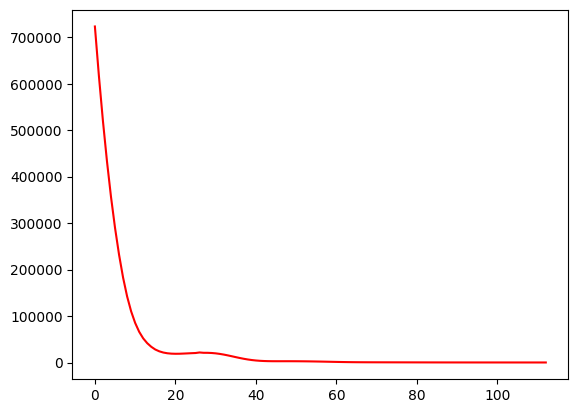

 23%|██▎       | 113/500 [00:27<01:23,  4.63it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.50282485875706
Dataset Name:  disney , AUC Score (contextual):  31.680440771349854
Dataset Name:  disney , AUC Score (structural):  53.822629969418955
Dataset Name:  disney , AUC Score (joint-type):  50.41322314049586
Dataset Name:  disney , AUC Score (structure type):  50.68719076415613
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  50.41322314049586
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


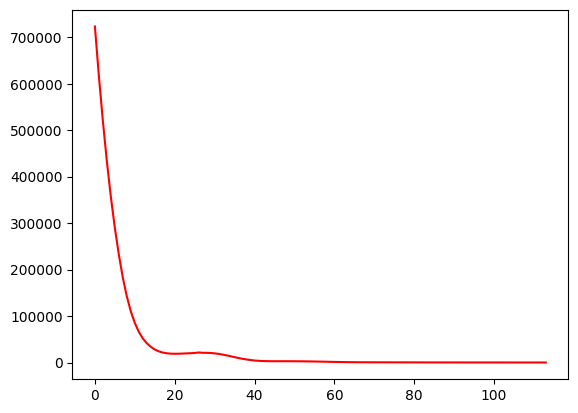

 23%|██▎       | 114/500 [00:27<01:21,  4.74it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.92655367231638
Dataset Name:  disney , AUC Score (contextual):  30.853994490358126
Dataset Name:  disney , AUC Score (structural):  54.25076452599388
Dataset Name:  disney , AUC Score (joint-type):  50.688705234159784
Dataset Name:  disney , AUC Score (structure type):  51.126992853216066
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  50.688705234159784
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


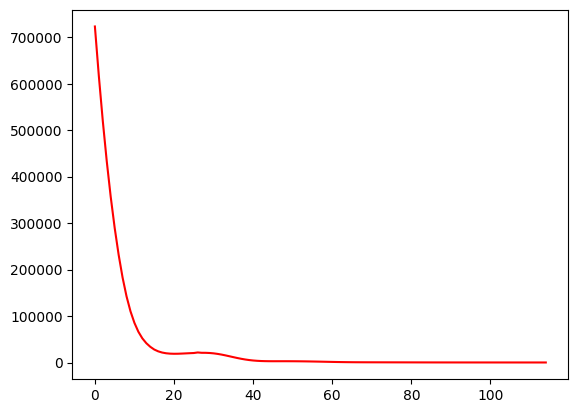

 23%|██▎       | 115/500 [00:27<01:20,  4.77it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  44.49152542372881
Dataset Name:  disney , AUC Score (contextual):  30.303030303030305
Dataset Name:  disney , AUC Score (structural):  54.49541284403669
Dataset Name:  disney , AUC Score (joint-type):  51.790633608815426
Dataset Name:  disney , AUC Score (structure type):  51.56679494227598
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  51.790633608815426
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


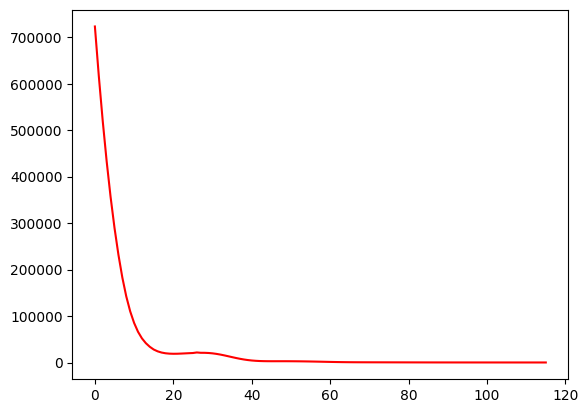

 23%|██▎       | 116/500 [00:27<01:16,  5.00it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  44.77401129943503
Dataset Name:  disney , AUC Score (contextual):  28.92561983471074
Dataset Name:  disney , AUC Score (structural):  54.556574923547394
Dataset Name:  disney , AUC Score (joint-type):  52.066115702479344
Dataset Name:  disney , AUC Score (structure type):  51.67674546454095
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  52.066115702479344
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


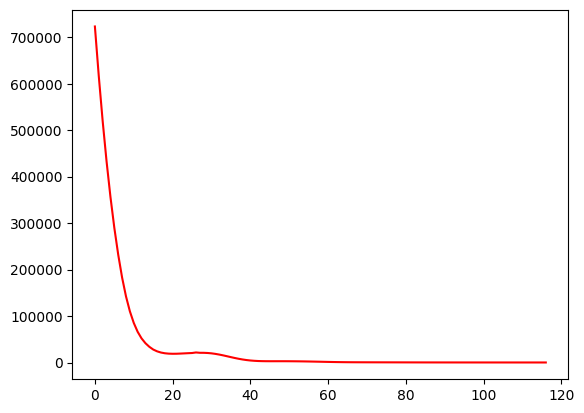

 23%|██▎       | 117/500 [00:28<01:17,  4.95it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  44.2090395480226
Dataset Name:  disney , AUC Score (contextual):  27.54820936639118
Dataset Name:  disney , AUC Score (structural):  54.74006116207951
Dataset Name:  disney , AUC Score (joint-type):  52.34159779614325
Dataset Name:  disney , AUC Score (structure type):  51.89664650907092
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  52.34159779614325
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


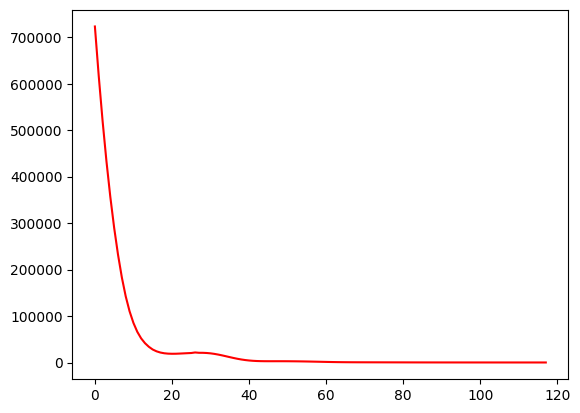

 24%|██▎       | 118/500 [00:28<01:23,  4.56it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.92655367231638
Dataset Name:  disney , AUC Score (contextual):  26.44628099173553
Dataset Name:  disney , AUC Score (structural):  54.92354740061162
Dataset Name:  disney , AUC Score (joint-type):  52.892561983471076
Dataset Name:  disney , AUC Score (structure type):  52.171522814733365
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  52.892561983471076
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


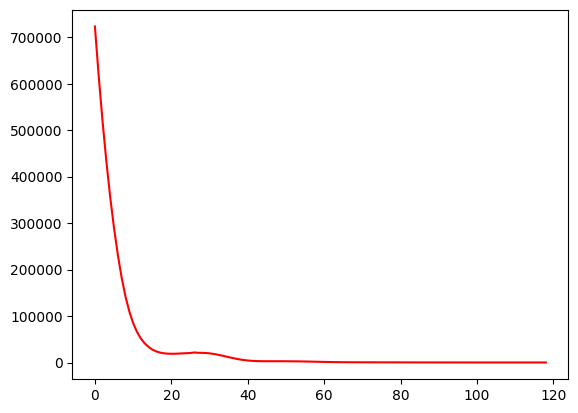

 24%|██▍       | 119/500 [00:28<01:18,  4.85it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.92655367231638
Dataset Name:  disney , AUC Score (contextual):  25.6198347107438
Dataset Name:  disney , AUC Score (structural):  54.801223241590215
Dataset Name:  disney , AUC Score (joint-type):  52.892561983471076
Dataset Name:  disney , AUC Score (structure type):  52.061572292468384
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  52.892561983471076
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


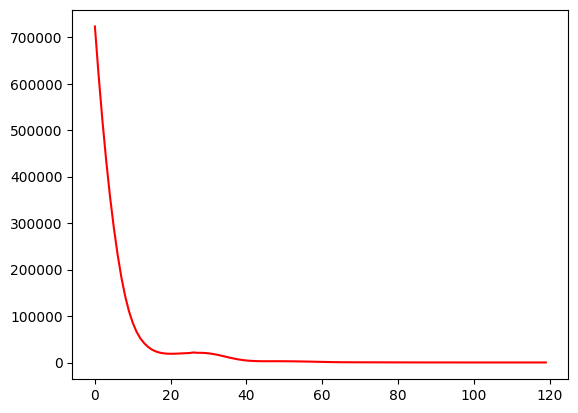

 24%|██▍       | 120/500 [00:28<01:14,  5.09it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.92655367231638
Dataset Name:  disney , AUC Score (contextual):  25.068870523415974
Dataset Name:  disney , AUC Score (structural):  54.801223241590215
Dataset Name:  disney , AUC Score (joint-type):  53.71900826446281
Dataset Name:  disney , AUC Score (structure type):  52.226498075865855
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.71900826446281
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


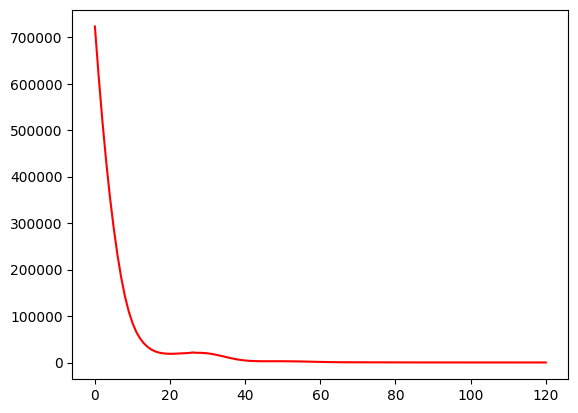

 24%|██▍       | 121/500 [00:28<01:12,  5.22it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.92655367231638
Dataset Name:  disney , AUC Score (contextual):  24.793388429752063
Dataset Name:  disney , AUC Score (structural):  54.49541284403669
Dataset Name:  disney , AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney , AUC Score (structure type):  52.0065970313359
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


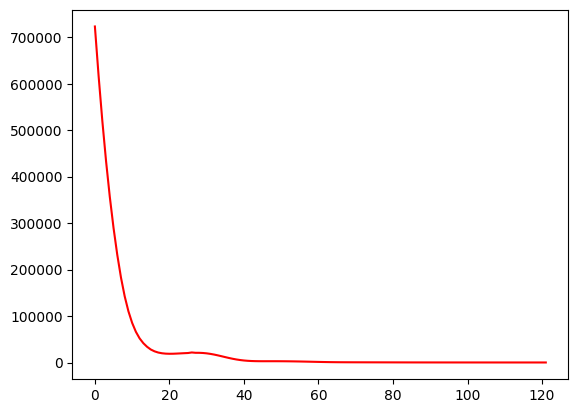

 24%|██▍       | 122/500 [00:29<01:10,  5.32it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  44.06779661016949
Dataset Name:  disney , AUC Score (contextual):  25.344352617079885
Dataset Name:  disney , AUC Score (structural):  54.43425076452599
Dataset Name:  disney , AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney , AUC Score (structure type):  51.9516217702034
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


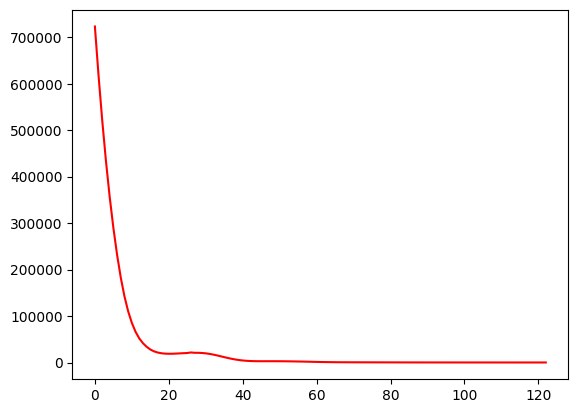

 25%|██▍       | 123/500 [00:29<01:13,  5.11it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.220338983050844
Dataset Name:  disney , AUC Score (contextual):  25.6198347107438
Dataset Name:  disney , AUC Score (structural):  54.25076452599389
Dataset Name:  disney , AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney , AUC Score (structure type):  51.78669598680594
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


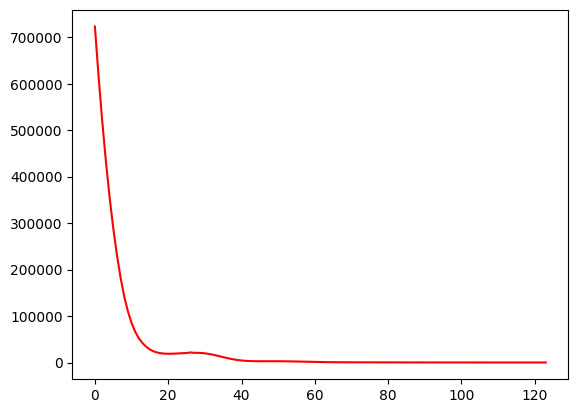

 25%|██▍       | 124/500 [00:29<01:18,  4.77it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.07909604519774
Dataset Name:  disney , AUC Score (contextual):  26.446280991735538
Dataset Name:  disney , AUC Score (structural):  53.94495412844036
Dataset Name:  disney , AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney , AUC Score (structure type):  51.51181968114349
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


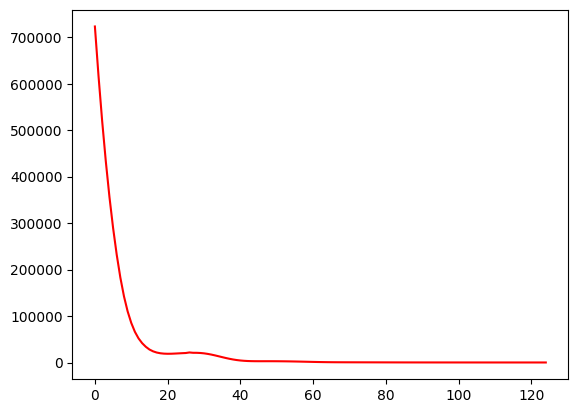

 25%|██▌       | 125/500 [00:29<01:23,  4.51it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.65536723163842
Dataset Name:  disney , AUC Score (contextual):  26.446280991735538
Dataset Name:  disney , AUC Score (structural):  53.76146788990825
Dataset Name:  disney , AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney , AUC Score (structure type):  51.346893897746014
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


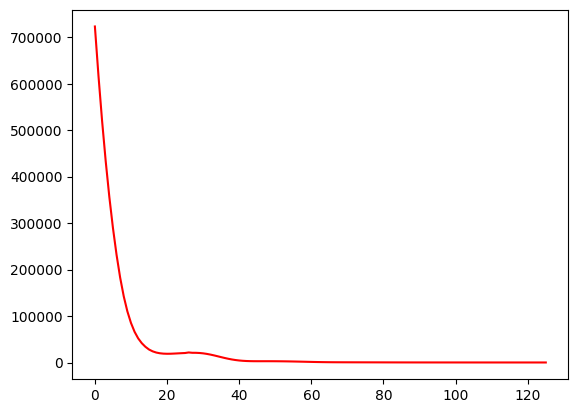

 25%|██▌       | 126/500 [00:29<01:29,  4.18it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.65536723163842
Dataset Name:  disney , AUC Score (contextual):  27.27272727272727
Dataset Name:  disney , AUC Score (structural):  53.51681957186545
Dataset Name:  disney , AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney , AUC Score (structure type):  51.12699285321606
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


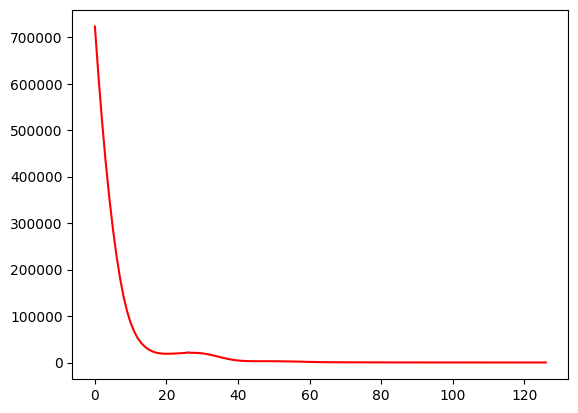

 25%|██▌       | 127/500 [00:30<01:30,  4.13it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.65536723163842
Dataset Name:  disney , AUC Score (contextual):  27.27272727272727
Dataset Name:  disney , AUC Score (structural):  53.21100917431192
Dataset Name:  disney , AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney , AUC Score (structure type):  50.85211654755359
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


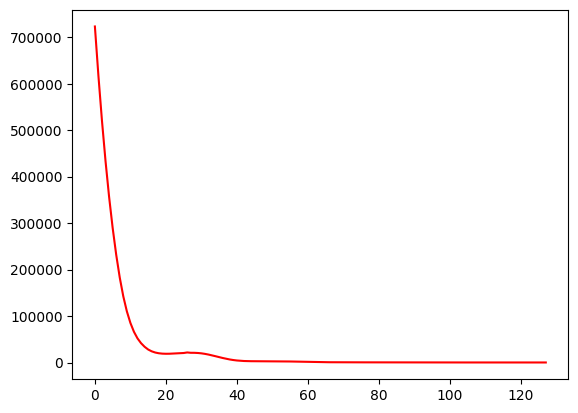

 26%|██▌       | 128/500 [00:30<01:23,  4.48it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.65536723163842
Dataset Name:  disney , AUC Score (contextual):  28.37465564738292
Dataset Name:  disney , AUC Score (structural):  53.027522935779814
Dataset Name:  disney , AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney , AUC Score (structure type):  50.68719076415613
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


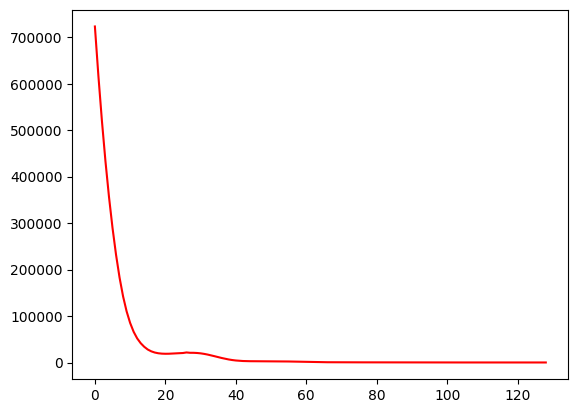

 26%|██▌       | 129/500 [00:30<01:17,  4.80it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.090395480225986
Dataset Name:  disney , AUC Score (contextual):  28.92561983471074
Dataset Name:  disney , AUC Score (structural):  52.72171253822629
Dataset Name:  disney , AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney , AUC Score (structure type):  50.41231445849368
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


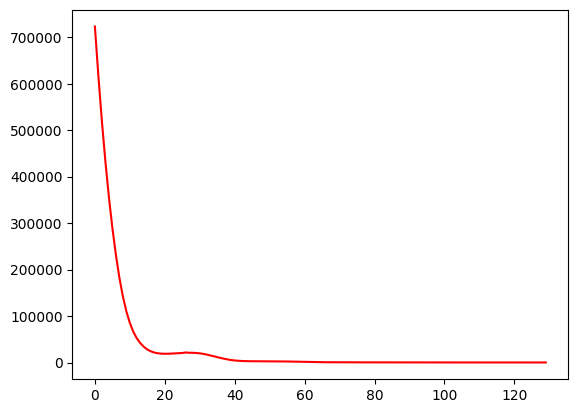

 26%|██▌       | 130/500 [00:30<01:13,  5.02it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.2316384180791
Dataset Name:  disney , AUC Score (contextual):  29.476584022038573
Dataset Name:  disney , AUC Score (structural):  52.72171253822629
Dataset Name:  disney , AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney , AUC Score (structure type):  50.41231445849368
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.994490358126725
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


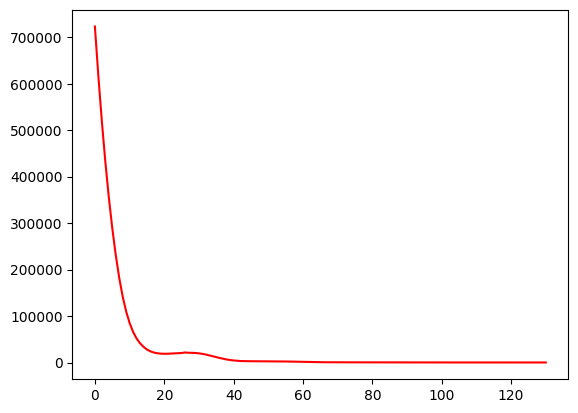

 26%|██▌       | 131/500 [00:31<01:19,  4.63it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  41.94915254237288
Dataset Name:  disney , AUC Score (contextual):  29.752066115702476
Dataset Name:  disney , AUC Score (structural):  52.721712538226306
Dataset Name:  disney , AUC Score (joint-type):  53.71900826446281
Dataset Name:  disney , AUC Score (structure type):  50.357339197361185
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.71900826446281
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


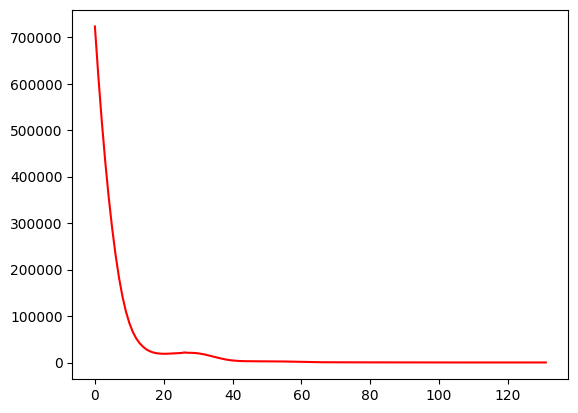

 26%|██▋       | 132/500 [00:31<01:21,  4.50it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  41.94915254237288
Dataset Name:  disney , AUC Score (contextual):  30.57851239669421
Dataset Name:  disney , AUC Score (structural):  52.782874617736994
Dataset Name:  disney , AUC Score (joint-type):  53.4435261707989
Dataset Name:  disney , AUC Score (structure type):  50.357339197361185
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.4435261707989
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


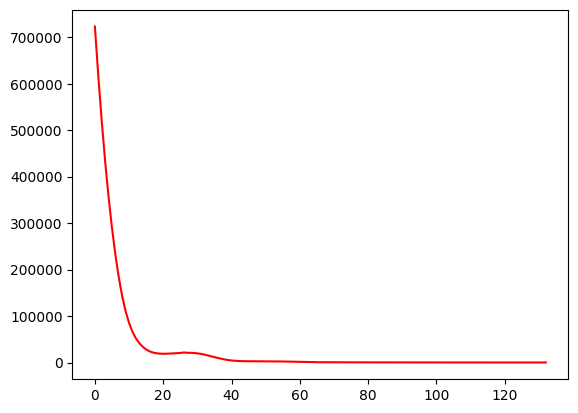

 27%|██▋       | 133/500 [00:31<01:17,  4.76it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.090395480225986
Dataset Name:  disney , AUC Score (contextual):  30.853994490358126
Dataset Name:  disney , AUC Score (structural):  52.59938837920488
Dataset Name:  disney , AUC Score (joint-type):  53.99449035812671
Dataset Name:  disney , AUC Score (structure type):  50.3023639362287
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  53.99449035812671
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


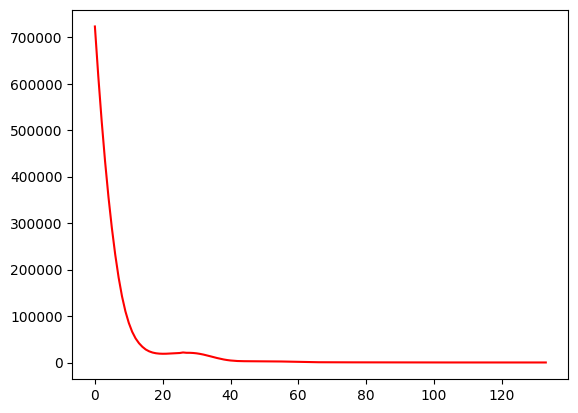

 27%|██▋       | 134/500 [00:31<01:13,  5.00it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  41.94915254237288
Dataset Name:  disney , AUC Score (contextual):  31.40495867768595
Dataset Name:  disney , AUC Score (structural):  52.53822629969419
Dataset Name:  disney , AUC Score (joint-type):  54.269972451790636
Dataset Name:  disney , AUC Score (structure type):  50.30236393622869
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  54.269972451790636
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


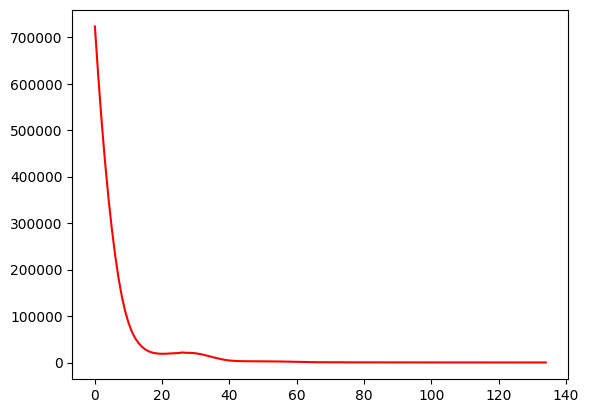

 27%|██▋       | 135/500 [00:31<01:11,  5.12it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  41.94915254237288
Dataset Name:  disney , AUC Score (contextual):  31.40495867768595
Dataset Name:  disney , AUC Score (structural):  52.53822629969418
Dataset Name:  disney , AUC Score (joint-type):  54.82093663911846
Dataset Name:  disney , AUC Score (structure type):  50.41231445849368
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  54.82093663911846
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


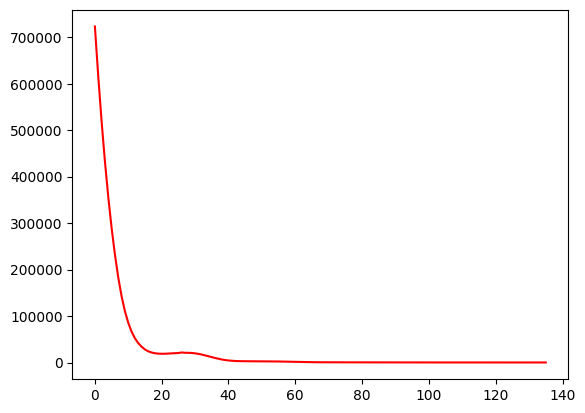

 27%|██▋       | 136/500 [00:32<01:18,  4.64it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.090395480225986
Dataset Name:  disney , AUC Score (contextual):  31.40495867768595
Dataset Name:  disney , AUC Score (structural):  52.66055045871559
Dataset Name:  disney , AUC Score (joint-type):  55.64738292011019
Dataset Name:  disney , AUC Score (structure type):  50.68719076415613
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  55.64738292011019
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


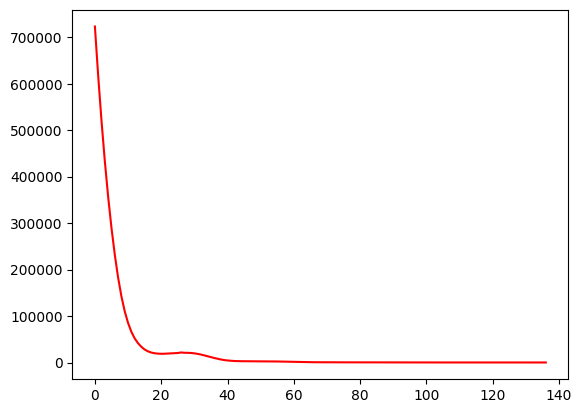

 27%|██▋       | 137/500 [00:32<01:17,  4.65it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.3728813559322
Dataset Name:  disney , AUC Score (contextual):  31.40495867768595
Dataset Name:  disney , AUC Score (structural):  52.721712538226306
Dataset Name:  disney , AUC Score (joint-type):  55.64738292011019
Dataset Name:  disney , AUC Score (structure type):  50.742166025288626
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  55.64738292011019
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


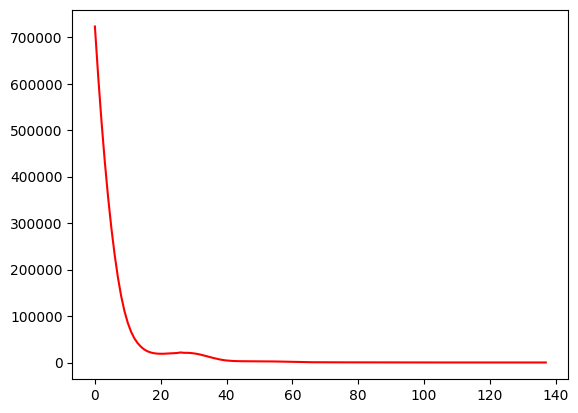

 28%|██▊       | 138/500 [00:32<01:13,  4.90it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.3728813559322
Dataset Name:  disney , AUC Score (contextual):  31.40495867768595
Dataset Name:  disney , AUC Score (structural):  52.47706422018348
Dataset Name:  disney , AUC Score (joint-type):  55.9228650137741
Dataset Name:  disney , AUC Score (structure type):  50.577240241891154
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  55.9228650137741
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


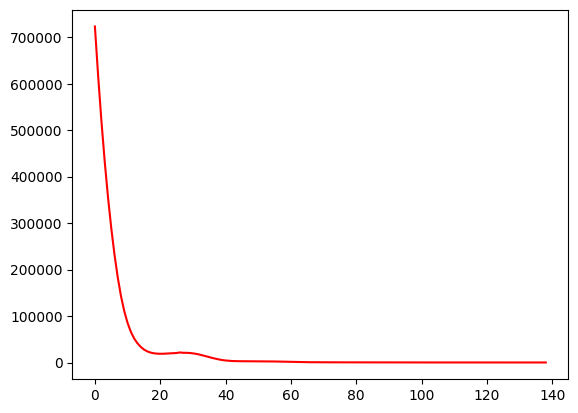

 28%|██▊       | 139/500 [00:32<01:10,  5.10it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.65536723163842
Dataset Name:  disney , AUC Score (contextual):  31.404958677685947
Dataset Name:  disney , AUC Score (structural):  52.41590214067278
Dataset Name:  disney , AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney , AUC Score (structure type):  50.742166025288626
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


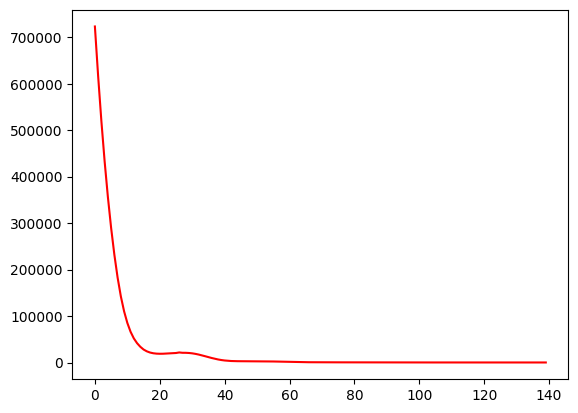

 28%|██▊       | 140/500 [00:32<01:09,  5.21it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.3728813559322
Dataset Name:  disney , AUC Score (contextual):  31.12947658402203
Dataset Name:  disney , AUC Score (structural):  52.47706422018348
Dataset Name:  disney , AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney , AUC Score (structure type):  50.742166025288626
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


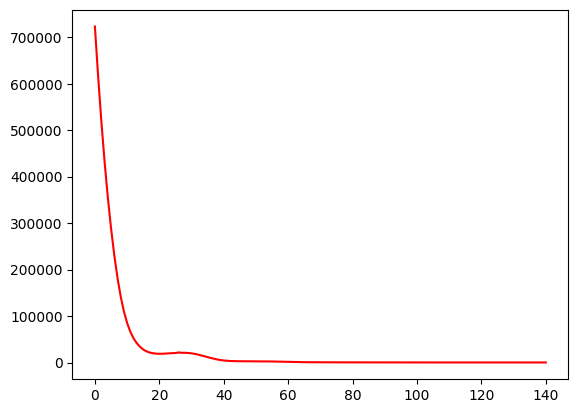

 28%|██▊       | 141/500 [00:33<01:13,  4.88it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.93785310734464
Dataset Name:  disney , AUC Score (contextual):  31.404958677685947
Dataset Name:  disney , AUC Score (structural):  52.721712538226306
Dataset Name:  disney , AUC Score (joint-type):  57.30027548209367
Dataset Name:  disney , AUC Score (structure type):  51.07201759208356
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.30027548209367
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


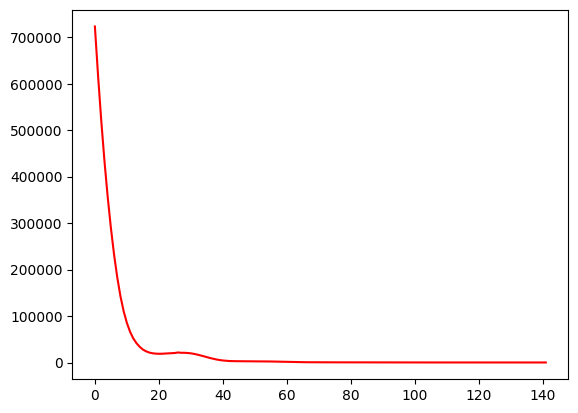

 28%|██▊       | 142/500 [00:33<01:28,  4.03it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.93785310734464
Dataset Name:  disney , AUC Score (contextual):  31.404958677685947
Dataset Name:  disney , AUC Score (structural):  52.66055045871558
Dataset Name:  disney , AUC Score (joint-type):  57.30027548209367
Dataset Name:  disney , AUC Score (structure type):  51.01704233095108
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.30027548209367
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


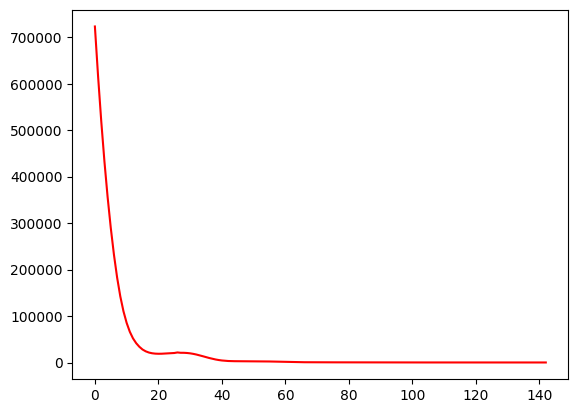

 29%|██▊       | 143/500 [00:33<01:22,  4.33it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.93785310734463
Dataset Name:  disney , AUC Score (contextual):  31.404958677685947
Dataset Name:  disney , AUC Score (structural):  52.721712538226306
Dataset Name:  disney , AUC Score (joint-type):  57.57575757575758
Dataset Name:  disney , AUC Score (structure type):  51.126992853216045
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.57575757575758
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


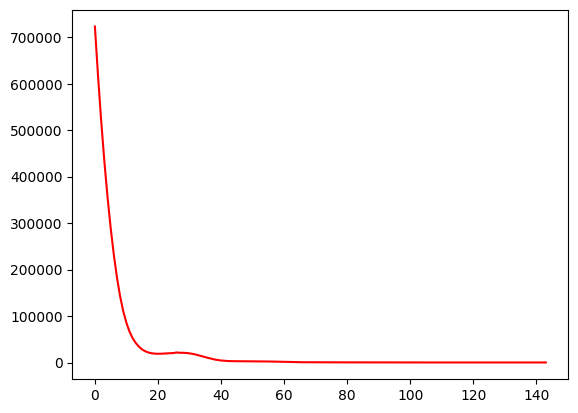

 29%|██▉       | 144/500 [00:33<01:16,  4.63it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.07909604519774
Dataset Name:  disney , AUC Score (contextual):  31.129476584022036
Dataset Name:  disney , AUC Score (structural):  52.721712538226306
Dataset Name:  disney , AUC Score (joint-type):  57.57575757575758
Dataset Name:  disney , AUC Score (structure type):  51.126992853216045
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.57575757575758
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


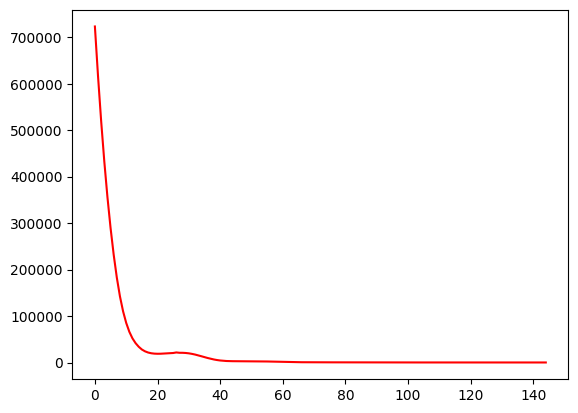

 29%|██▉       | 145/500 [00:33<01:12,  4.87it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.93785310734463
Dataset Name:  disney , AUC Score (contextual):  31.129476584022036
Dataset Name:  disney , AUC Score (structural):  52.721712538226285
Dataset Name:  disney , AUC Score (joint-type):  57.57575757575758
Dataset Name:  disney , AUC Score (structure type):  51.126992853216045
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.57575757575758
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


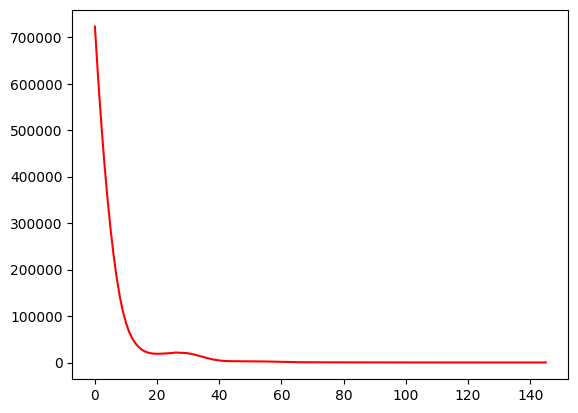

 29%|██▉       | 146/500 [00:34<01:10,  5.05it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.93785310734463
Dataset Name:  disney , AUC Score (contextual):  31.129476584022036
Dataset Name:  disney , AUC Score (structural):  52.660550458715605
Dataset Name:  disney , AUC Score (joint-type):  57.30027548209367
Dataset Name:  disney , AUC Score (structure type):  51.01704233095107
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.30027548209367
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


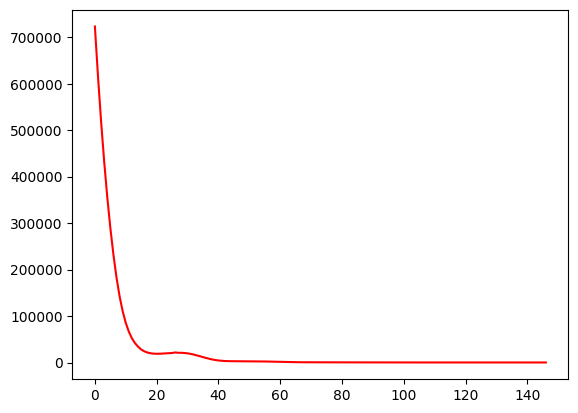

 29%|██▉       | 147/500 [00:34<01:08,  5.17it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.93785310734463
Dataset Name:  disney , AUC Score (contextual):  31.129476584022036
Dataset Name:  disney , AUC Score (structural):  52.721712538226285
Dataset Name:  disney , AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney , AUC Score (structure type):  51.01704233095107
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


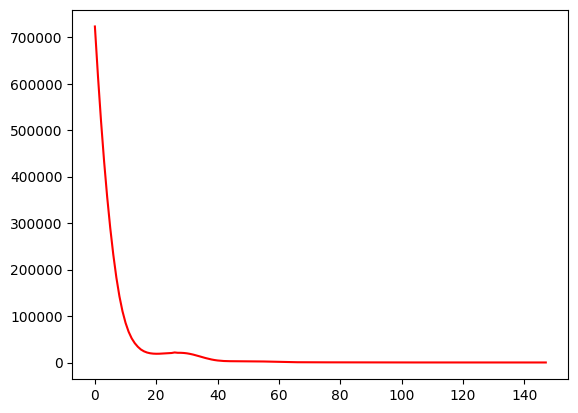

 30%|██▉       | 148/500 [00:34<01:06,  5.28it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.93785310734464
Dataset Name:  disney , AUC Score (contextual):  30.853994490358122
Dataset Name:  disney , AUC Score (structural):  52.9051987767584
Dataset Name:  disney , AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney , AUC Score (structure type):  51.18196811434854
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


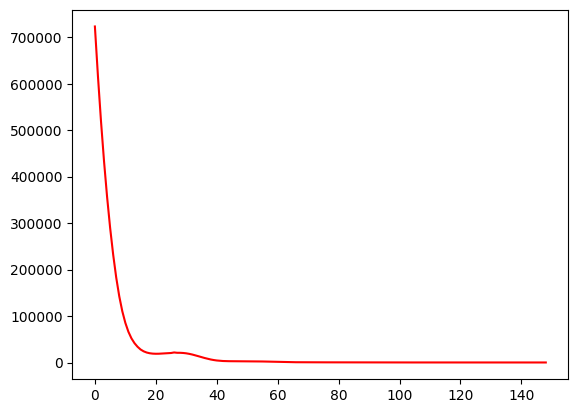

 30%|██▉       | 149/500 [00:34<01:08,  5.10it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.93785310734464
Dataset Name:  disney , AUC Score (contextual):  30.303030303030297
Dataset Name:  disney , AUC Score (structural):  52.844036697247695
Dataset Name:  disney , AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney , AUC Score (structure type):  51.07201759208356
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


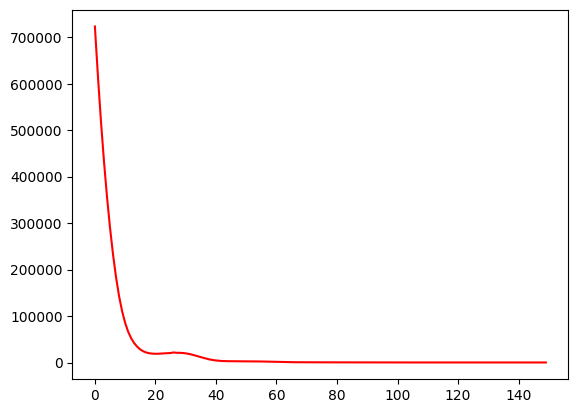

 30%|███       | 150/500 [00:34<01:09,  5.00it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  42.93785310734464
Dataset Name:  disney , AUC Score (contextual):  30.57851239669421
Dataset Name:  disney , AUC Score (structural):  52.844036697247695
Dataset Name:  disney , AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney , AUC Score (structure type):  51.07201759208356
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


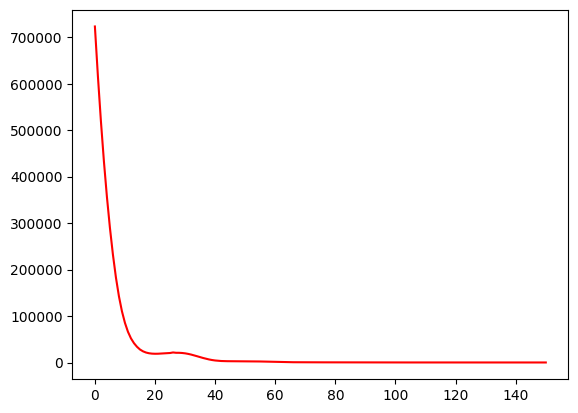

 30%|███       | 151/500 [00:35<01:11,  4.91it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.07909604519774
Dataset Name:  disney , AUC Score (contextual):  30.027548209366383
Dataset Name:  disney , AUC Score (structural):  52.844036697247695
Dataset Name:  disney , AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney , AUC Score (structure type):  51.126992853216045
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


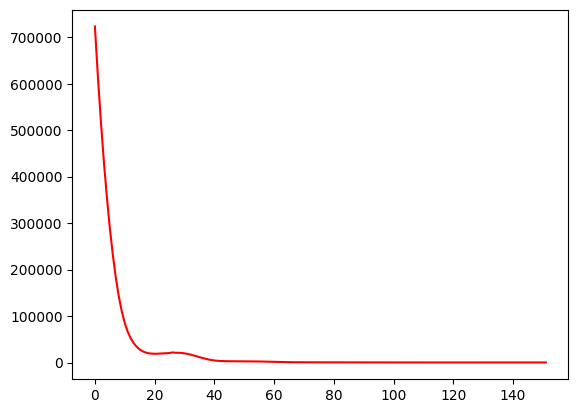

 30%|███       | 152/500 [00:35<01:11,  4.85it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.220338983050844
Dataset Name:  disney , AUC Score (contextual):  29.752066115702476
Dataset Name:  disney , AUC Score (structural):  52.90519877675841
Dataset Name:  disney , AUC Score (joint-type):  57.30027548209367
Dataset Name:  disney , AUC Score (structure type):  51.23694337548103
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.30027548209367
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


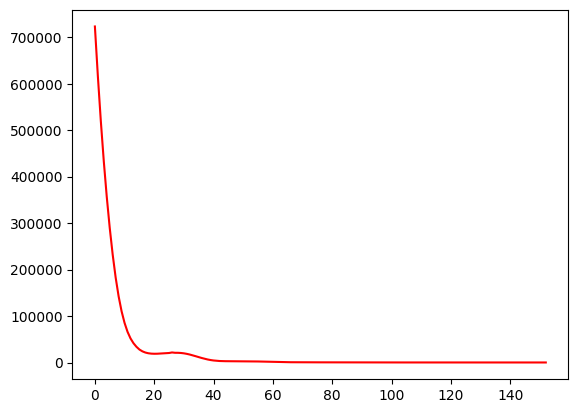

 31%|███       | 153/500 [00:35<01:11,  4.82it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.07909604519774
Dataset Name:  disney , AUC Score (contextual):  29.201101928374655
Dataset Name:  disney , AUC Score (structural):  53.027522935779814
Dataset Name:  disney , AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney , AUC Score (structure type):  51.23694337548103
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


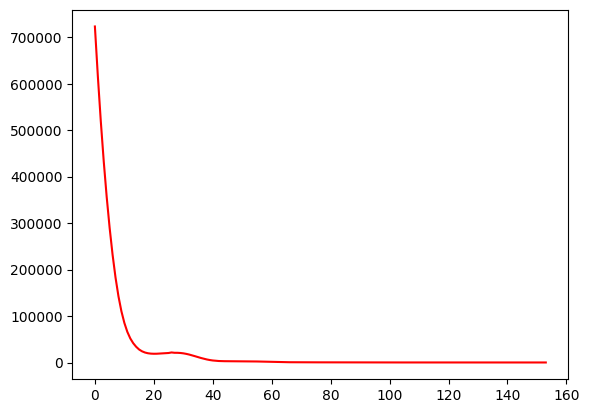

 31%|███       | 154/500 [00:35<01:12,  4.76it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.07909604519774
Dataset Name:  disney , AUC Score (contextual):  29.201101928374655
Dataset Name:  disney , AUC Score (structural):  53.333333333333336
Dataset Name:  disney , AUC Score (joint-type):  56.47382920110192
Dataset Name:  disney , AUC Score (structure type):  51.456844420010995
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.47382920110192
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


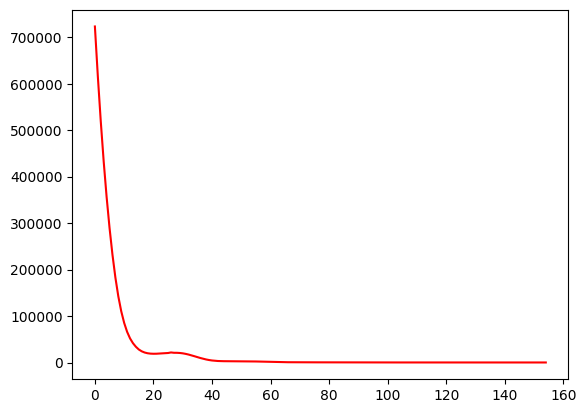

 31%|███       | 155/500 [00:35<01:13,  4.69it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.36158192090395
Dataset Name:  disney , AUC Score (contextual):  29.201101928374655
Dataset Name:  disney , AUC Score (structural):  53.39449541284404
Dataset Name:  disney , AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney , AUC Score (structure type):  51.56679494227598
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


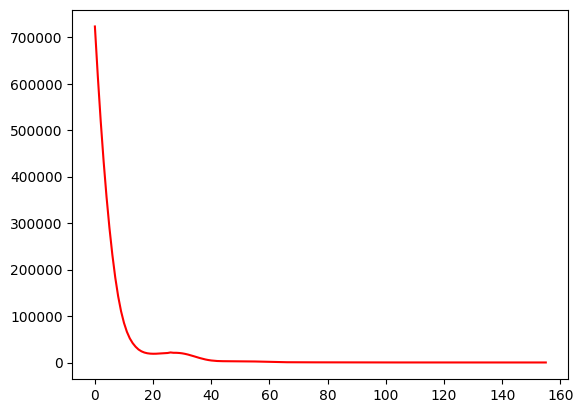

 31%|███       | 156/500 [00:36<01:13,  4.69it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.36158192090396
Dataset Name:  disney , AUC Score (contextual):  28.650137741046827
Dataset Name:  disney , AUC Score (structural):  53.57798165137615
Dataset Name:  disney , AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney , AUC Score (structure type):  51.73172072567345
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.74931129476584
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


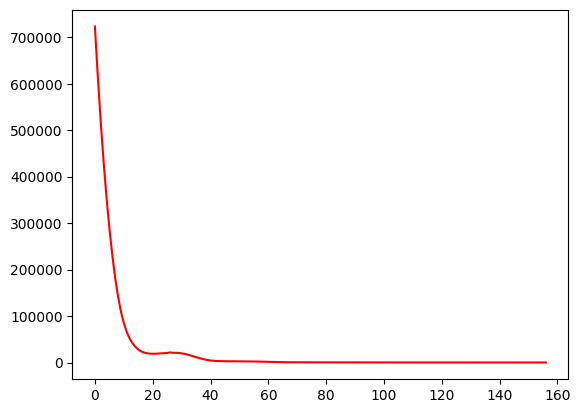

 31%|███▏      | 157/500 [00:36<01:10,  4.88it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.220338983050844
Dataset Name:  disney , AUC Score (contextual):  28.09917355371901
Dataset Name:  disney , AUC Score (structural):  53.63914373088685
Dataset Name:  disney , AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney , AUC Score (structure type):  51.84167124793843
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


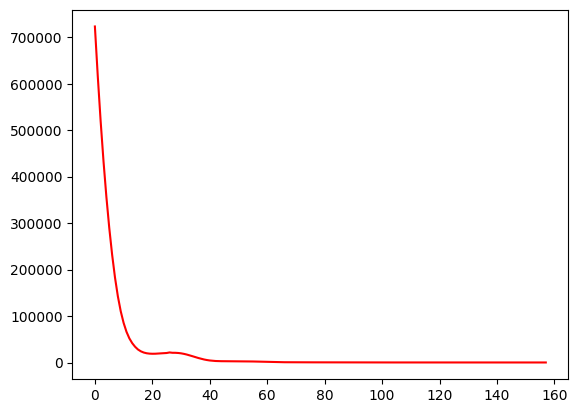

 32%|███▏      | 158/500 [00:36<01:08,  5.02it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.36158192090396
Dataset Name:  disney , AUC Score (contextual):  28.37465564738292
Dataset Name:  disney , AUC Score (structural):  53.70030581039755
Dataset Name:  disney , AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney , AUC Score (structure type):  51.89664650907092
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


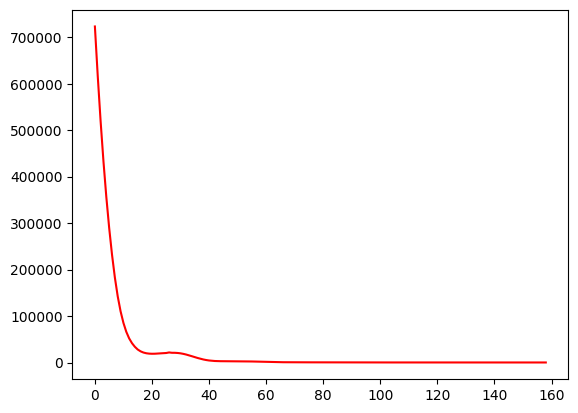

 32%|███▏      | 159/500 [00:36<01:06,  5.15it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.220338983050844
Dataset Name:  disney , AUC Score (contextual):  27.823691460055088
Dataset Name:  disney , AUC Score (structural):  53.88379204892967
Dataset Name:  disney , AUC Score (joint-type):  57.30027548209367
Dataset Name:  disney , AUC Score (structure type):  52.11654755360088
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.30027548209367
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


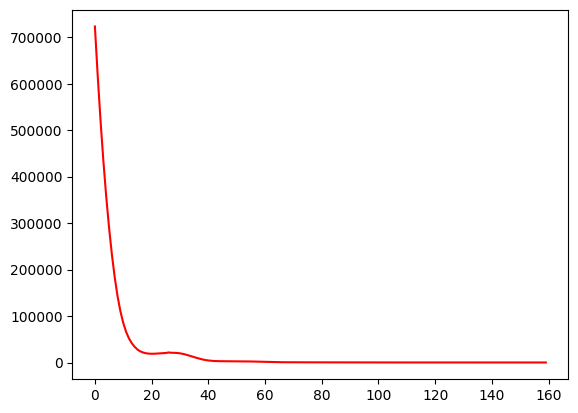

 32%|███▏      | 160/500 [00:37<01:40,  3.39it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.36158192090396
Dataset Name:  disney , AUC Score (contextual):  28.099173553719005
Dataset Name:  disney , AUC Score (structural):  53.88379204892966
Dataset Name:  disney , AUC Score (joint-type):  56.473829201101935
Dataset Name:  disney , AUC Score (structure type):  51.9516217702034
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.473829201101935
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


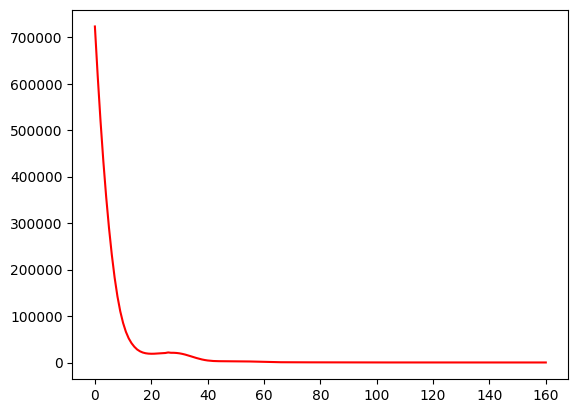

 32%|███▏      | 161/500 [00:37<01:40,  3.36it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.07909604519774
Dataset Name:  disney , AUC Score (contextual):  27.548209366391184
Dataset Name:  disney , AUC Score (structural):  53.88379204892966
Dataset Name:  disney , AUC Score (joint-type):  56.473829201101935
Dataset Name:  disney , AUC Score (structure type):  51.9516217702034
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.473829201101935
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


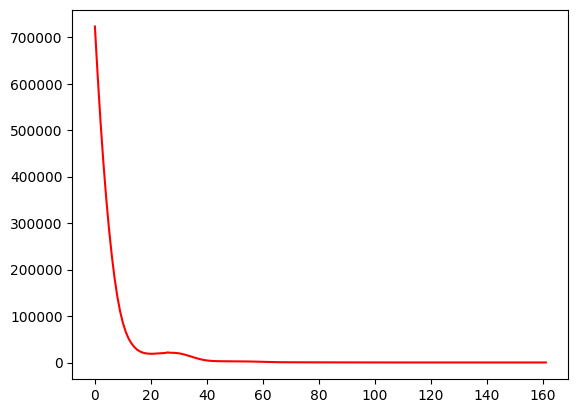

 32%|███▏      | 162/500 [00:37<01:37,  3.48it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.22033898305085
Dataset Name:  disney , AUC Score (contextual):  27.823691460055095
Dataset Name:  disney , AUC Score (structural):  53.88379204892966
Dataset Name:  disney , AUC Score (joint-type):  56.473829201101935
Dataset Name:  disney , AUC Score (structure type):  51.9516217702034
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.473829201101935
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


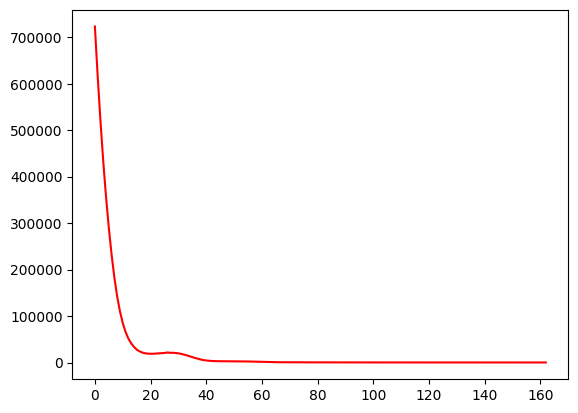

 33%|███▎      | 163/500 [00:38<01:30,  3.74it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.22033898305085
Dataset Name:  disney , AUC Score (contextual):  27.823691460055095
Dataset Name:  disney , AUC Score (structural):  53.822629969418955
Dataset Name:  disney , AUC Score (joint-type):  56.473829201101935
Dataset Name:  disney , AUC Score (structure type):  51.89664650907092
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.473829201101935
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


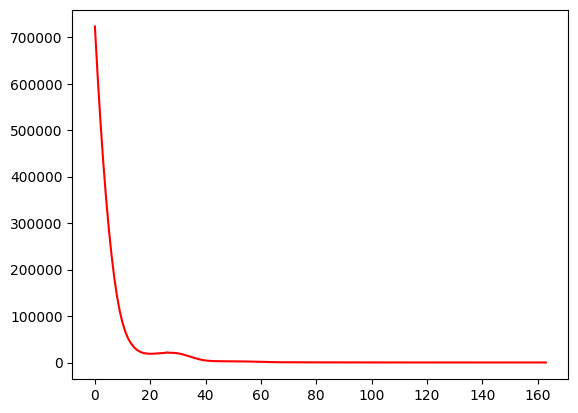

 33%|███▎      | 164/500 [00:38<01:25,  3.95it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.36158192090396
Dataset Name:  disney , AUC Score (contextual):  27.823691460055095
Dataset Name:  disney , AUC Score (structural):  53.82262996941897
Dataset Name:  disney , AUC Score (joint-type):  56.473829201101935
Dataset Name:  disney , AUC Score (structure type):  51.89664650907092
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.473829201101935
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


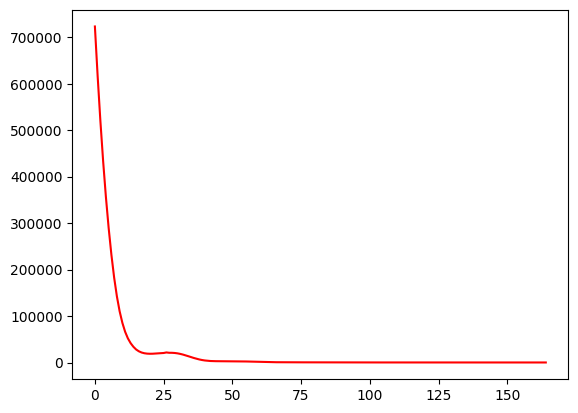

 33%|███▎      | 165/500 [00:38<01:17,  4.30it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.50282485875706
Dataset Name:  disney , AUC Score (contextual):  28.099173553719005
Dataset Name:  disney , AUC Score (structural):  54.006116207951074
Dataset Name:  disney , AUC Score (joint-type):  56.473829201101935
Dataset Name:  disney , AUC Score (structure type):  52.0615722924684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  56.473829201101935
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


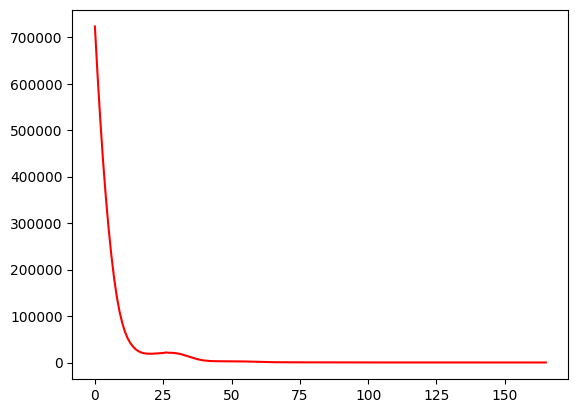

 33%|███▎      | 166/500 [00:38<01:11,  4.64it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  43.78531073446328
Dataset Name:  disney , AUC Score (contextual):  28.650137741046834
Dataset Name:  disney , AUC Score (structural):  54.006116207951074
Dataset Name:  disney , AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney , AUC Score (structure type):  52.17152281473337
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


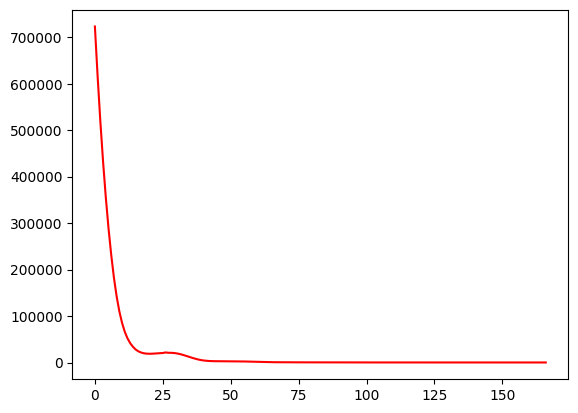

 33%|███▎      | 167/500 [00:38<01:08,  4.87it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  44.35028248587571
Dataset Name:  disney , AUC Score (contextual):  28.925619834710748
Dataset Name:  disney , AUC Score (structural):  54.37308868501529
Dataset Name:  disney , AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney , AUC Score (structure type):  52.50137438152832
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.02479338842975
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


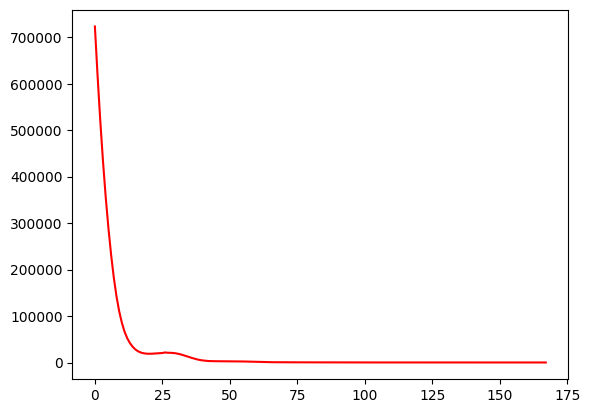

 34%|███▎      | 168/500 [00:39<01:06,  5.03it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  45.05649717514124
Dataset Name:  disney , AUC Score (contextual):  30.02754820936639
Dataset Name:  disney , AUC Score (structural):  54.43425076452599
Dataset Name:  disney , AUC Score (joint-type):  57.30027548209367
Dataset Name:  disney , AUC Score (structure type):  52.6113249037933
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.30027548209367
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


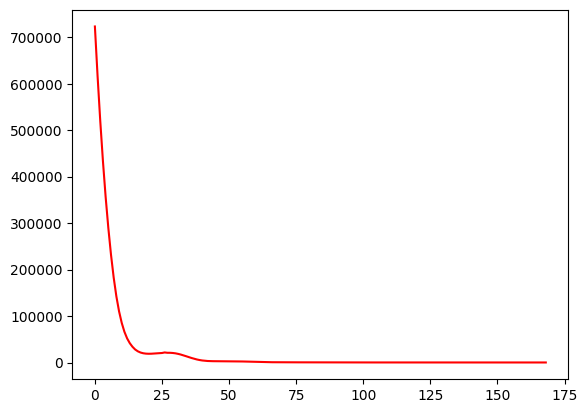

 34%|███▍      | 169/500 [00:39<01:04,  5.15it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  45.48022598870056
Dataset Name:  disney , AUC Score (contextual):  30.853994490358122
Dataset Name:  disney , AUC Score (structural):  54.31192660550459
Dataset Name:  disney , AUC Score (joint-type):  57.851239669421496
Dataset Name:  disney , AUC Score (structure type):  52.6113249037933
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  57.851239669421496
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


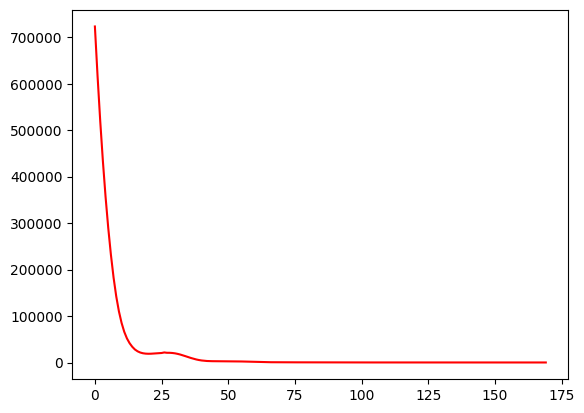

 34%|███▍      | 170/500 [00:39<01:03,  5.21it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  45.90395480225989
Dataset Name:  disney , AUC Score (contextual):  31.95592286501377
Dataset Name:  disney , AUC Score (structural):  54.43425076452599
Dataset Name:  disney , AUC Score (joint-type):  58.1267217630854
Dataset Name:  disney , AUC Score (structure type):  52.77625068719076
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  58.1267217630854
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


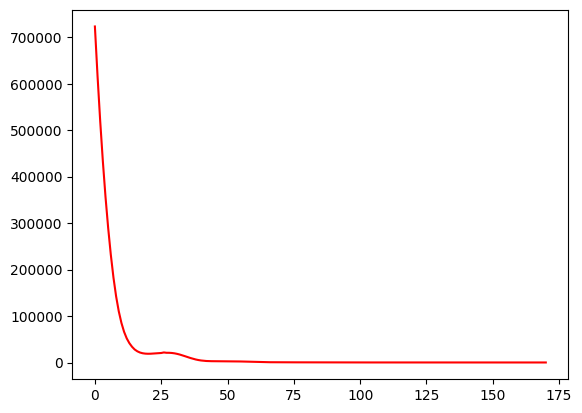

 34%|███▍      | 171/500 [00:39<01:02,  5.26it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  45.90395480225989
Dataset Name:  disney , AUC Score (contextual):  32.231404958677686
Dataset Name:  disney , AUC Score (structural):  54.49541284403669
Dataset Name:  disney , AUC Score (joint-type):  58.1267217630854
Dataset Name:  disney , AUC Score (structure type):  52.83122594832326
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  58.1267217630854
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


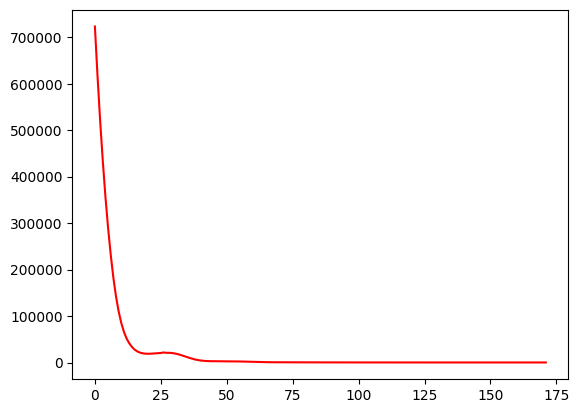

 34%|███▍      | 172/500 [00:39<01:02,  5.27it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  46.75141242937853
Dataset Name:  disney , AUC Score (contextual):  32.5068870523416
Dataset Name:  disney , AUC Score (structural):  54.49541284403669
Dataset Name:  disney , AUC Score (joint-type):  59.22865013774105
Dataset Name:  disney , AUC Score (structure type):  53.05112699285321
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  59.22865013774105
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


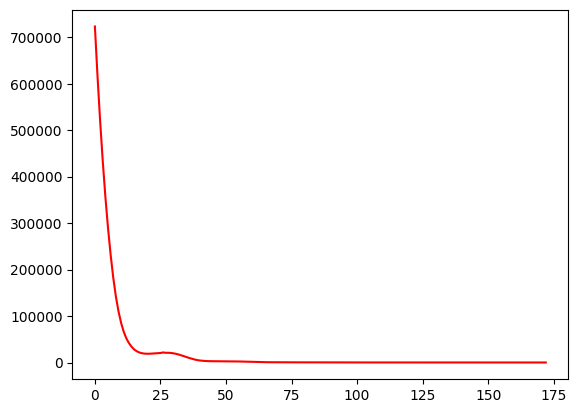

 35%|███▍      | 173/500 [00:39<01:04,  5.05it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.31638418079096
Dataset Name:  disney , AUC Score (contextual):  32.5068870523416
Dataset Name:  disney , AUC Score (structural):  54.556574923547394
Dataset Name:  disney , AUC Score (joint-type):  60.33057851239669
Dataset Name:  disney , AUC Score (structure type):  53.326003298515666
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  60.33057851239669
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


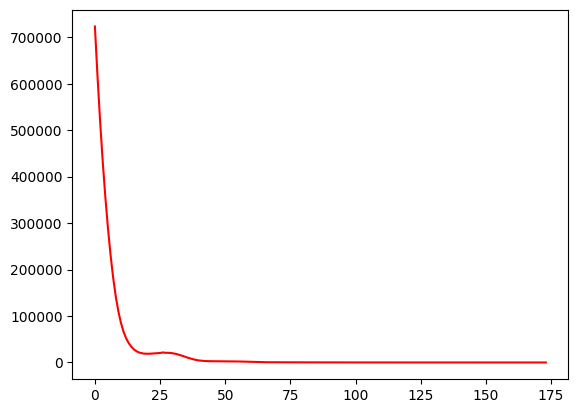

 35%|███▍      | 174/500 [00:40<01:03,  5.16it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  47.8813559322034
Dataset Name:  disney , AUC Score (contextual):  33.057851239669425
Dataset Name:  disney , AUC Score (structural):  54.92354740061162
Dataset Name:  disney , AUC Score (joint-type):  60.88154269972452
Dataset Name:  disney , AUC Score (structure type):  53.7658053875756
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  60.88154269972452
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


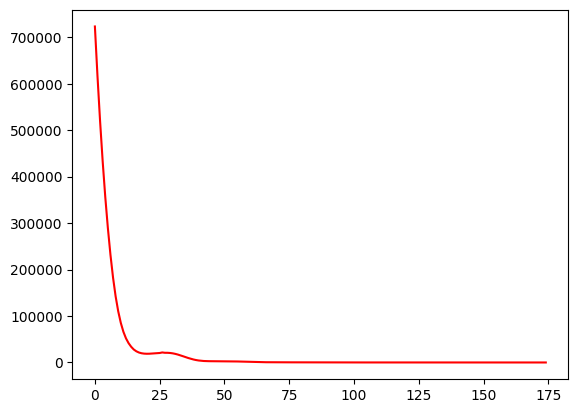

 35%|███▌      | 175/500 [00:40<01:07,  4.79it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  48.30508474576271
Dataset Name:  disney , AUC Score (contextual):  33.333333333333336
Dataset Name:  disney , AUC Score (structural):  54.862385321100916
Dataset Name:  disney , AUC Score (joint-type):  61.70798898071625
Dataset Name:  disney , AUC Score (structure type):  53.87575590984057
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  61.70798898071625
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


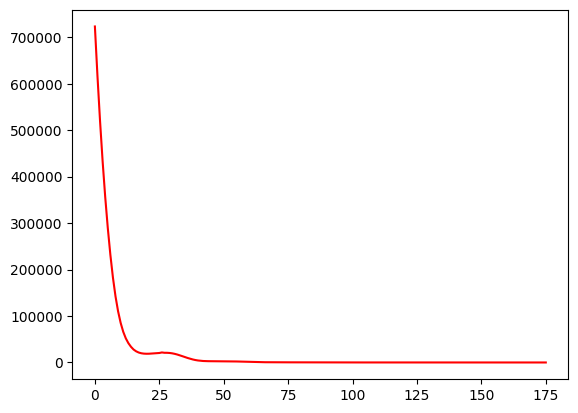

 35%|███▌      | 176/500 [00:40<01:07,  4.77it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  48.728813559322035
Dataset Name:  disney , AUC Score (contextual):  33.333333333333336
Dataset Name:  disney , AUC Score (structural):  55.290519877675834
Dataset Name:  disney , AUC Score (joint-type):  63.08539944903582
Dataset Name:  disney , AUC Score (structure type):  54.53545904343046
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  63.08539944903582
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


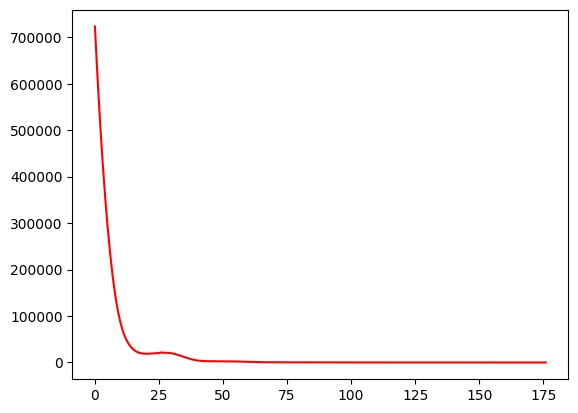

 35%|███▌      | 177/500 [00:40<01:04,  4.99it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  49.01129943502825
Dataset Name:  disney , AUC Score (contextual):  33.333333333333336
Dataset Name:  disney , AUC Score (structural):  55.35168195718655
Dataset Name:  disney , AUC Score (joint-type):  64.18732782369146
Dataset Name:  disney , AUC Score (structure type):  54.81033534909291
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  64.18732782369146
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


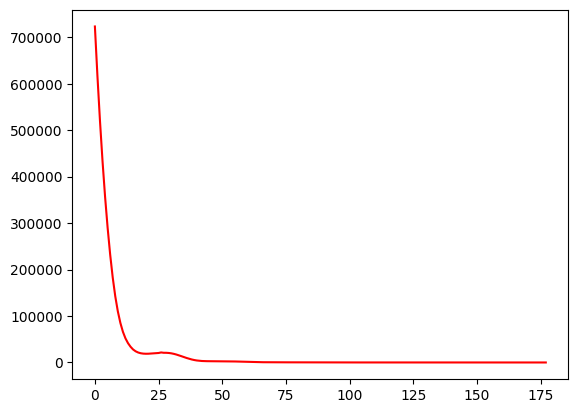

 36%|███▌      | 178/500 [00:41<01:08,  4.70it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  49.293785310734464
Dataset Name:  disney , AUC Score (contextual):  33.608815426997246
Dataset Name:  disney , AUC Score (structural):  55.290519877675834
Dataset Name:  disney , AUC Score (joint-type):  65.56473829201101
Dataset Name:  disney , AUC Score (structure type):  55.030236393622864
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  65.56473829201101
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


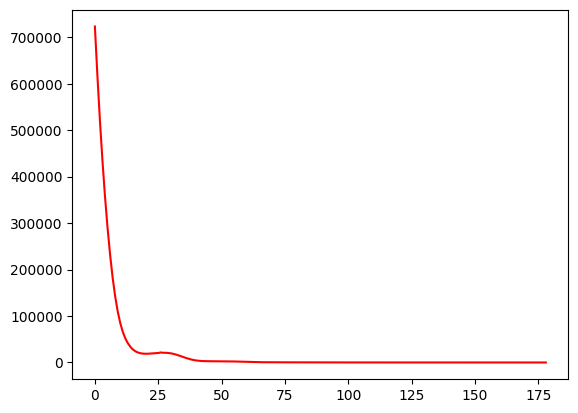

 36%|███▌      | 179/500 [00:41<01:04,  4.94it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  49.717514124293785
Dataset Name:  disney , AUC Score (contextual):  33.608815426997246
Dataset Name:  disney , AUC Score (structural):  55.290519877675834
Dataset Name:  disney , AUC Score (joint-type):  66.94214876033058
Dataset Name:  disney , AUC Score (structure type):  55.30511269928533
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  66.94214876033058
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


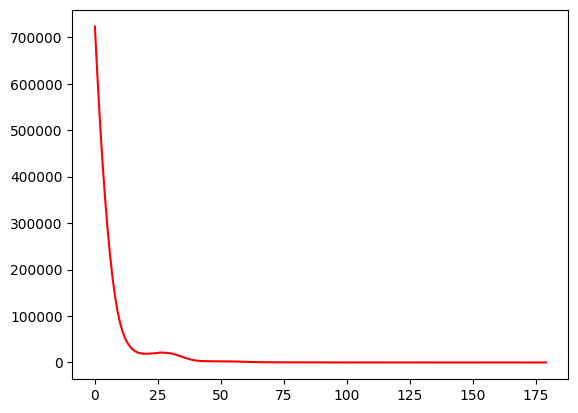

 36%|███▌      | 180/500 [00:41<01:02,  5.09it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  49.57627118644068
Dataset Name:  disney , AUC Score (contextual):  33.33333333333333
Dataset Name:  disney , AUC Score (structural):  55.596330275229356
Dataset Name:  disney , AUC Score (joint-type):  68.04407713498622
Dataset Name:  disney , AUC Score (structure type):  55.79989004947774
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  68.04407713498622
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


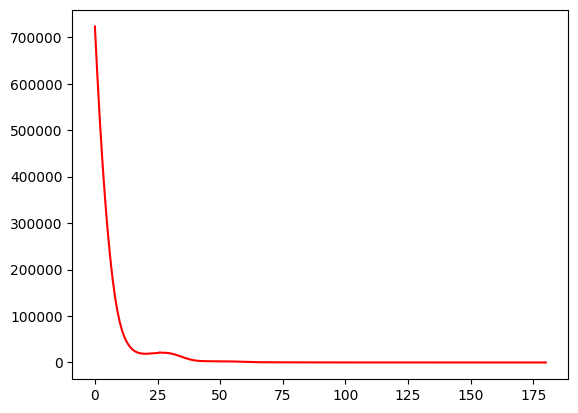

 36%|███▌      | 181/500 [00:41<01:03,  5.06it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.42372881355932
Dataset Name:  disney , AUC Score (contextual):  32.5068870523416
Dataset Name:  disney , AUC Score (structural):  55.290519877675834
Dataset Name:  disney , AUC Score (joint-type):  68.87052341597797
Dataset Name:  disney , AUC Score (structure type):  55.68993952721275
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  68.87052341597797
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


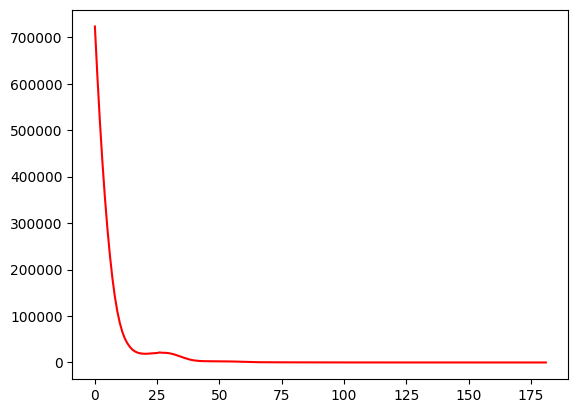

 36%|███▋      | 182/500 [00:41<01:07,  4.68it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.564971751412436
Dataset Name:  disney , AUC Score (contextual):  32.231404958677686
Dataset Name:  disney , AUC Score (structural):  55.77981651376146
Dataset Name:  disney , AUC Score (joint-type):  68.87052341597797
Dataset Name:  disney , AUC Score (structure type):  56.129741616272675
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  68.87052341597797
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


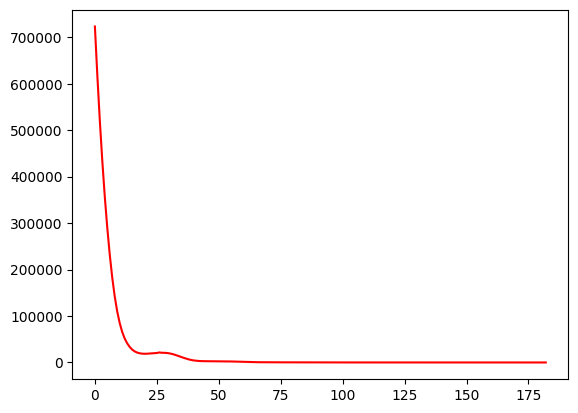

 37%|███▋      | 183/500 [00:42<01:05,  4.83it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.564971751412436
Dataset Name:  disney , AUC Score (contextual):  31.955922865013775
Dataset Name:  disney , AUC Score (structural):  56.085626911314975
Dataset Name:  disney , AUC Score (joint-type):  69.42148760330578
Dataset Name:  disney , AUC Score (structure type):  56.51456844420011
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  69.42148760330578
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


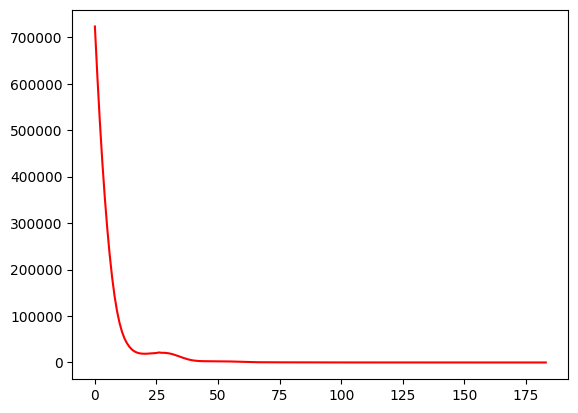

 37%|███▋      | 184/500 [00:42<01:03,  5.01it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.42372881355932
Dataset Name:  disney , AUC Score (contextual):  31.68044077134986
Dataset Name:  disney , AUC Score (structural):  56.26911314984709
Dataset Name:  disney , AUC Score (joint-type):  69.69696969696969
Dataset Name:  disney , AUC Score (structure type):  56.73446948873008
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  69.69696969696969
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


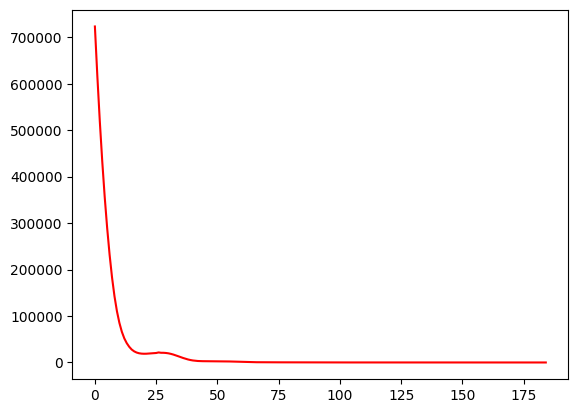

 37%|███▋      | 185/500 [00:42<01:08,  4.58it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.28248587570621
Dataset Name:  disney , AUC Score (contextual):  31.404958677685947
Dataset Name:  disney , AUC Score (structural):  56.26911314984709
Dataset Name:  disney , AUC Score (joint-type):  69.69696969696969
Dataset Name:  disney , AUC Score (structure type):  56.734469488730085
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  69.69696969696969
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


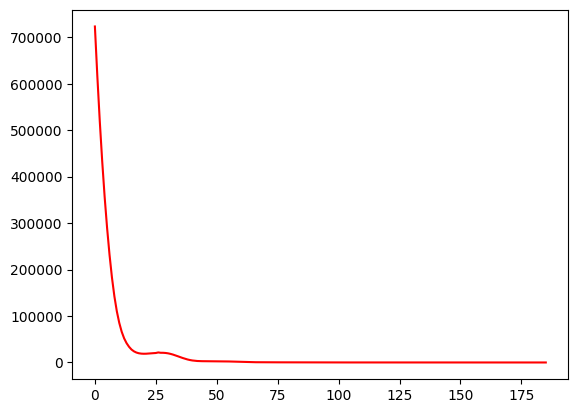

 37%|███▋      | 186/500 [00:42<01:04,  4.84it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.1412429378531
Dataset Name:  disney , AUC Score (contextual):  30.853994490358126
Dataset Name:  disney , AUC Score (structural):  56.146788990825684
Dataset Name:  disney , AUC Score (joint-type):  69.69696969696969
Dataset Name:  disney , AUC Score (structure type):  56.6245189664651
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  69.69696969696969
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


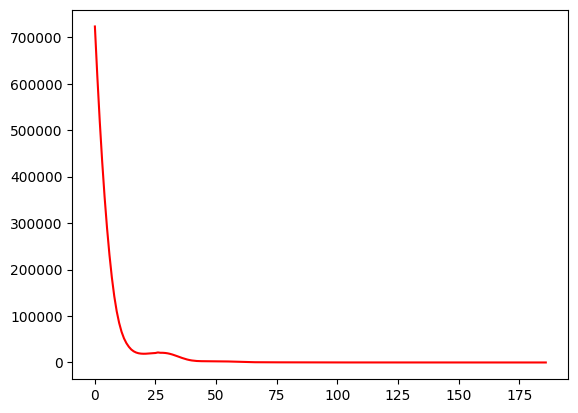

 37%|███▋      | 187/500 [00:42<01:02,  5.02it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.282485875706215
Dataset Name:  disney , AUC Score (contextual):  31.129476584022036
Dataset Name:  disney , AUC Score (structural):  56.20795107033638
Dataset Name:  disney , AUC Score (joint-type):  70.24793388429752
Dataset Name:  disney , AUC Score (structure type):  56.78944474986256
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  70.24793388429752
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


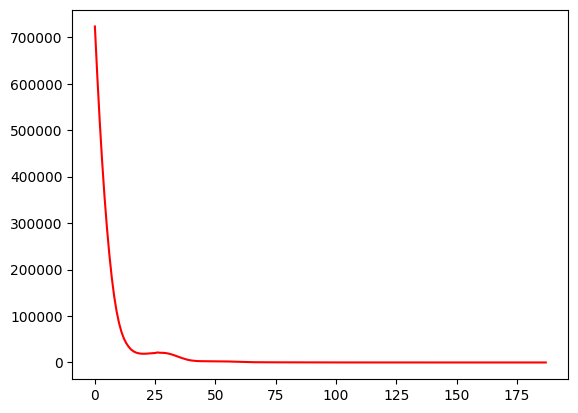

 38%|███▊      | 188/500 [00:43<01:11,  4.34it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.42372881355932
Dataset Name:  disney , AUC Score (contextual):  30.853994490358126
Dataset Name:  disney , AUC Score (structural):  56.269113149847094
Dataset Name:  disney , AUC Score (joint-type):  70.52341597796143
Dataset Name:  disney , AUC Score (structure type):  56.84442001099506
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  70.52341597796143
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


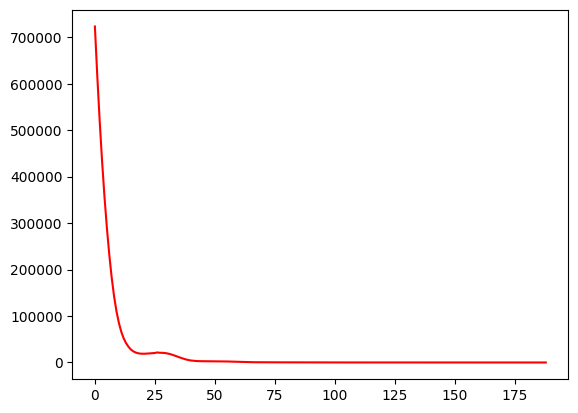

 38%|███▊      | 189/500 [00:43<01:19,  3.92it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.282485875706215
Dataset Name:  disney , AUC Score (contextual):  30.853994490358126
Dataset Name:  disney , AUC Score (structural):  56.330275229357795
Dataset Name:  disney , AUC Score (joint-type):  70.52341597796143
Dataset Name:  disney , AUC Score (structure type):  56.89939527212755
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  70.52341597796143
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


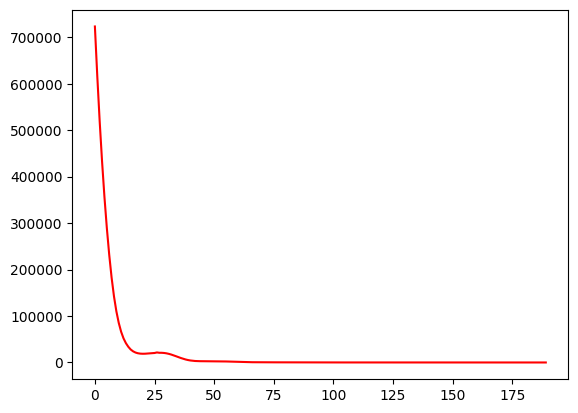

 38%|███▊      | 190/500 [00:43<01:18,  3.93it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.847457627118644
Dataset Name:  disney , AUC Score (contextual):  30.853994490358126
Dataset Name:  disney , AUC Score (structural):  56.5137614678899
Dataset Name:  disney , AUC Score (joint-type):  71.07438016528926
Dataset Name:  disney , AUC Score (structure type):  57.17427157779
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  71.07438016528926
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


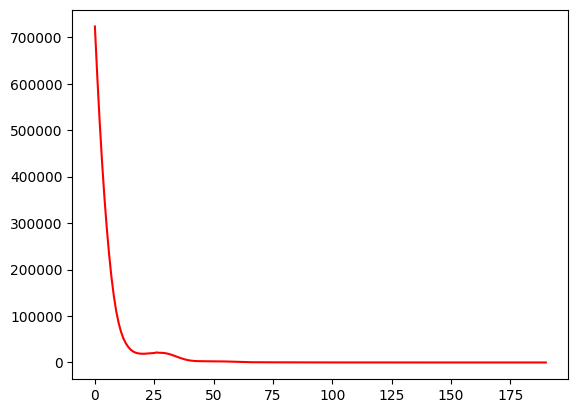

 38%|███▊      | 191/500 [00:44<01:22,  3.76it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  50.988700564971744
Dataset Name:  disney , AUC Score (contextual):  30.853994490358126
Dataset Name:  disney , AUC Score (structural):  56.5137614678899
Dataset Name:  disney , AUC Score (joint-type):  71.900826446281
Dataset Name:  disney , AUC Score (structure type):  57.339197361187466
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  71.900826446281
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


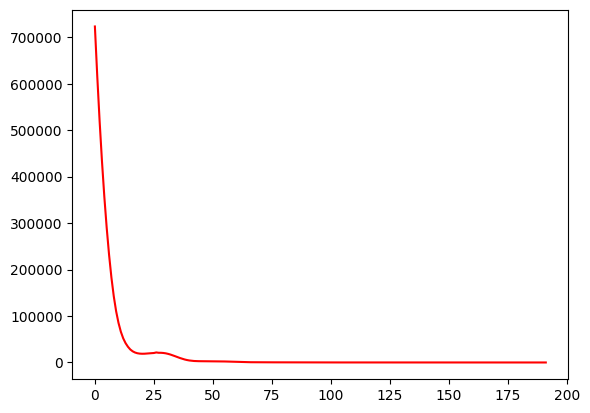

 38%|███▊      | 192/500 [00:44<01:14,  4.15it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  51.12994350282486
Dataset Name:  disney , AUC Score (contextual):  30.853994490358126
Dataset Name:  disney , AUC Score (structural):  56.574923547400616
Dataset Name:  disney , AUC Score (joint-type):  71.900826446281
Dataset Name:  disney , AUC Score (structure type):  57.394172622319964
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  71.900826446281
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


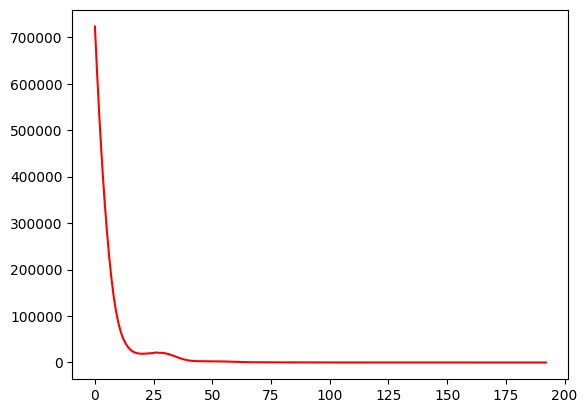

 39%|███▊      | 193/500 [00:44<01:08,  4.46it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  51.55367231638418
Dataset Name:  disney , AUC Score (contextual):  30.853994490358126
Dataset Name:  disney , AUC Score (structural):  56.3914373088685
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney , AUC Score (structure type):  57.394172622319964
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


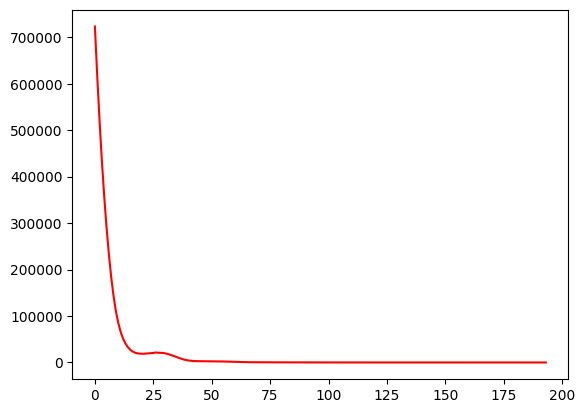

 39%|███▉      | 194/500 [00:44<01:04,  4.73it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.1186440677966
Dataset Name:  disney , AUC Score (contextual):  31.40495867768595
Dataset Name:  disney , AUC Score (structural):  56.513761467889914
Dataset Name:  disney , AUC Score (joint-type):  73.00275482093664
Dataset Name:  disney , AUC Score (structure type):  57.55909840571742
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.00275482093664
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


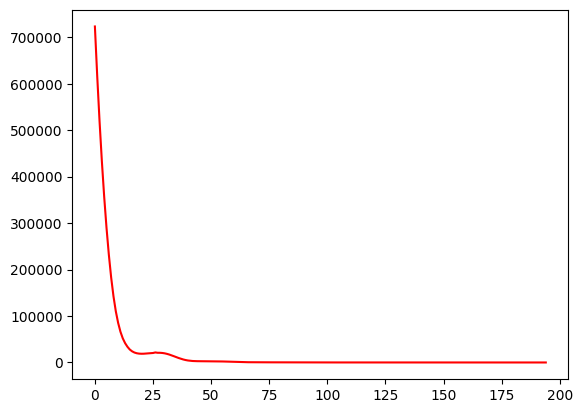

 39%|███▉      | 195/500 [00:44<01:04,  4.71it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.259887005649716
Dataset Name:  disney , AUC Score (contextual):  31.955922865013775
Dataset Name:  disney , AUC Score (structural):  56.5137614678899
Dataset Name:  disney , AUC Score (joint-type):  73.00275482093664
Dataset Name:  disney , AUC Score (structure type):  57.55909840571742
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.00275482093664
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


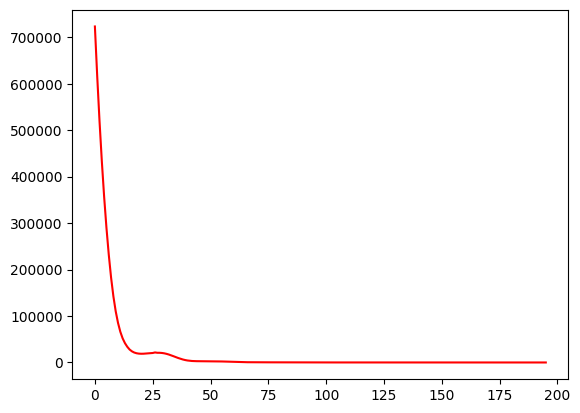

 39%|███▉      | 196/500 [00:45<01:10,  4.34it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.40112994350282
Dataset Name:  disney , AUC Score (contextual):  31.955922865013775
Dataset Name:  disney , AUC Score (structural):  56.63608562691132
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney , AUC Score (structure type):  57.6690489279824
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


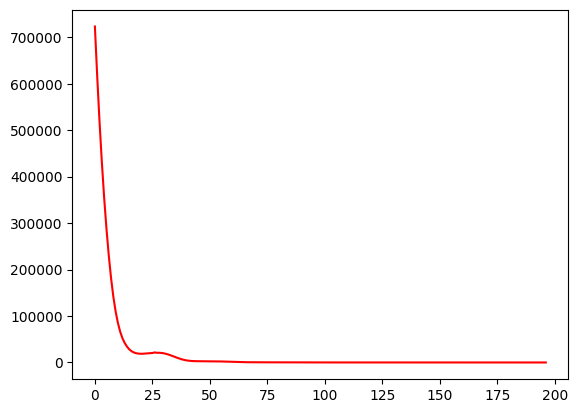

 39%|███▉      | 197/500 [00:45<01:12,  4.15it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.40112994350282
Dataset Name:  disney , AUC Score (contextual):  32.5068870523416
Dataset Name:  disney , AUC Score (structural):  56.4525993883792
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney , AUC Score (structure type):  57.50412314458494
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


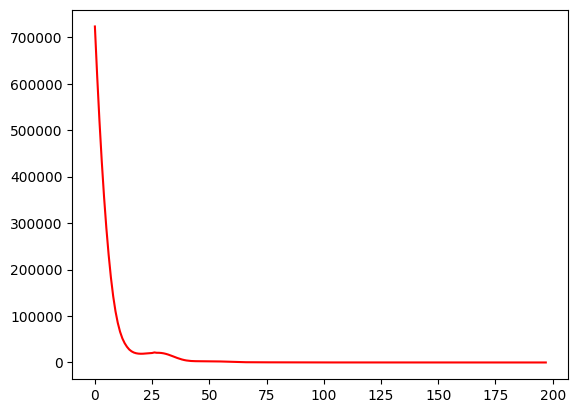

 40%|███▉      | 198/500 [00:45<01:17,  3.89it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.54237288135594
Dataset Name:  disney , AUC Score (contextual):  32.78236914600551
Dataset Name:  disney , AUC Score (structural):  56.330275229357795
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney , AUC Score (structure type):  57.394172622319964
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


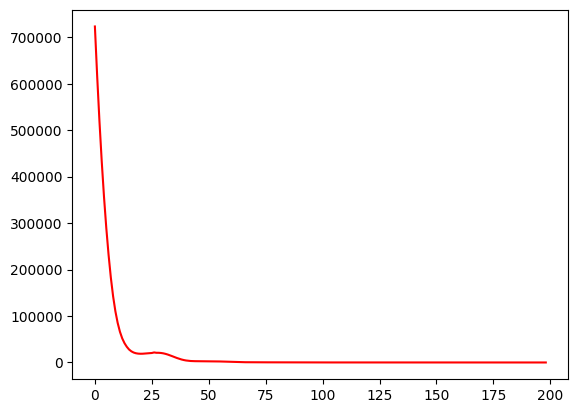

 40%|███▉      | 199/500 [00:45<01:17,  3.89it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  52.82485875706215
Dataset Name:  disney , AUC Score (contextual):  33.057851239669425
Dataset Name:  disney , AUC Score (structural):  56.5137614678899
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney , AUC Score (structure type):  57.559098405717435
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


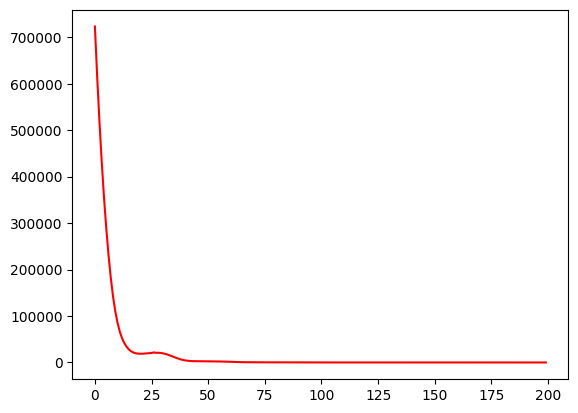

 40%|████      | 200/500 [00:46<01:20,  3.72it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  53.10734463276836
Dataset Name:  disney , AUC Score (contextual):  33.88429752066116
Dataset Name:  disney , AUC Score (structural):  56.63608562691132
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney , AUC Score (structure type):  57.669048927982416
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


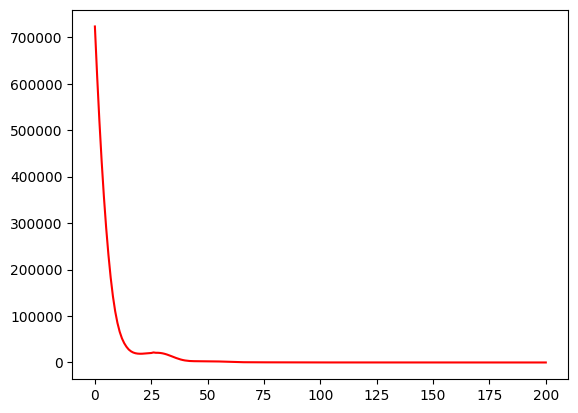

 40%|████      | 201/500 [00:46<01:22,  3.61it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  53.248587570621474
Dataset Name:  disney , AUC Score (contextual):  33.88429752066116
Dataset Name:  disney , AUC Score (structural):  56.69724770642202
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney , AUC Score (structure type):  57.7240241891149
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


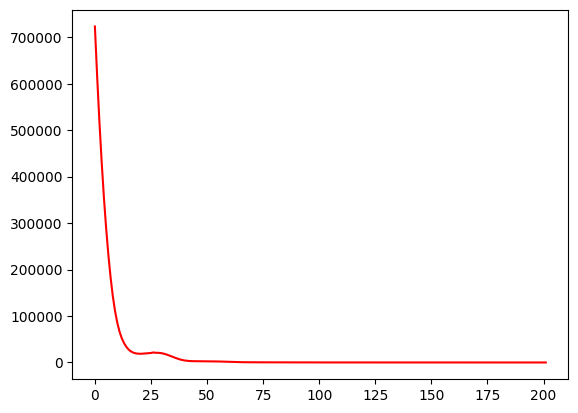

 40%|████      | 202/500 [00:46<01:27,  3.39it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  53.53107344632768
Dataset Name:  disney , AUC Score (contextual):  34.15977961432507
Dataset Name:  disney , AUC Score (structural):  56.81957186544343
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney , AUC Score (structure type):  57.83397471137989
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727273
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


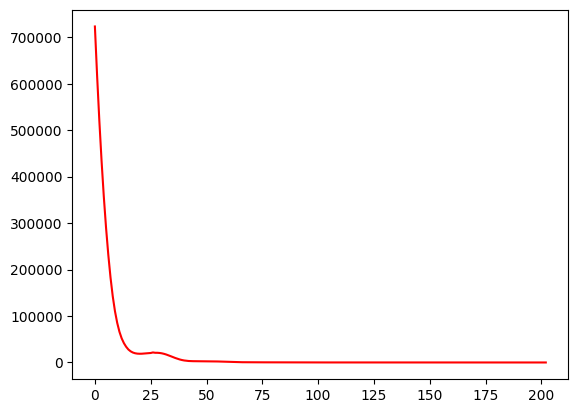

 41%|████      | 203/500 [00:47<01:24,  3.50it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  53.954802259887
Dataset Name:  disney , AUC Score (contextual):  34.98622589531681
Dataset Name:  disney , AUC Score (structural):  56.574923547400616
Dataset Name:  disney , AUC Score (joint-type):  72.1763085399449
Dataset Name:  disney , AUC Score (structure type):  57.50412314458494
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.1763085399449
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


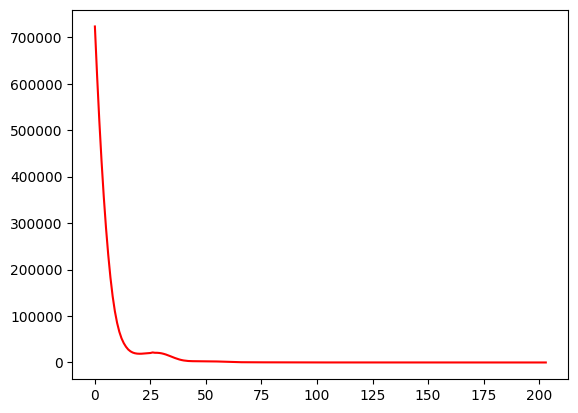

 41%|████      | 204/500 [00:47<01:18,  3.75it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  53.672316384180796
Dataset Name:  disney , AUC Score (contextual):  34.98622589531681
Dataset Name:  disney , AUC Score (structural):  56.574923547400616
Dataset Name:  disney , AUC Score (joint-type):  72.1763085399449
Dataset Name:  disney , AUC Score (structure type):  57.50412314458494
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.1763085399449
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


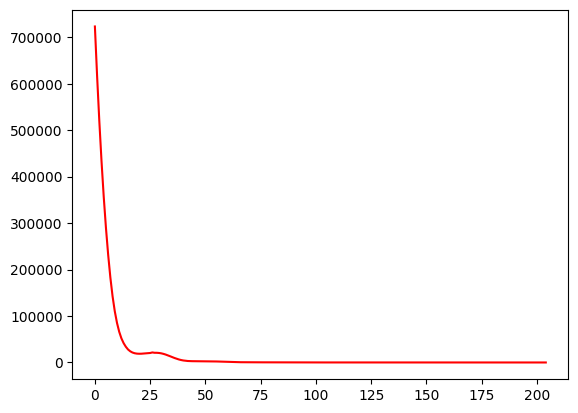

 41%|████      | 205/500 [00:47<01:13,  3.99it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  53.813559322033896
Dataset Name:  disney , AUC Score (contextual):  35.26170798898072
Dataset Name:  disney , AUC Score (structural):  56.5137614678899
Dataset Name:  disney , AUC Score (joint-type):  72.45179063360881
Dataset Name:  disney , AUC Score (structure type):  57.55909840571742
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.45179063360881
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


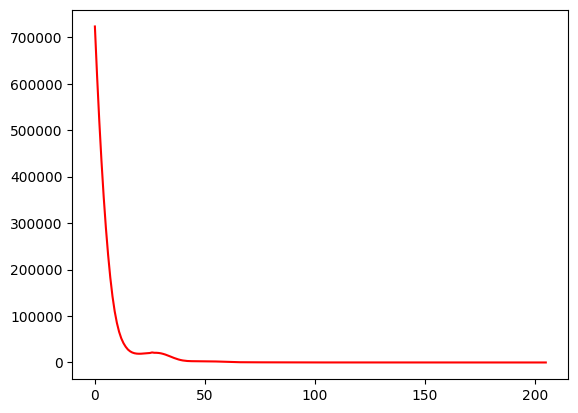

 41%|████      | 206/500 [00:47<01:06,  4.42it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  54.23728813559322
Dataset Name:  disney , AUC Score (contextual):  35.53719008264463
Dataset Name:  disney , AUC Score (structural):  56.63608562691132
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney , AUC Score (structure type):  57.7240241891149
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


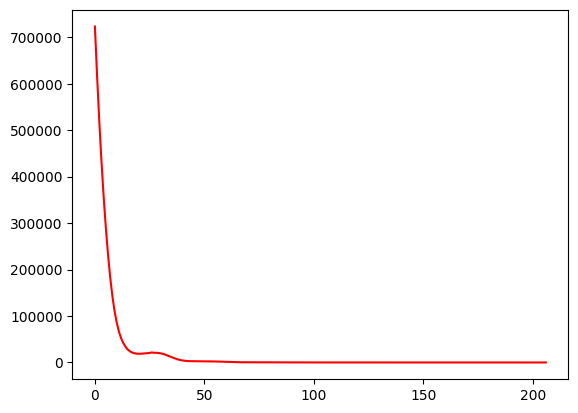

 41%|████▏     | 207/500 [00:47<01:03,  4.58it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  54.661016949152554
Dataset Name:  disney , AUC Score (contextual):  36.91460055096419
Dataset Name:  disney , AUC Score (structural):  56.63608562691132
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney , AUC Score (structure type):  57.7240241891149
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


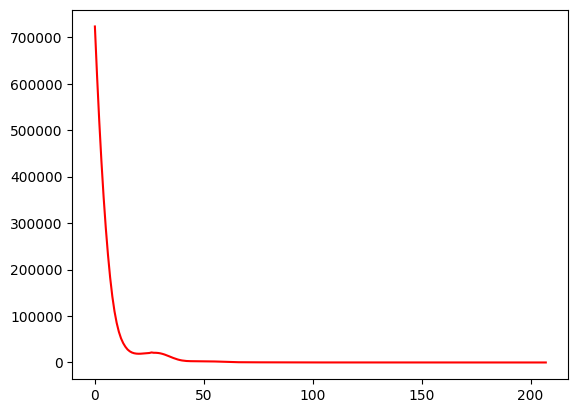

 42%|████▏     | 208/500 [00:48<01:27,  3.34it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  54.51977401129944
Dataset Name:  disney , AUC Score (contextual):  36.91460055096419
Dataset Name:  disney , AUC Score (structural):  56.81957186544343
Dataset Name:  disney , AUC Score (joint-type):  72.45179063360881
Dataset Name:  disney , AUC Score (structure type):  57.833974711379874
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.45179063360881
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


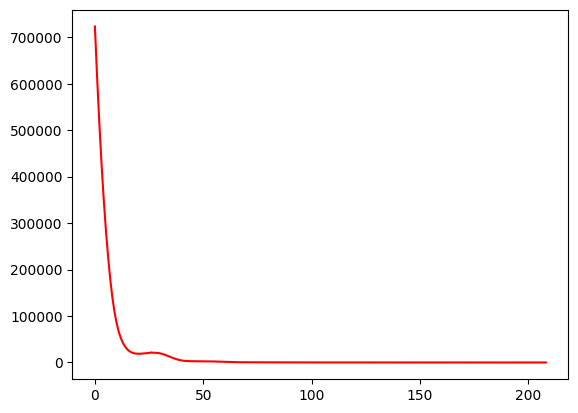

 42%|████▏     | 209/500 [00:48<01:18,  3.70it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  54.80225988700565
Dataset Name:  disney , AUC Score (contextual):  37.74104683195592
Dataset Name:  disney , AUC Score (structural):  56.574923547400616
Dataset Name:  disney , AUC Score (joint-type):  72.45179063360881
Dataset Name:  disney , AUC Score (structure type):  57.61407366684992
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.45179063360881
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


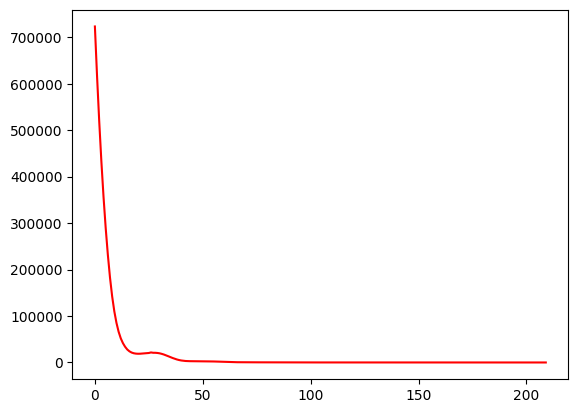

 42%|████▏     | 210/500 [00:48<01:12,  3.98it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  54.94350282485876
Dataset Name:  disney , AUC Score (contextual):  38.29201101928375
Dataset Name:  disney , AUC Score (structural):  56.574923547400616
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney , AUC Score (structure type):  57.669048927982416
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


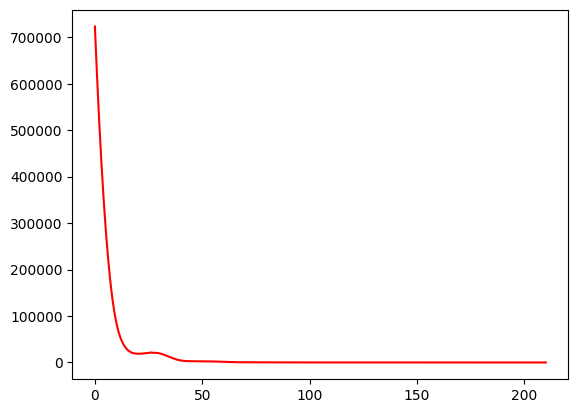

 42%|████▏     | 211/500 [00:48<01:08,  4.22it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  54.802259887005654
Dataset Name:  disney , AUC Score (contextual):  38.01652892561984
Dataset Name:  disney , AUC Score (structural):  56.513761467889914
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney , AUC Score (structure type):  57.61407366684992
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


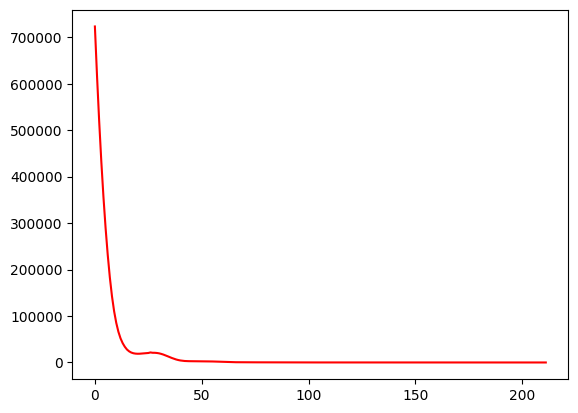

 42%|████▏     | 212/500 [00:49<01:09,  4.13it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  54.80225988700565
Dataset Name:  disney , AUC Score (contextual):  38.56749311294765
Dataset Name:  disney , AUC Score (structural):  56.574923547400616
Dataset Name:  disney , AUC Score (joint-type):  72.45179063360881
Dataset Name:  disney , AUC Score (structure type):  57.61407366684992
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.45179063360881
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


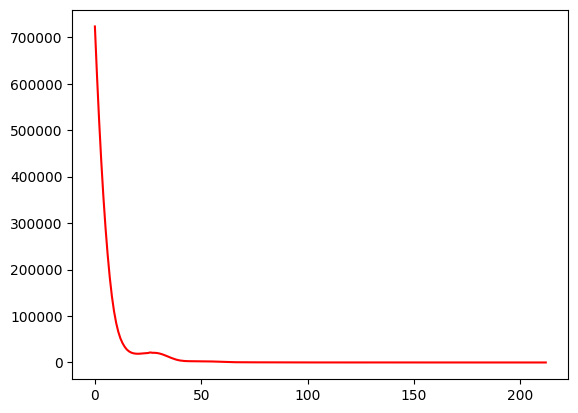

 43%|████▎     | 213/500 [00:49<01:04,  4.47it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  54.80225988700565
Dataset Name:  disney , AUC Score (contextual):  38.84297520661157
Dataset Name:  disney , AUC Score (structural):  56.513761467889914
Dataset Name:  disney , AUC Score (joint-type):  72.45179063360881
Dataset Name:  disney , AUC Score (structure type):  57.55909840571742
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.45179063360881
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


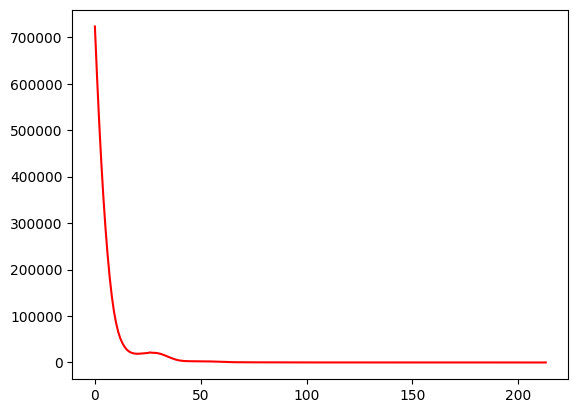

 43%|████▎     | 214/500 [00:49<00:59,  4.82it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  54.80225988700565
Dataset Name:  disney , AUC Score (contextual):  38.84297520661158
Dataset Name:  disney , AUC Score (structural):  56.513761467889914
Dataset Name:  disney , AUC Score (joint-type):  72.45179063360881
Dataset Name:  disney , AUC Score (structure type):  57.55909840571742
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.45179063360881
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


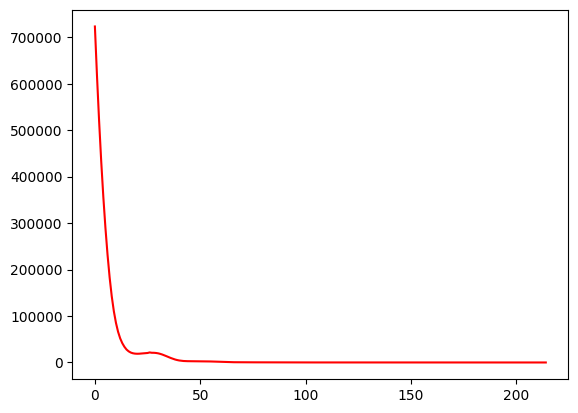

 43%|████▎     | 215/500 [00:49<00:58,  4.87it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  55.22598870056497
Dataset Name:  disney , AUC Score (contextual):  38.84297520661158
Dataset Name:  disney , AUC Score (structural):  56.69724770642202
Dataset Name:  disney , AUC Score (joint-type):  73.00275482093663
Dataset Name:  disney , AUC Score (structure type):  57.77899945024738
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.00275482093663
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


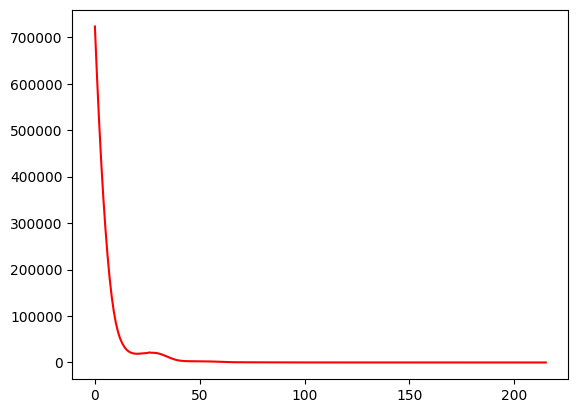

 43%|████▎     | 216/500 [00:49<00:55,  5.11it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  55.367231638418076
Dataset Name:  disney , AUC Score (contextual):  39.11845730027548
Dataset Name:  disney , AUC Score (structural):  56.81957186544342
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney , AUC Score (structure type):  57.833974711379874
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


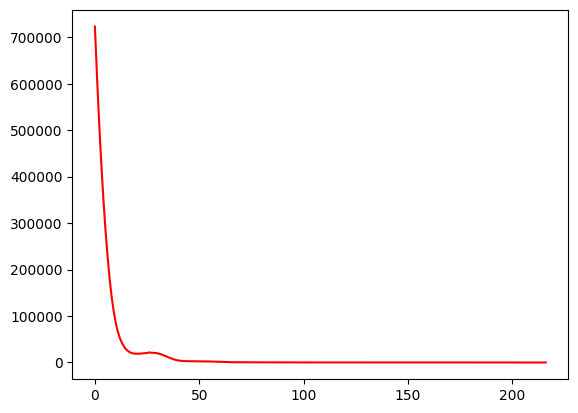

 43%|████▎     | 217/500 [00:50<00:52,  5.34it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  55.367231638418076
Dataset Name:  disney , AUC Score (contextual):  39.11845730027548
Dataset Name:  disney , AUC Score (structural):  56.75840978593272
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney , AUC Score (structure type):  57.77899945024738
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


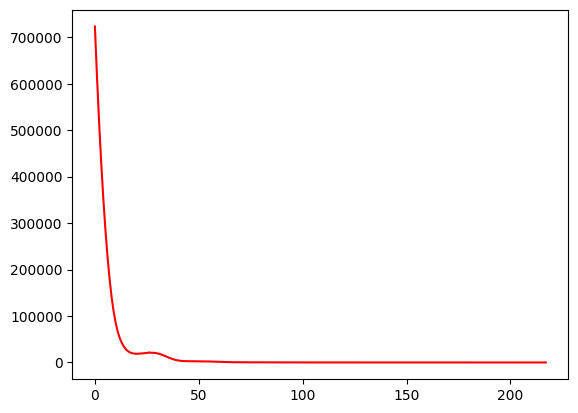

 44%|████▎     | 218/500 [00:50<00:51,  5.49it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  55.50847457627118
Dataset Name:  disney , AUC Score (contextual):  39.11845730027548
Dataset Name:  disney , AUC Score (structural):  56.81957186544342
Dataset Name:  disney , AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney , AUC Score (structure type):  57.833974711379874
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  72.72727272727272
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


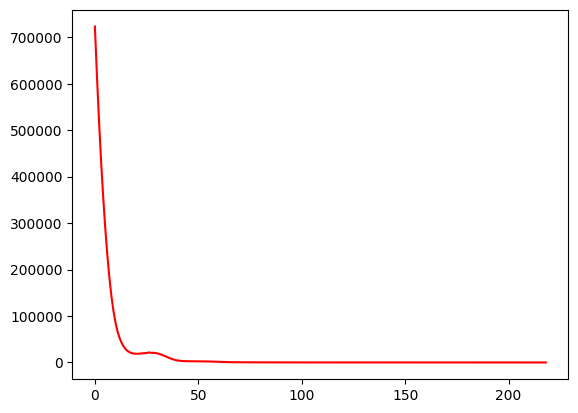

 44%|████▍     | 219/500 [00:50<00:56,  4.95it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  55.7909604519774
Dataset Name:  disney , AUC Score (contextual):  39.11845730027548
Dataset Name:  disney , AUC Score (structural):  57.125382262996936
Dataset Name:  disney , AUC Score (joint-type):  73.00275482093663
Dataset Name:  disney , AUC Score (structure type):  58.163826278174824
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.00275482093663
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


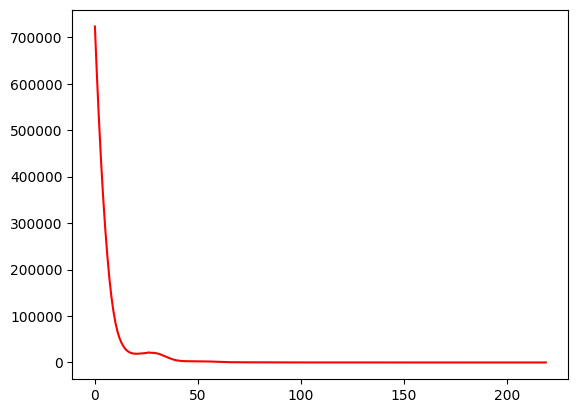

 44%|████▍     | 220/500 [00:50<00:53,  5.22it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  55.7909604519774
Dataset Name:  disney , AUC Score (contextual):  39.39393939393939
Dataset Name:  disney , AUC Score (structural):  57.064220183486235
Dataset Name:  disney , AUC Score (joint-type):  73.00275482093663
Dataset Name:  disney , AUC Score (structure type):  58.108851017042326
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.00275482093663
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


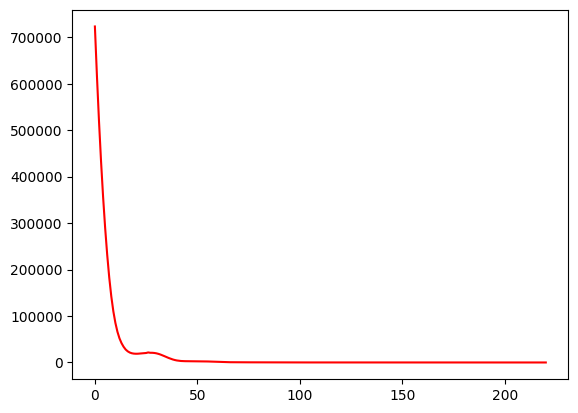

 44%|████▍     | 221/500 [00:50<01:01,  4.57it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  56.21468926553672
Dataset Name:  disney , AUC Score (contextual):  39.66942148760331
Dataset Name:  disney , AUC Score (structural):  57.12538226299695
Dataset Name:  disney , AUC Score (joint-type):  73.27823691460055
Dataset Name:  disney , AUC Score (structure type):  58.21880153930731
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.27823691460055
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


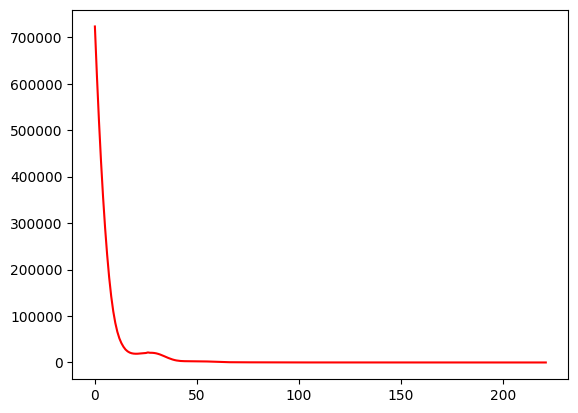

 44%|████▍     | 222/500 [00:51<01:03,  4.37it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  56.63841807909604
Dataset Name:  disney , AUC Score (contextual):  39.66942148760331
Dataset Name:  disney , AUC Score (structural):  57.18654434250765
Dataset Name:  disney , AUC Score (joint-type):  73.27823691460055
Dataset Name:  disney , AUC Score (structure type):  58.273776800439805
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.27823691460055
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


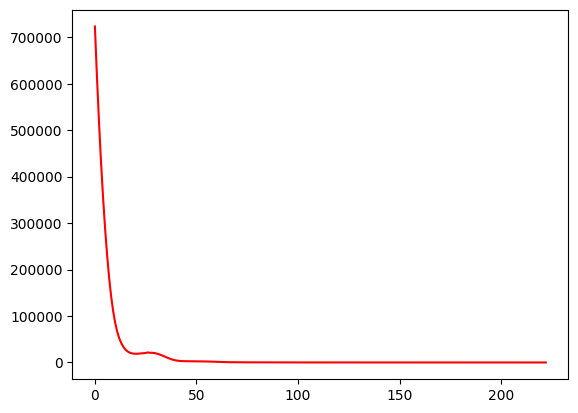

 45%|████▍     | 223/500 [00:51<01:04,  4.30it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  56.63841807909604
Dataset Name:  disney , AUC Score (contextual):  40.22038567493112
Dataset Name:  disney , AUC Score (structural):  57.064220183486235
Dataset Name:  disney , AUC Score (joint-type):  73.27823691460055
Dataset Name:  disney , AUC Score (structure type):  58.163826278174824
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.27823691460055
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


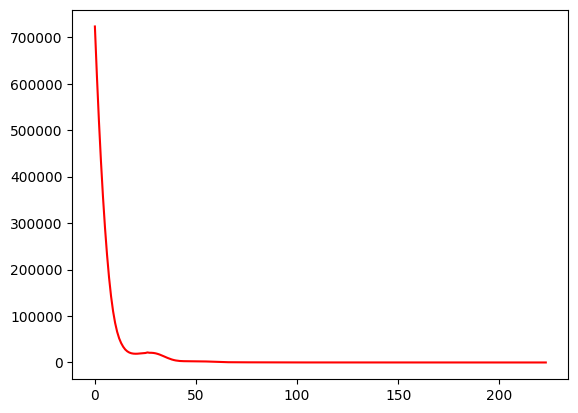

 45%|████▍     | 224/500 [00:51<01:04,  4.25it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.34463276836158
Dataset Name:  disney , AUC Score (contextual):  40.49586776859504
Dataset Name:  disney , AUC Score (structural):  57.308868501529055
Dataset Name:  disney , AUC Score (joint-type):  73.82920110192836
Dataset Name:  disney , AUC Score (structure type):  58.49367784496976
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.82920110192836
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


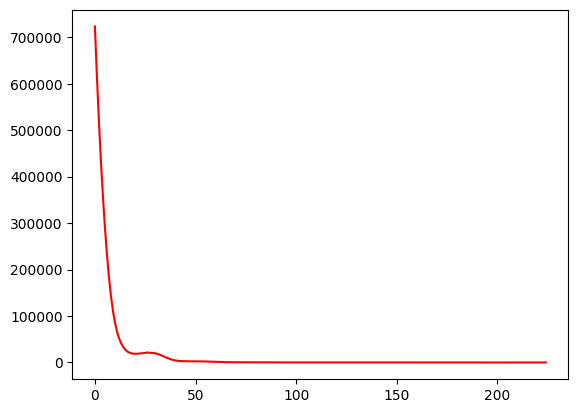

 45%|████▌     | 225/500 [00:51<00:59,  4.65it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.7683615819209
Dataset Name:  disney , AUC Score (contextual):  41.32231404958678
Dataset Name:  disney , AUC Score (structural):  57.37003058103976
Dataset Name:  disney , AUC Score (joint-type):  73.82920110192836
Dataset Name:  disney , AUC Score (structure type):  58.54865310610224
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  73.82920110192836
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


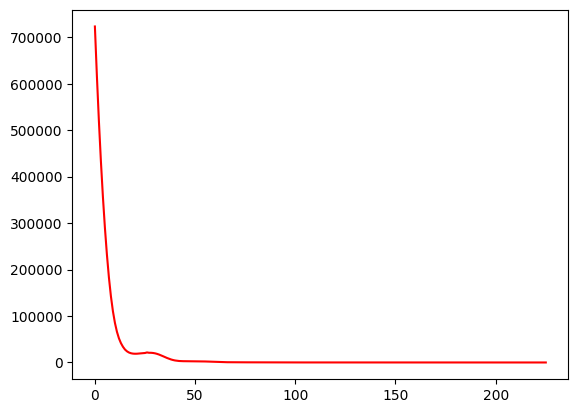

 45%|████▌     | 226/500 [00:52<00:55,  4.98it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  57.909604519774014
Dataset Name:  disney , AUC Score (contextual):  41.32231404958678
Dataset Name:  disney , AUC Score (structural):  57.43119266055046
Dataset Name:  disney , AUC Score (joint-type):  74.10468319559229
Dataset Name:  disney , AUC Score (structure type):  58.65860362836723
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  74.10468319559229
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


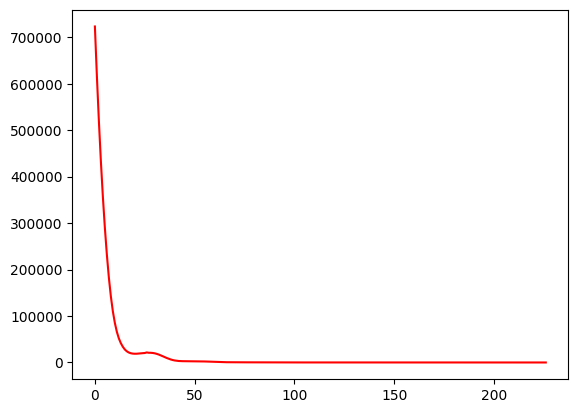

 45%|████▌     | 227/500 [00:52<01:01,  4.44it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.05084745762712
Dataset Name:  disney , AUC Score (contextual):  41.32231404958678
Dataset Name:  disney , AUC Score (structural):  57.55351681957186
Dataset Name:  disney , AUC Score (joint-type):  74.10468319559229
Dataset Name:  disney , AUC Score (structure type):  58.76855415063223
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  74.10468319559229
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


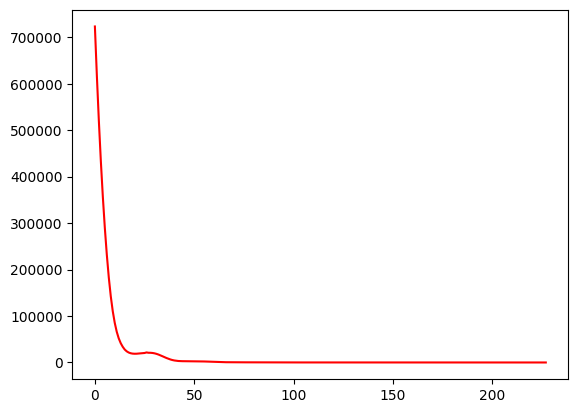

 46%|████▌     | 228/500 [00:52<00:59,  4.55it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.05084745762712
Dataset Name:  disney , AUC Score (contextual):  41.59779614325069
Dataset Name:  disney , AUC Score (structural):  57.55351681957186
Dataset Name:  disney , AUC Score (joint-type):  74.3801652892562
Dataset Name:  disney , AUC Score (structure type):  58.82352941176471
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  74.3801652892562
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


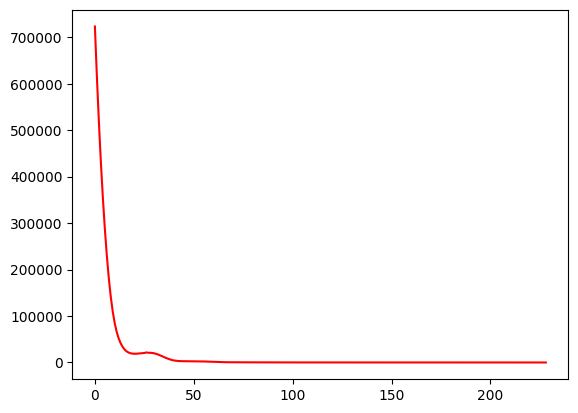

 46%|████▌     | 229/500 [00:52<00:55,  4.91it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.192090395480236
Dataset Name:  disney , AUC Score (contextual):  42.42424242424242
Dataset Name:  disney , AUC Score (structural):  57.73700305810397
Dataset Name:  disney , AUC Score (joint-type):  74.10468319559229
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  74.10468319559229
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


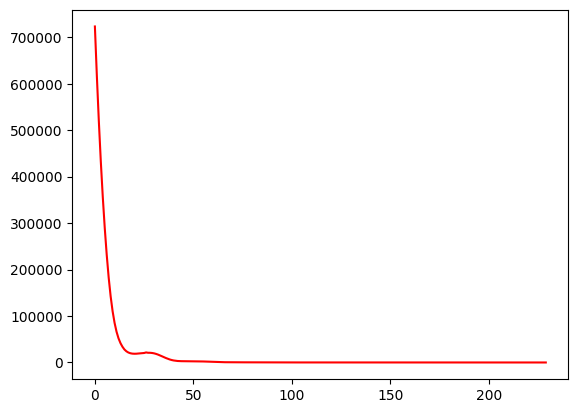

 46%|████▌     | 230/500 [00:52<00:55,  4.83it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.333333333333336
Dataset Name:  disney , AUC Score (contextual):  42.69972451790633
Dataset Name:  disney , AUC Score (structural):  57.67584097859327
Dataset Name:  disney , AUC Score (joint-type):  74.3801652892562
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  74.3801652892562
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


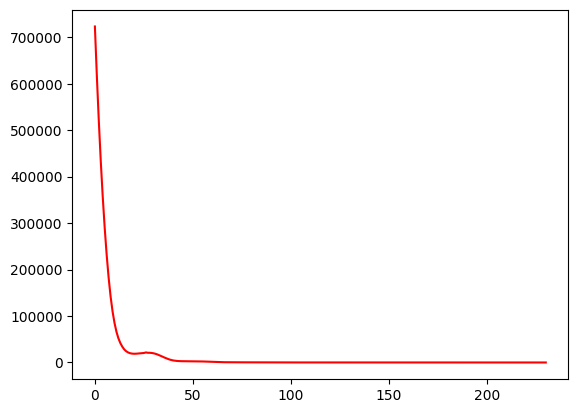

 46%|████▌     | 231/500 [00:53<01:05,  4.12it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.47457627118644
Dataset Name:  disney , AUC Score (contextual):  42.97520661157025
Dataset Name:  disney , AUC Score (structural):  57.49235474006116
Dataset Name:  disney , AUC Score (joint-type):  74.6556473829201
Dataset Name:  disney , AUC Score (structure type):  58.87850467289719
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  74.6556473829201
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


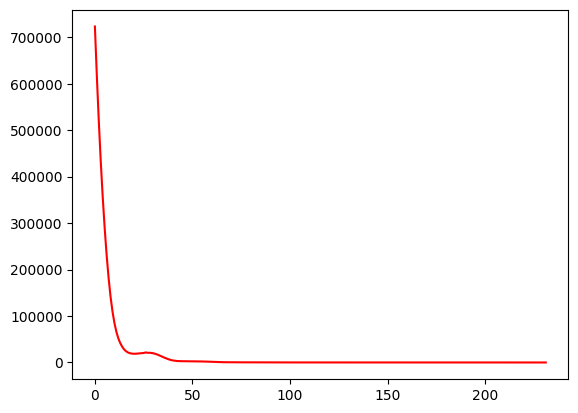

 46%|████▋     | 232/500 [00:53<01:06,  4.04it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  58.75706214689266
Dataset Name:  disney , AUC Score (contextual):  43.250688705234154
Dataset Name:  disney , AUC Score (structural):  57.55351681957186
Dataset Name:  disney , AUC Score (joint-type):  74.93112947658402
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  74.93112947658402
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


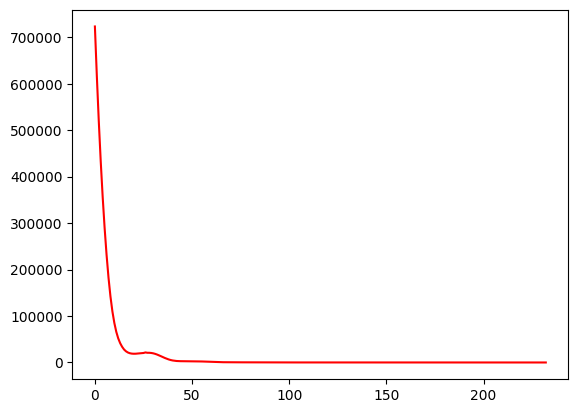

 47%|████▋     | 233/500 [00:53<01:03,  4.24it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.039548022598865
Dataset Name:  disney , AUC Score (contextual):  43.80165289256198
Dataset Name:  disney , AUC Score (structural):  57.49235474006116
Dataset Name:  disney , AUC Score (joint-type):  74.93112947658402
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  74.93112947658402
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


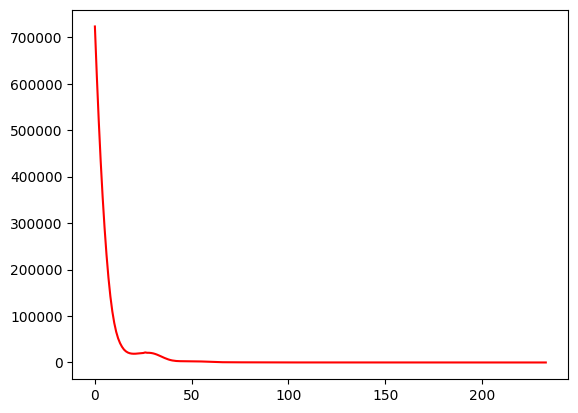

 47%|████▋     | 234/500 [00:53<00:59,  4.45it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.887005649717516
Dataset Name:  disney , AUC Score (contextual):  44.0771349862259
Dataset Name:  disney , AUC Score (structural):  57.61467889908257
Dataset Name:  disney , AUC Score (joint-type):  75.20661157024793
Dataset Name:  disney , AUC Score (structure type):  59.09840571742716
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.20661157024793
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


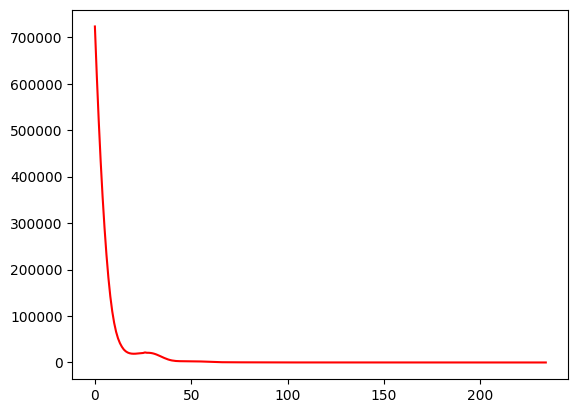

 47%|████▋     | 235/500 [00:54<00:59,  4.46it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  59.887005649717516
Dataset Name:  disney , AUC Score (contextual):  44.0771349862259
Dataset Name:  disney , AUC Score (structural):  57.61467889908257
Dataset Name:  disney , AUC Score (joint-type):  75.20661157024793
Dataset Name:  disney , AUC Score (structure type):  59.09840571742716
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.20661157024793
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


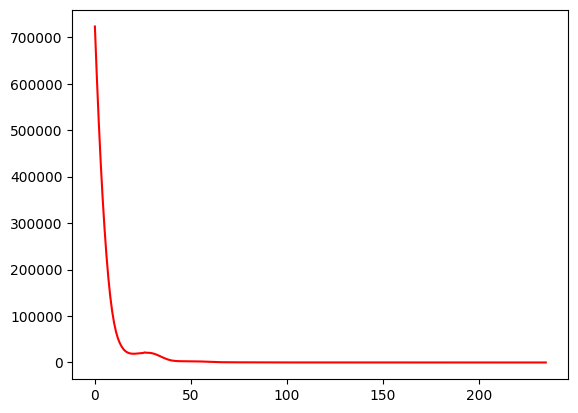

 47%|████▋     | 236/500 [00:54<00:57,  4.56it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  60.16949152542372
Dataset Name:  disney , AUC Score (contextual):  43.80165289256198
Dataset Name:  disney , AUC Score (structural):  57.49235474006117
Dataset Name:  disney , AUC Score (joint-type):  75.20661157024793
Dataset Name:  disney , AUC Score (structure type):  58.98845519516217
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.20661157024793
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


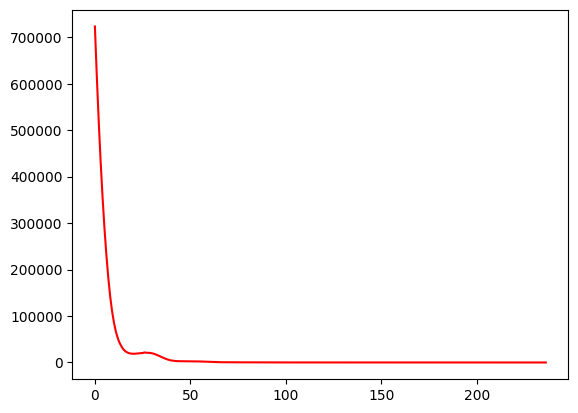

 47%|████▋     | 237/500 [00:54<00:53,  4.91it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  60.73446327683616
Dataset Name:  disney , AUC Score (contextual):  44.07713498622589
Dataset Name:  disney , AUC Score (structural):  57.67584097859327
Dataset Name:  disney , AUC Score (joint-type):  75.48209366391184
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.48209366391184
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


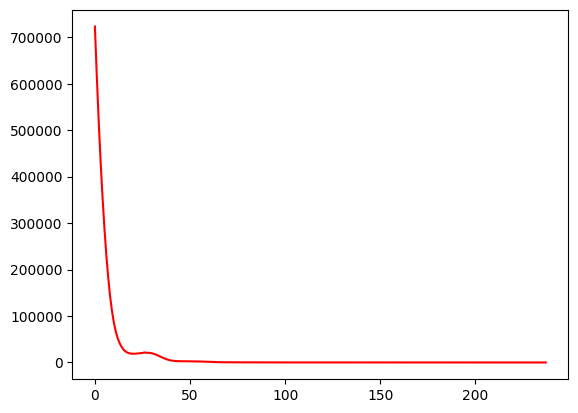

 48%|████▊     | 238/500 [00:54<00:53,  4.94it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  60.593220338983045
Dataset Name:  disney , AUC Score (contextual):  44.07713498622589
Dataset Name:  disney , AUC Score (structural):  57.675840978593264
Dataset Name:  disney , AUC Score (joint-type):  75.48209366391184
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.48209366391184
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


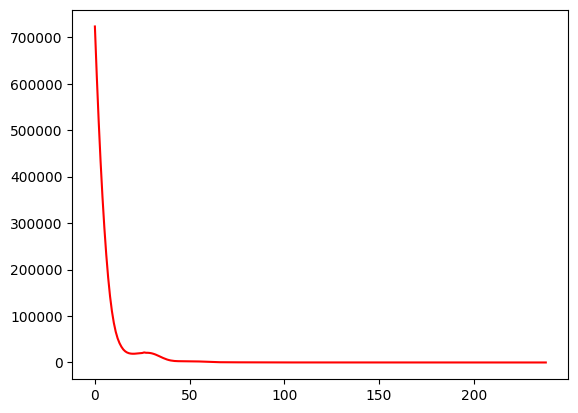

 48%|████▊     | 239/500 [00:54<00:54,  4.78it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  60.87570621468926
Dataset Name:  disney , AUC Score (contextual):  44.07713498622589
Dataset Name:  disney , AUC Score (structural):  57.67584097859327
Dataset Name:  disney , AUC Score (joint-type):  75.48209366391184
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.48209366391184
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


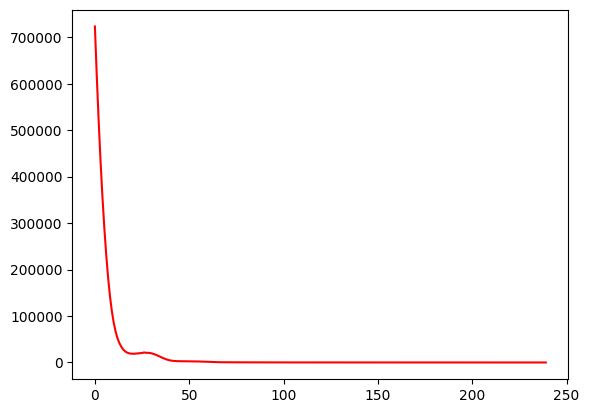

 48%|████▊     | 240/500 [00:55<00:51,  5.01it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  61.15819209039548
Dataset Name:  disney , AUC Score (contextual):  44.352617079889804
Dataset Name:  disney , AUC Score (structural):  57.55351681957187
Dataset Name:  disney , AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


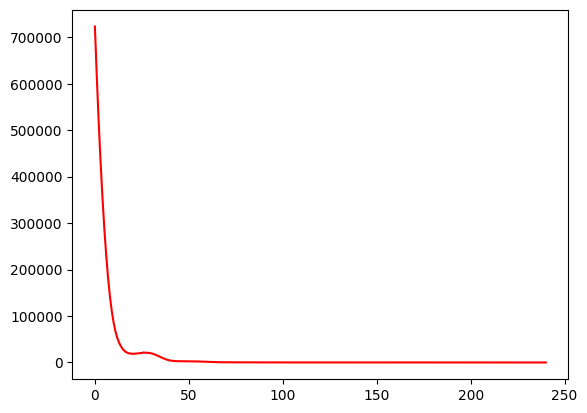

 48%|████▊     | 241/500 [00:55<00:49,  5.24it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  61.016949152542374
Dataset Name:  disney , AUC Score (contextual):  44.62809917355372
Dataset Name:  disney , AUC Score (structural):  57.55351681957187
Dataset Name:  disney , AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


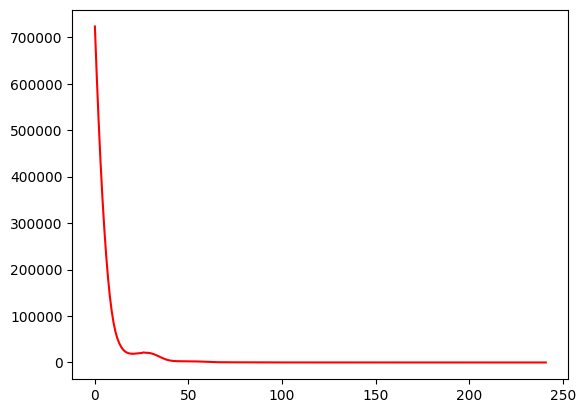

 48%|████▊     | 242/500 [00:55<00:50,  5.10it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  61.299435028248595
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.55351681957186
Dataset Name:  disney , AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


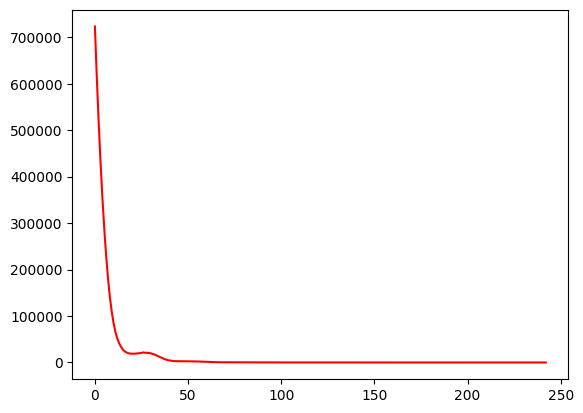

 49%|████▊     | 243/500 [00:55<00:51,  4.98it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  61.440677966101696
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.49235474006116
Dataset Name:  disney , AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney , AUC Score (structure type):  59.09840571742716
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


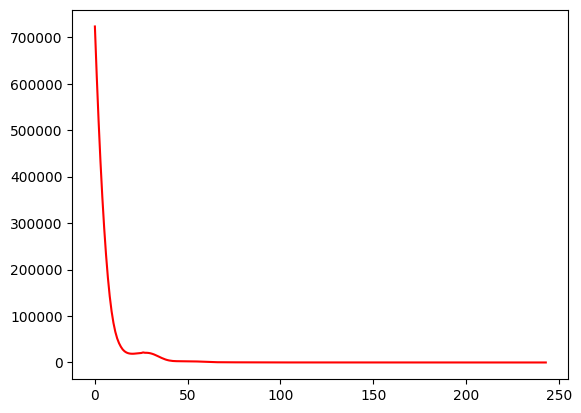

 49%|████▉     | 244/500 [00:55<00:51,  4.99it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  61.440677966101696
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.737003058103966
Dataset Name:  disney , AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney , AUC Score (structure type):  59.3183067619571
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


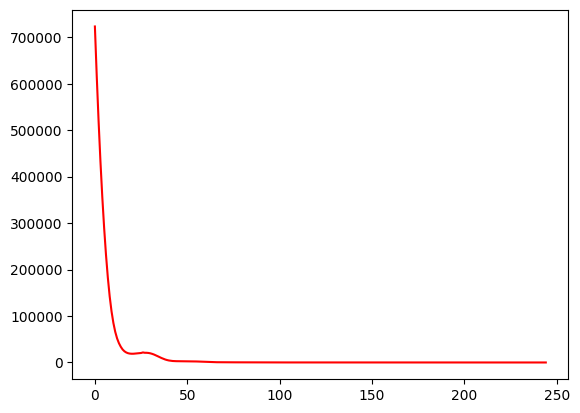

 49%|████▉     | 245/500 [00:56<00:49,  5.20it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  61.5819209039548
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.737003058103966
Dataset Name:  disney , AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


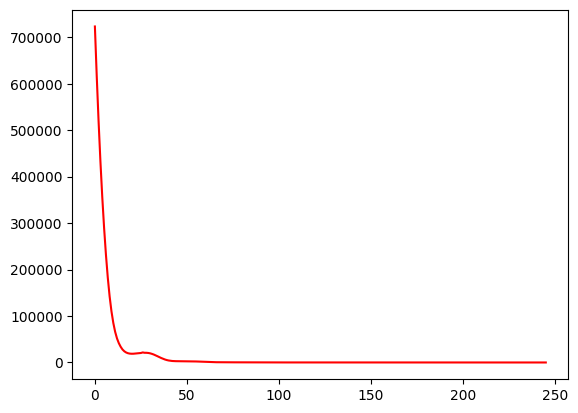

 49%|████▉     | 246/500 [00:56<00:49,  5.09it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  61.72316384180792
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.798165137614674
Dataset Name:  disney , AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney , AUC Score (structure type):  59.373282023089615
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


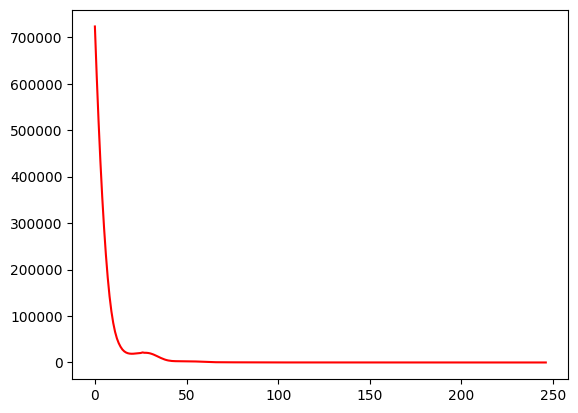

 49%|████▉     | 247/500 [00:56<00:49,  5.06it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.14689265536724
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.675840978593264
Dataset Name:  disney , AUC Score (joint-type):  76.03305785123966
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.03305785123966
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


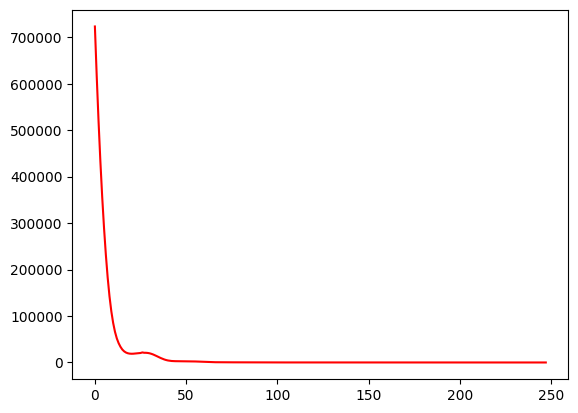

 50%|████▉     | 248/500 [00:56<00:50,  4.96it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.14689265536724
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.675840978593264
Dataset Name:  disney , AUC Score (joint-type):  76.30853994490357
Dataset Name:  disney , AUC Score (structure type):  59.373282023089615
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.30853994490357
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


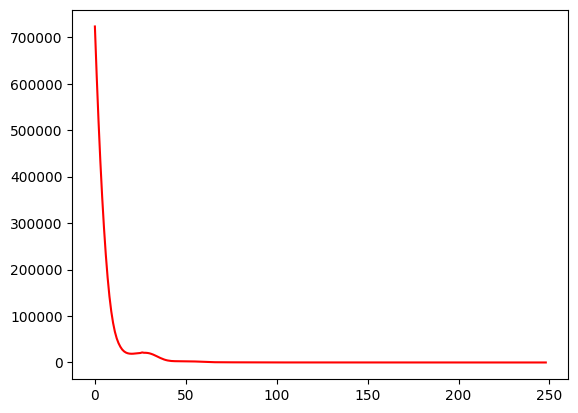

 50%|████▉     | 249/500 [00:56<00:51,  4.92it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.14689265536724
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.73700305810397
Dataset Name:  disney , AUC Score (joint-type):  76.30853994490357
Dataset Name:  disney , AUC Score (structure type):  59.428257284222106
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.30853994490357
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


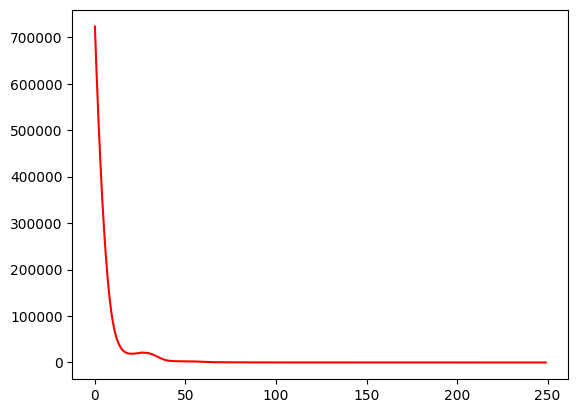

 50%|█████     | 250/500 [00:57<00:49,  5.00it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  61.86440677966102
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.61467889908257
Dataset Name:  disney , AUC Score (joint-type):  76.03305785123966
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.03305785123966
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


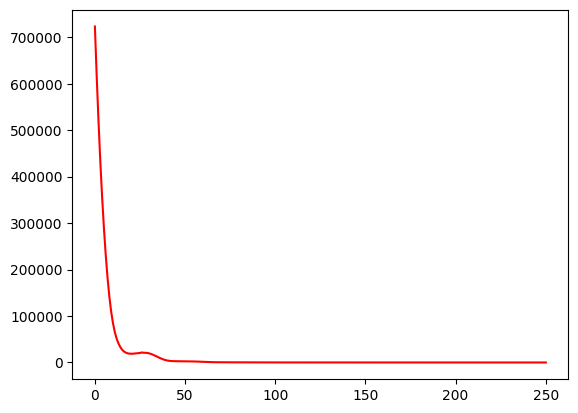

 50%|█████     | 251/500 [00:57<00:54,  4.55it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.005649717514125
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.55351681957187
Dataset Name:  disney , AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


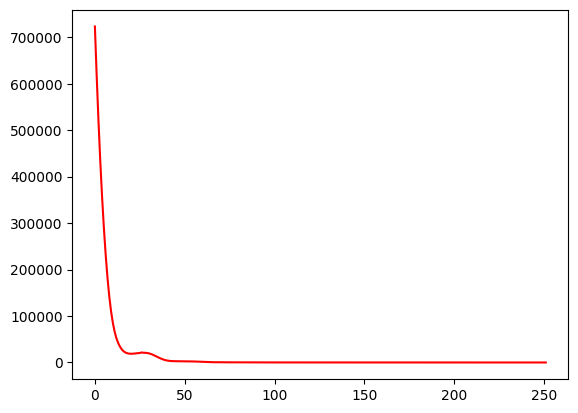

 50%|█████     | 252/500 [00:57<00:55,  4.48it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.005649717514125
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.61467889908256
Dataset Name:  disney , AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney , AUC Score (structure type):  59.26333150082462
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


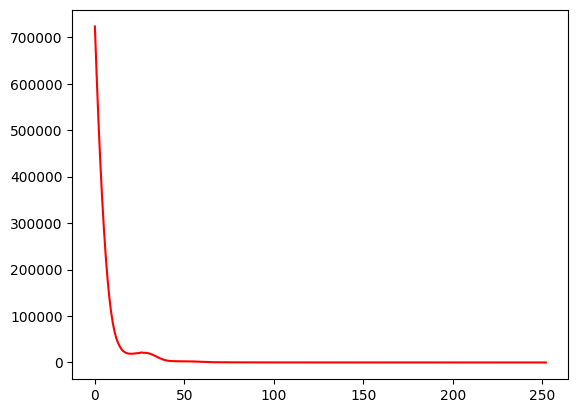

 51%|█████     | 253/500 [00:57<00:53,  4.58it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.14689265536724
Dataset Name:  disney , AUC Score (contextual):  45.73002754820937
Dataset Name:  disney , AUC Score (structural):  57.49235474006116
Dataset Name:  disney , AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


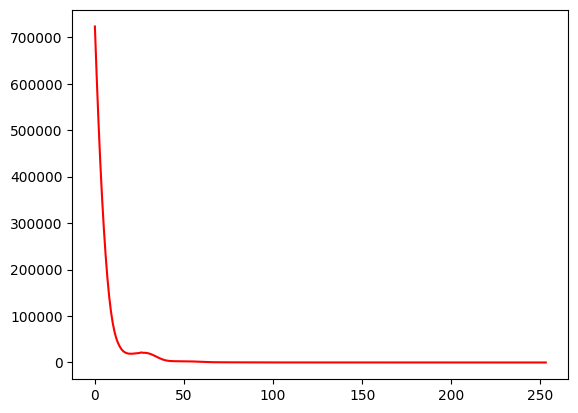

 51%|█████     | 254/500 [00:57<00:50,  4.87it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.005649717514125
Dataset Name:  disney , AUC Score (contextual):  46.005509641873275
Dataset Name:  disney , AUC Score (structural):  57.43119266055046
Dataset Name:  disney , AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney , AUC Score (structure type):  59.09840571742716
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


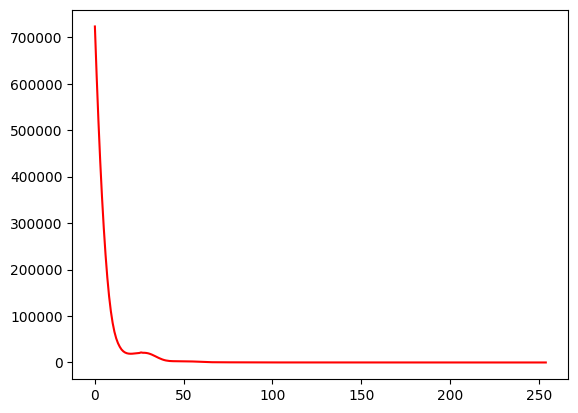

 51%|█████     | 255/500 [00:58<00:49,  4.92it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.14689265536724
Dataset Name:  disney , AUC Score (contextual):  46.005509641873275
Dataset Name:  disney , AUC Score (structural):  57.55351681957186
Dataset Name:  disney , AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  75.75757575757575
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


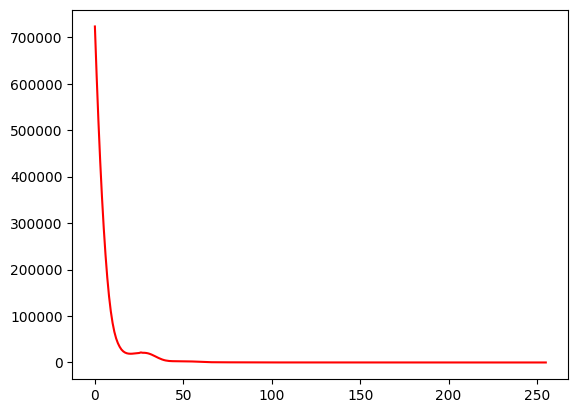

 51%|█████     | 256/500 [00:58<00:53,  4.58it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.28813559322034
Dataset Name:  disney , AUC Score (contextual):  45.730027548209364
Dataset Name:  disney , AUC Score (structural):  57.49235474006116
Dataset Name:  disney , AUC Score (joint-type):  76.03305785123966
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.03305785123966
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


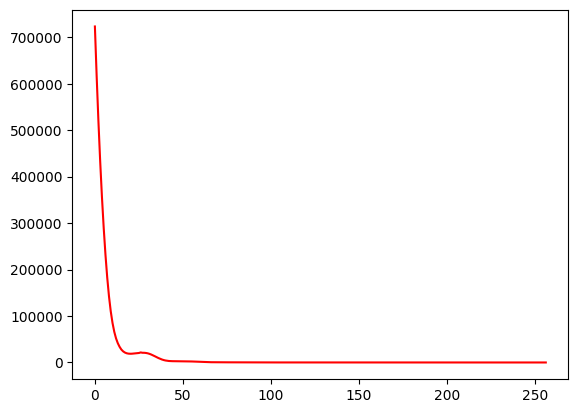

 51%|█████▏    | 257/500 [00:58<00:52,  4.61it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.42937853107344
Dataset Name:  disney , AUC Score (contextual):  45.730027548209364
Dataset Name:  disney , AUC Score (structural):  57.55351681957186
Dataset Name:  disney , AUC Score (joint-type):  76.03305785123966
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.03305785123966
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


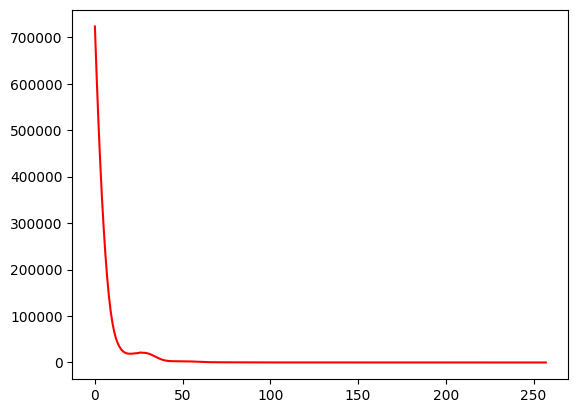

 52%|█████▏    | 258/500 [00:58<00:52,  4.65it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.28813559322034
Dataset Name:  disney , AUC Score (contextual):  45.730027548209364
Dataset Name:  disney , AUC Score (structural):  57.308868501529055
Dataset Name:  disney , AUC Score (joint-type):  76.03305785123966
Dataset Name:  disney , AUC Score (structure type):  59.043430456294665
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.03305785123966
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


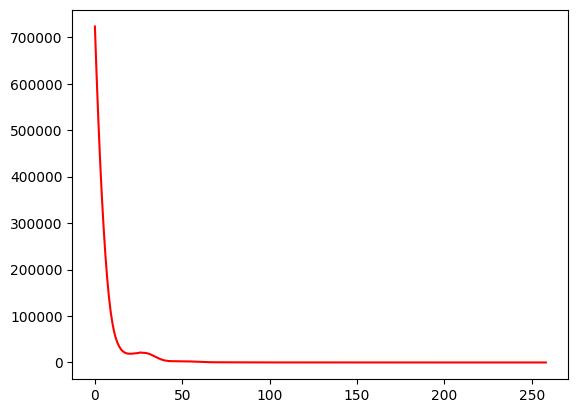

 52%|█████▏    | 259/500 [00:59<00:51,  4.72it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.57062146892656
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.49235474006116
Dataset Name:  disney , AUC Score (joint-type):  76.03305785123966
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.03305785123966
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


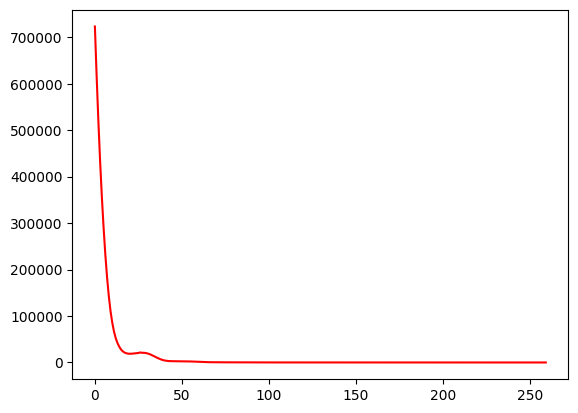

 52%|█████▏    | 260/500 [00:59<00:50,  4.75it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  61.86440677966102
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  56.75840978593272
Dataset Name:  disney , AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney , AUC Score (structure type):  58.60362836723475
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


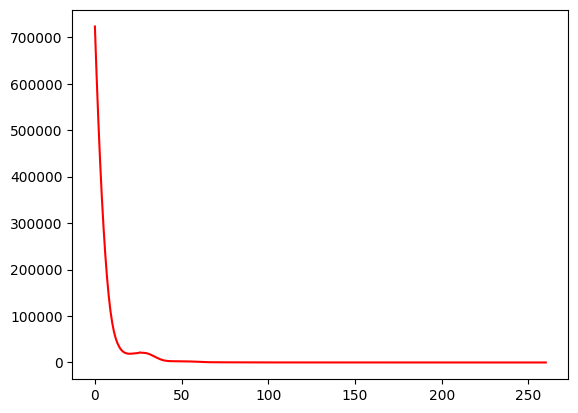

 52%|█████▏    | 261/500 [00:59<00:53,  4.48it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.85310734463276
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.49235474006116
Dataset Name:  disney , AUC Score (joint-type):  76.5840220385675
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.5840220385675
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


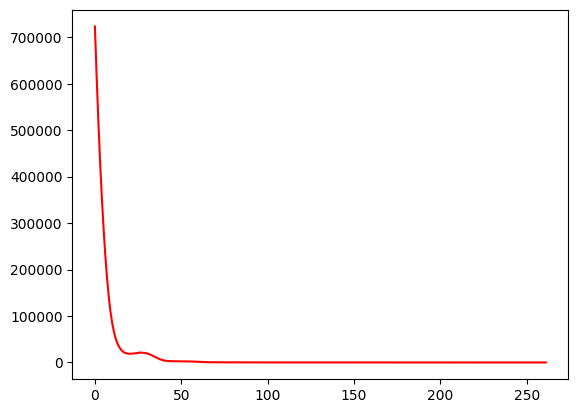

 52%|█████▏    | 262/500 [00:59<00:49,  4.79it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.57062146892656
Dataset Name:  disney , AUC Score (contextual):  45.179063360881536
Dataset Name:  disney , AUC Score (structural):  57.55351681957186
Dataset Name:  disney , AUC Score (joint-type):  76.5840220385675
Dataset Name:  disney , AUC Score (structure type):  59.3732820230896
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.5840220385675
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


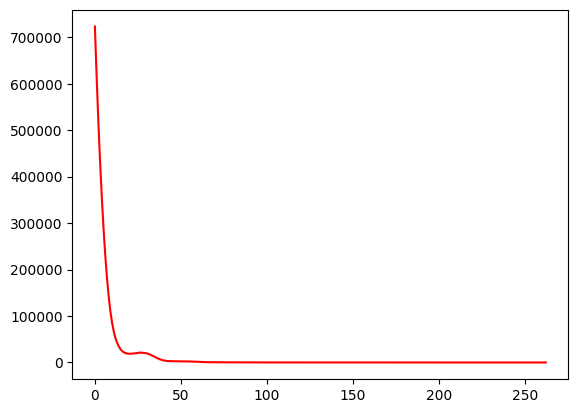

 53%|█████▎    | 263/500 [01:00<01:06,  3.58it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.57062146892656
Dataset Name:  disney , AUC Score (contextual):  45.45454545454545
Dataset Name:  disney , AUC Score (structural):  57.18654434250764
Dataset Name:  disney , AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney , AUC Score (structure type):  58.98845519516217
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


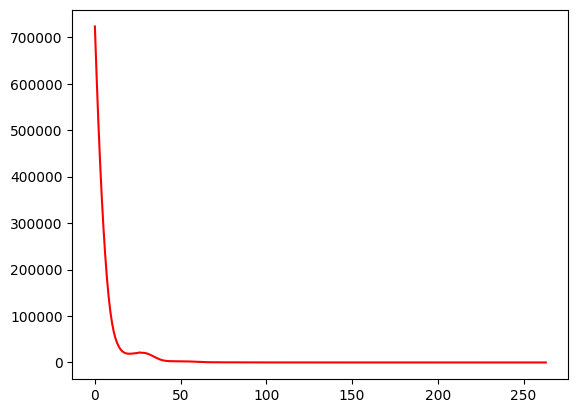

 53%|█████▎    | 264/500 [01:00<01:00,  3.89it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.13559322033898
Dataset Name:  disney , AUC Score (contextual):  45.45454545454545
Dataset Name:  disney , AUC Score (structural):  57.61467889908256
Dataset Name:  disney , AUC Score (joint-type):  76.5840220385675
Dataset Name:  disney , AUC Score (structure type):  59.4282572842221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.5840220385675
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


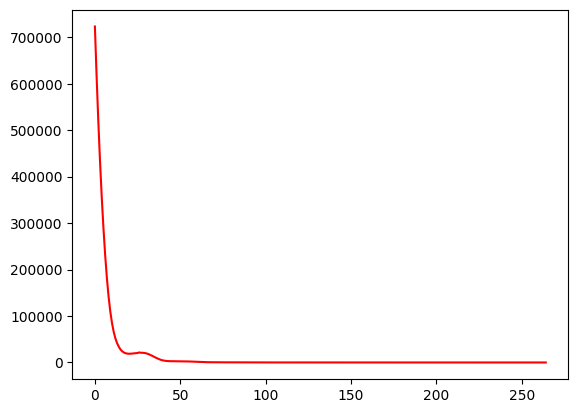

 53%|█████▎    | 265/500 [01:00<00:56,  4.17it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.13559322033898
Dataset Name:  disney , AUC Score (contextual):  45.45454545454545
Dataset Name:  disney , AUC Score (structural):  57.49235474006116
Dataset Name:  disney , AUC Score (joint-type):  76.5840220385675
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.5840220385675
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


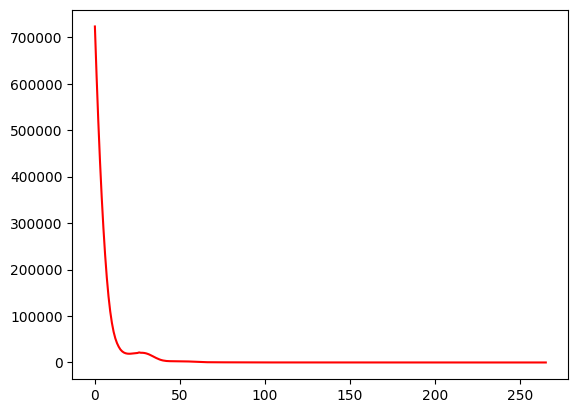

 53%|█████▎    | 266/500 [01:00<00:53,  4.34it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.57062146892656
Dataset Name:  disney , AUC Score (contextual):  45.73002754820937
Dataset Name:  disney , AUC Score (structural):  56.88073394495413
Dataset Name:  disney , AUC Score (joint-type):  76.5840220385675
Dataset Name:  disney , AUC Score (structure type):  58.76855415063221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.5840220385675
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


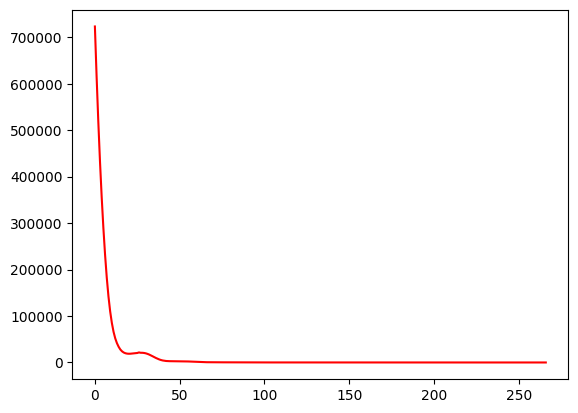

 53%|█████▎    | 267/500 [01:00<00:52,  4.48it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.13559322033898
Dataset Name:  disney , AUC Score (contextual):  45.73002754820937
Dataset Name:  disney , AUC Score (structural):  57.49235474006116
Dataset Name:  disney , AUC Score (joint-type):  76.5840220385675
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.5840220385675
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


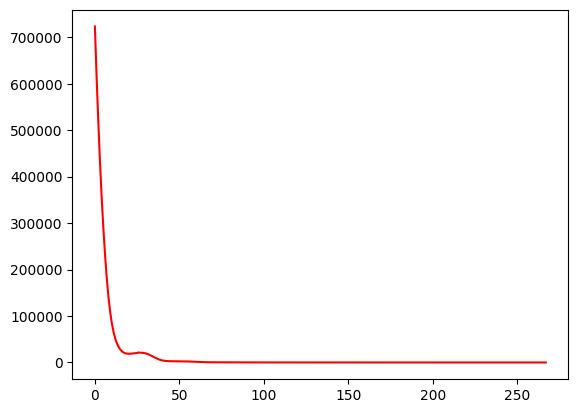

 54%|█████▎    | 268/500 [01:01<00:48,  4.80it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.27683615819208
Dataset Name:  disney , AUC Score (contextual):  46.005509641873275
Dataset Name:  disney , AUC Score (structural):  57.37003058103976
Dataset Name:  disney , AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney , AUC Score (structure type):  59.20835623969213
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


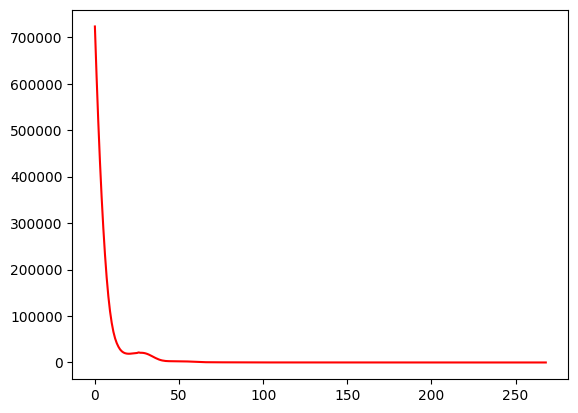

 54%|█████▍    | 269/500 [01:01<00:48,  4.76it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  62.994350282485875
Dataset Name:  disney , AUC Score (contextual):  46.005509641873275
Dataset Name:  disney , AUC Score (structural):  56.81957186544342
Dataset Name:  disney , AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney , AUC Score (structure type):  58.713578889499715
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


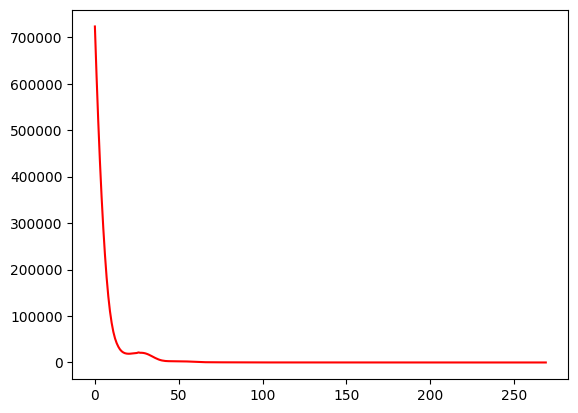

 54%|█████▍    | 270/500 [01:01<00:45,  5.02it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.4180790960452
Dataset Name:  disney , AUC Score (contextual):  46.005509641873275
Dataset Name:  disney , AUC Score (structural):  57.00305810397553
Dataset Name:  disney , AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney , AUC Score (structure type):  58.87850467289719
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


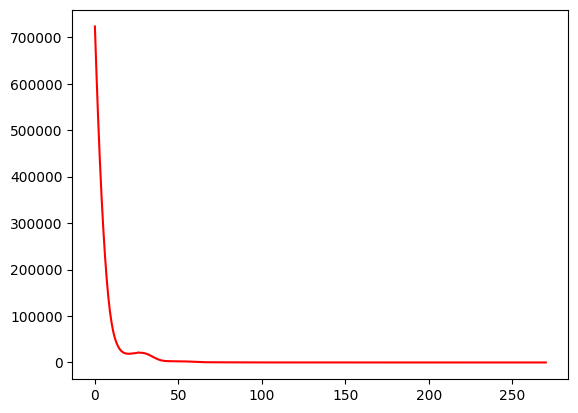

 54%|█████▍    | 271/500 [01:01<00:45,  5.04it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.559322033898304
Dataset Name:  disney , AUC Score (contextual):  46.005509641873275
Dataset Name:  disney , AUC Score (structural):  57.18654434250764
Dataset Name:  disney , AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney , AUC Score (structure type):  59.04343045629468
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


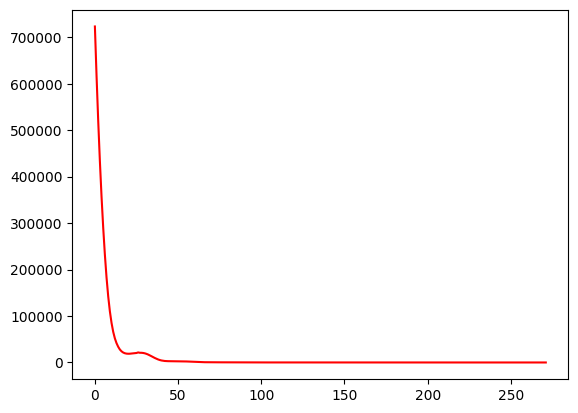

 54%|█████▍    | 272/500 [01:01<00:45,  4.99it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.559322033898304
Dataset Name:  disney , AUC Score (contextual):  46.005509641873275
Dataset Name:  disney , AUC Score (structural):  57.064220183486235
Dataset Name:  disney , AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.30853994490359
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


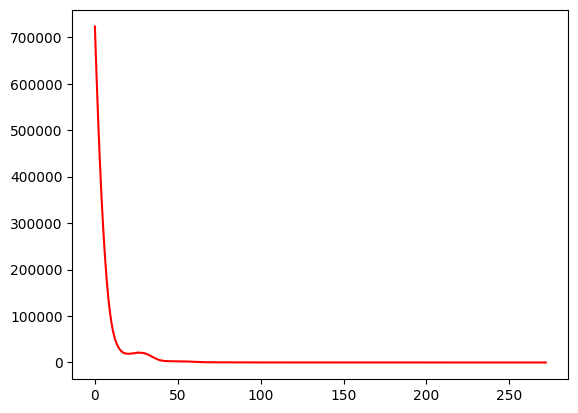

 55%|█████▍    | 273/500 [01:02<00:49,  4.59it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  63.84180790960452
Dataset Name:  disney , AUC Score (contextual):  46.28099173553719
Dataset Name:  disney , AUC Score (structural):  57.18654434250764
Dataset Name:  disney , AUC Score (joint-type):  77.13498622589532
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  77.13498622589532
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


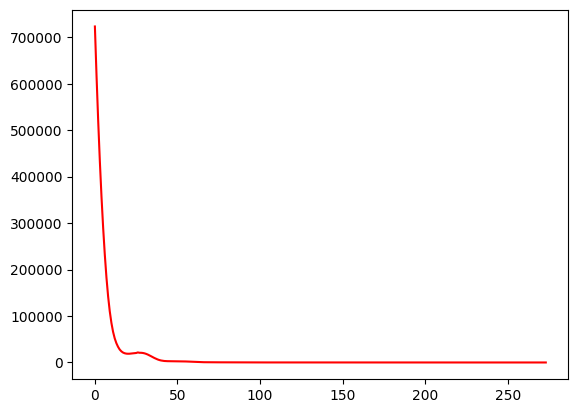

 55%|█████▍    | 274/500 [01:02<00:45,  4.92it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  64.12429378531074
Dataset Name:  disney , AUC Score (contextual):  46.5564738292011
Dataset Name:  disney , AUC Score (structural):  57.37003058103976
Dataset Name:  disney , AUC Score (joint-type):  76.85950413223141
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  76.85950413223141
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


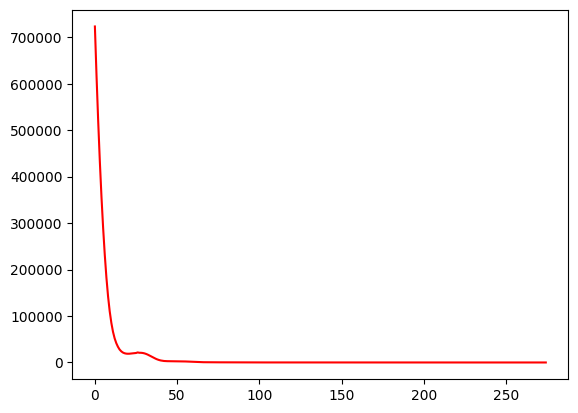

 55%|█████▌    | 275/500 [01:02<00:45,  4.94it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  64.26553672316385
Dataset Name:  disney , AUC Score (contextual):  46.5564738292011
Dataset Name:  disney , AUC Score (structural):  56.94189602446483
Dataset Name:  disney , AUC Score (joint-type):  77.41046831955923
Dataset Name:  disney , AUC Score (structure type):  59.043430456294665
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  77.41046831955923
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


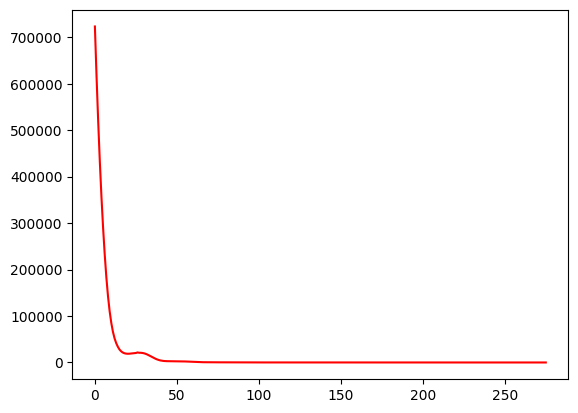

 55%|█████▌    | 276/500 [01:02<00:43,  5.15it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  64.54802259887006
Dataset Name:  disney , AUC Score (contextual):  46.5564738292011
Dataset Name:  disney , AUC Score (structural):  57.064220183486235
Dataset Name:  disney , AUC Score (joint-type):  77.96143250688705
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  77.96143250688705
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


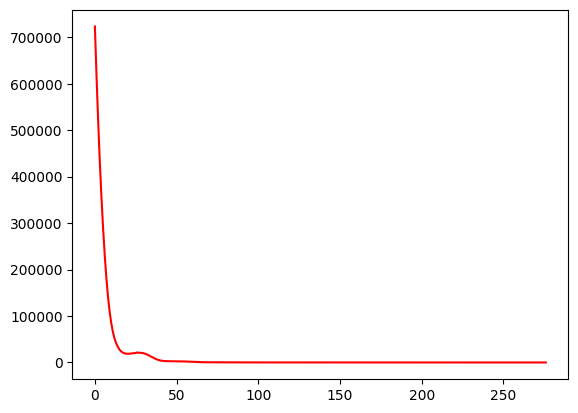

 55%|█████▌    | 277/500 [01:02<00:41,  5.34it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  64.68926553672316
Dataset Name:  disney , AUC Score (contextual):  46.5564738292011
Dataset Name:  disney , AUC Score (structural):  57.24770642201834
Dataset Name:  disney , AUC Score (joint-type):  77.96143250688705
Dataset Name:  disney , AUC Score (structure type):  59.428257284222106
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  77.96143250688705
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


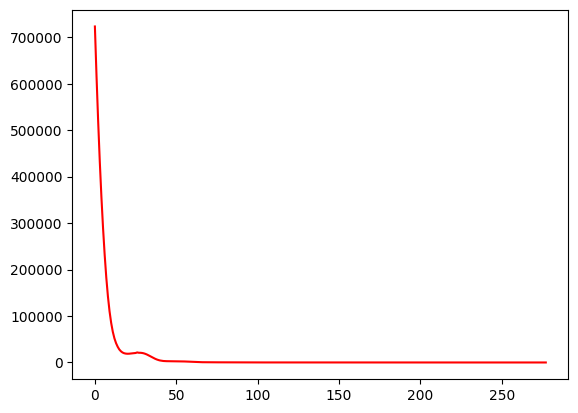

 56%|█████▌    | 278/500 [01:03<00:42,  5.18it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  64.68926553672316
Dataset Name:  disney , AUC Score (contextual):  47.107438016528924
Dataset Name:  disney , AUC Score (structural):  56.81957186544343
Dataset Name:  disney , AUC Score (joint-type):  77.96143250688705
Dataset Name:  disney , AUC Score (structure type):  59.043430456294665
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  77.96143250688705
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


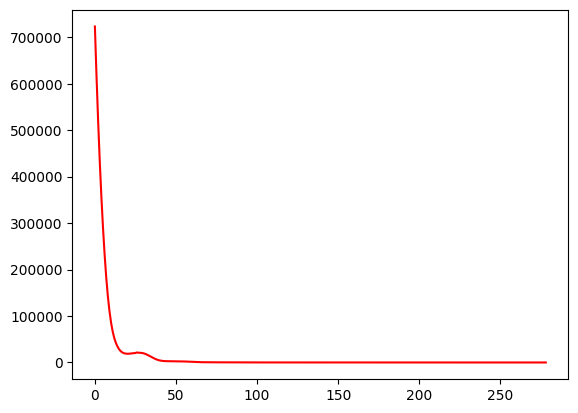

 56%|█████▌    | 279/500 [01:03<00:44,  5.01it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  64.83050847457628
Dataset Name:  disney , AUC Score (contextual):  47.38292011019284
Dataset Name:  disney , AUC Score (structural):  57.064220183486235
Dataset Name:  disney , AUC Score (joint-type):  77.96143250688705
Dataset Name:  disney , AUC Score (structure type):  59.26333150082462
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  77.96143250688705
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


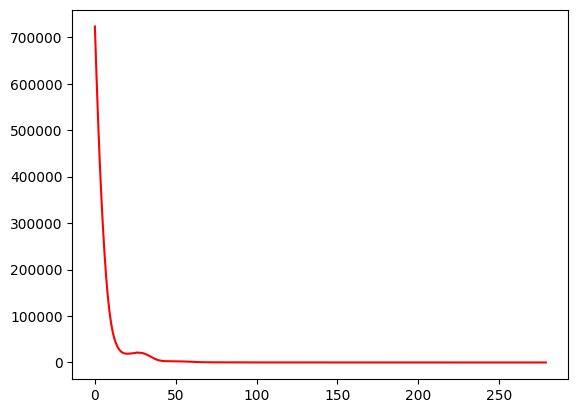

 56%|█████▌    | 280/500 [01:03<00:44,  4.94it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.11299435028248
Dataset Name:  disney , AUC Score (contextual):  47.658402203856745
Dataset Name:  disney , AUC Score (structural):  57.064220183486235
Dataset Name:  disney , AUC Score (joint-type):  78.23691460055096
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.23691460055096
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


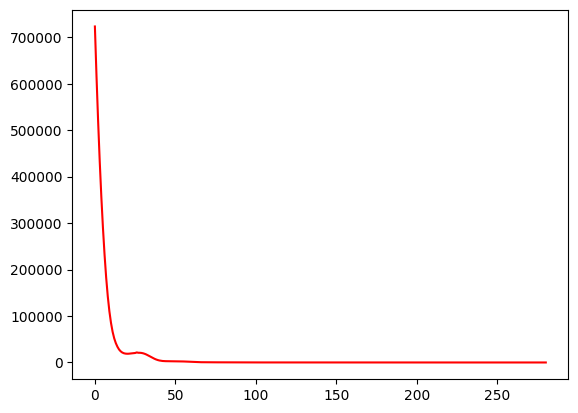

 56%|█████▌    | 281/500 [01:03<00:44,  4.90it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  64.83050847457628
Dataset Name:  disney , AUC Score (contextual):  47.658402203856745
Dataset Name:  disney , AUC Score (structural):  56.81957186544342
Dataset Name:  disney , AUC Score (joint-type):  78.23691460055096
Dataset Name:  disney , AUC Score (structure type):  59.09840571742716
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.23691460055096
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


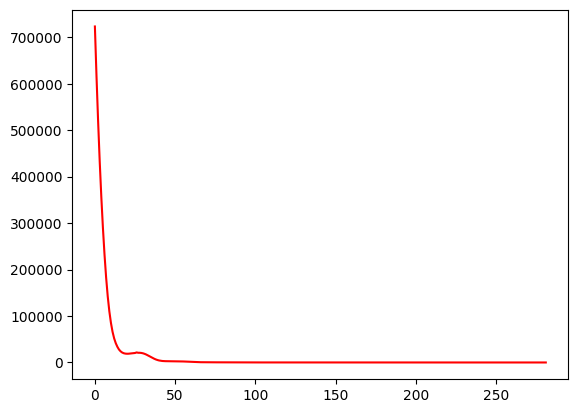

 56%|█████▋    | 282/500 [01:03<00:44,  4.87it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.2542372881356
Dataset Name:  disney , AUC Score (contextual):  47.93388429752066
Dataset Name:  disney , AUC Score (structural):  57.06422018348623
Dataset Name:  disney , AUC Score (joint-type):  78.51239669421487
Dataset Name:  disney , AUC Score (structure type):  59.3732820230896
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.51239669421487
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


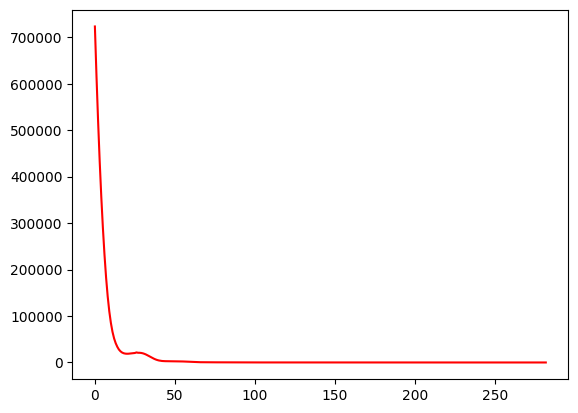

 57%|█████▋    | 283/500 [01:04<00:44,  4.83it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  64.97175141242938
Dataset Name:  disney , AUC Score (contextual):  47.933884297520656
Dataset Name:  disney , AUC Score (structural):  57.064220183486235
Dataset Name:  disney , AUC Score (joint-type):  78.51239669421487
Dataset Name:  disney , AUC Score (structure type):  59.3732820230896
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.51239669421487
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


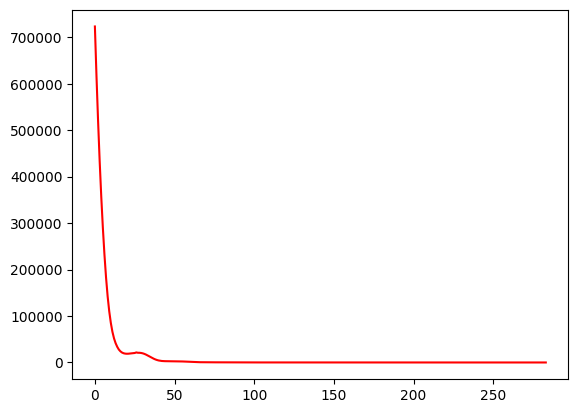

 57%|█████▋    | 284/500 [01:04<00:42,  5.08it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  64.97175141242938
Dataset Name:  disney , AUC Score (contextual):  47.658402203856745
Dataset Name:  disney , AUC Score (structural):  56.94189602446483
Dataset Name:  disney , AUC Score (joint-type):  78.51239669421487
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.51239669421487
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


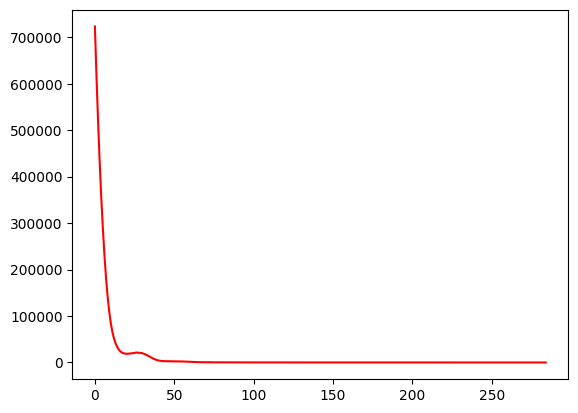

 57%|█████▋    | 285/500 [01:04<00:42,  5.04it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.25423728813558
Dataset Name:  disney , AUC Score (contextual):  47.658402203856745
Dataset Name:  disney , AUC Score (structural):  56.94189602446483
Dataset Name:  disney , AUC Score (joint-type):  78.51239669421487
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.51239669421487
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


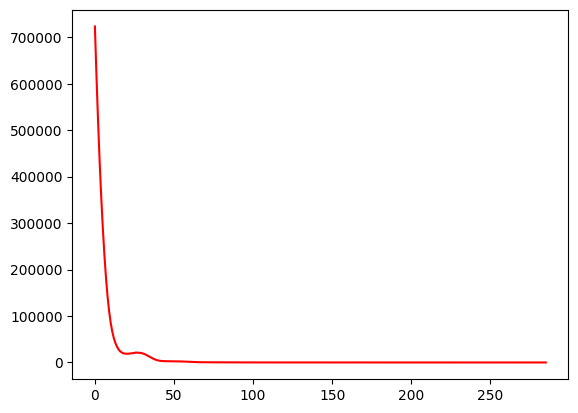

 57%|█████▋    | 286/500 [01:04<00:42,  4.99it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.3954802259887
Dataset Name:  disney , AUC Score (contextual):  47.933884297520656
Dataset Name:  disney , AUC Score (structural):  56.94189602446483
Dataset Name:  disney , AUC Score (joint-type):  78.78787878787878
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.78787878787878
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


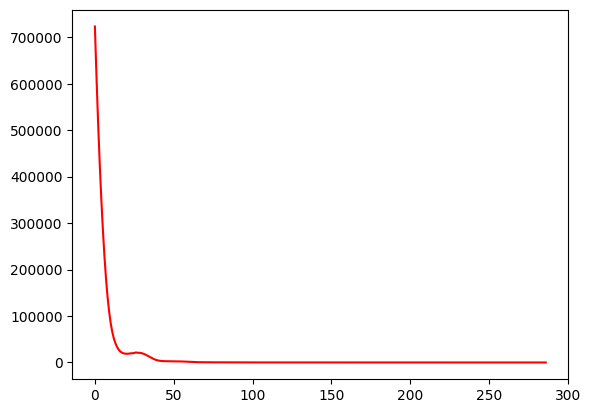

 57%|█████▋    | 287/500 [01:04<00:41,  5.19it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.3954802259887
Dataset Name:  disney , AUC Score (contextual):  48.209366391184574
Dataset Name:  disney , AUC Score (structural):  56.94189602446483
Dataset Name:  disney , AUC Score (joint-type):  78.78787878787878
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.78787878787878
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


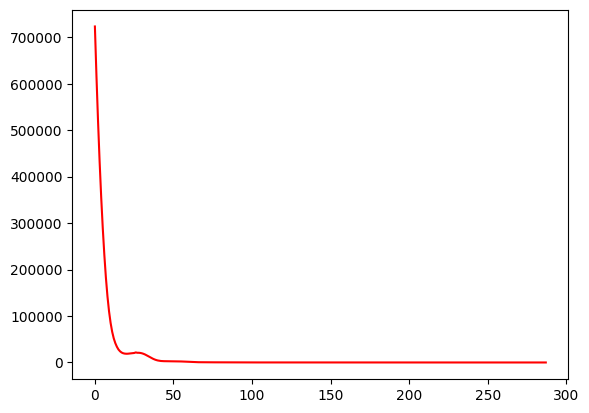

 58%|█████▊    | 288/500 [01:05<00:42,  5.04it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney , AUC Score (contextual):  48.760330578512395
Dataset Name:  disney , AUC Score (structural):  57.00305810397553
Dataset Name:  disney , AUC Score (joint-type):  78.78787878787878
Dataset Name:  disney , AUC Score (structure type):  59.373282023089615
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.78787878787878
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


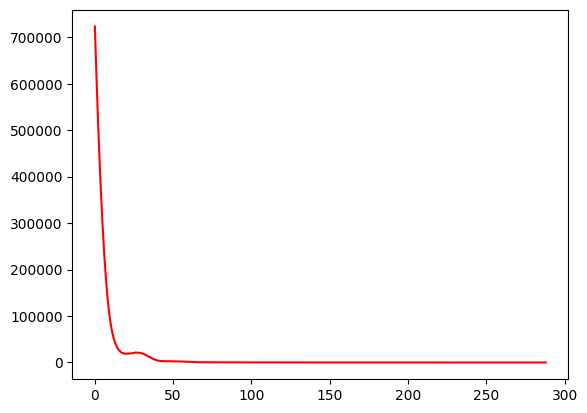

 58%|█████▊    | 289/500 [01:05<00:42,  4.96it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.81920903954803
Dataset Name:  disney , AUC Score (contextual):  49.586776859504134
Dataset Name:  disney , AUC Score (structural):  57.064220183486235
Dataset Name:  disney , AUC Score (joint-type):  78.78787878787878
Dataset Name:  disney , AUC Score (structure type):  59.4282572842221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.81920903954803
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.78787878787878
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


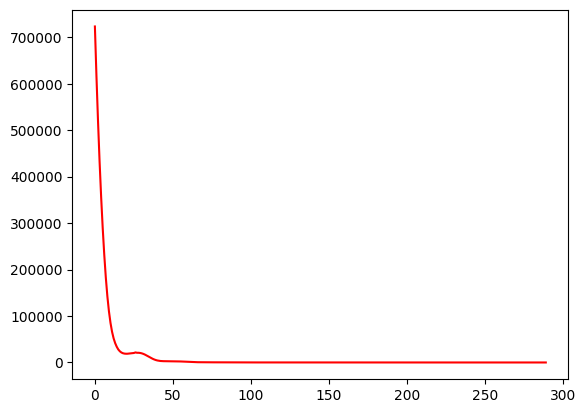

 58%|█████▊    | 290/500 [01:05<00:42,  4.94it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.81920903954803
Dataset Name:  disney , AUC Score (contextual):  49.862258953168045
Dataset Name:  disney , AUC Score (structural):  56.94189602446483
Dataset Name:  disney , AUC Score (joint-type):  78.78787878787878
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.81920903954803
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.78787878787878
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


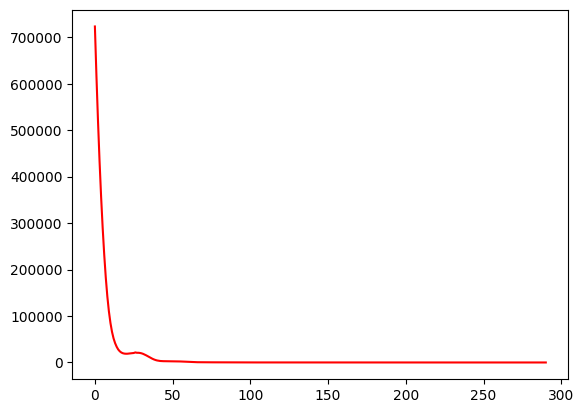

 58%|█████▊    | 291/500 [01:05<00:40,  5.12it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.81920903954803
Dataset Name:  disney , AUC Score (contextual):  49.862258953168045
Dataset Name:  disney , AUC Score (structural):  57.00305810397553
Dataset Name:  disney , AUC Score (joint-type):  79.06336088154269
Dataset Name:  disney , AUC Score (structure type):  59.428257284222106
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.81920903954803
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  79.06336088154269
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


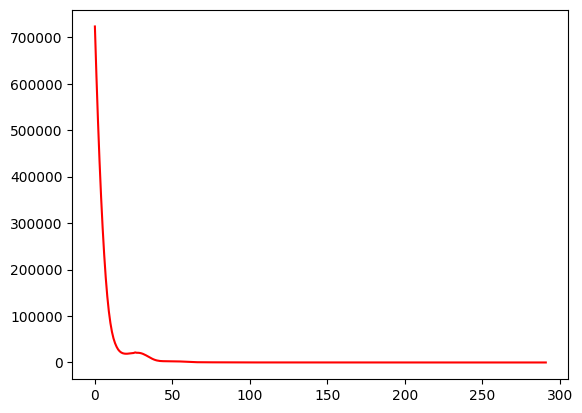

 58%|█████▊    | 292/500 [01:05<00:41,  4.99it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney , AUC Score (contextual):  49.311294765840216
Dataset Name:  disney , AUC Score (structural):  56.88073394495413
Dataset Name:  disney , AUC Score (joint-type):  78.78787878787878
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.81920903954803
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  78.78787878787878
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


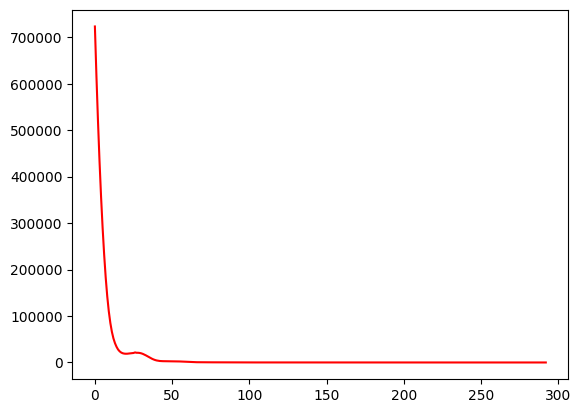

 59%|█████▊    | 293/500 [01:06<00:42,  4.93it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.3954802259887
Dataset Name:  disney , AUC Score (contextual):  48.760330578512395
Dataset Name:  disney , AUC Score (structural):  56.88073394495413
Dataset Name:  disney , AUC Score (joint-type):  79.06336088154269
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.81920903954803
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  79.06336088154269
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


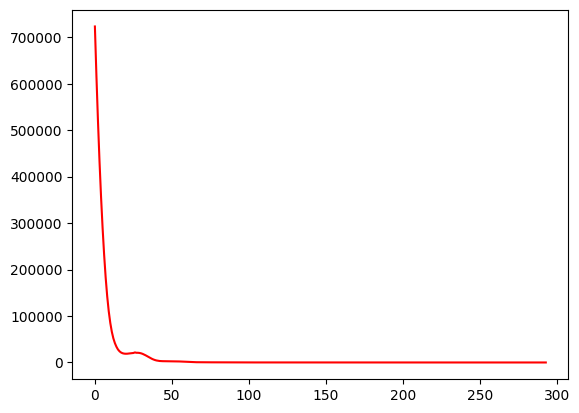

 59%|█████▉    | 294/500 [01:06<00:42,  4.88it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.5367231638418
Dataset Name:  disney , AUC Score (contextual):  48.48484848484848
Dataset Name:  disney , AUC Score (structural):  56.75840978593272
Dataset Name:  disney , AUC Score (joint-type):  79.3388429752066
Dataset Name:  disney , AUC Score (structure type):  59.26333150082462
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.81920903954803
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  79.3388429752066
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


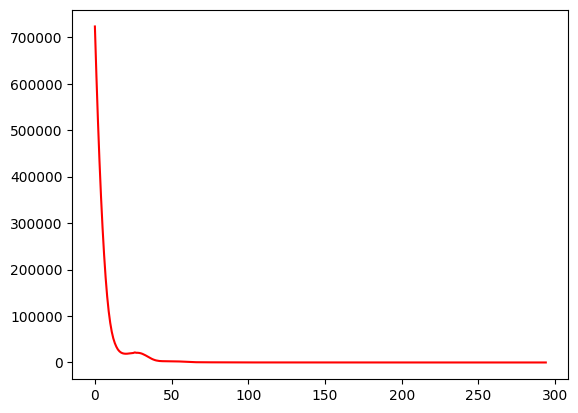

 59%|█████▉    | 295/500 [01:06<00:42,  4.86it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  65.67796610169492
Dataset Name:  disney , AUC Score (contextual):  48.760330578512395
Dataset Name:  disney , AUC Score (structural):  56.88073394495412
Dataset Name:  disney , AUC Score (joint-type):  79.61432506887051
Dataset Name:  disney , AUC Score (structure type):  59.428257284222106
Dataset Name:  disney  Best AUC Score(benchmark/combined):  65.81920903954803
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  79.61432506887051
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


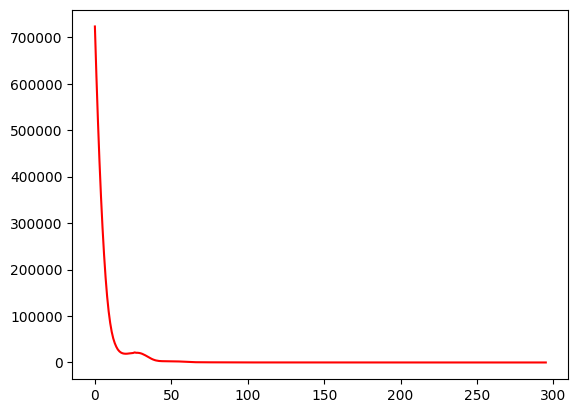

 59%|█████▉    | 296/500 [01:06<00:40,  5.05it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  66.10169491525424
Dataset Name:  disney , AUC Score (contextual):  49.035812672176306
Dataset Name:  disney , AUC Score (structural):  57.00305810397553
Dataset Name:  disney , AUC Score (joint-type):  79.61432506887051
Dataset Name:  disney , AUC Score (structure type):  59.5382078064871
Dataset Name:  disney  Best AUC Score(benchmark/combined):  66.10169491525424
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  79.61432506887051
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


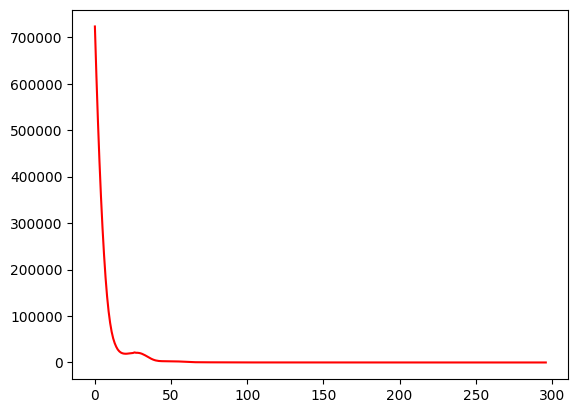

 59%|█████▉    | 297/500 [01:06<00:41,  4.89it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  66.10169491525424
Dataset Name:  disney , AUC Score (contextual):  49.035812672176306
Dataset Name:  disney , AUC Score (structural):  56.94189602446483
Dataset Name:  disney , AUC Score (joint-type):  79.61432506887051
Dataset Name:  disney , AUC Score (structure type):  59.48323254535459
Dataset Name:  disney  Best AUC Score(benchmark/combined):  66.10169491525424
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  79.61432506887051
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


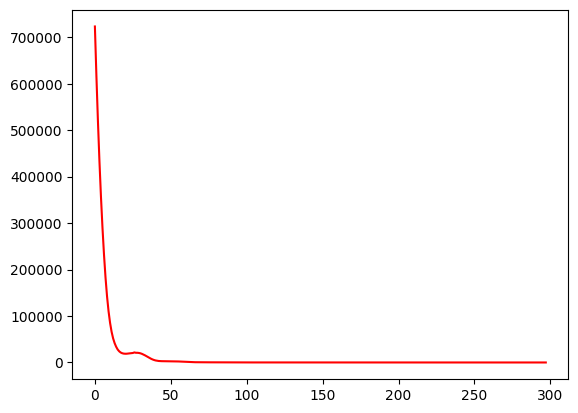

 60%|█████▉    | 298/500 [01:07<00:39,  5.05it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  66.24293785310734
Dataset Name:  disney , AUC Score (contextual):  49.311294765840216
Dataset Name:  disney , AUC Score (structural):  56.94189602446483
Dataset Name:  disney , AUC Score (joint-type):  79.61432506887051
Dataset Name:  disney , AUC Score (structure type):  59.4832325453546
Dataset Name:  disney  Best AUC Score(benchmark/combined):  66.24293785310734
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  79.61432506887051
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


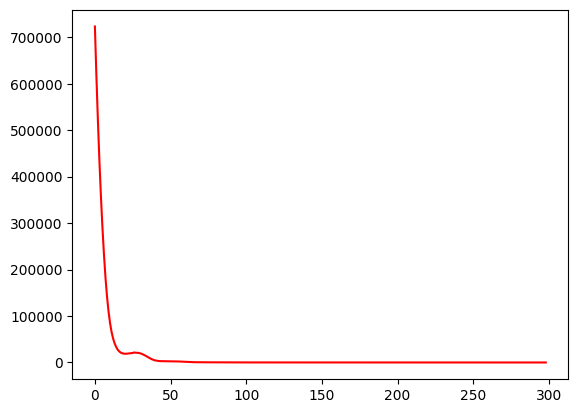

 60%|█████▉    | 299/500 [01:07<00:45,  4.42it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  66.24293785310734
Dataset Name:  disney , AUC Score (contextual):  49.311294765840216
Dataset Name:  disney , AUC Score (structural):  56.88073394495412
Dataset Name:  disney , AUC Score (joint-type):  79.88980716253444
Dataset Name:  disney , AUC Score (structure type):  59.4832325453546
Dataset Name:  disney  Best AUC Score(benchmark/combined):  66.24293785310734
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  79.88980716253444
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


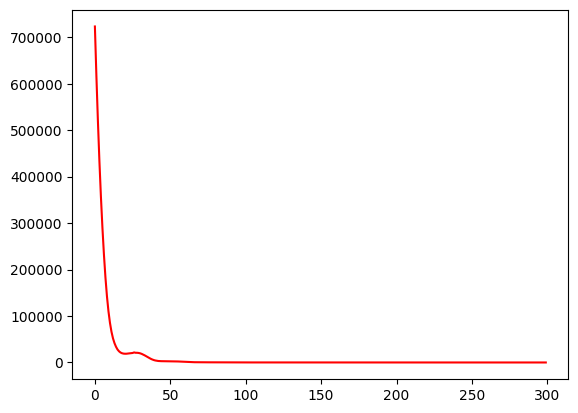

 60%|██████    | 300/500 [01:07<00:44,  4.46it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  66.52542372881356
Dataset Name:  disney , AUC Score (contextual):  49.311294765840216
Dataset Name:  disney , AUC Score (structural):  57.064220183486235
Dataset Name:  disney , AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney , AUC Score (structure type):  59.70313358988455
Dataset Name:  disney  Best AUC Score(benchmark/combined):  66.52542372881356
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


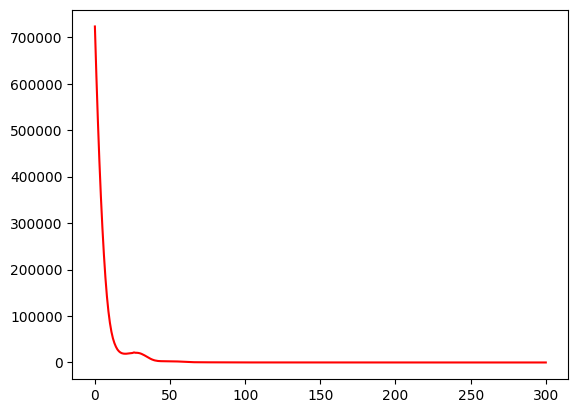

 60%|██████    | 301/500 [01:07<00:43,  4.56it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  66.52542372881356
Dataset Name:  disney , AUC Score (contextual):  50.96418732782369
Dataset Name:  disney , AUC Score (structural):  56.81957186544342
Dataset Name:  disney , AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney , AUC Score (structure type):  59.48323254535459
Dataset Name:  disney  Best AUC Score(benchmark/combined):  66.52542372881356
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


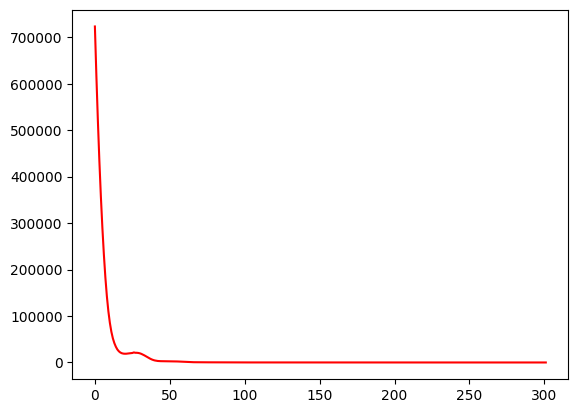

 60%|██████    | 302/500 [01:08<00:41,  4.80it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  67.090395480226
Dataset Name:  disney , AUC Score (contextual):  50.96418732782369
Dataset Name:  disney , AUC Score (structural):  57.125382262996936
Dataset Name:  disney , AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney , AUC Score (structure type):  59.75810885101704
Dataset Name:  disney  Best AUC Score(benchmark/combined):  67.090395480226
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


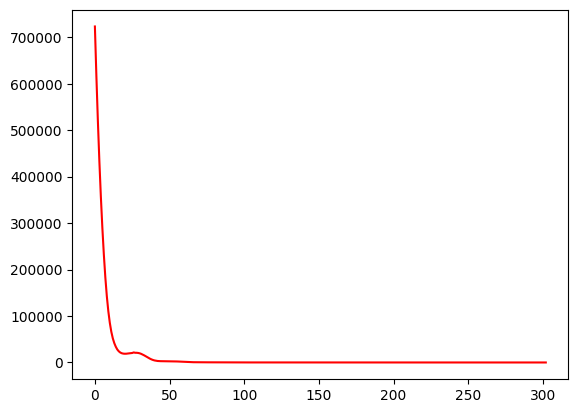

 61%|██████    | 303/500 [01:08<00:39,  5.02it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  66.66666666666666
Dataset Name:  disney , AUC Score (contextual):  50.96418732782369
Dataset Name:  disney , AUC Score (structural):  57.064220183486235
Dataset Name:  disney , AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney , AUC Score (structure type):  59.70313358988455
Dataset Name:  disney  Best AUC Score(benchmark/combined):  67.090395480226
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


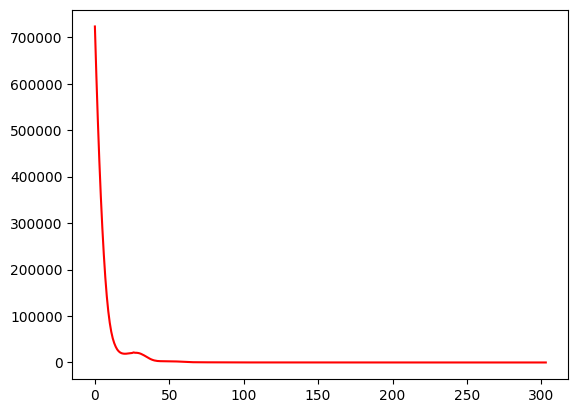

 61%|██████    | 304/500 [01:08<00:39,  4.96it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  67.37288135593221
Dataset Name:  disney , AUC Score (contextual):  50.96418732782369
Dataset Name:  disney , AUC Score (structural):  57.37003058103976
Dataset Name:  disney , AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney , AUC Score (structure type):  59.978009895547004
Dataset Name:  disney  Best AUC Score(benchmark/combined):  67.37288135593221
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


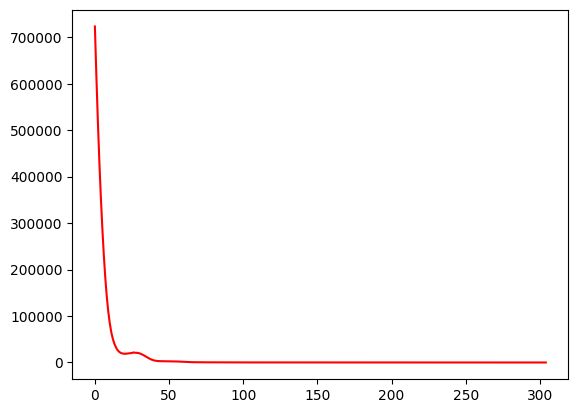

 61%|██████    | 305/500 [01:08<00:39,  4.91it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  67.37288135593221
Dataset Name:  disney , AUC Score (contextual):  50.96418732782369
Dataset Name:  disney , AUC Score (structural):  57.308868501529055
Dataset Name:  disney , AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney , AUC Score (structure type):  59.978009895547004
Dataset Name:  disney  Best AUC Score(benchmark/combined):  67.37288135593221
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


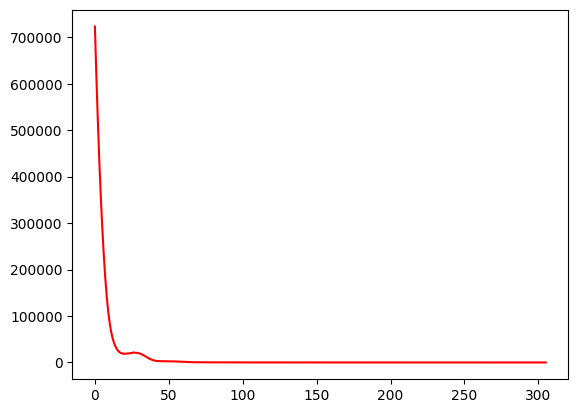

 61%|██████    | 306/500 [01:08<00:40,  4.84it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  67.79661016949152
Dataset Name:  disney , AUC Score (contextual):  51.790633608815426
Dataset Name:  disney , AUC Score (structural):  57.37003058103976
Dataset Name:  disney , AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney , AUC Score (structure type):  60.032985156679494
Dataset Name:  disney  Best AUC Score(benchmark/combined):  67.79661016949152
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


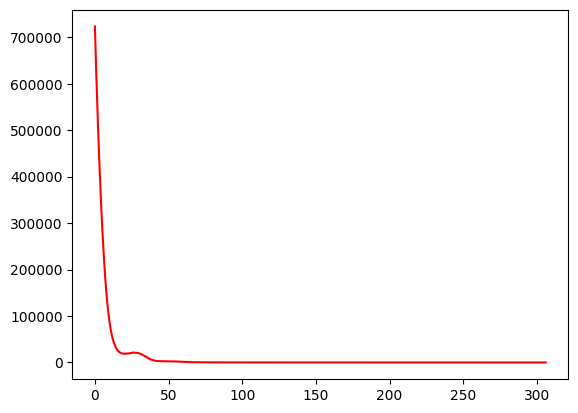

 61%|██████▏   | 307/500 [01:09<00:39,  4.83it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  68.07909604519774
Dataset Name:  disney , AUC Score (contextual):  51.79063360881542
Dataset Name:  disney , AUC Score (structural):  57.308868501529055
Dataset Name:  disney , AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney , AUC Score (structure type):  59.978009895547004
Dataset Name:  disney  Best AUC Score(benchmark/combined):  68.07909604519774
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


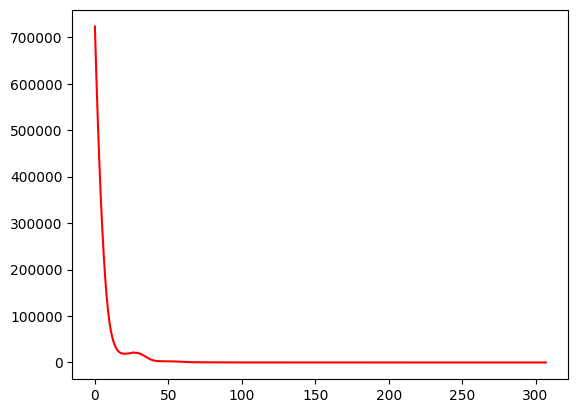

 62%|██████▏   | 308/500 [01:09<00:37,  5.05it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  67.65536723163842
Dataset Name:  disney , AUC Score (contextual):  51.2396694214876
Dataset Name:  disney , AUC Score (structural):  56.88073394495413
Dataset Name:  disney , AUC Score (joint-type):  80.44077134986227
Dataset Name:  disney , AUC Score (structure type):  59.59318306761957
Dataset Name:  disney  Best AUC Score(benchmark/combined):  68.07909604519774
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.44077134986227
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


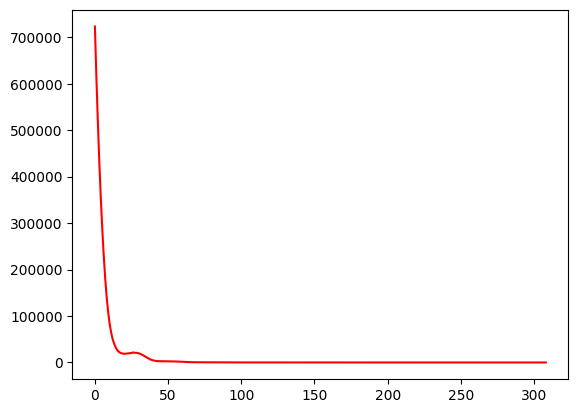

 62%|██████▏   | 309/500 [01:09<00:38,  4.96it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  67.37288135593221
Dataset Name:  disney , AUC Score (contextual):  50.413223140495866
Dataset Name:  disney , AUC Score (structural):  57.18654434250764
Dataset Name:  disney , AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney , AUC Score (structure type):  59.81308411214954
Dataset Name:  disney  Best AUC Score(benchmark/combined):  68.07909604519774
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


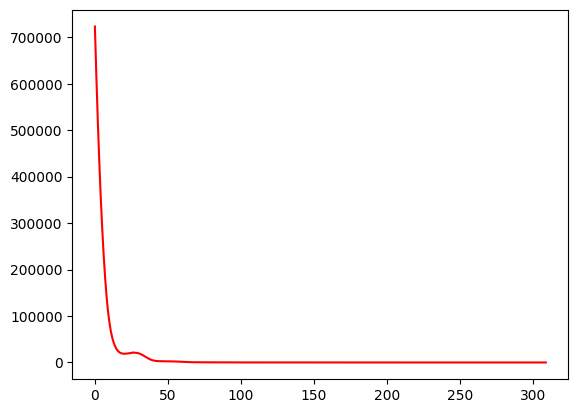

 62%|██████▏   | 310/500 [01:09<00:38,  4.91it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  67.37288135593221
Dataset Name:  disney , AUC Score (contextual):  49.311294765840216
Dataset Name:  disney , AUC Score (structural):  56.3914373088685
Dataset Name:  disney , AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney , AUC Score (structure type):  59.09840571742716
Dataset Name:  disney  Best AUC Score(benchmark/combined):  68.07909604519774
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.16528925619835
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


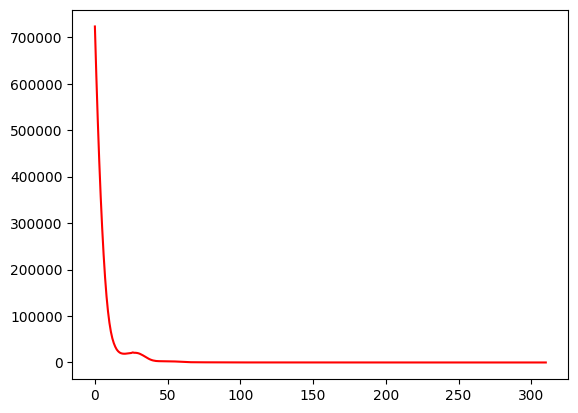

 62%|██████▏   | 311/500 [01:09<00:38,  4.90it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  68.07909604519774
Dataset Name:  disney , AUC Score (contextual):  50.413223140495866
Dataset Name:  disney , AUC Score (structural):  57.308868501529055
Dataset Name:  disney , AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney , AUC Score (structure type):  59.97800989554701
Dataset Name:  disney  Best AUC Score(benchmark/combined):  68.07909604519774
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


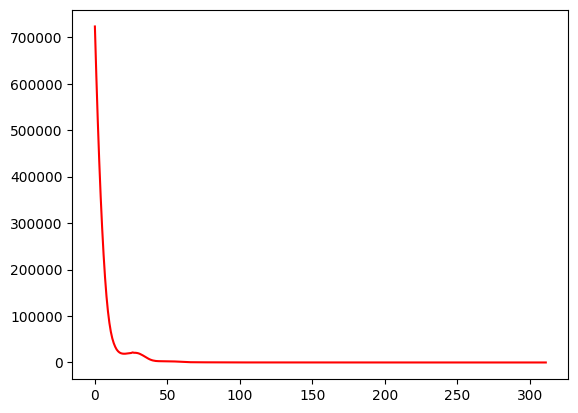

 62%|██████▏   | 312/500 [01:10<00:36,  5.12it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  68.50282485875707
Dataset Name:  disney , AUC Score (contextual):  50.96418732782369
Dataset Name:  disney , AUC Score (structural):  57.61467889908257
Dataset Name:  disney , AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney , AUC Score (structure type):  60.252886201209456
Dataset Name:  disney  Best AUC Score(benchmark/combined):  68.50282485875707
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


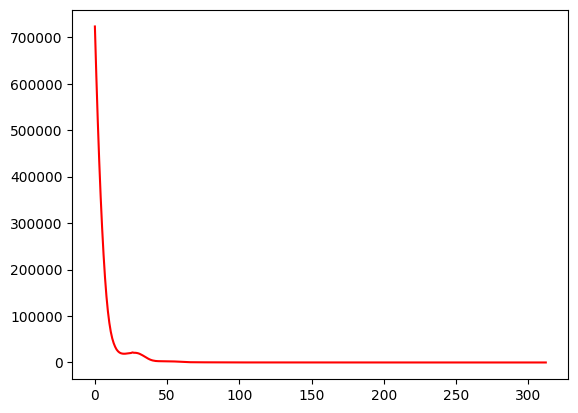

 63%|██████▎   | 313/500 [01:10<00:37,  5.02it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  68.78531073446328
Dataset Name:  disney , AUC Score (contextual):  51.790633608815426
Dataset Name:  disney , AUC Score (structural):  56.941896024464825
Dataset Name:  disney , AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney , AUC Score (structure type):  59.75810885101704
Dataset Name:  disney  Best AUC Score(benchmark/combined):  68.78531073446328
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


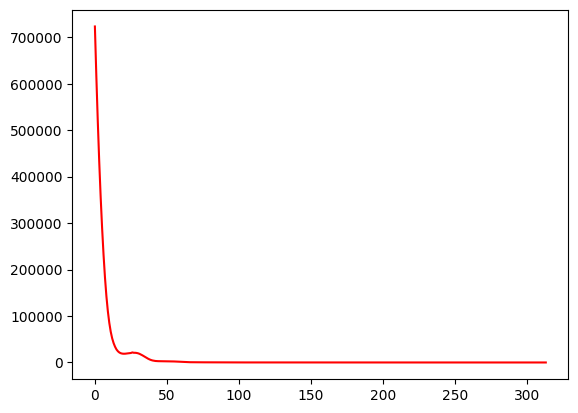

 63%|██████▎   | 314/500 [01:10<00:37,  4.95it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  68.92655367231639
Dataset Name:  disney , AUC Score (contextual):  52.066115702479344
Dataset Name:  disney , AUC Score (structural):  56.81957186544343
Dataset Name:  disney , AUC Score (joint-type):  80.71625344352617
Dataset Name:  disney , AUC Score (structure type):  59.59318306761957
Dataset Name:  disney  Best AUC Score(benchmark/combined):  68.92655367231639
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.71625344352617
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


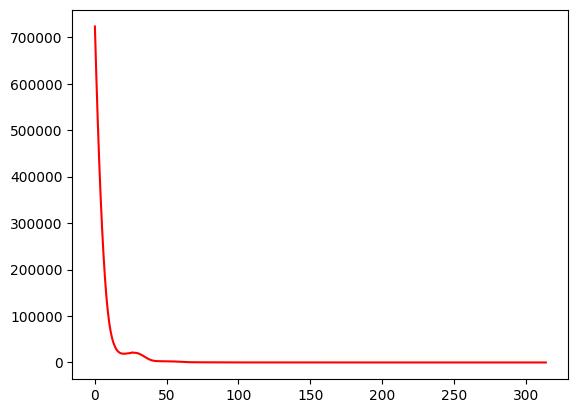

 63%|██████▎   | 315/500 [01:10<00:50,  3.63it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.2090395480226
Dataset Name:  disney , AUC Score (contextual):  54.26997245179063
Dataset Name:  disney , AUC Score (structural):  57.247706422018354
Dataset Name:  disney , AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney , AUC Score (structure type):  59.92303463441452
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.2090395480226
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


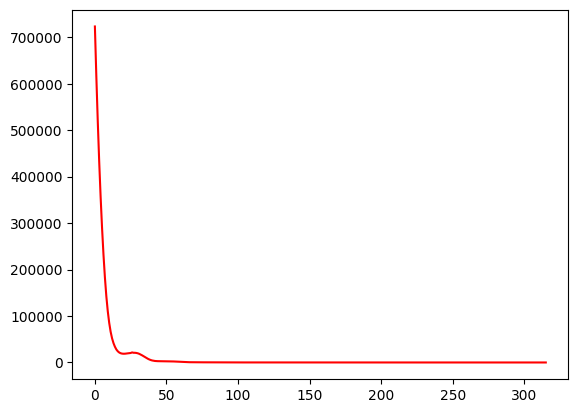

 63%|██████▎   | 316/500 [01:11<00:45,  4.09it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney , AUC Score (contextual):  53.994490358126725
Dataset Name:  disney , AUC Score (structural):  57.308868501529055
Dataset Name:  disney , AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney , AUC Score (structure type):  60.08796041781199
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


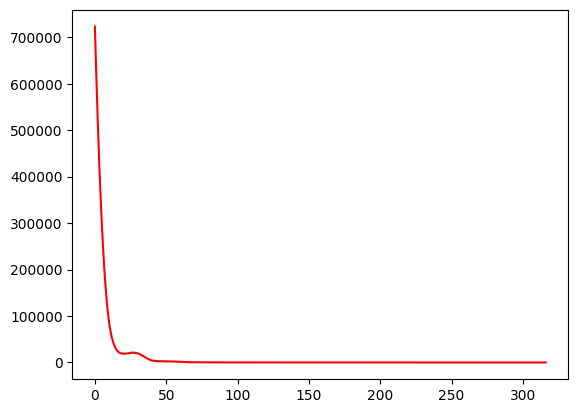

 63%|██████▎   | 317/500 [01:11<00:42,  4.28it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.35028248587571
Dataset Name:  disney , AUC Score (contextual):  54.26997245179063
Dataset Name:  disney , AUC Score (structural):  56.81957186544342
Dataset Name:  disney , AUC Score (joint-type):  80.71625344352617
Dataset Name:  disney , AUC Score (structure type):  59.593183067619584
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.71625344352617
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


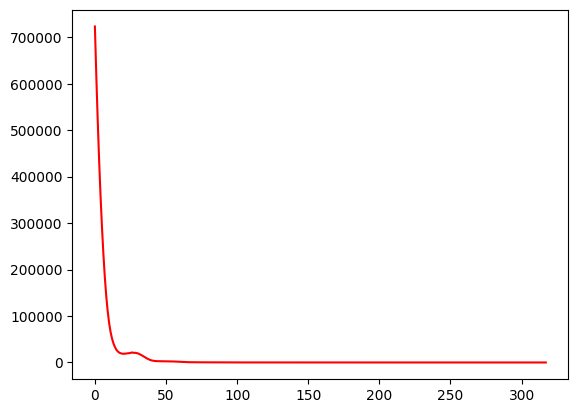

 64%|██████▎   | 318/500 [01:11<00:41,  4.42it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.35028248587571
Dataset Name:  disney , AUC Score (contextual):  54.54545454545454
Dataset Name:  disney , AUC Score (structural):  57.125382262996936
Dataset Name:  disney , AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney , AUC Score (structure type):  59.92303463441452
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


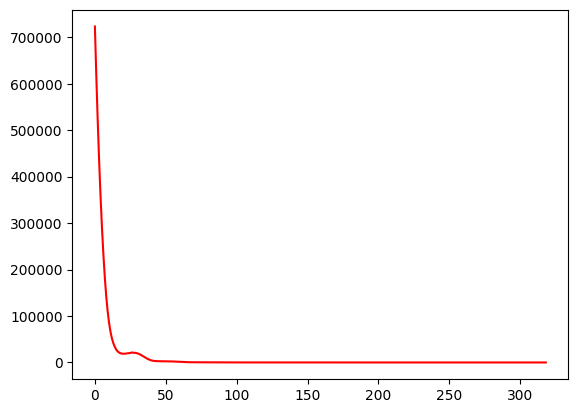

 64%|██████▍   | 319/500 [01:11<00:39,  4.56it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney , AUC Score (contextual):  53.16804407713498
Dataset Name:  disney , AUC Score (structural):  56.75840978593272
Dataset Name:  disney , AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney , AUC Score (structure type):  59.59318306761957
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


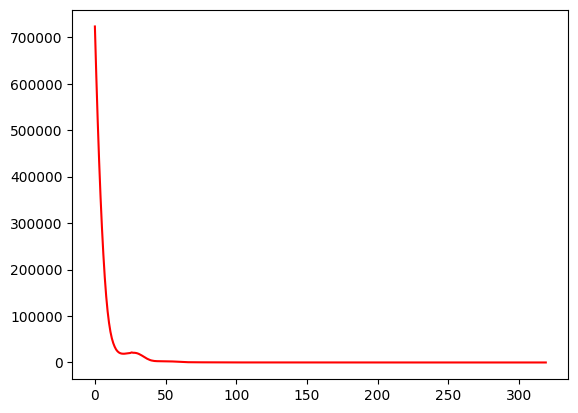

 64%|██████▍   | 320/500 [01:11<00:37,  4.85it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.35028248587571
Dataset Name:  disney , AUC Score (contextual):  52.89256198347106
Dataset Name:  disney , AUC Score (structural):  56.513761467889914
Dataset Name:  disney , AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


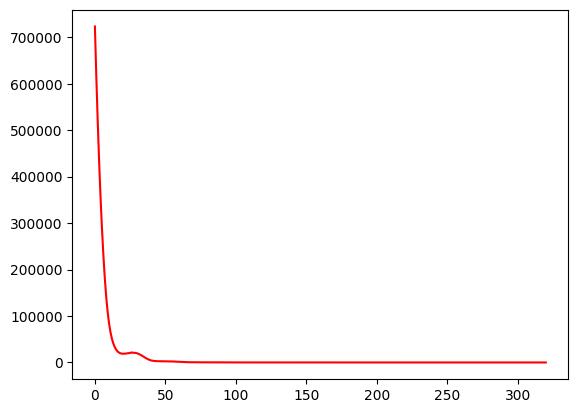

 64%|██████▍   | 321/500 [01:12<00:37,  4.82it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.06779661016948
Dataset Name:  disney , AUC Score (contextual):  53.4435261707989
Dataset Name:  disney , AUC Score (structural):  57.37003058103976
Dataset Name:  disney , AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney , AUC Score (structure type):  60.142935678944475
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


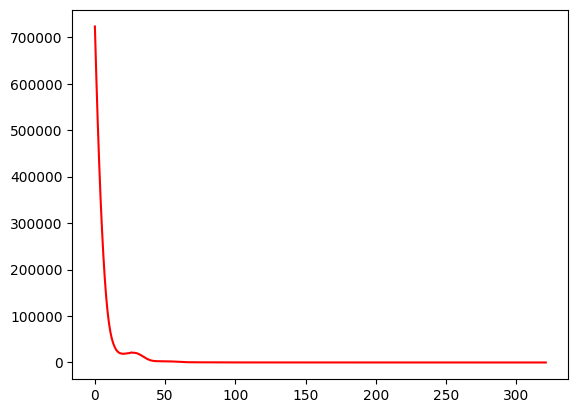

 64%|██████▍   | 322/500 [01:12<00:36,  4.82it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.2090395480226
Dataset Name:  disney , AUC Score (contextual):  54.82093663911846
Dataset Name:  disney , AUC Score (structural):  57.125382262996936
Dataset Name:  disney , AUC Score (joint-type):  81.267217630854
Dataset Name:  disney , AUC Score (structure type):  59.978009895547004
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.267217630854
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


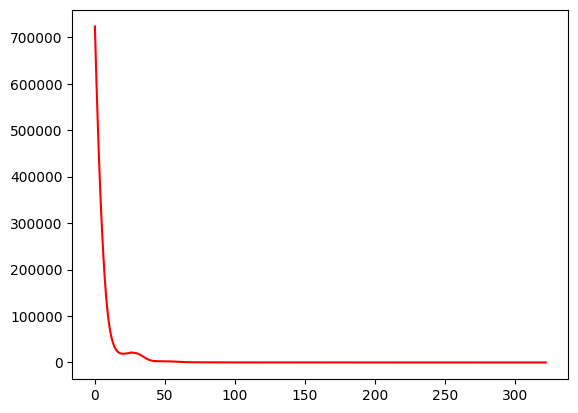

 65%|██████▍   | 323/500 [01:12<00:36,  4.84it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  68.78531073446328
Dataset Name:  disney , AUC Score (contextual):  54.820936639118464
Dataset Name:  disney , AUC Score (structural):  56.75840978593272
Dataset Name:  disney , AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney , AUC Score (structure type):  59.53820780648707
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.44077134986226
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


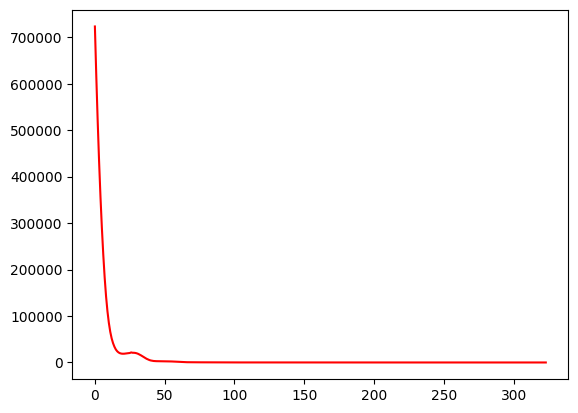

 65%|██████▍   | 324/500 [01:12<00:40,  4.30it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.2090395480226
Dataset Name:  disney , AUC Score (contextual):  54.820936639118464
Dataset Name:  disney , AUC Score (structural):  56.574923547400616
Dataset Name:  disney , AUC Score (joint-type):  80.71625344352617
Dataset Name:  disney , AUC Score (structure type):  59.373282023089615
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.71625344352617
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


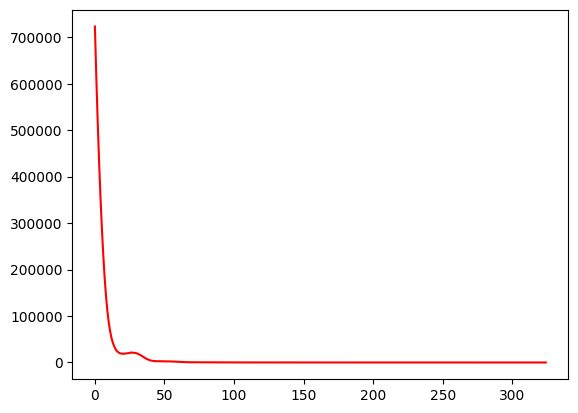

 65%|██████▌   | 325/500 [01:12<00:39,  4.41it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney , AUC Score (contextual):  55.9228650137741
Dataset Name:  disney , AUC Score (structural):  57.125382262996936
Dataset Name:  disney , AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney , AUC Score (structure type):  59.92303463441452
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


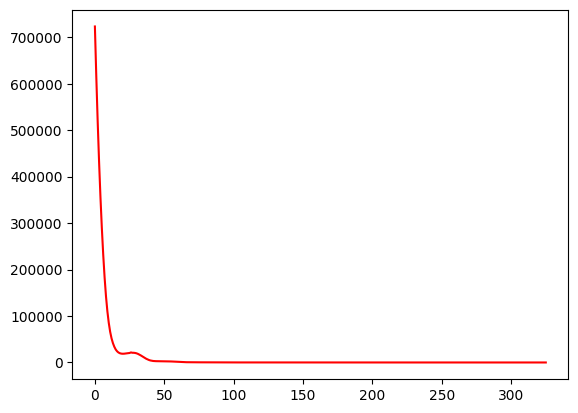

 65%|██████▌   | 326/500 [01:13<00:36,  4.74it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.2090395480226
Dataset Name:  disney , AUC Score (contextual):  55.09641873278237
Dataset Name:  disney , AUC Score (structural):  56.94189602446483
Dataset Name:  disney , AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney , AUC Score (structure type):  59.75810885101704
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


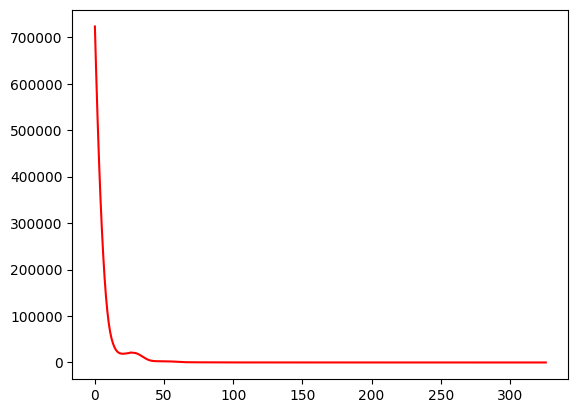

 65%|██████▌   | 327/500 [01:13<00:36,  4.77it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney , AUC Score (contextual):  55.37190082644627
Dataset Name:  disney , AUC Score (structural):  57.37003058103976
Dataset Name:  disney , AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney , AUC Score (structure type):  60.142935678944475
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


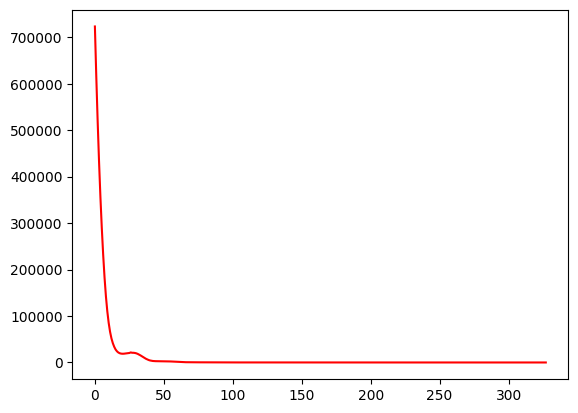

 66%|██████▌   | 328/500 [01:13<00:38,  4.50it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.63276836158192
Dataset Name:  disney , AUC Score (contextual):  56.74931129476584
Dataset Name:  disney , AUC Score (structural):  57.43119266055046
Dataset Name:  disney , AUC Score (joint-type):  81.267217630854
Dataset Name:  disney , AUC Score (structure type):  60.252886201209456
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.63276836158192
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.267217630854
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


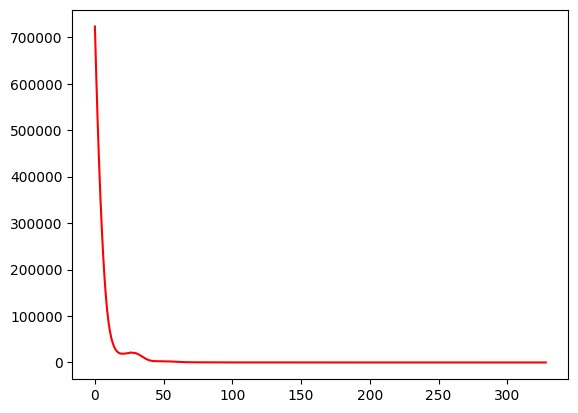

 66%|██████▌   | 329/500 [01:13<00:37,  4.62it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.35028248587571
Dataset Name:  disney , AUC Score (contextual):  55.09641873278237
Dataset Name:  disney , AUC Score (structural):  56.5137614678899
Dataset Name:  disney , AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney , AUC Score (structure type):  59.373282023089615
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.63276836158192
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.9917355371901
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


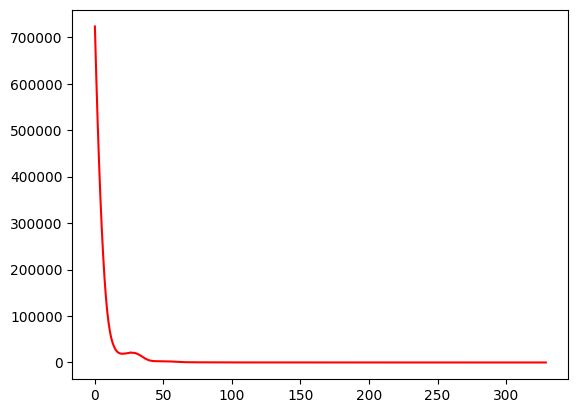

 66%|██████▌   | 330/500 [01:13<00:34,  4.87it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.4915254237288
Dataset Name:  disney , AUC Score (contextual):  55.9228650137741
Dataset Name:  disney , AUC Score (structural):  56.75840978593272
Dataset Name:  disney , AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney , AUC Score (structure type):  59.70313358988455
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.63276836158192
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


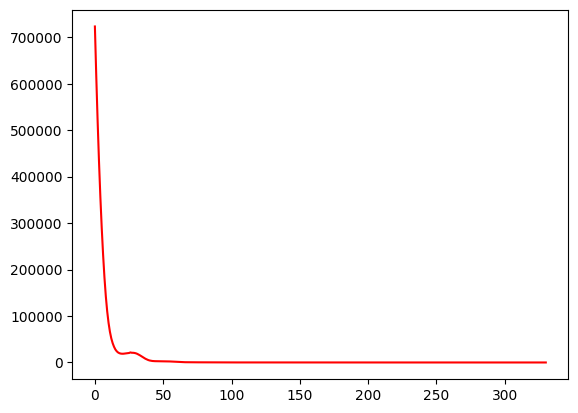

 66%|██████▌   | 331/500 [01:14<00:33,  5.11it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.2090395480226
Dataset Name:  disney , AUC Score (contextual):  54.82093663911846
Dataset Name:  disney , AUC Score (structural):  56.14678899082569
Dataset Name:  disney , AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.63276836158192
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


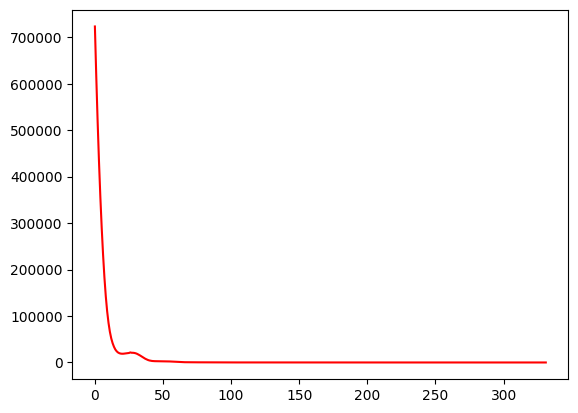

 66%|██████▋   | 332/500 [01:14<00:32,  5.24it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney , AUC Score (contextual):  55.371900826446286
Dataset Name:  disney , AUC Score (structural):  56.26911314984711
Dataset Name:  disney , AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney , AUC Score (structure type):  59.373282023089615
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.63276836158192
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


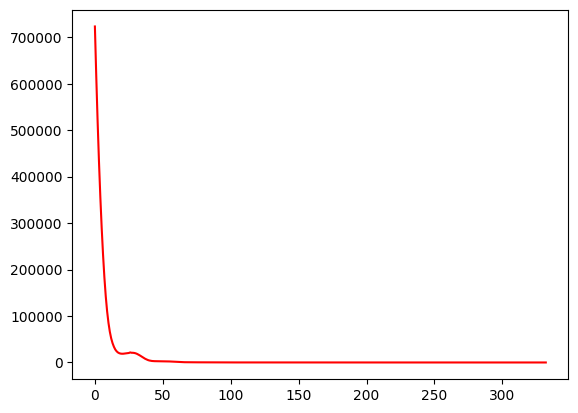

 67%|██████▋   | 333/500 [01:14<00:32,  5.10it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.77401129943503
Dataset Name:  disney , AUC Score (contextual):  55.9228650137741
Dataset Name:  disney , AUC Score (structural):  56.88073394495413
Dataset Name:  disney , AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney , AUC Score (structure type):  59.923034634414506
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.77401129943503
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


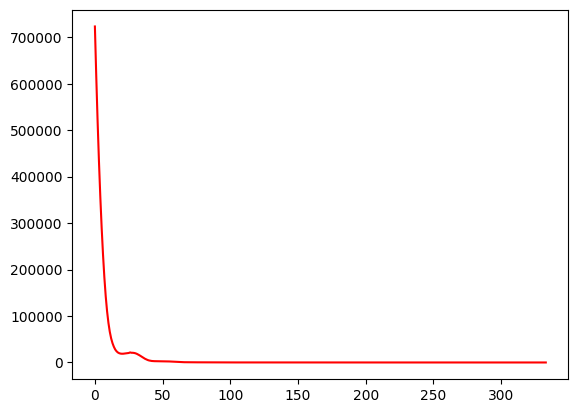

 67%|██████▋   | 334/500 [01:14<00:33,  4.94it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.49152542372882
Dataset Name:  disney , AUC Score (contextual):  56.473829201101935
Dataset Name:  disney , AUC Score (structural):  56.75840978593273
Dataset Name:  disney , AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney , AUC Score (structure type):  59.70313358988455
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.77401129943503
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


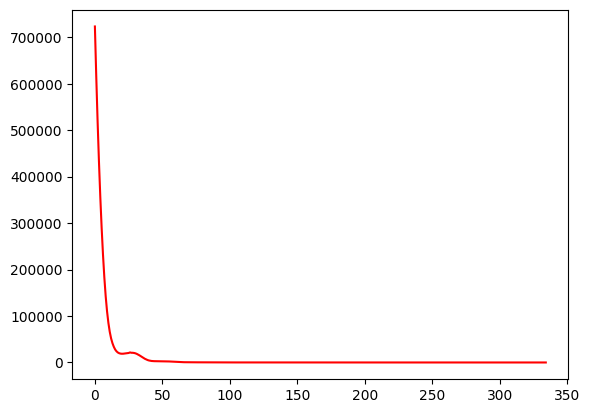

 67%|██████▋   | 335/500 [01:15<00:35,  4.59it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.4915254237288
Dataset Name:  disney , AUC Score (contextual):  55.9228650137741
Dataset Name:  disney , AUC Score (structural):  56.513761467889914
Dataset Name:  disney , AUC Score (joint-type):  80.99173553719008
Dataset Name:  disney , AUC Score (structure type):  59.48323254535459
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.77401129943503
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  80.99173553719008
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


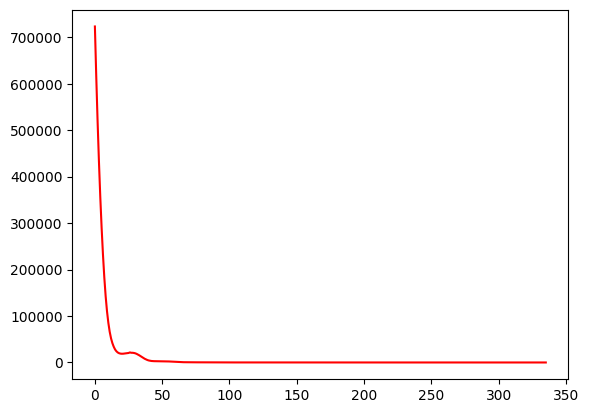

 67%|██████▋   | 336/500 [01:15<00:36,  4.51it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.63276836158192
Dataset Name:  disney , AUC Score (contextual):  56.19834710743801
Dataset Name:  disney , AUC Score (structural):  56.63608562691132
Dataset Name:  disney , AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney , AUC Score (structure type):  59.64815832875207
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.77401129943503
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


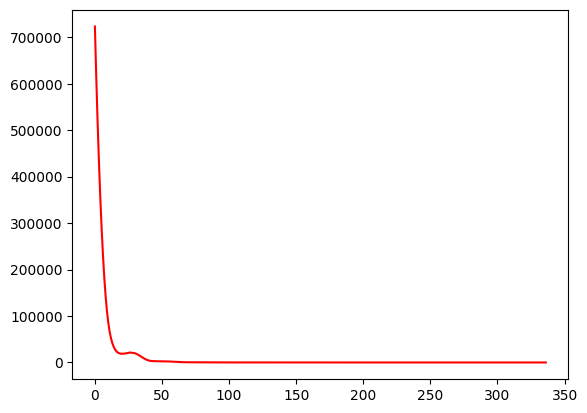

 67%|██████▋   | 337/500 [01:15<00:34,  4.78it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.63276836158192
Dataset Name:  disney , AUC Score (contextual):  56.19834710743801
Dataset Name:  disney , AUC Score (structural):  56.81957186544342
Dataset Name:  disney , AUC Score (joint-type):  81.267217630854
Dataset Name:  disney , AUC Score (structure type):  59.75810885101704
Dataset Name:  disney  Best AUC Score(benchmark/combined):  69.77401129943503
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.267217630854
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


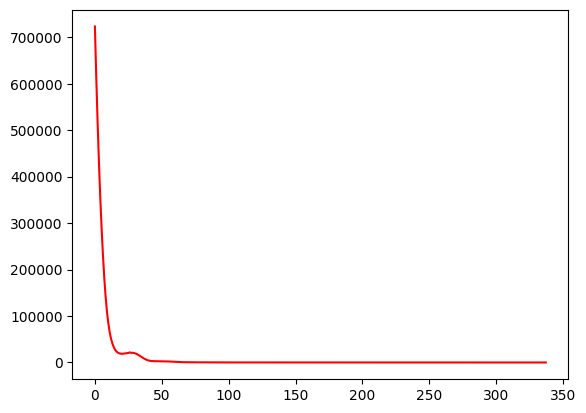

 68%|██████▊   | 338/500 [01:15<00:32,  4.97it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.05649717514125
Dataset Name:  disney , AUC Score (contextual):  56.473829201101935
Dataset Name:  disney , AUC Score (structural):  56.574923547400616
Dataset Name:  disney , AUC Score (joint-type):  81.26721763085399
Dataset Name:  disney , AUC Score (structure type):  59.59318306761957
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.05649717514125
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.26721763085399
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


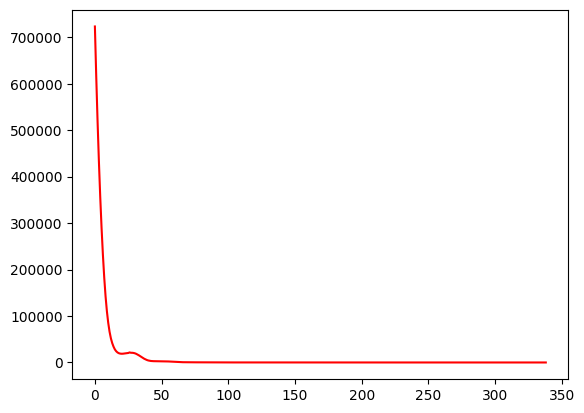

 68%|██████▊   | 339/500 [01:15<00:33,  4.88it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.19774011299435
Dataset Name:  disney , AUC Score (contextual):  56.47382920110192
Dataset Name:  disney , AUC Score (structural):  56.513761467889914
Dataset Name:  disney , AUC Score (joint-type):  81.267217630854
Dataset Name:  disney , AUC Score (structure type):  59.48323254535459
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.19774011299435
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.267217630854
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


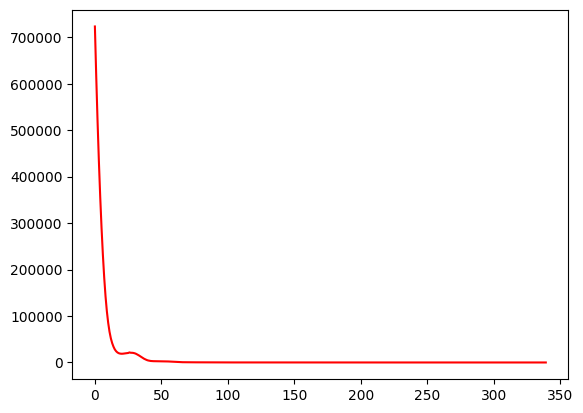

 68%|██████▊   | 340/500 [01:16<00:34,  4.62it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney , AUC Score (contextual):  56.74931129476584
Dataset Name:  disney , AUC Score (structural):  56.45259938837921
Dataset Name:  disney , AUC Score (joint-type):  81.26721763085399
Dataset Name:  disney , AUC Score (structure type):  59.48323254535459
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.26721763085399
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


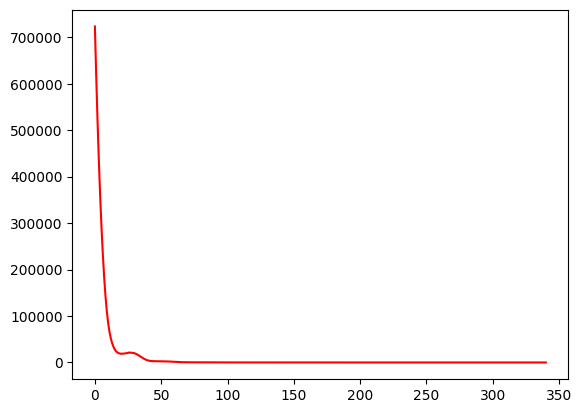

 68%|██████▊   | 341/500 [01:16<00:34,  4.62it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney , AUC Score (contextual):  57.30027548209367
Dataset Name:  disney , AUC Score (structural):  56.20795107033638
Dataset Name:  disney , AUC Score (joint-type):  81.26721763085399
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.26721763085399
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


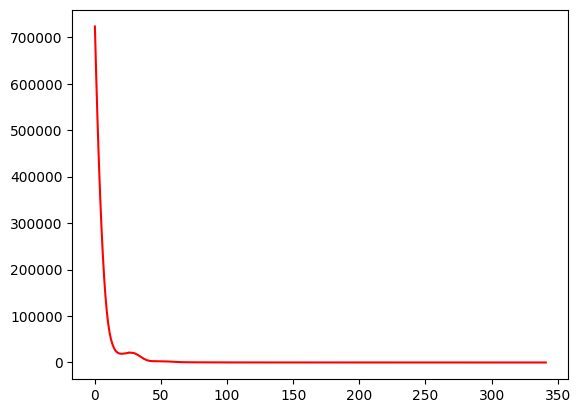

 68%|██████▊   | 342/500 [01:16<00:34,  4.63it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney , AUC Score (contextual):  57.02479338842974
Dataset Name:  disney , AUC Score (structural):  56.33027522935781
Dataset Name:  disney , AUC Score (joint-type):  81.26721763085399
Dataset Name:  disney , AUC Score (structure type):  59.3732820230896
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.26721763085399
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


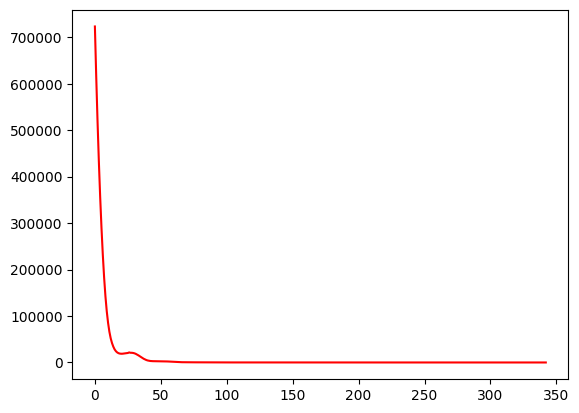

 69%|██████▊   | 343/500 [01:16<00:32,  4.84it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.91525423728814
Dataset Name:  disney , AUC Score (contextual):  56.473829201101935
Dataset Name:  disney , AUC Score (structural):  56.330275229357795
Dataset Name:  disney , AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney , AUC Score (structure type):  59.4282572842221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


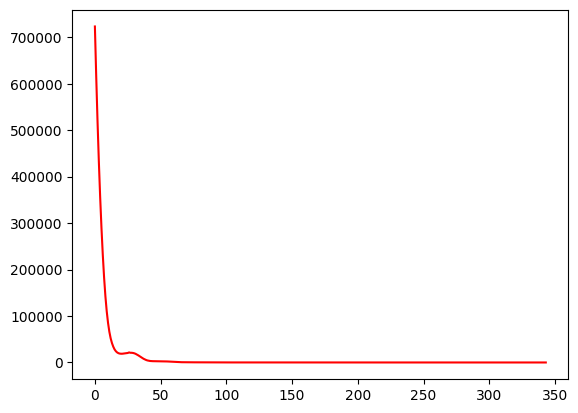

 69%|██████▉   | 344/500 [01:16<00:32,  4.83it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.63276836158192
Dataset Name:  disney , AUC Score (contextual):  56.19834710743802
Dataset Name:  disney , AUC Score (structural):  56.3914373088685
Dataset Name:  disney , AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney , AUC Score (structure type):  59.53820780648709
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


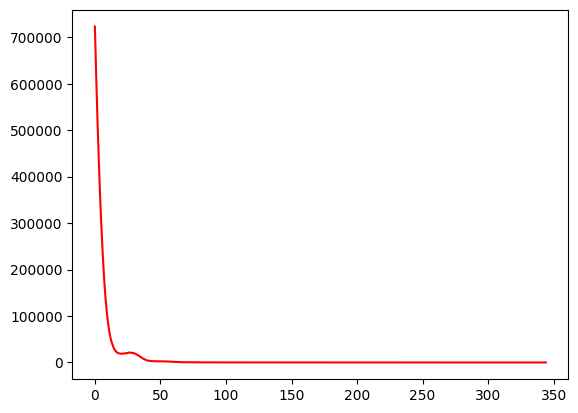

 69%|██████▉   | 345/500 [01:17<00:32,  4.81it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.63276836158192
Dataset Name:  disney , AUC Score (contextual):  55.9228650137741
Dataset Name:  disney , AUC Score (structural):  56.02446483180429
Dataset Name:  disney , AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


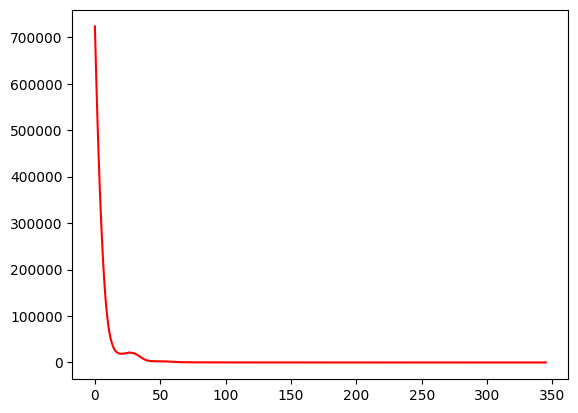

 69%|██████▉   | 346/500 [01:17<00:32,  4.78it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.77401129943503
Dataset Name:  disney , AUC Score (contextual):  56.74931129476584
Dataset Name:  disney , AUC Score (structural):  55.96330275229357
Dataset Name:  disney , AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


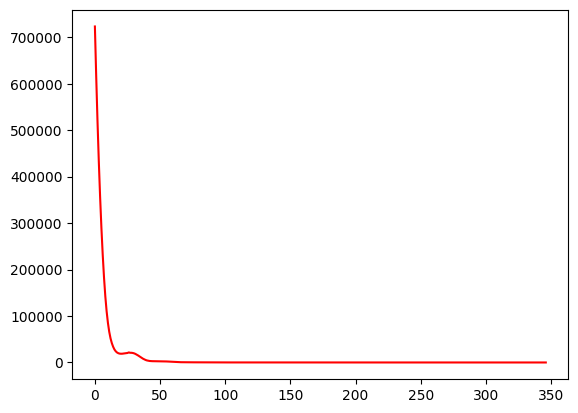

 69%|██████▉   | 347/500 [01:17<00:32,  4.75it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  69.91525423728814
Dataset Name:  disney , AUC Score (contextual):  56.74931129476584
Dataset Name:  disney , AUC Score (structural):  55.90214067278288
Dataset Name:  disney , AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney , AUC Score (structure type):  59.09840571742715
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


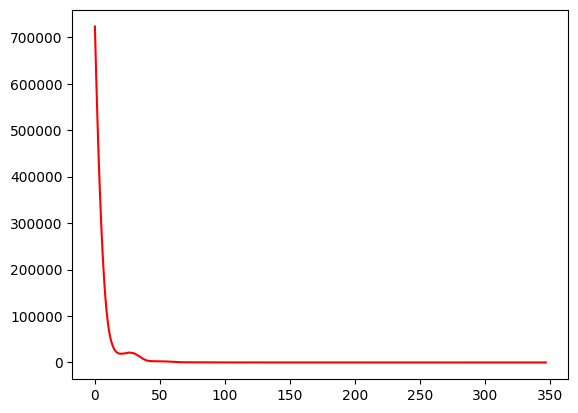

 70%|██████▉   | 348/500 [01:17<00:30,  4.96it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney , AUC Score (contextual):  57.30027548209365
Dataset Name:  disney , AUC Score (structural):  56.20795107033639
Dataset Name:  disney , AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney , AUC Score (structure type):  59.373282023089615
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.33898305084746
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


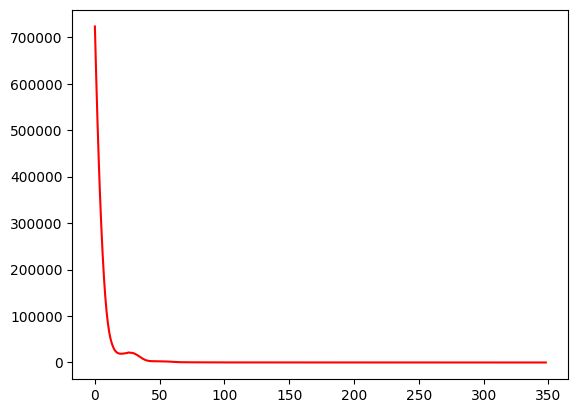

 70%|██████▉   | 349/500 [01:17<00:29,  5.10it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.48022598870057
Dataset Name:  disney , AUC Score (contextual):  57.30027548209367
Dataset Name:  disney , AUC Score (structural):  56.02446483180428
Dataset Name:  disney , AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.48022598870057
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


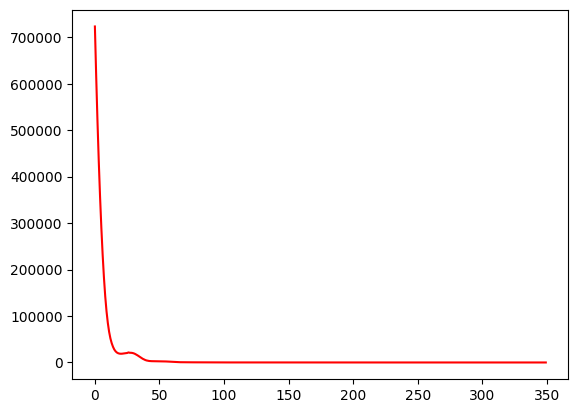

 70%|███████   | 350/500 [01:18<00:30,  5.00it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.62146892655367
Dataset Name:  disney , AUC Score (contextual):  57.57575757575757
Dataset Name:  disney , AUC Score (structural):  56.20795107033638
Dataset Name:  disney , AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney , AUC Score (structure type):  59.3732820230896
Dataset Name:  disney  Best AUC Score(benchmark/combined):  70.62146892655367
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.81818181818181
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


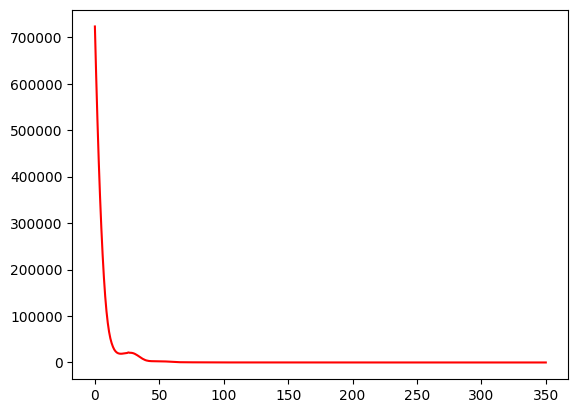

 70%|███████   | 351/500 [01:18<00:30,  4.93it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.045197740113
Dataset Name:  disney , AUC Score (contextual):  58.40220385674931
Dataset Name:  disney , AUC Score (structural):  56.574923547400616
Dataset Name:  disney , AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney , AUC Score (structure type):  59.70313358988455
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.045197740113
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


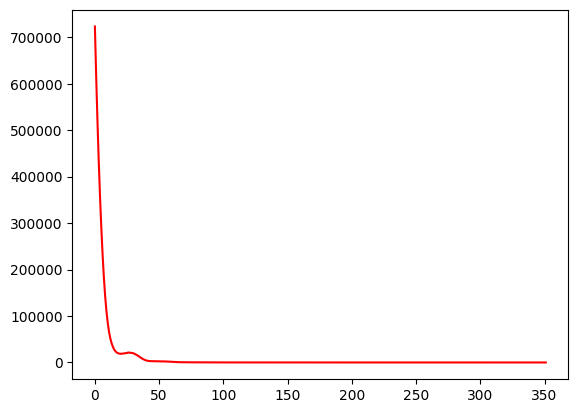

 70%|███████   | 352/500 [01:18<00:30,  4.85it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.90395480225989
Dataset Name:  disney , AUC Score (contextual):  58.67768595041323
Dataset Name:  disney , AUC Score (structural):  56.574923547400616
Dataset Name:  disney , AUC Score (joint-type):  81.26721763085398
Dataset Name:  disney , AUC Score (structure type):  59.70313358988456
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.045197740113
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.26721763085398
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


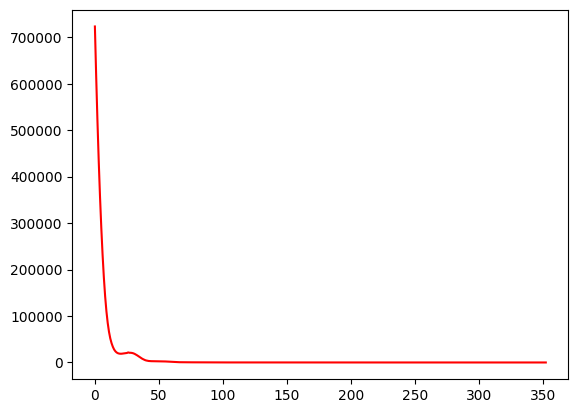

 71%|███████   | 353/500 [01:18<00:29,  5.02it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.62146892655367
Dataset Name:  disney , AUC Score (contextual):  58.67768595041321
Dataset Name:  disney , AUC Score (structural):  56.20795107033639
Dataset Name:  disney , AUC Score (joint-type):  81.26721763085398
Dataset Name:  disney , AUC Score (structure type):  59.373282023089615
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.045197740113
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.26721763085398
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


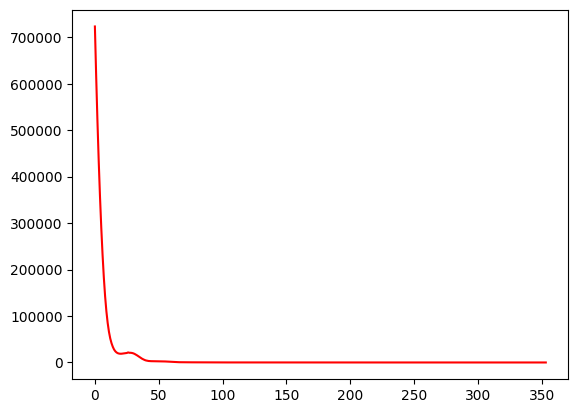

 71%|███████   | 354/500 [01:18<00:29,  4.95it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.62146892655367
Dataset Name:  disney , AUC Score (contextual):  59.22865013774105
Dataset Name:  disney , AUC Score (structural):  56.085626911314975
Dataset Name:  disney , AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney , AUC Score (structure type):  59.31830676195713
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.045197740113
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


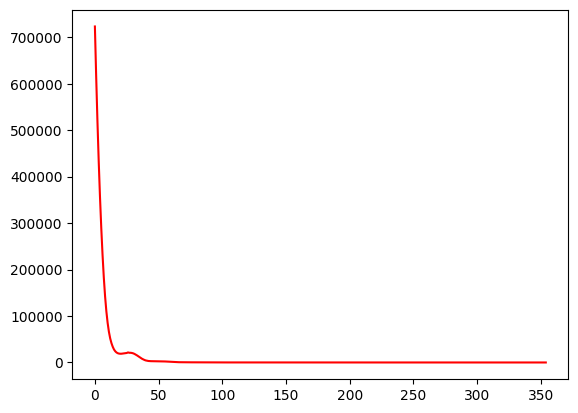

 71%|███████   | 355/500 [01:19<00:29,  4.86it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.90395480225989
Dataset Name:  disney , AUC Score (contextual):  59.50413223140496
Dataset Name:  disney , AUC Score (structural):  56.085626911314975
Dataset Name:  disney , AUC Score (joint-type):  81.26721763085398
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.045197740113
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.26721763085398
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


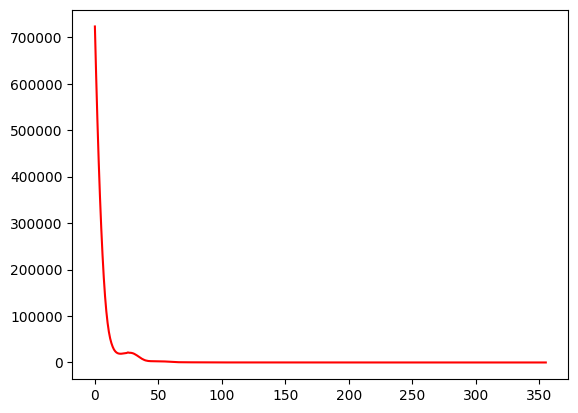

 71%|███████   | 356/500 [01:19<00:28,  5.04it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.90395480225989
Dataset Name:  disney , AUC Score (contextual):  59.22865013774105
Dataset Name:  disney , AUC Score (structural):  56.20795107033638
Dataset Name:  disney , AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney , AUC Score (structure type):  59.428257284222106
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.045197740113
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


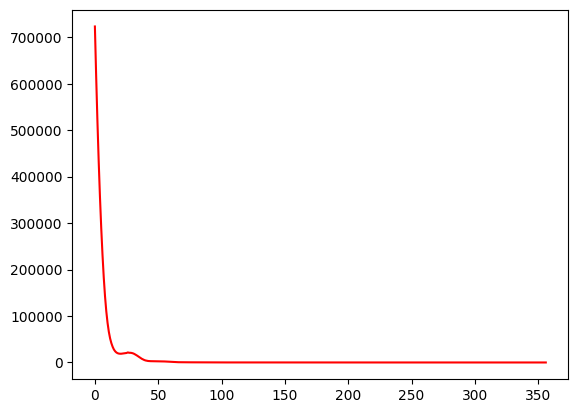

 71%|███████▏  | 357/500 [01:19<00:27,  5.15it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  70.90395480225989
Dataset Name:  disney , AUC Score (contextual):  58.40220385674931
Dataset Name:  disney , AUC Score (structural):  56.14678899082569
Dataset Name:  disney , AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney , AUC Score (structure type):  59.428257284222106
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.045197740113
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  81.5426997245179
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


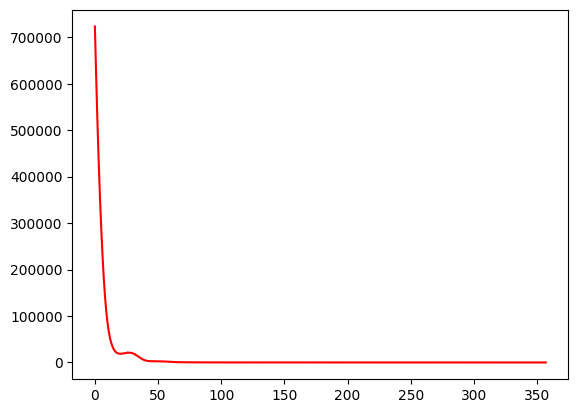

 72%|███████▏  | 358/500 [01:19<00:27,  5.25it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.1864406779661
Dataset Name:  disney , AUC Score (contextual):  58.40220385674931
Dataset Name:  disney , AUC Score (structural):  55.96330275229357
Dataset Name:  disney , AUC Score (joint-type):  82.09366391184574
Dataset Name:  disney , AUC Score (structure type):  59.3732820230896
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.1864406779661
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.09366391184574
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


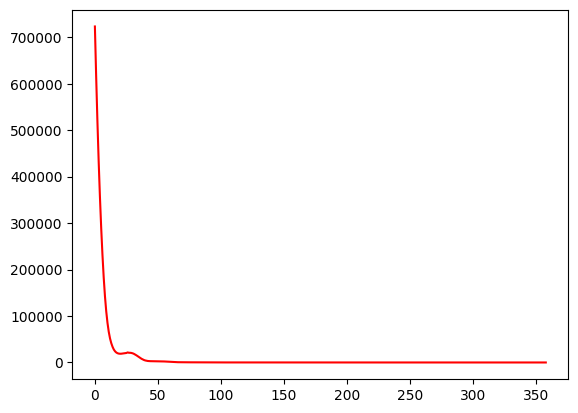

 72%|███████▏  | 359/500 [01:19<00:27,  5.10it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.045197740113
Dataset Name:  disney , AUC Score (contextual):  58.40220385674931
Dataset Name:  disney , AUC Score (structural):  55.96330275229357
Dataset Name:  disney , AUC Score (joint-type):  82.09366391184574
Dataset Name:  disney , AUC Score (structure type):  59.373282023089615
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.1864406779661
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.09366391184574
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


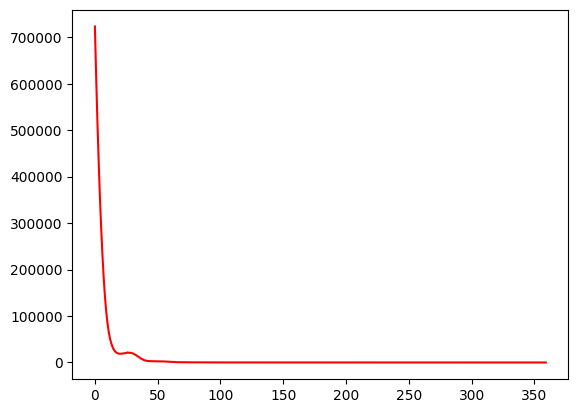

 72%|███████▏  | 360/500 [01:20<00:28,  4.99it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.18644067796612
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  55.90214067278288
Dataset Name:  disney , AUC Score (joint-type):  82.09366391184574
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.18644067796612
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.09366391184574
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


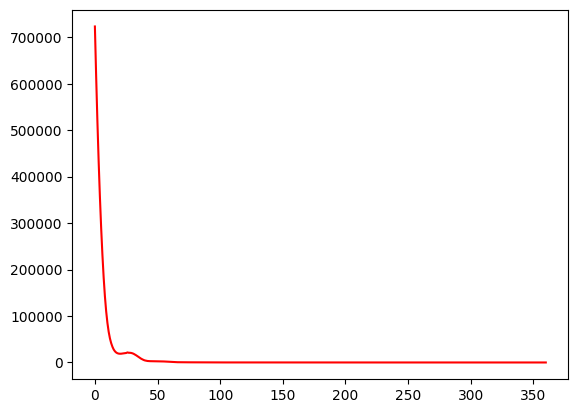

 72%|███████▏  | 361/500 [01:20<00:28,  4.89it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.32768361581921
Dataset Name:  disney , AUC Score (contextual):  58.40220385674931
Dataset Name:  disney , AUC Score (structural):  55.779816513761475
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.32768361581921
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


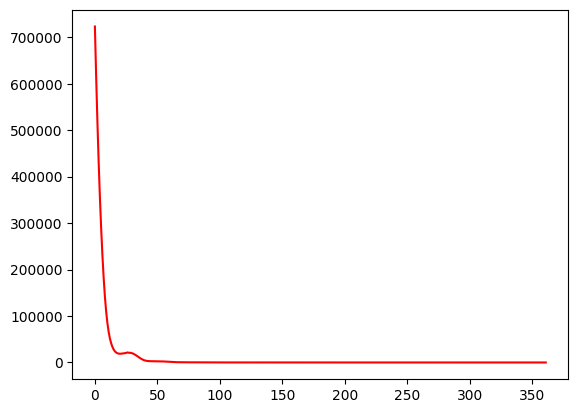

 72%|███████▏  | 362/500 [01:20<00:28,  4.82it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  55.90214067278288
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  59.373282023089615
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


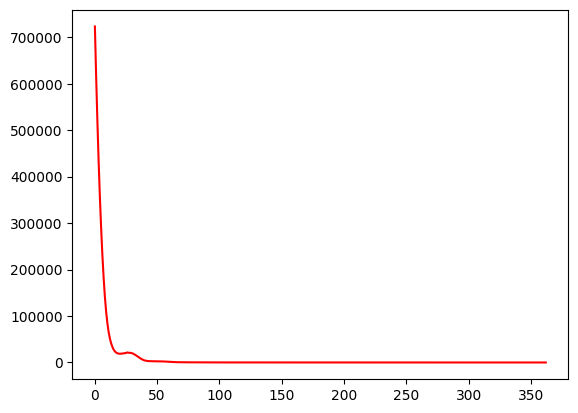

 73%|███████▎  | 363/500 [01:20<00:27,  5.01it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  55.84097859327217
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


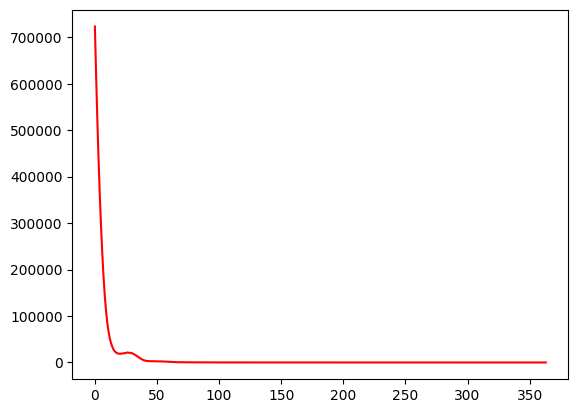

 73%|███████▎  | 364/500 [01:20<00:26,  5.04it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.46892655367232
Dataset Name:  disney , AUC Score (contextual):  58.953168044077145
Dataset Name:  disney , AUC Score (structural):  55.65749235474007
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


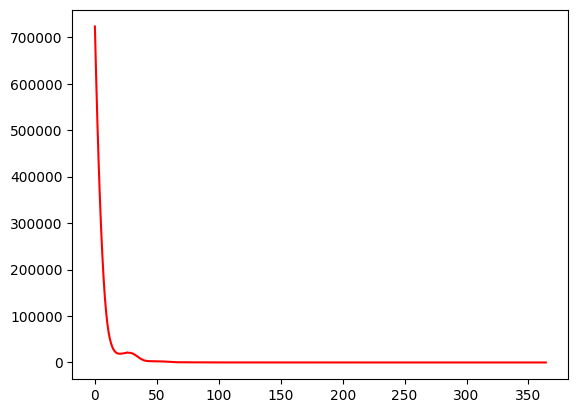

 73%|███████▎  | 365/500 [01:21<00:28,  4.77it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney , AUC Score (contextual):  59.22865013774105
Dataset Name:  disney , AUC Score (structural):  55.96330275229357
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  59.428257284222106
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


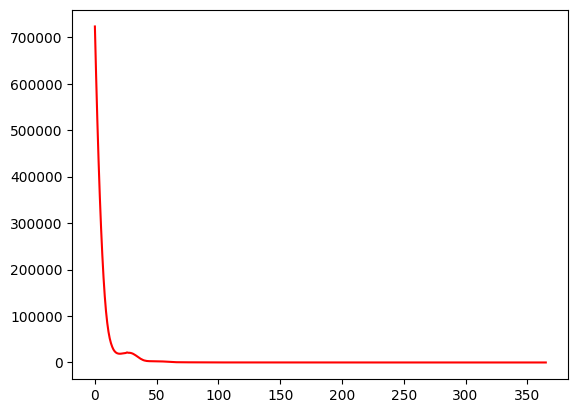

 73%|███████▎  | 366/500 [01:21<00:28,  4.74it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  56.146788990825684
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney , AUC Score (structure type):  59.64815832875207
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


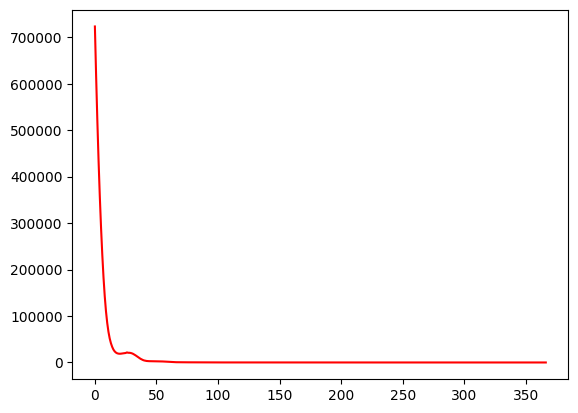

 73%|███████▎  | 367/500 [01:21<00:26,  4.96it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  55.90214067278288
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney , AUC Score (structure type):  59.4282572842221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


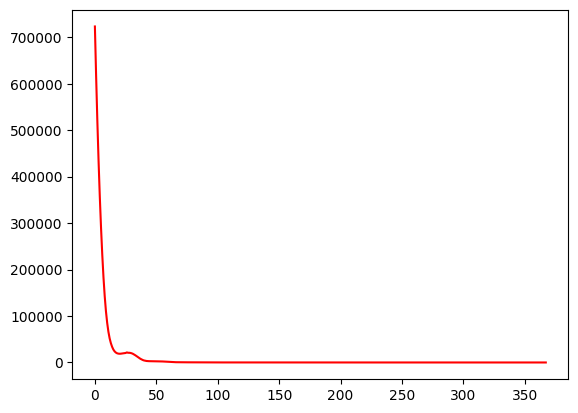

 74%|███████▎  | 368/500 [01:21<00:25,  5.12it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  55.596330275229356
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


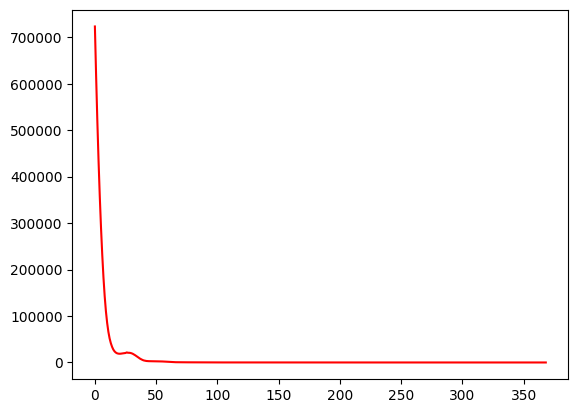

 74%|███████▍  | 369/500 [01:21<00:27,  4.82it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  55.596330275229356
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


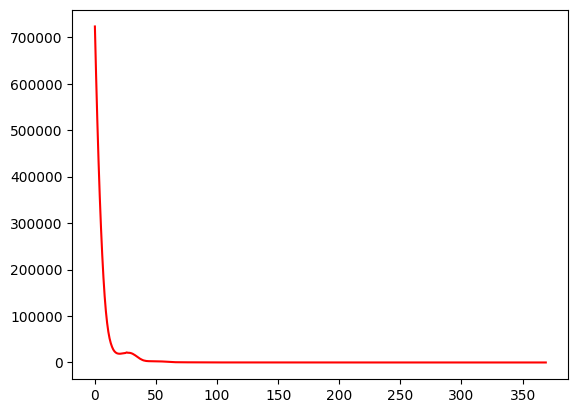

 74%|███████▍  | 370/500 [01:22<00:35,  3.67it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  55.53516819571864
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney , AUC Score (structure type):  59.09840571742716
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


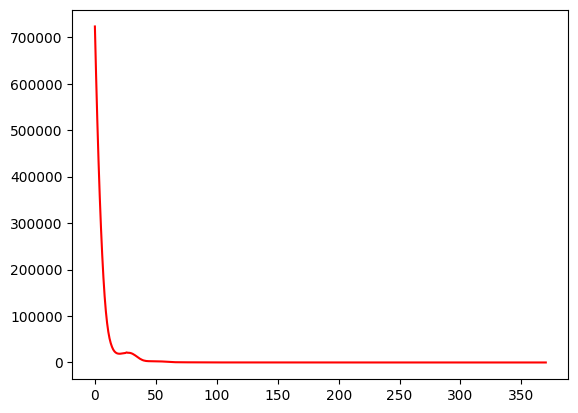

 74%|███████▍  | 371/500 [01:22<00:32,  3.93it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney , AUC Score (contextual):  59.22865013774105
Dataset Name:  disney , AUC Score (structural):  55.718654434250766
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


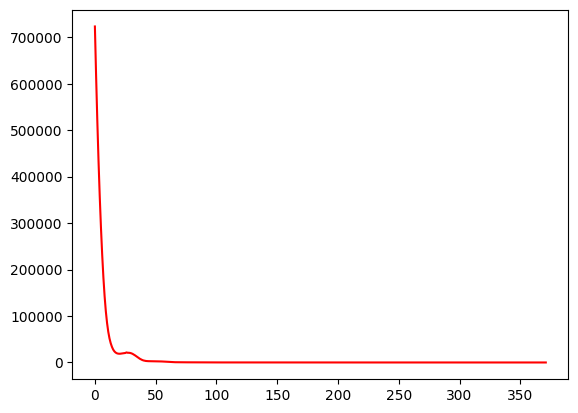

 74%|███████▍  | 372/500 [01:22<00:29,  4.29it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  55.59633027522936
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


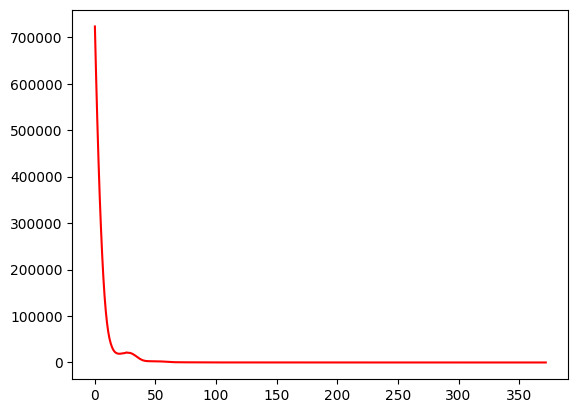

 75%|███████▍  | 373/500 [01:23<00:32,  3.96it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  55.596330275229356
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


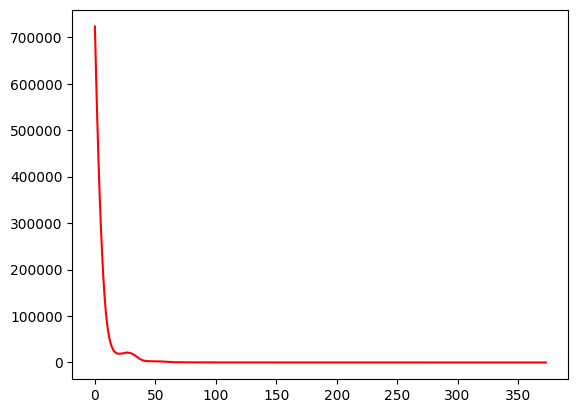

 75%|███████▍  | 374/500 [01:23<00:30,  4.14it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney , AUC Score (contextual):  59.22865013774105
Dataset Name:  disney , AUC Score (structural):  55.65749235474006
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


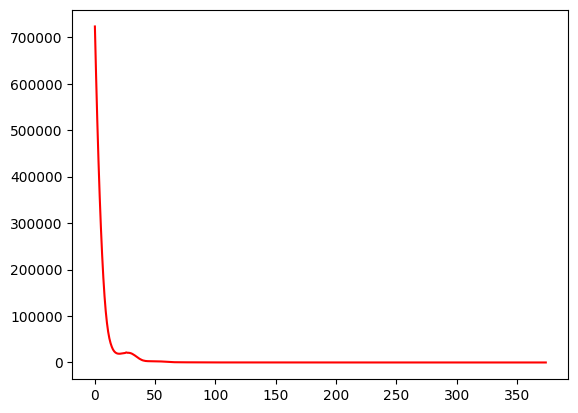

 75%|███████▌  | 375/500 [01:23<00:27,  4.48it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  58.40220385674931
Dataset Name:  disney , AUC Score (structural):  55.351681957186535
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


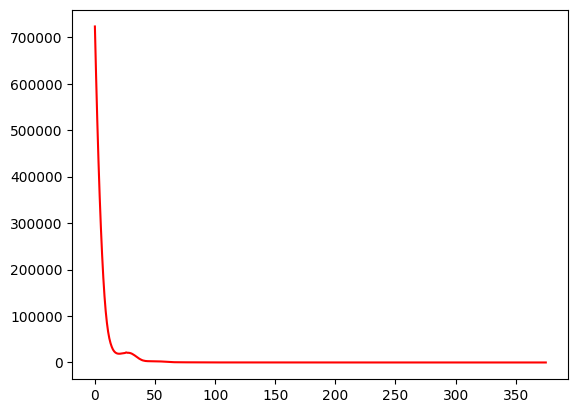

 75%|███████▌  | 376/500 [01:23<00:28,  4.41it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  55.351681957186535
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


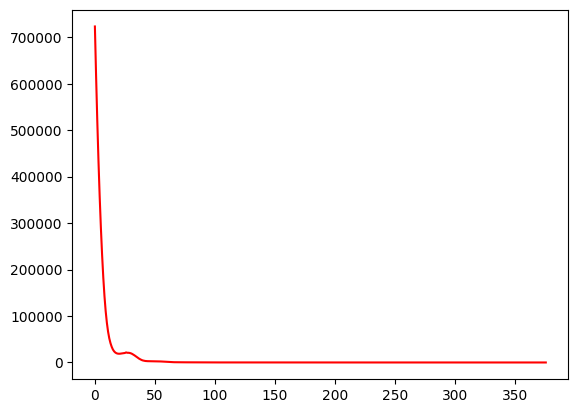

 75%|███████▌  | 377/500 [01:23<00:27,  4.54it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  55.41284403669724
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  59.04343045629468
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


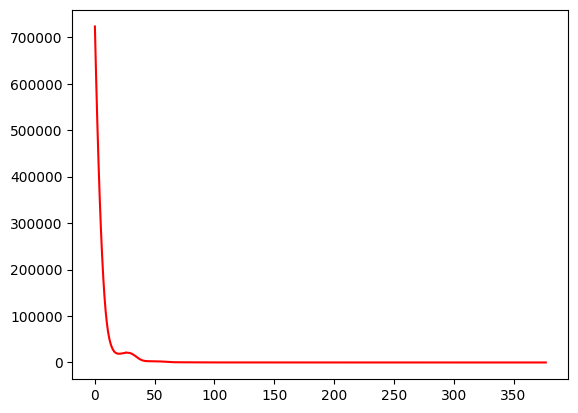

 76%|███████▌  | 378/500 [01:24<00:25,  4.79it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  58.95316804407713
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  58.87850467289719
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


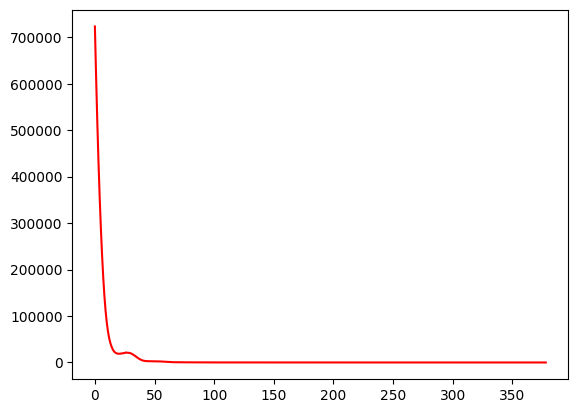

 76%|███████▌  | 379/500 [01:24<00:24,  5.00it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  59.22865013774105
Dataset Name:  disney , AUC Score (structural):  55.290519877675834
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


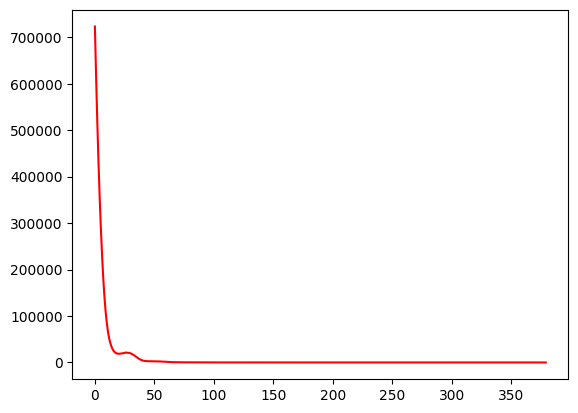

 76%|███████▌  | 380/500 [01:24<00:24,  4.91it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  59.22865013774105
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney , AUC Score (structure type):  58.87850467289719
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


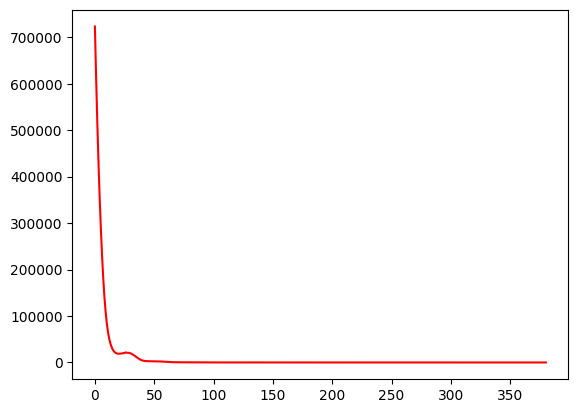

 76%|███████▌  | 381/500 [01:24<00:23,  5.07it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  59.50413223140495
Dataset Name:  disney , AUC Score (structural):  55.04587155963303
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney , AUC Score (structure type):  58.71357888949973
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


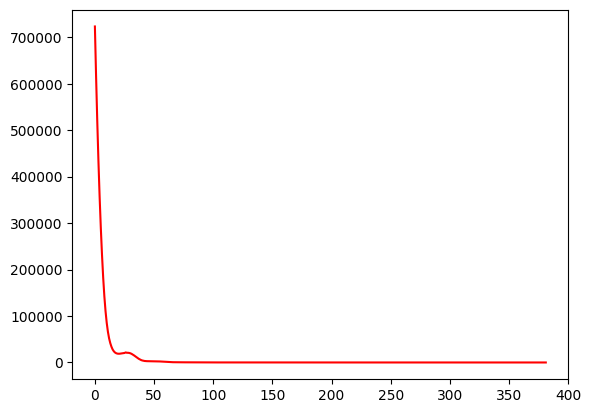

 76%|███████▋  | 382/500 [01:24<00:22,  5.15it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  59.77961432506886
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney , AUC Score (structure type):  58.76855415063221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


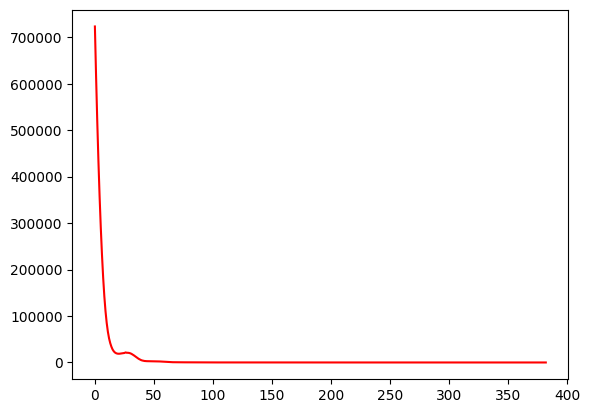

 77%|███████▋  | 383/500 [01:25<00:23,  4.98it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  59.77961432506886
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney , AUC Score (structure type):  58.8785046728972
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917356
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


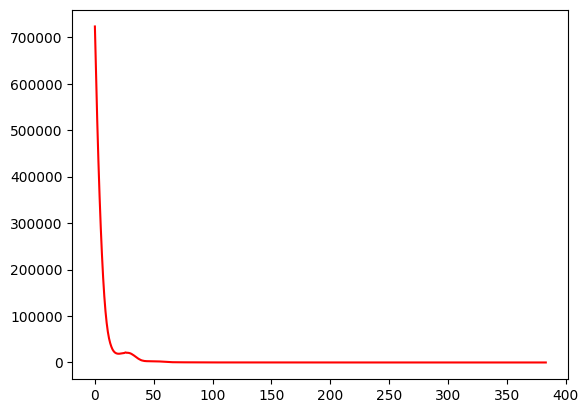

 77%|███████▋  | 384/500 [01:25<00:22,  5.09it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  59.50413223140495
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


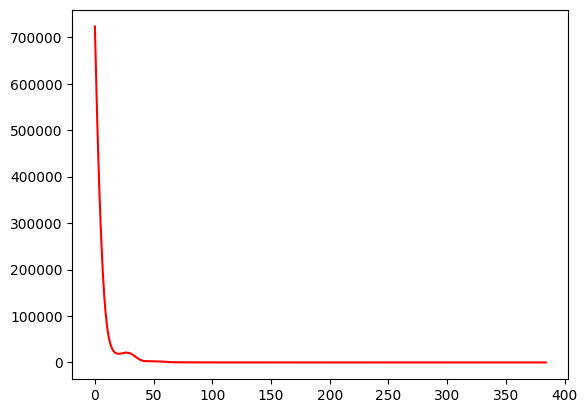

 77%|███████▋  | 385/500 [01:25<00:23,  4.98it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


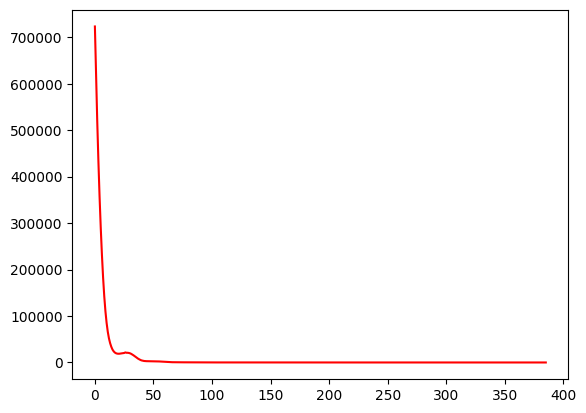

 77%|███████▋  | 386/500 [01:25<00:23,  4.84it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  59.77961432506886
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


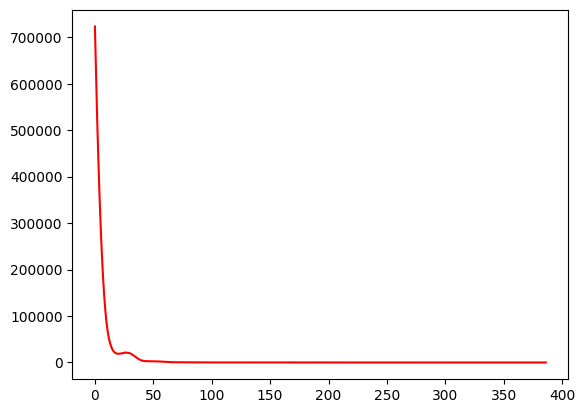

 77%|███████▋  | 387/500 [01:25<00:22,  5.01it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


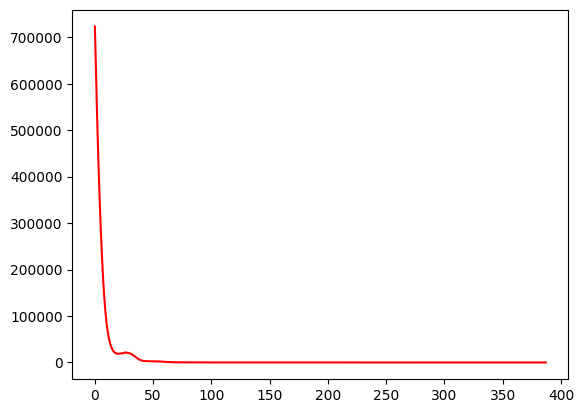

 78%|███████▊  | 388/500 [01:26<00:23,  4.82it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  55.35168195718655
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  59.043430456294665
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


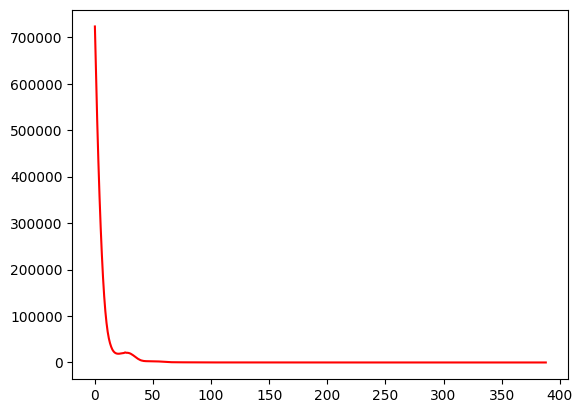

 78%|███████▊  | 389/500 [01:26<00:23,  4.74it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  55.47400611620794
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


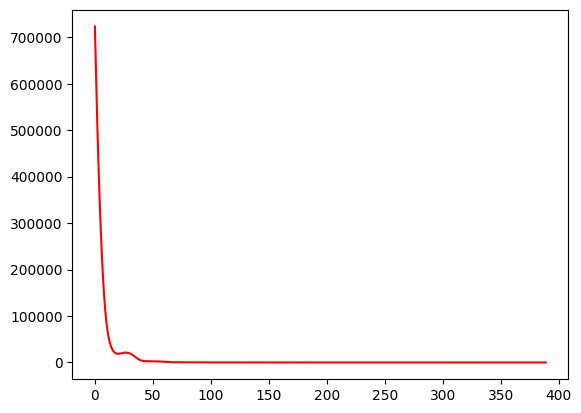

 78%|███████▊  | 390/500 [01:26<00:23,  4.73it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  60.60606060606061
Dataset Name:  disney , AUC Score (structural):  55.41284403669724
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


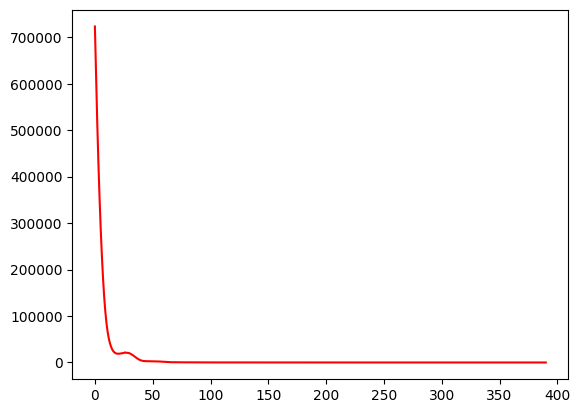

 78%|███████▊  | 391/500 [01:26<00:23,  4.70it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney , AUC Score (contextual):  60.88154269972452
Dataset Name:  disney , AUC Score (structural):  55.351681957186535
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  59.09840571742715
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


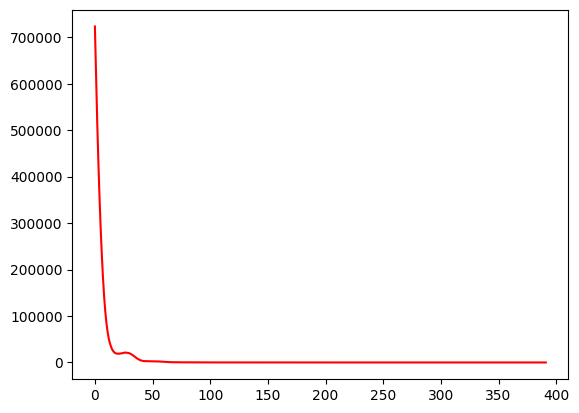

 78%|███████▊  | 392/500 [01:26<00:22,  4.71it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  55.41284403669725
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


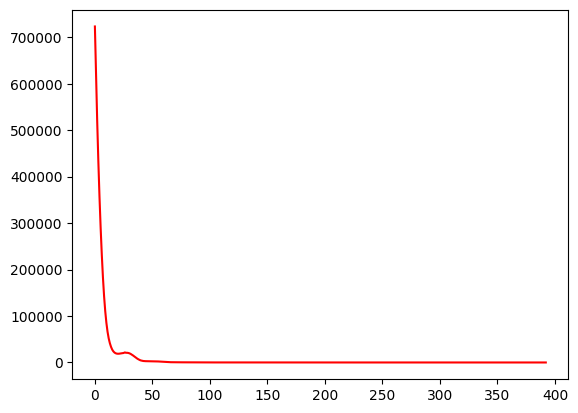

 79%|███████▊  | 393/500 [01:27<00:22,  4.66it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  59.77961432506886
Dataset Name:  disney , AUC Score (structural):  55.290519877675834
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.09840571742716
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


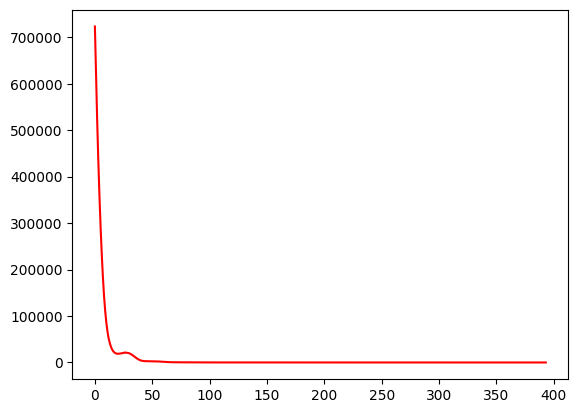

 79%|███████▉  | 394/500 [01:27<00:22,  4.66it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  59.77961432506886
Dataset Name:  disney , AUC Score (structural):  55.351681957186535
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


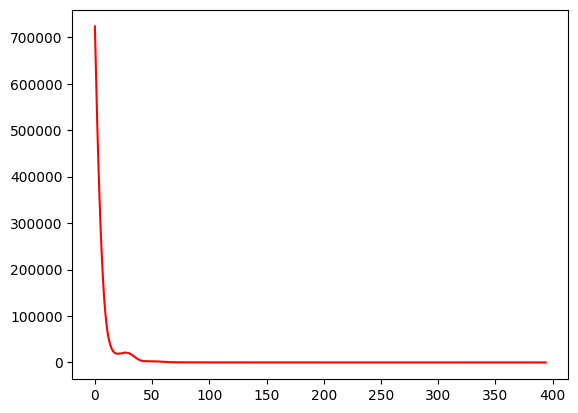

 79%|███████▉  | 395/500 [01:27<00:22,  4.61it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  59.77961432506886
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.04343045629468
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


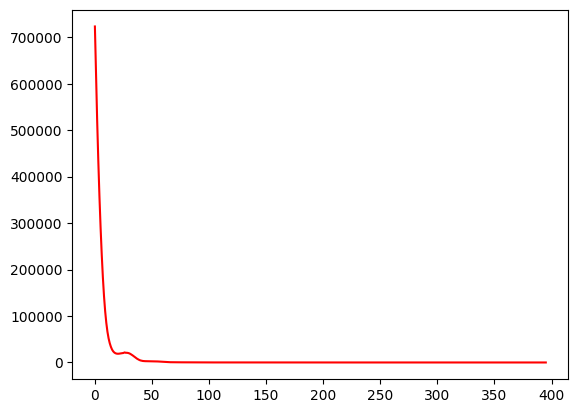

 79%|███████▉  | 396/500 [01:27<00:25,  4.13it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


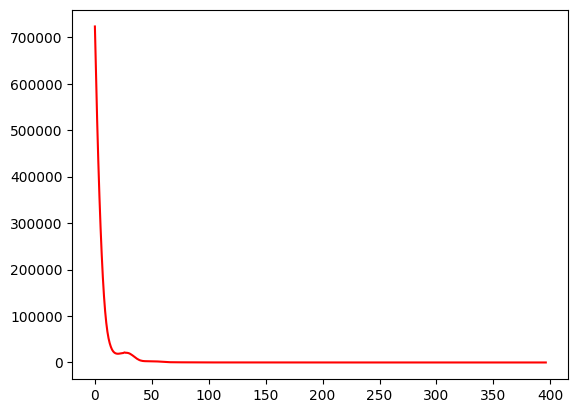

 79%|███████▉  | 397/500 [01:28<00:23,  4.41it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  55.04587155963303
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  58.823529411764696
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


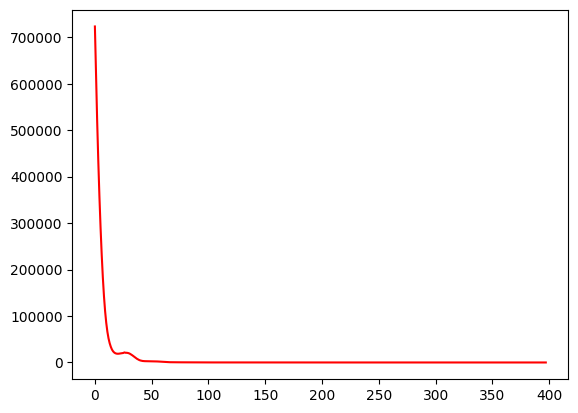

 80%|███████▉  | 398/500 [01:28<00:21,  4.64it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  59.77961432506886
Dataset Name:  disney , AUC Score (structural):  55.16819571865443
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


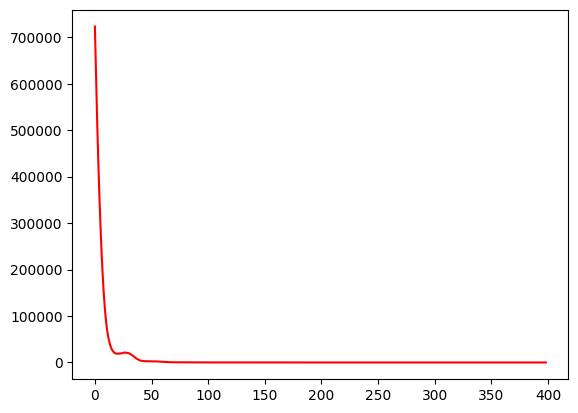

 80%|███████▉  | 399/500 [01:28<00:21,  4.63it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  59.50413223140496
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  58.87850467289719
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


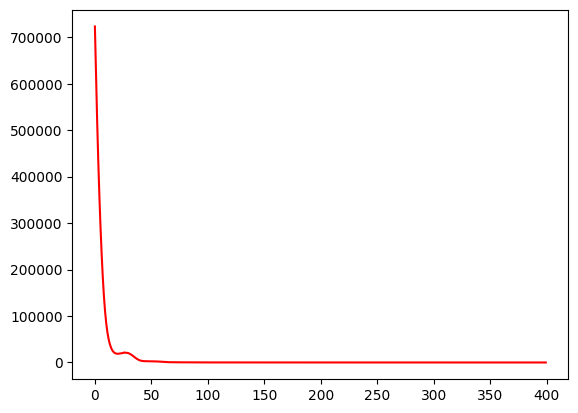

 80%|████████  | 400/500 [01:28<00:20,  4.82it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  59.50413223140496
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


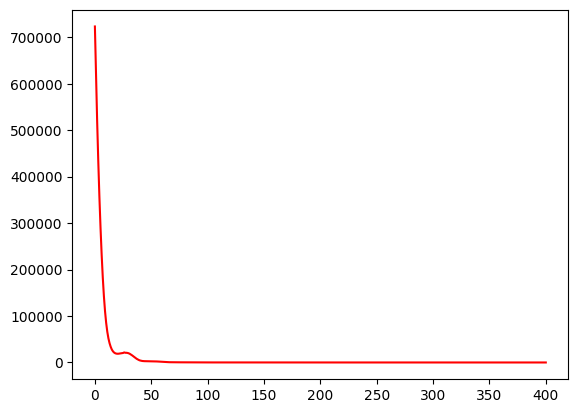

 80%|████████  | 401/500 [01:28<00:20,  4.75it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  59.77961432506886
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


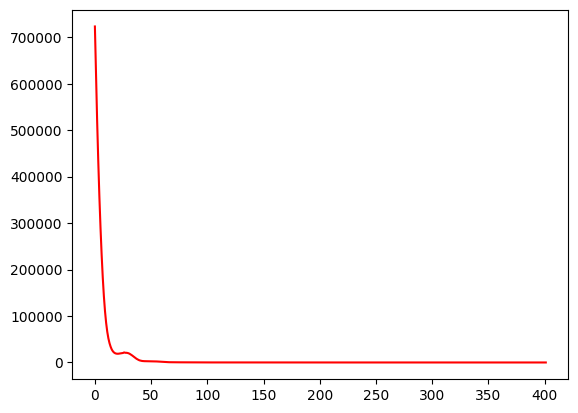

 80%|████████  | 402/500 [01:29<00:20,  4.80it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  59.77961432506886
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.04343045629468
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


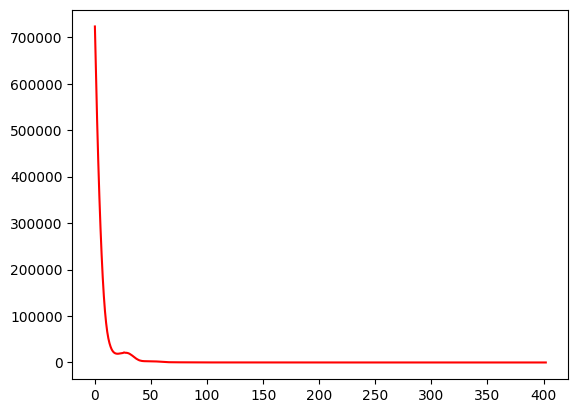

 81%|████████  | 403/500 [01:29<00:19,  4.96it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


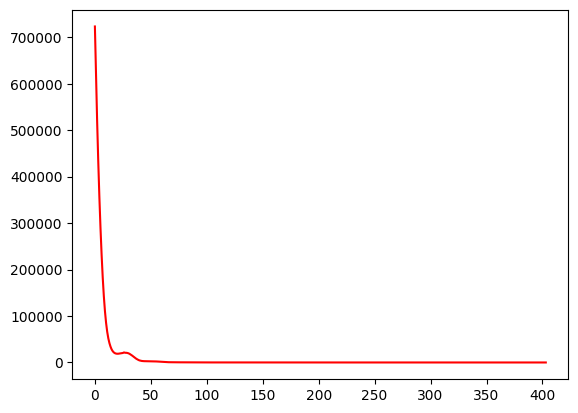

 81%|████████  | 404/500 [01:29<00:18,  5.06it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


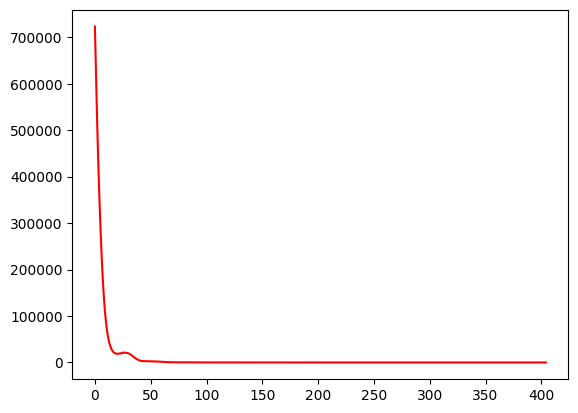

 81%|████████  | 405/500 [01:29<00:19,  4.90it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  60.05509641873279
Dataset Name:  disney , AUC Score (structural):  54.98470948012232
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  58.82352941176471
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


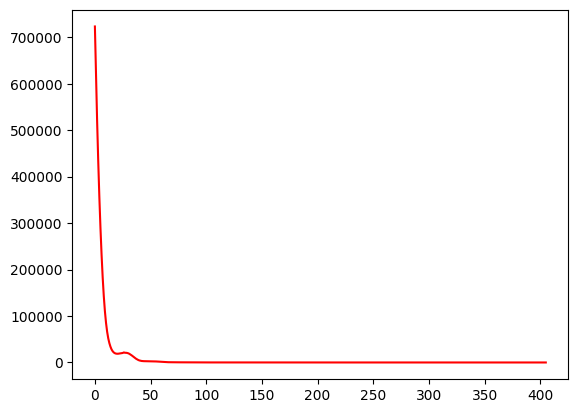

 81%|████████  | 406/500 [01:29<00:18,  5.01it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  59.77961432506886
Dataset Name:  disney , AUC Score (structural):  55.04587155963303
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  58.87850467289719
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


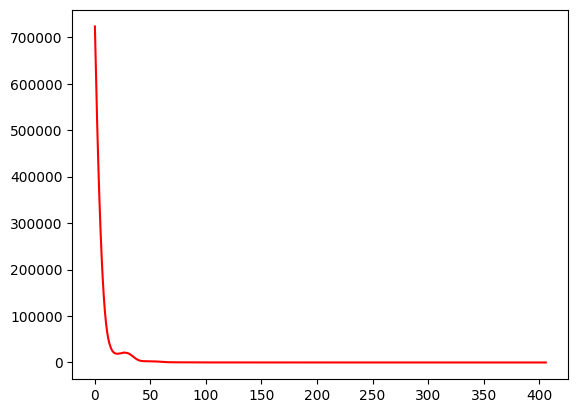

 81%|████████▏ | 407/500 [01:30<00:18,  5.11it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.75141242937852
Dataset Name:  disney , AUC Score (contextual):  59.77961432506886
Dataset Name:  disney , AUC Score (structural):  55.596330275229356
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.3732820230896
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


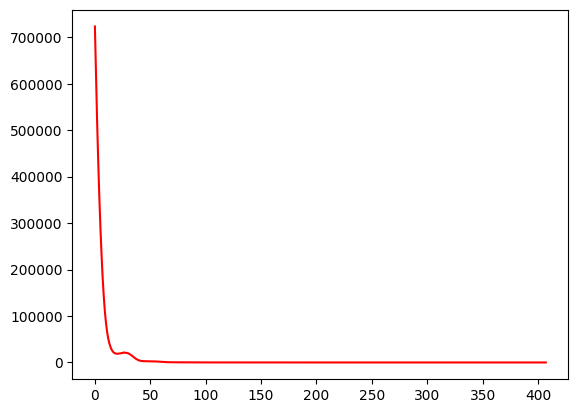

 82%|████████▏ | 408/500 [01:30<00:17,  5.20it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.75141242937852
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  55.351681957186535
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


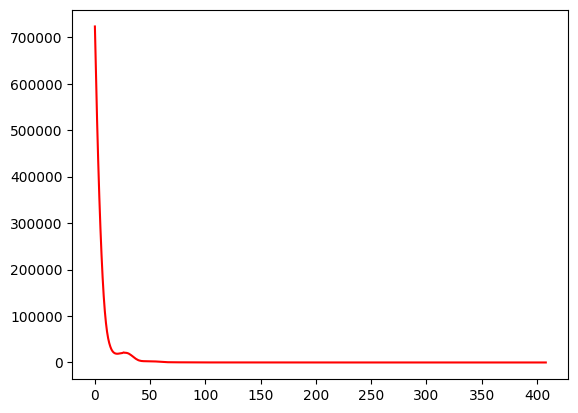

 82%|████████▏ | 409/500 [01:30<00:17,  5.23it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  55.16819571865443
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


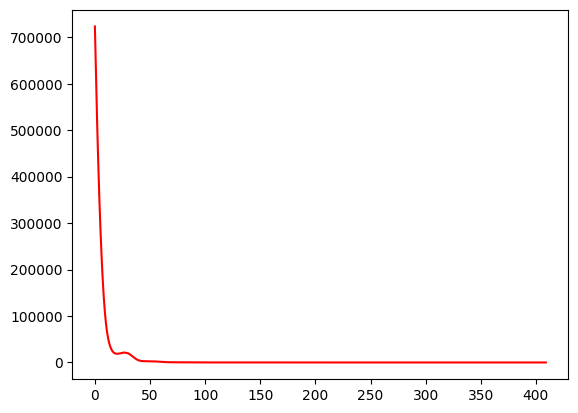

 82%|████████▏ | 410/500 [01:30<00:17,  5.27it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  59.77961432506886
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


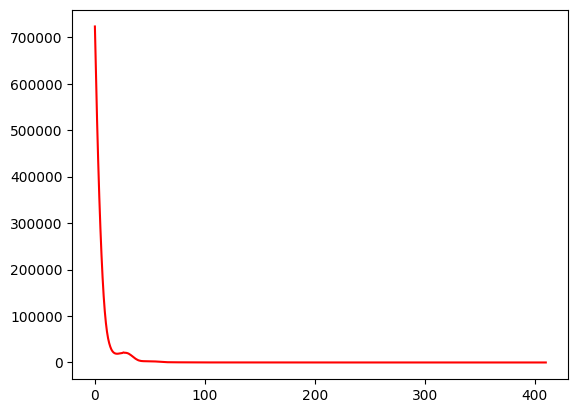

 82%|████████▏ | 411/500 [01:30<00:16,  5.40it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.61016949152543
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  55.16819571865443
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


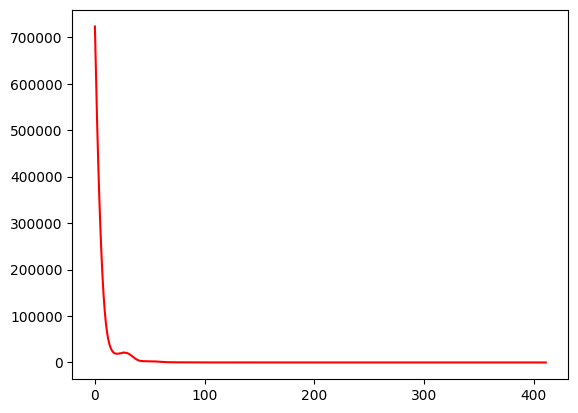

 82%|████████▏ | 412/500 [01:30<00:15,  5.55it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  59.50413223140496
Dataset Name:  disney , AUC Score (structural):  56.02446483180428
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.758108851017035
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


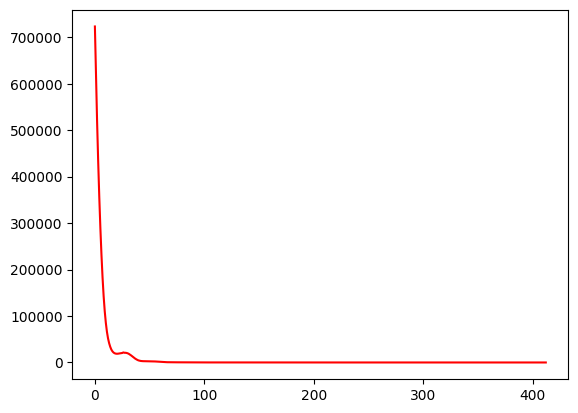

 83%|████████▎ | 413/500 [01:31<00:16,  5.35it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  59.50413223140496
Dataset Name:  disney , AUC Score (structural):  55.90214067278288
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.648158328752054
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


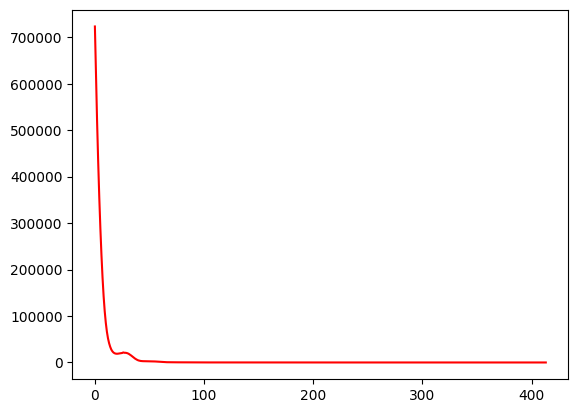

 83%|████████▎ | 414/500 [01:31<00:15,  5.50it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney , AUC Score (contextual):  60.33057851239669
Dataset Name:  disney , AUC Score (structural):  55.718654434250766
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.48323254535459
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


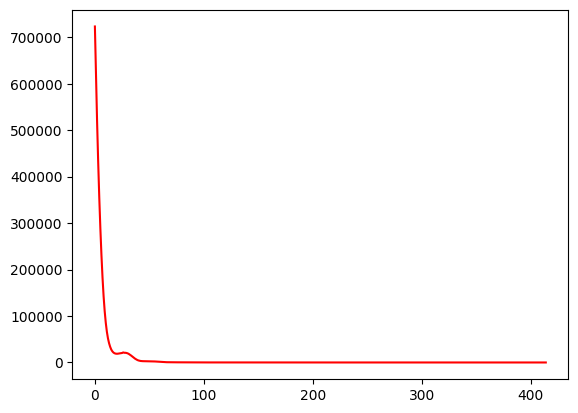

 83%|████████▎ | 415/500 [01:31<00:15,  5.32it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  60.05509641873279
Dataset Name:  disney , AUC Score (structural):  55.41284403669725
Dataset Name:  disney , AUC Score (joint-type):  83.47107438016529
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.47107438016529
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


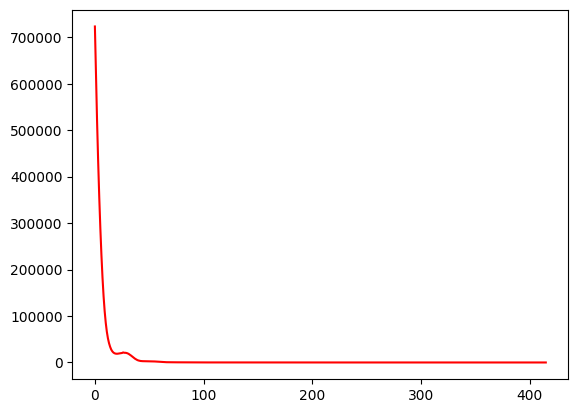

 83%|████████▎ | 416/500 [01:31<00:16,  5.19it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  60.05509641873279
Dataset Name:  disney , AUC Score (structural):  55.41284403669724
Dataset Name:  disney , AUC Score (joint-type):  83.47107438016529
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.47107438016529
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


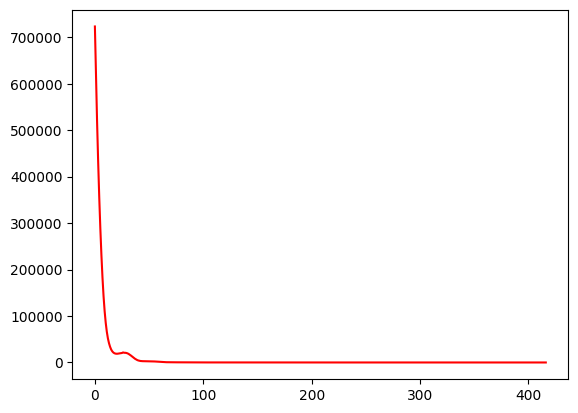

 83%|████████▎ | 417/500 [01:32<00:22,  3.73it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney , AUC Score (contextual):  59.77961432506888
Dataset Name:  disney , AUC Score (structural):  55.535168195718654
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


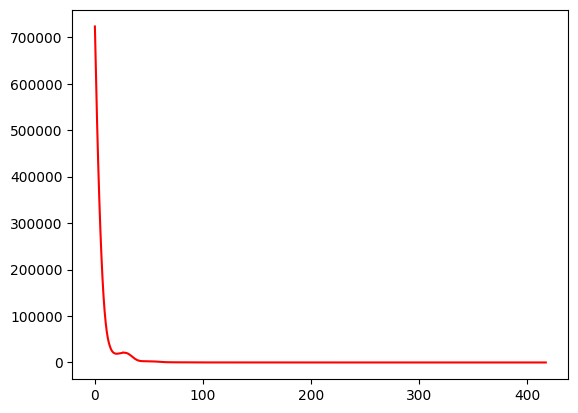

 84%|████████▎ | 418/500 [01:32<00:20,  4.05it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  60.05509641873278
Dataset Name:  disney , AUC Score (structural):  56.085626911314975
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.81308411214954
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


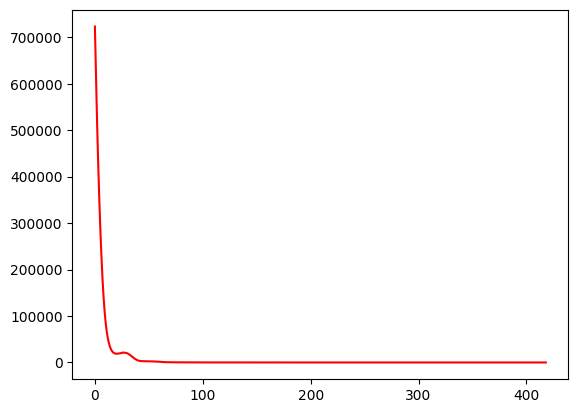

 84%|████████▍ | 419/500 [01:32<00:18,  4.27it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  60.05509641873277
Dataset Name:  disney , AUC Score (structural):  55.96330275229357
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  59.64815832875207
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


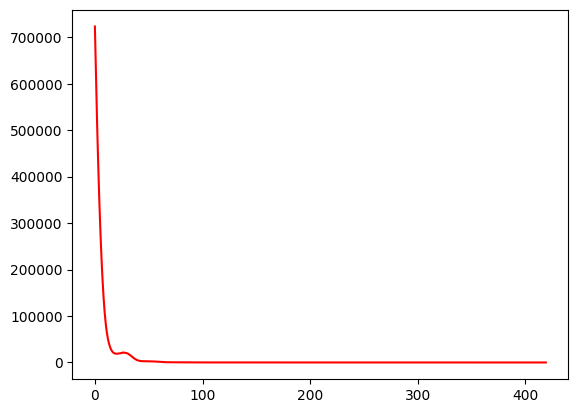

 84%|████████▍ | 420/500 [01:32<00:17,  4.45it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney , AUC Score (contextual):  60.05509641873277
Dataset Name:  disney , AUC Score (structural):  55.65749235474006
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.4282572842221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


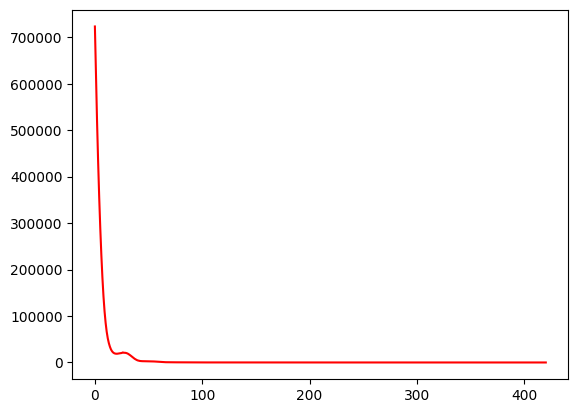

 84%|████████▍ | 421/500 [01:33<00:17,  4.56it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  60.33057851239669
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.09840571742717
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


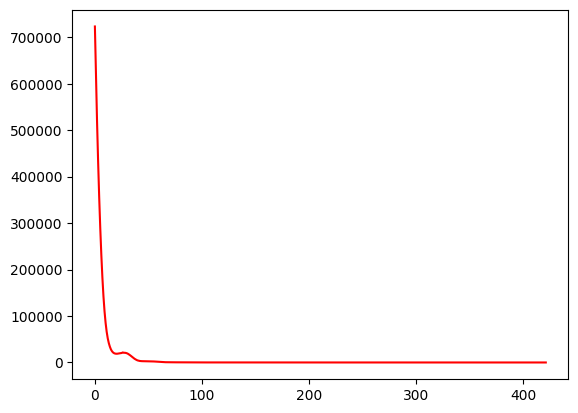

 84%|████████▍ | 422/500 [01:33<00:16,  4.65it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  60.33057851239669
Dataset Name:  disney , AUC Score (structural):  54.984709480122326
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  58.823529411764696
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


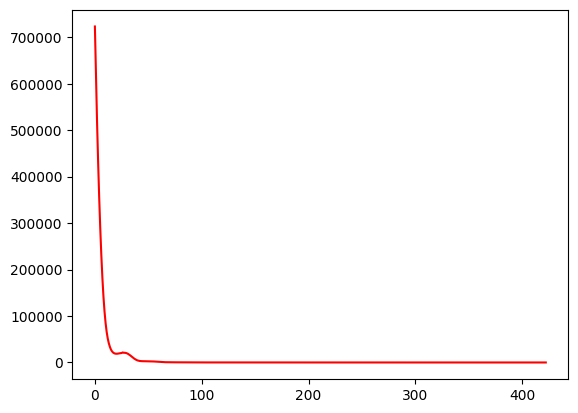

 85%|████████▍ | 423/500 [01:33<00:15,  4.98it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  60.60606060606061
Dataset Name:  disney , AUC Score (structural):  55.47400611620795
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


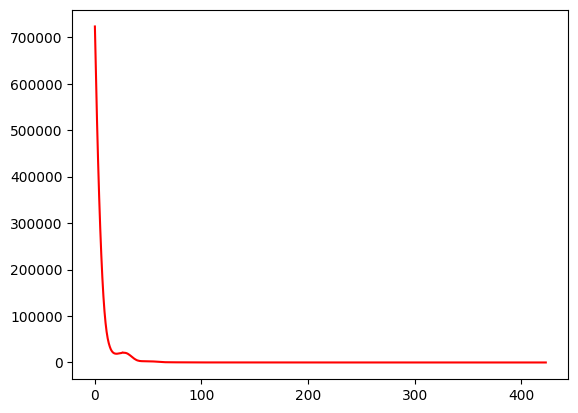

 85%|████████▍ | 424/500 [01:33<00:14,  5.24it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.75141242937853
Dataset Name:  disney , AUC Score (contextual):  60.330578512396684
Dataset Name:  disney , AUC Score (structural):  55.84097859327217
Dataset Name:  disney , AUC Score (joint-type):  83.47107438016529
Dataset Name:  disney , AUC Score (structure type):  59.648158328752054
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.47107438016529
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


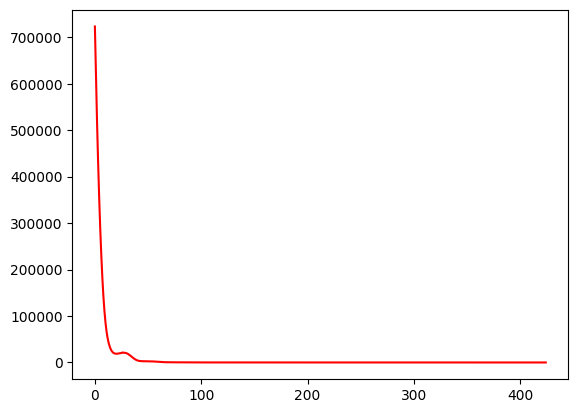

 85%|████████▌ | 425/500 [01:33<00:14,  5.17it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  60.60606060606061
Dataset Name:  disney , AUC Score (structural):  55.535168195718654
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.373282023089615
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


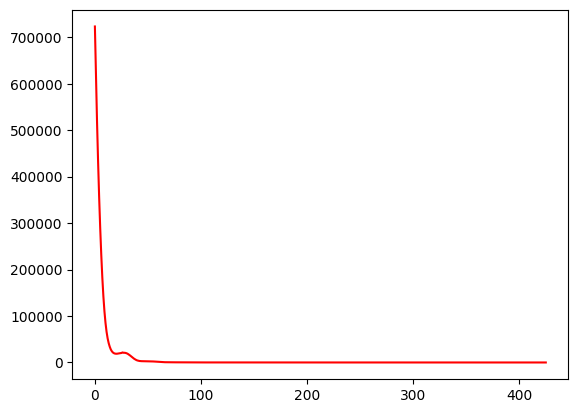

 85%|████████▌ | 426/500 [01:33<00:14,  5.11it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  60.60606060606061
Dataset Name:  disney , AUC Score (structural):  55.290519877675834
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.15338097855965
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


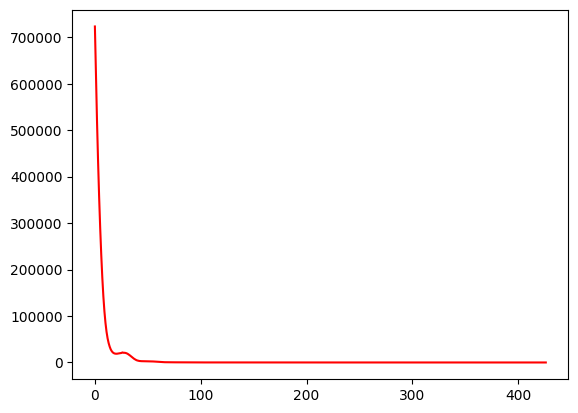

 85%|████████▌ | 427/500 [01:34<00:14,  5.05it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  61.43250688705233
Dataset Name:  disney , AUC Score (structural):  55.65749235474007
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.48323254535459
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


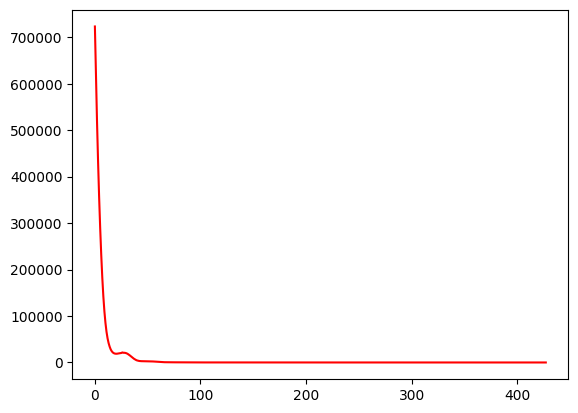

 86%|████████▌ | 428/500 [01:34<00:15,  4.71it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  61.15702479338842
Dataset Name:  disney , AUC Score (structural):  55.65749235474007
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.48323254535459
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


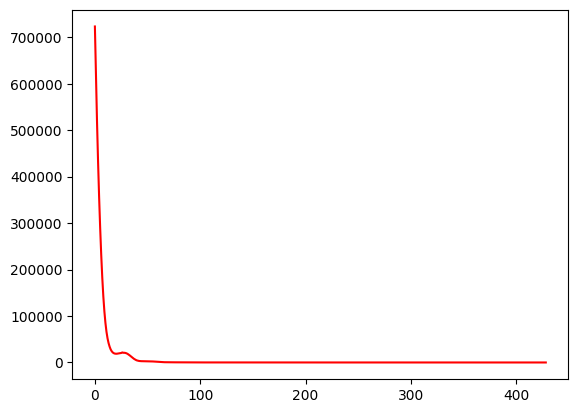

 86%|████████▌ | 429/500 [01:34<00:16,  4.26it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  60.88154269972452
Dataset Name:  disney , AUC Score (structural):  55.41284403669724
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


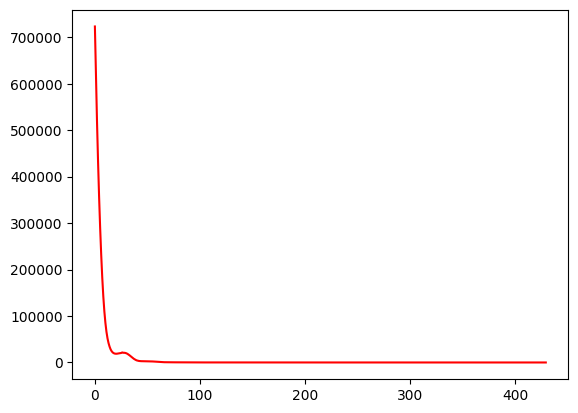

 86%|████████▌ | 430/500 [01:34<00:16,  4.37it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  60.60606060606061
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.09840571742716
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


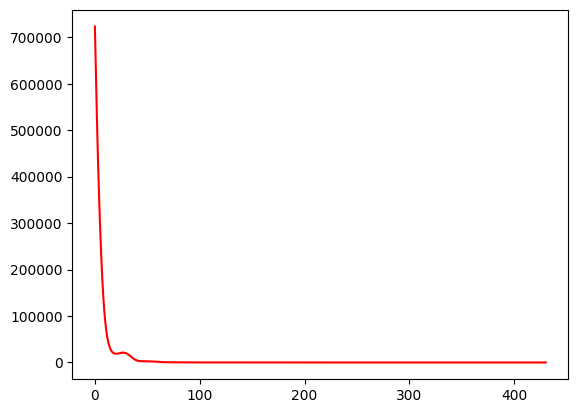

 86%|████████▌ | 431/500 [01:35<00:15,  4.53it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  61.98347107438016
Dataset Name:  disney , AUC Score (structural):  55.65749235474006
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.48323254535459
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


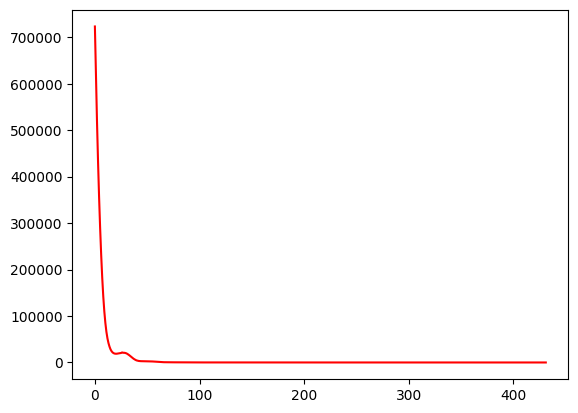

 86%|████████▋ | 432/500 [01:35<00:14,  4.66it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.59633027522936
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.4282572842221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


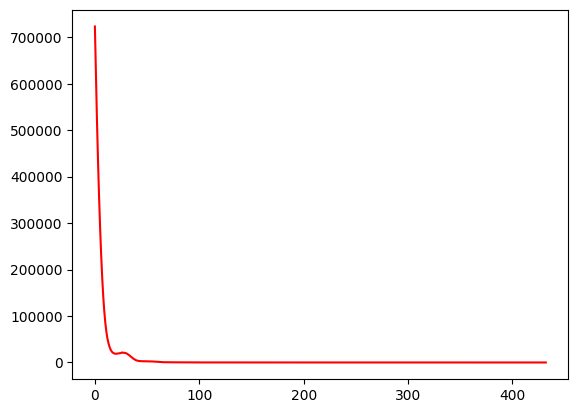

 87%|████████▋ | 433/500 [01:35<00:13,  4.95it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  62.8099173553719
Dataset Name:  disney , AUC Score (structural):  55.535168195718654
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


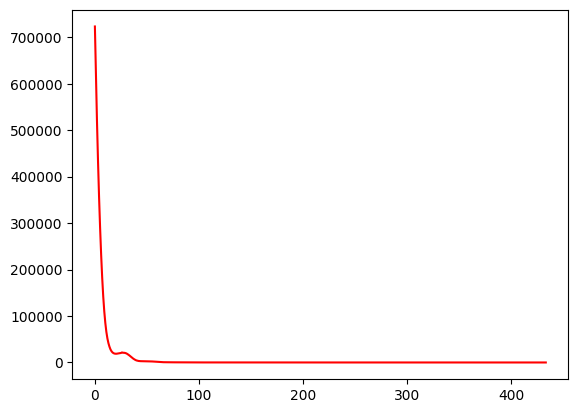

 87%|████████▋ | 434/500 [01:35<00:12,  5.20it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  62.8099173553719
Dataset Name:  disney , AUC Score (structural):  55.535168195718654
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney , AUC Score (structure type):  59.31830676195713
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283747
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


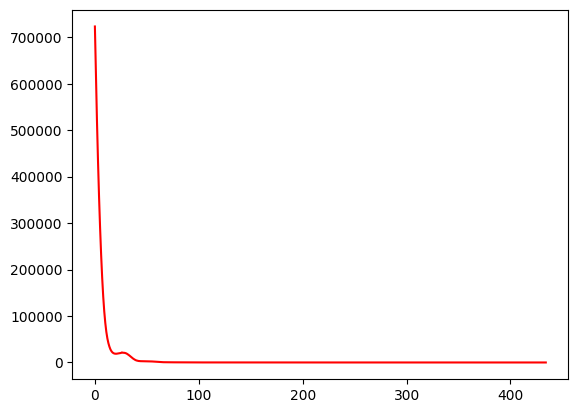

 87%|████████▋ | 435/500 [01:35<00:12,  5.39it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.65749235474007
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.48323254535459
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


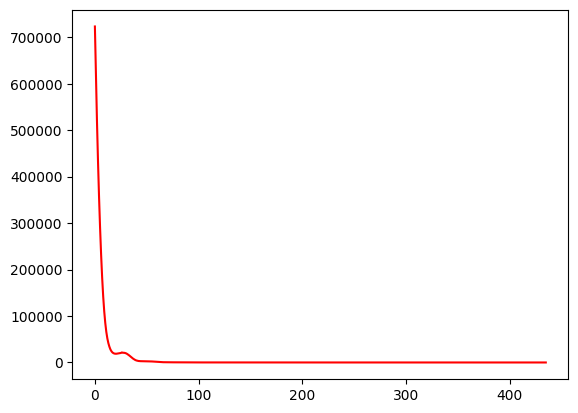

 87%|████████▋ | 436/500 [01:36<00:11,  5.53it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.596330275229356
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.4282572842221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


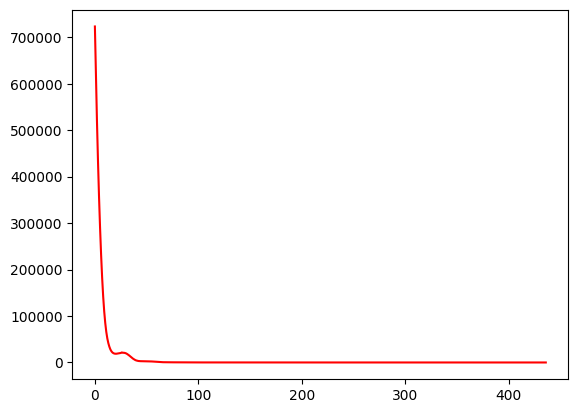

 87%|████████▋ | 437/500 [01:36<00:11,  5.63it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.779816513761475
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.59318306761957
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


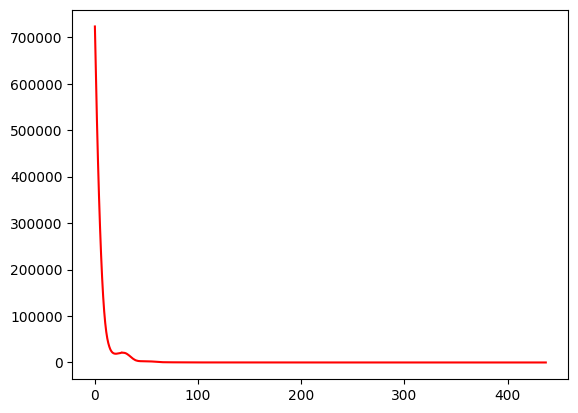

 88%|████████▊ | 438/500 [01:36<00:11,  5.39it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.47400611620794
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.31830676195713
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


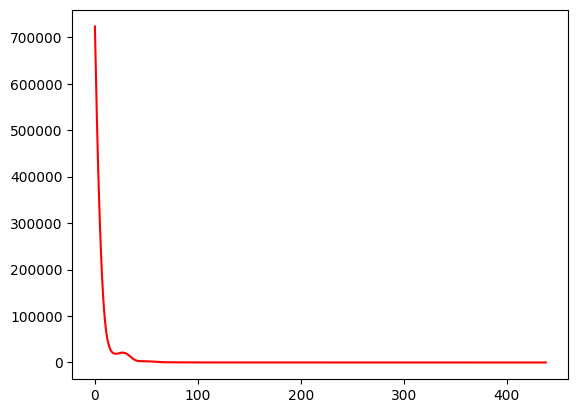

 88%|████████▊ | 439/500 [01:36<00:11,  5.20it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  55.47400611620794
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


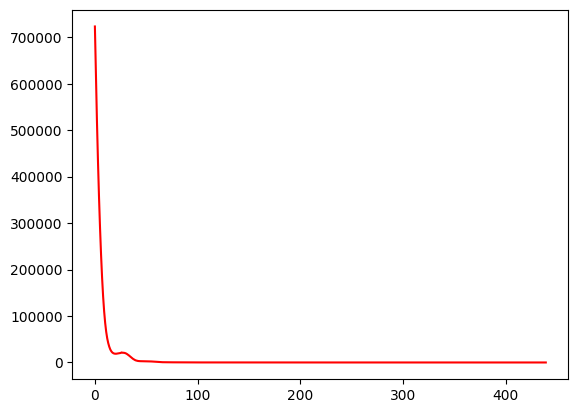

 88%|████████▊ | 440/500 [01:36<00:11,  5.40it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  55.290519877675834
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


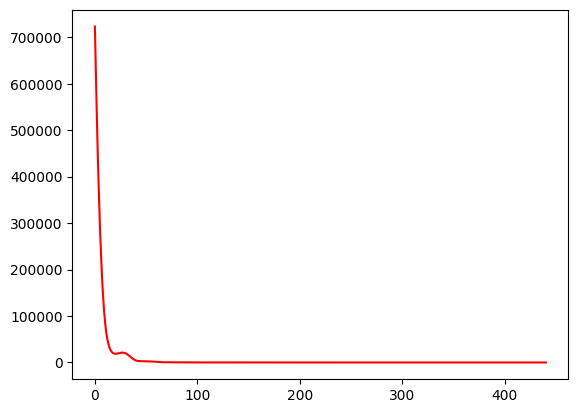

 88%|████████▊ | 441/500 [01:36<00:11,  5.22it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293784
Dataset Name:  disney , AUC Score (contextual):  61.70798898071625
Dataset Name:  disney , AUC Score (structural):  55.290519877675834
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


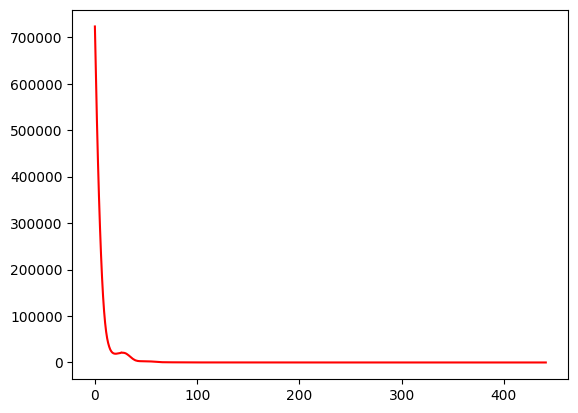

 88%|████████▊ | 442/500 [01:37<00:11,  4.91it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  61.98347107438016
Dataset Name:  disney , AUC Score (structural):  55.41284403669724
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.26333150082462
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


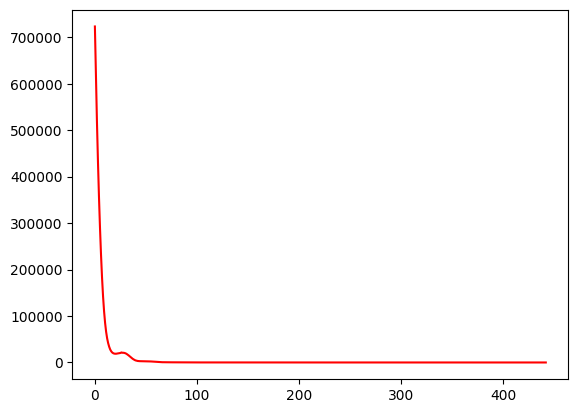

 89%|████████▊ | 443/500 [01:37<00:11,  4.78it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  61.43250688705233
Dataset Name:  disney , AUC Score (structural):  55.41284403669725
Dataset Name:  disney , AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  83.19559228650138
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


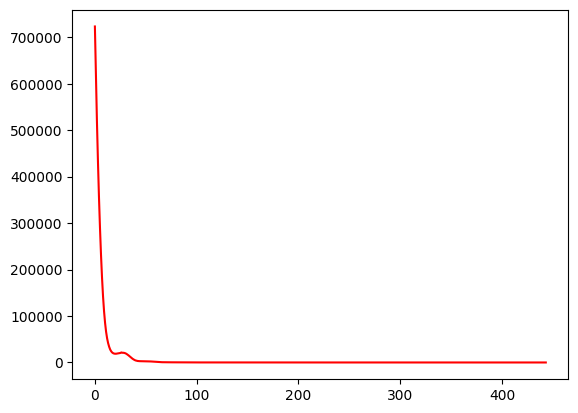

 89%|████████▉ | 444/500 [01:37<00:11,  4.85it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  61.70798898071625
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


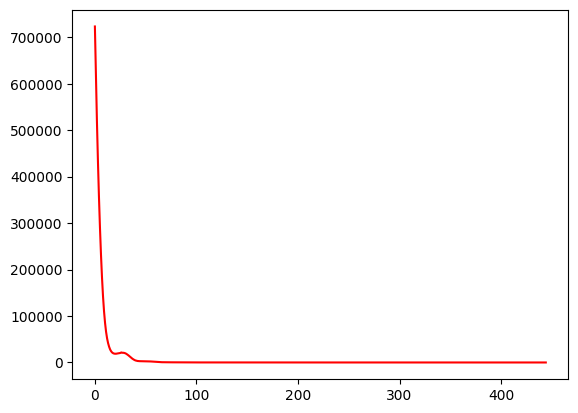

 89%|████████▉ | 445/500 [01:37<00:11,  4.87it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  61.43250688705234
Dataset Name:  disney , AUC Score (structural):  54.984709480122326
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  58.87850467289719
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


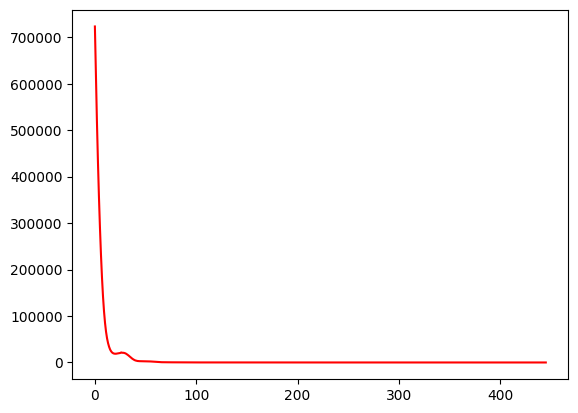

 89%|████████▉ | 446/500 [01:37<00:10,  5.11it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  61.15702479338842
Dataset Name:  disney , AUC Score (structural):  54.984709480122326
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  58.8785046728972
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


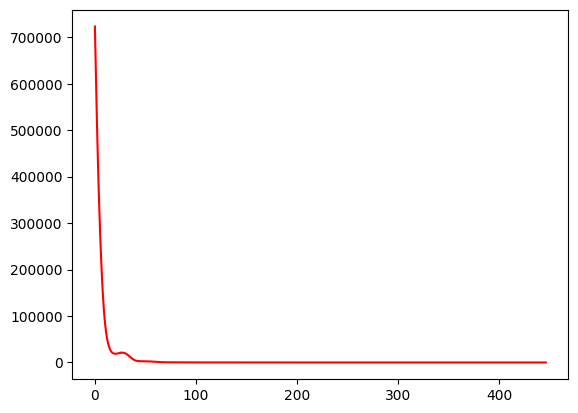

 89%|████████▉ | 447/500 [01:38<00:09,  5.32it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  60.88154269972452
Dataset Name:  disney , AUC Score (structural):  55.16819571865443
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.043430456294665
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


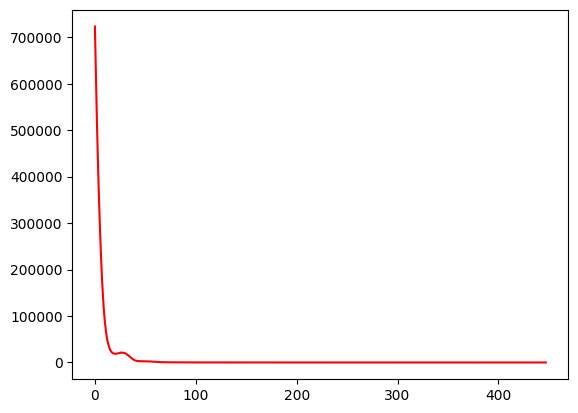

 90%|████████▉ | 448/500 [01:38<00:09,  5.25it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  61.15702479338842
Dataset Name:  disney , AUC Score (structural):  55.290519877675834
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.153380978559646
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


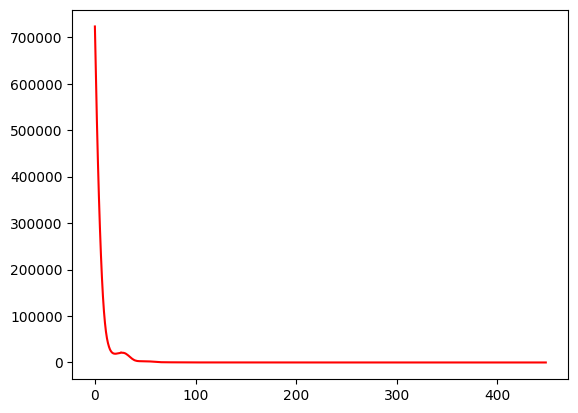

 90%|████████▉ | 449/500 [01:38<00:09,  5.15it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  61.43250688705234
Dataset Name:  disney , AUC Score (structural):  55.59633027522936
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.428257284222106
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


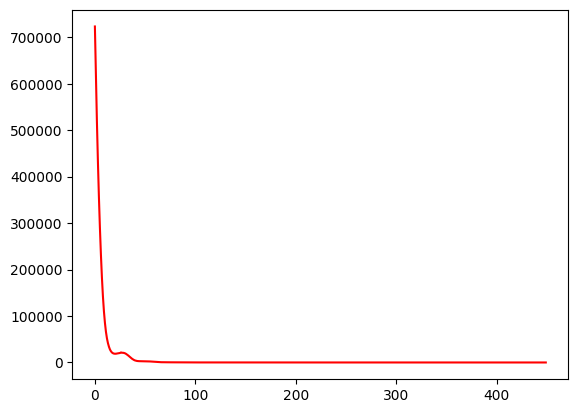

 90%|█████████ | 450/500 [01:38<00:09,  5.11it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  61.43250688705234
Dataset Name:  disney , AUC Score (structural):  55.351681957186535
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney , AUC Score (structure type):  59.15338097855965
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


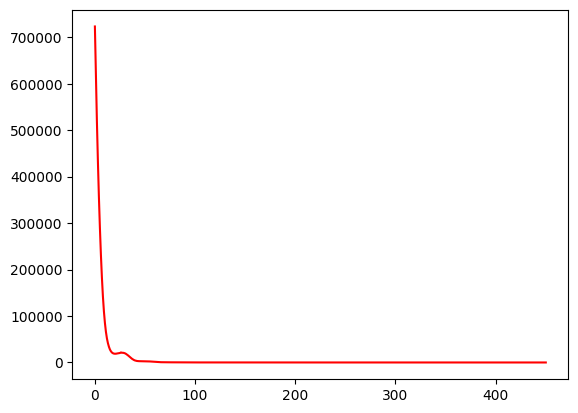

 90%|█████████ | 451/500 [01:38<00:09,  5.05it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  62.25895316804409
Dataset Name:  disney , AUC Score (structural):  55.718654434250766
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.53820780648709
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


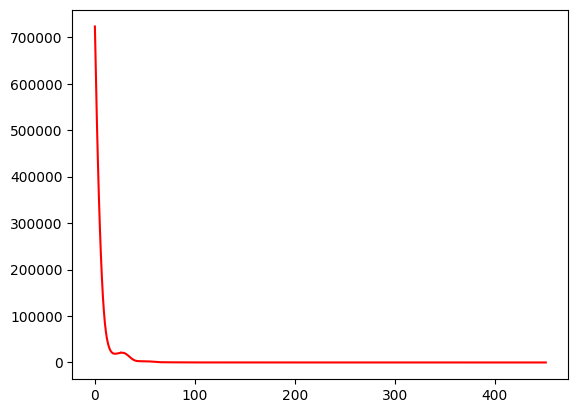

 90%|█████████ | 452/500 [01:39<00:09,  5.26it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


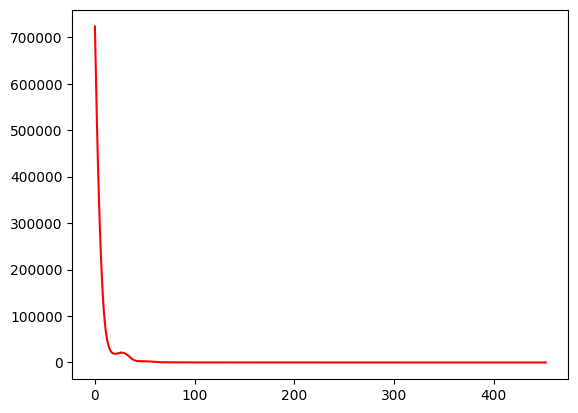

 91%|█████████ | 453/500 [01:39<00:08,  5.42it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  55.47400611620794
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


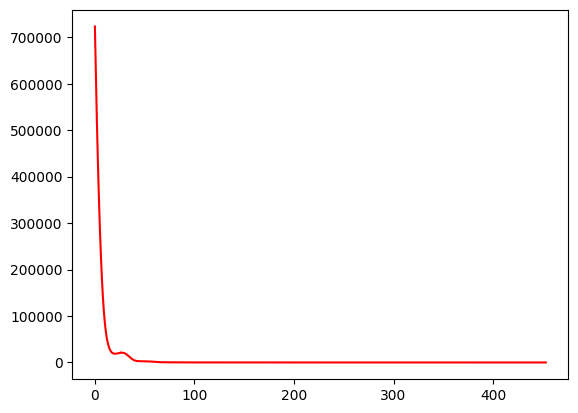

 91%|█████████ | 454/500 [01:39<00:08,  5.24it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.65749235474006
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.4832325453546
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


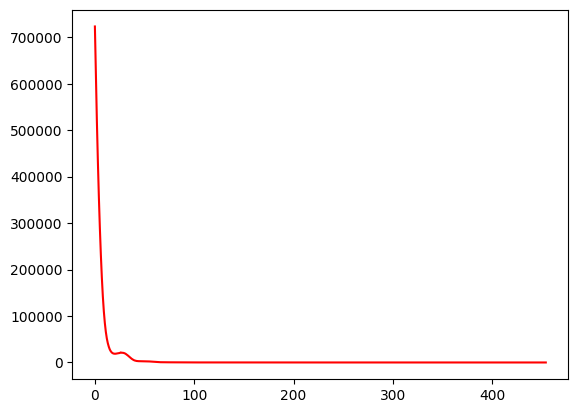

 91%|█████████ | 455/500 [01:39<00:08,  5.41it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  62.25895316804409
Dataset Name:  disney , AUC Score (structural):  55.65749235474006
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.48323254535459
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


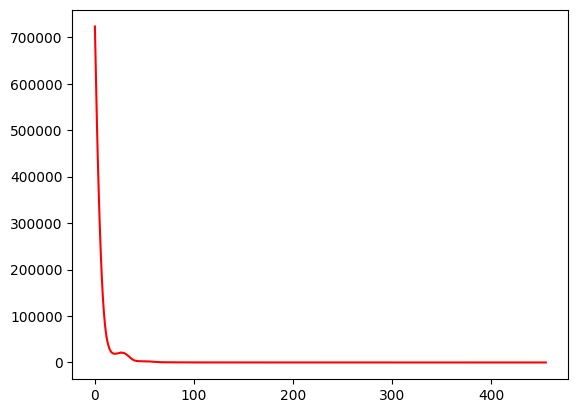

 91%|█████████ | 456/500 [01:39<00:07,  5.54it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  62.25895316804406
Dataset Name:  disney , AUC Score (structural):  55.351681957186535
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney , AUC Score (structure type):  59.20835623969214
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


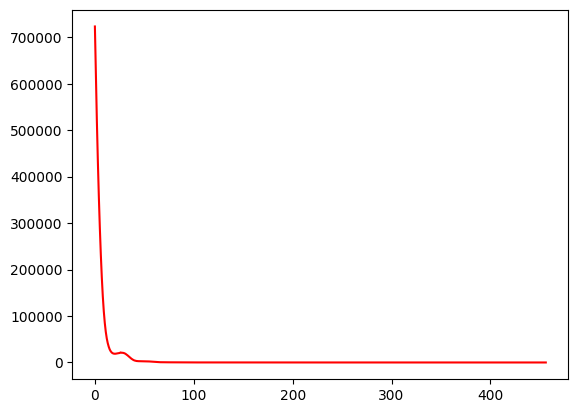

 91%|█████████▏| 457/500 [01:40<00:08,  5.30it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.41284403669725
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.26333150082462
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


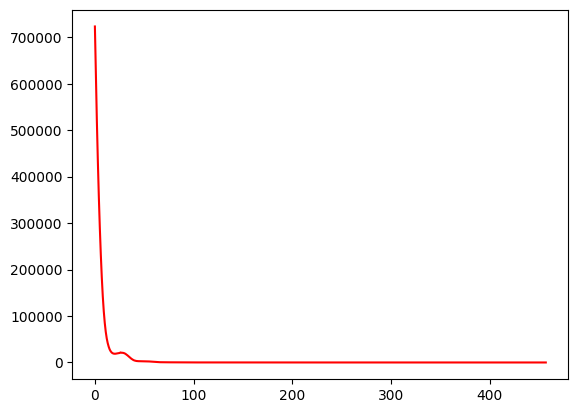

 92%|█████████▏| 458/500 [01:40<00:08,  5.13it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  61.70798898071625
Dataset Name:  disney , AUC Score (structural):  55.41284403669724
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.263331500824634
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


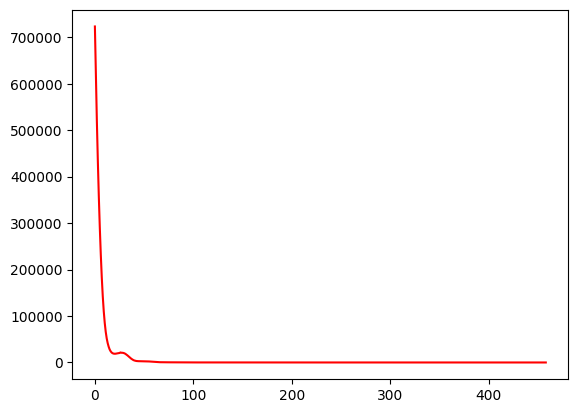

 92%|█████████▏| 459/500 [01:40<00:08,  4.74it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.47400611620794
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.31830676195712
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


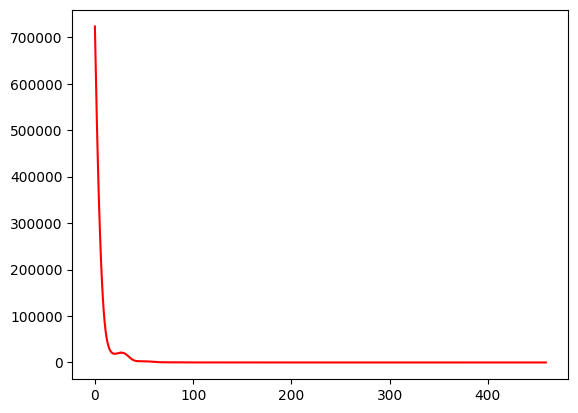

 92%|█████████▏| 460/500 [01:40<00:07,  5.06it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  55.47400611620794
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.31830676195713
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


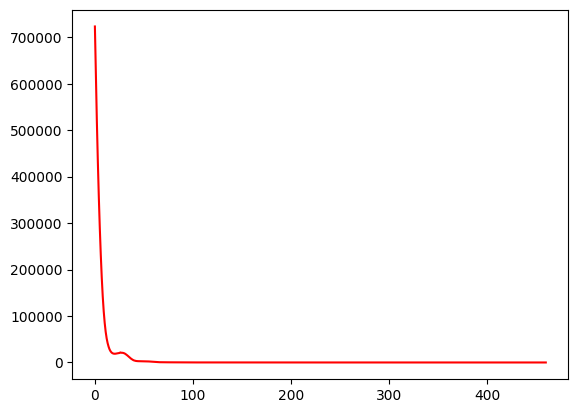

 92%|█████████▏| 461/500 [01:40<00:07,  5.28it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293784
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.90214067278288
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.70313358988456
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


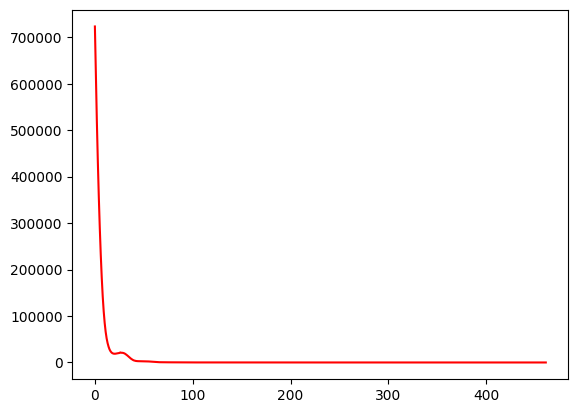

 92%|█████████▏| 462/500 [01:41<00:08,  4.58it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.45762711864407
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.65749235474006
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  59.48323254535459
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


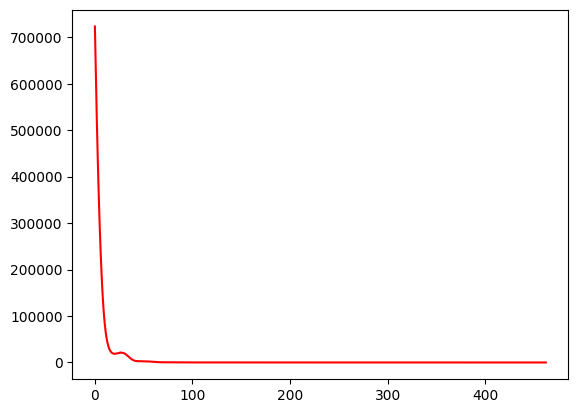

 93%|█████████▎| 463/500 [01:41<00:07,  4.64it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293784
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.596330275229356
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney , AUC Score (structure type):  59.4282572842221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


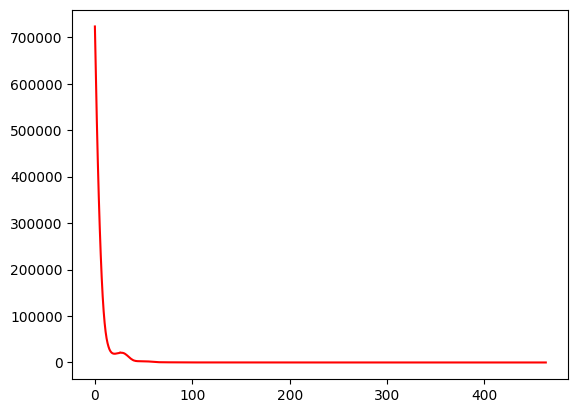

 93%|█████████▎| 464/500 [01:41<00:07,  4.71it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  62.25895316804409
Dataset Name:  disney , AUC Score (structural):  55.16819571865443
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney , AUC Score (structure type):  59.04343045629468
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


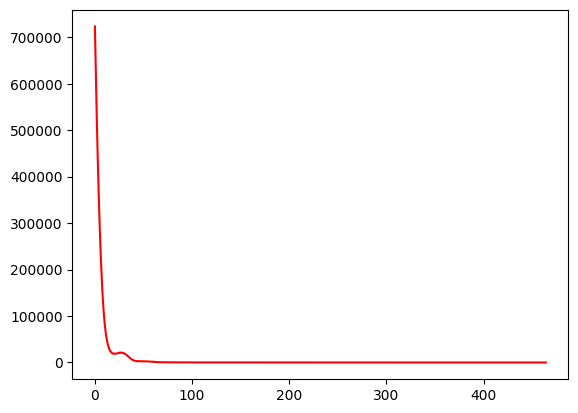

 93%|█████████▎| 465/500 [01:41<00:07,  4.78it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.25895316804406
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  59.09840571742716
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


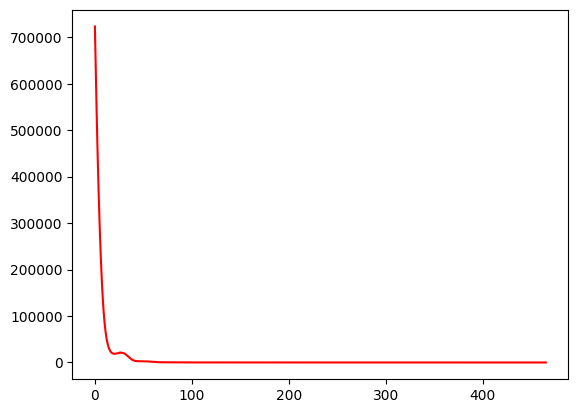

 93%|█████████▎| 466/500 [01:41<00:06,  5.06it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293784
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


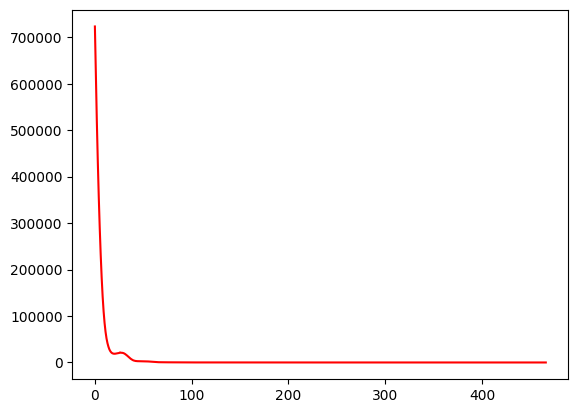

 93%|█████████▎| 467/500 [01:42<00:06,  5.27it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


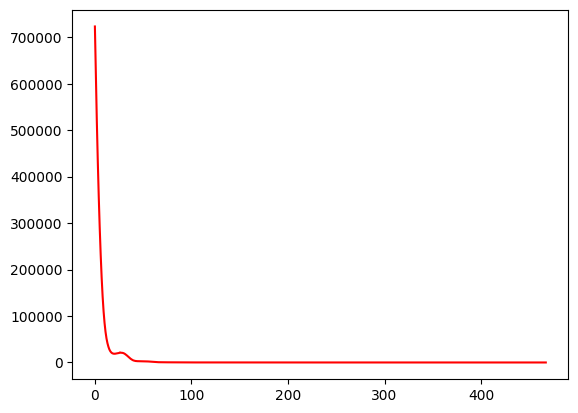

 94%|█████████▎| 468/500 [01:42<00:06,  4.91it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  59.09840571742716
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


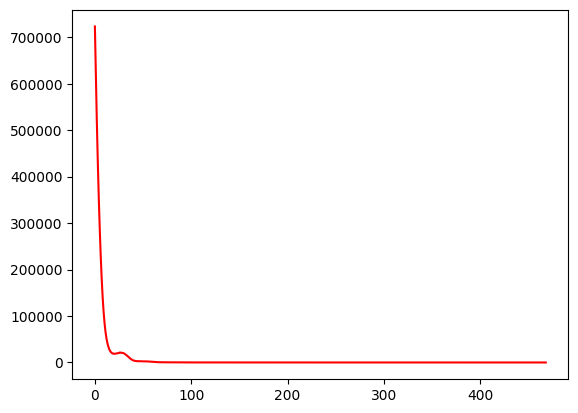

 94%|█████████▍| 469/500 [01:42<00:06,  5.15it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.22935779816513
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  59.09840571742716
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


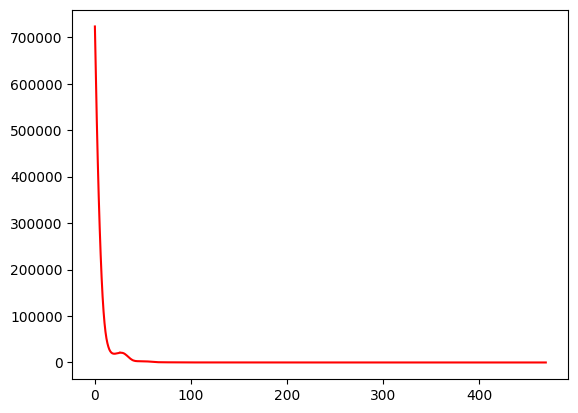

 94%|█████████▍| 470/500 [01:42<00:05,  5.13it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.75141242937852
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  54.801223241590215
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.71357888949973
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


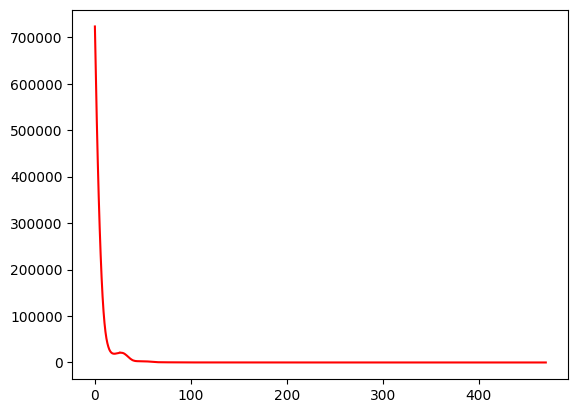

 94%|█████████▍| 471/500 [01:42<00:05,  5.06it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.04587155963303
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


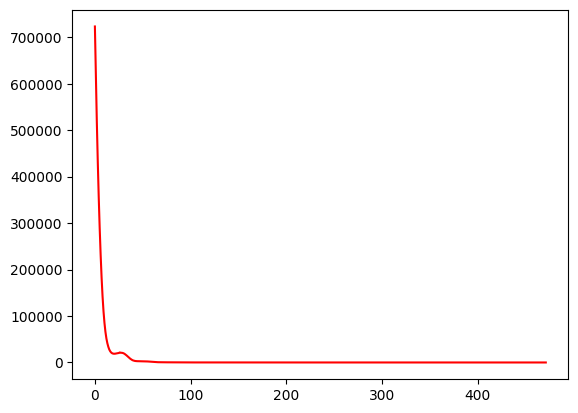

 94%|█████████▍| 472/500 [01:43<00:05,  4.97it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.16819571865443
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  59.04343045629468
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


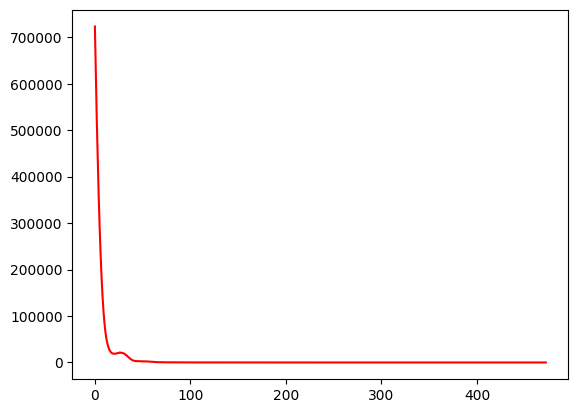

 95%|█████████▍| 473/500 [01:43<00:07,  3.39it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.25895316804409
Dataset Name:  disney , AUC Score (structural):  54.984709480122326
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.8785046728972
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


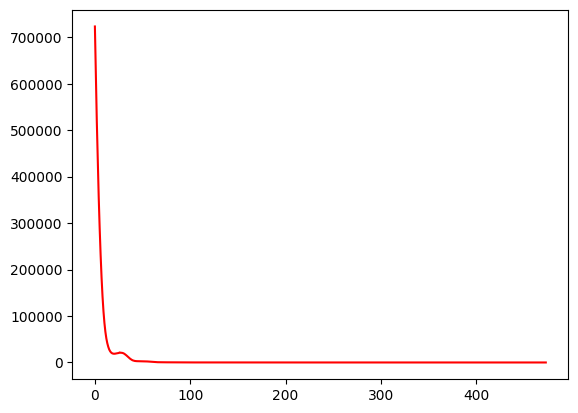

 95%|█████████▍| 474/500 [01:43<00:07,  3.62it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


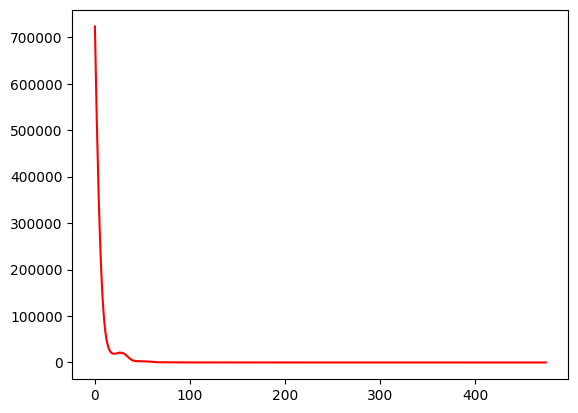

 95%|█████████▌| 475/500 [01:44<00:06,  3.90it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


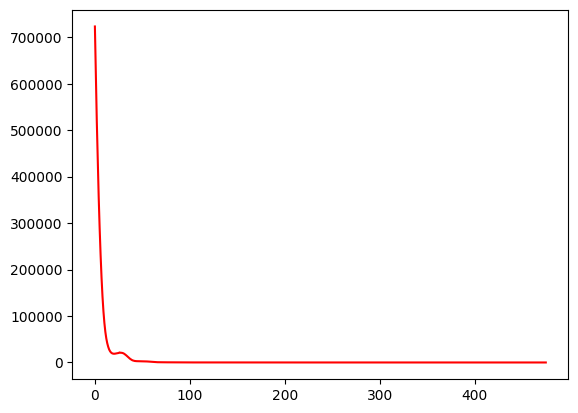

 95%|█████████▌| 476/500 [01:44<00:05,  4.15it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  61.43250688705234
Dataset Name:  disney , AUC Score (structural):  54.6788990825688
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney , AUC Score (structure type):  58.65860362836723
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


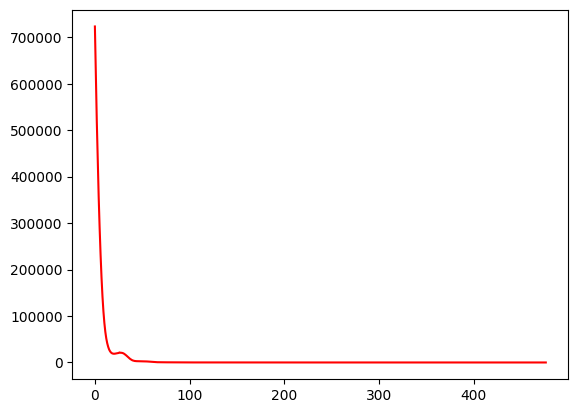

 95%|█████████▌| 477/500 [01:44<00:05,  4.55it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  55.10703363914373
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.98845519516218
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


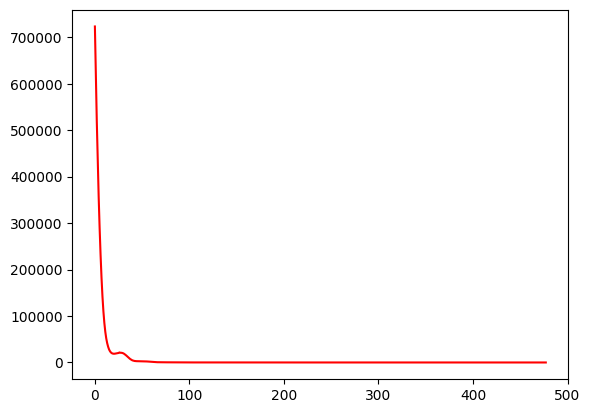

 96%|█████████▌| 478/500 [01:44<00:04,  4.86it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.25895316804409
Dataset Name:  disney , AUC Score (structural):  55.04587155963303
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.933479934029684
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


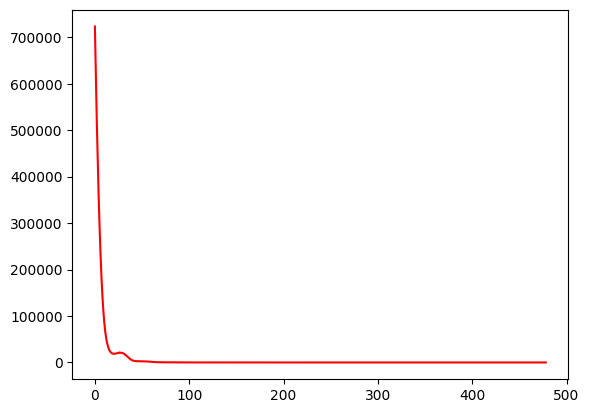

 96%|█████████▌| 479/500 [01:44<00:04,  4.89it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.25895316804409
Dataset Name:  disney , AUC Score (structural):  54.801223241590215
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.71357888949973
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


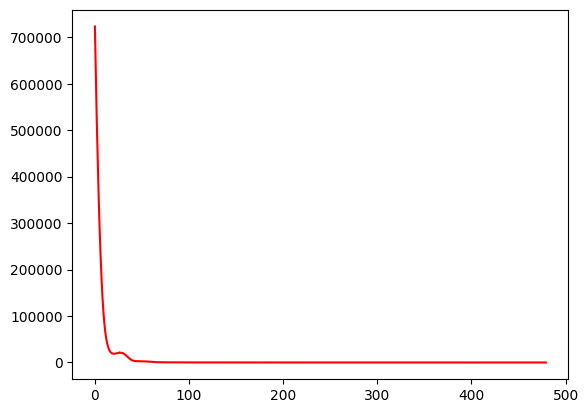

 96%|█████████▌| 480/500 [01:45<00:03,  5.07it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.25895316804409
Dataset Name:  disney , AUC Score (structural):  54.92354740061162
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.82352941176471
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


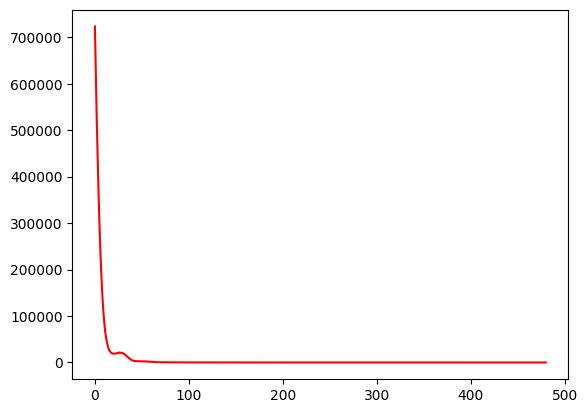

 96%|█████████▌| 481/500 [01:45<00:03,  5.22it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  54.984709480122326
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.87850467289719
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


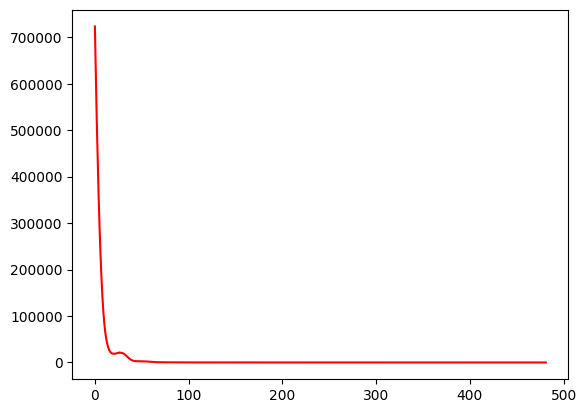

 96%|█████████▋| 482/500 [01:45<00:03,  4.72it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.75141242937852
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  54.7400611620795
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.65860362836723
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


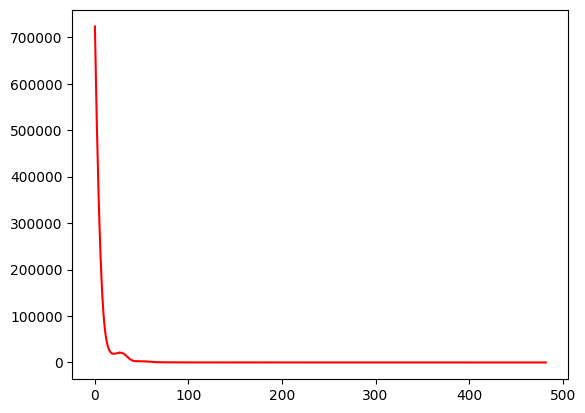

 97%|█████████▋| 483/500 [01:45<00:03,  5.01it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.8099173553719
Dataset Name:  disney , AUC Score (structural):  55.16819571865443
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  59.043430456294665
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


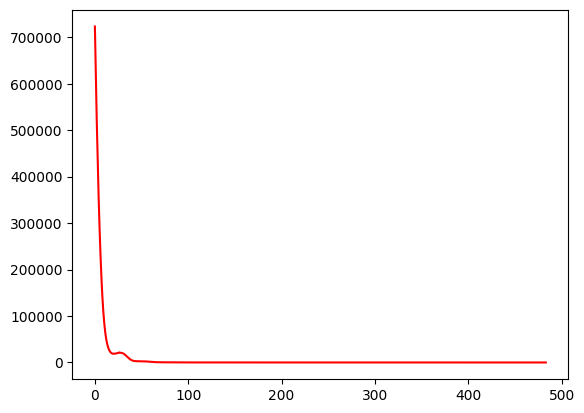

 97%|█████████▋| 484/500 [01:45<00:03,  5.24it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.25895316804409
Dataset Name:  disney , AUC Score (structural):  54.984709480122326
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.8785046728972
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


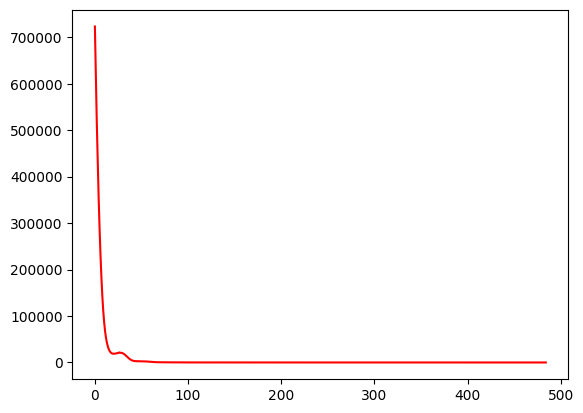

 97%|█████████▋| 485/500 [01:45<00:02,  5.40it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  54.984709480122326
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.8785046728972
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


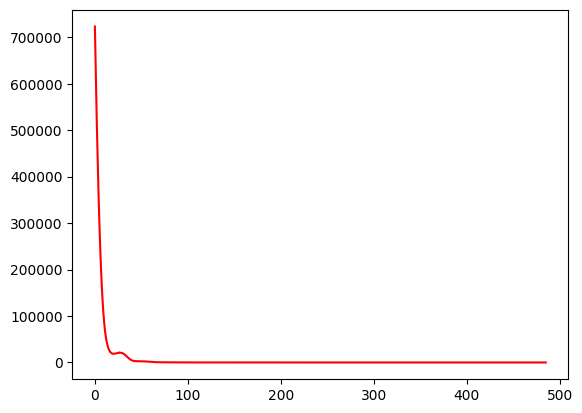

 97%|█████████▋| 486/500 [01:46<00:02,  5.28it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.8099173553719
Dataset Name:  disney , AUC Score (structural):  54.92354740061162
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.82352941176471
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


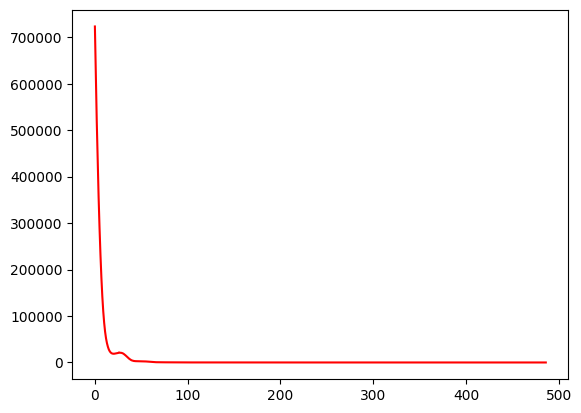

 97%|█████████▋| 487/500 [01:46<00:02,  5.15it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.8099173553719
Dataset Name:  disney , AUC Score (structural):  54.984709480122326
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.87850467289719
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


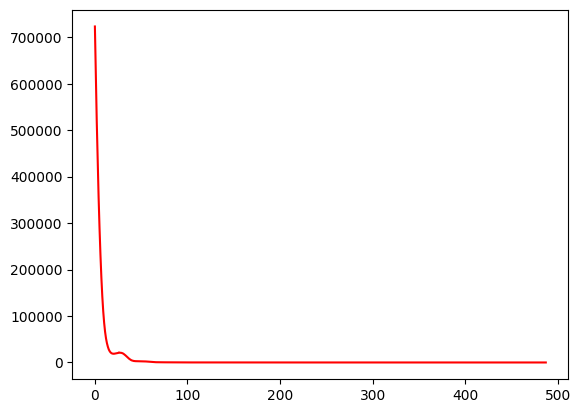

 98%|█████████▊| 488/500 [01:46<00:02,  5.10it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.25895316804409
Dataset Name:  disney , AUC Score (structural):  54.862385321100916
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.76855415063221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


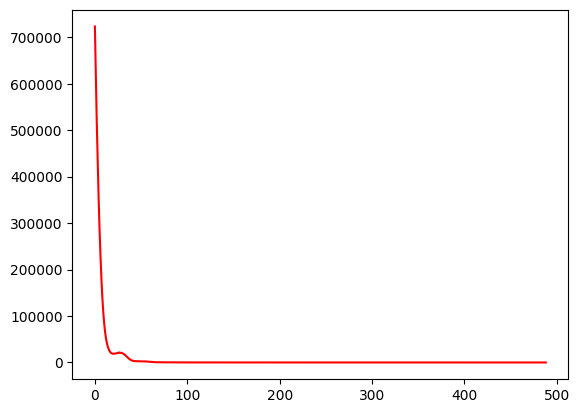

 98%|█████████▊| 489/500 [01:46<00:02,  5.03it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.8099173553719
Dataset Name:  disney , AUC Score (structural):  54.984709480122326
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.87850467289719
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


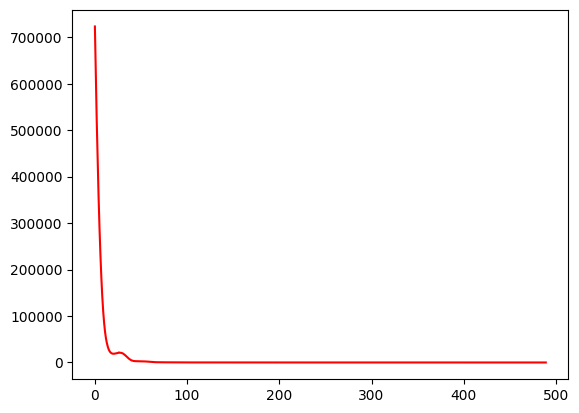

 98%|█████████▊| 490/500 [01:46<00:01,  5.23it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  62.25895316804409
Dataset Name:  disney , AUC Score (structural):  54.862385321100916
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.76855415063221
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


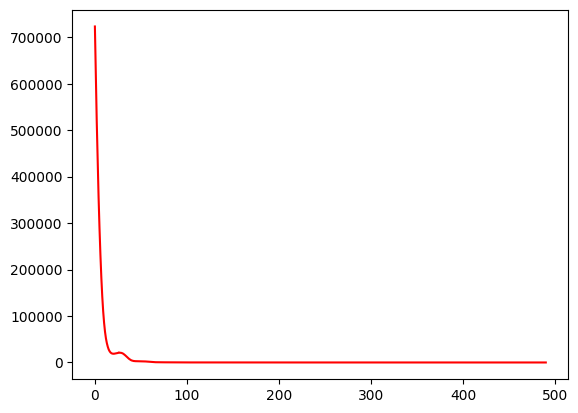

 98%|█████████▊| 491/500 [01:47<00:01,  5.35it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  54.556574923547394
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney , AUC Score (structure type):  58.54865310610226
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


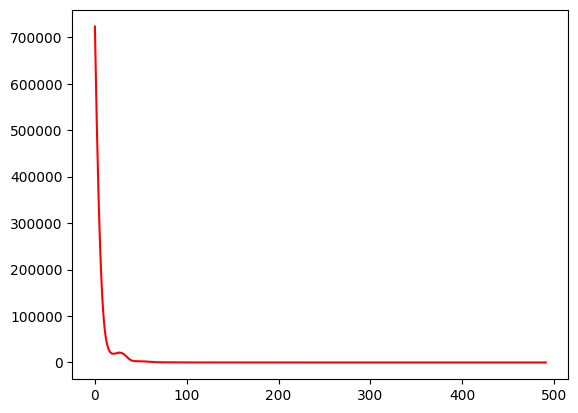

 98%|█████████▊| 492/500 [01:47<00:01,  5.22it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.03389830508475
Dataset Name:  disney , AUC Score (contextual):  62.8099173553719
Dataset Name:  disney , AUC Score (structural):  54.923547400611625
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.823529411764696
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


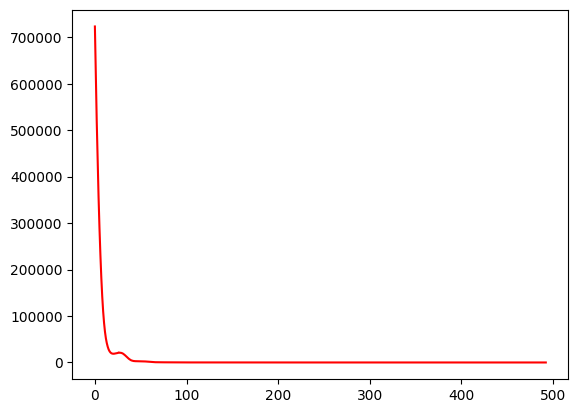

 99%|█████████▊| 493/500 [01:47<00:01,  5.37it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  54.49541284403669
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney , AUC Score (structure type):  58.49367784496976
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


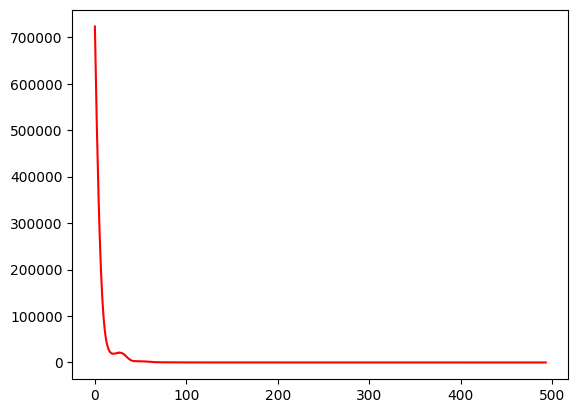

 99%|█████████▉| 494/500 [01:47<00:01,  5.26it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  54.6788990825688
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.658603628367246
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


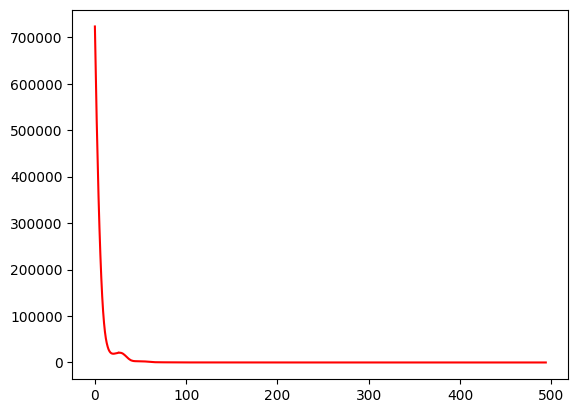

 99%|█████████▉| 495/500 [01:47<00:00,  5.12it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  71.89265536723164
Dataset Name:  disney , AUC Score (contextual):  62.25895316804409
Dataset Name:  disney , AUC Score (structural):  54.6788990825688
Dataset Name:  disney , AUC Score (joint-type):  82.09366391184571
Dataset Name:  disney , AUC Score (structure type):  58.60362836723474
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.09366391184571
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


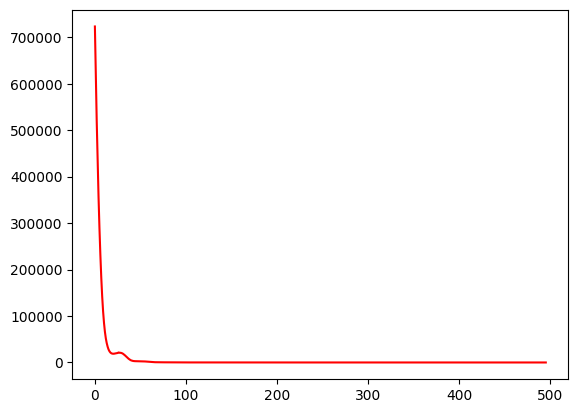

 99%|█████████▉| 496/500 [01:48<00:00,  5.31it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  54.6788990825688
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.658603628367246
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


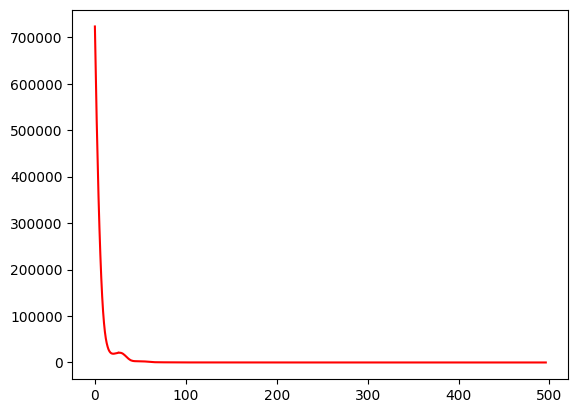

 99%|█████████▉| 497/500 [01:48<00:00,  5.44it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  54.617737003058096
Dataset Name:  disney , AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney , AUC Score (structure type):  58.65860362836723
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.64462809917354
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


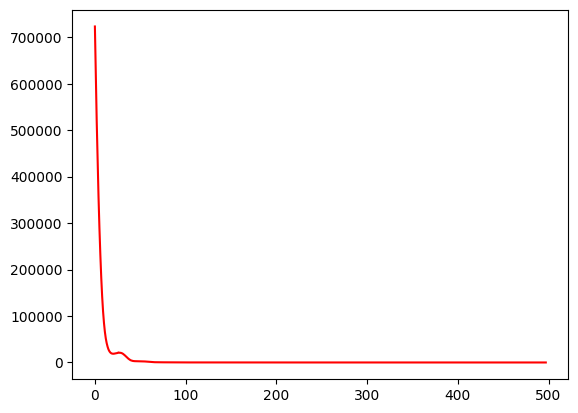

100%|█████████▉| 498/500 [01:48<00:00,  5.54it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.17514124293785
Dataset Name:  disney , AUC Score (contextual):  62.53443526170799
Dataset Name:  disney , AUC Score (structural):  54.6788990825688
Dataset Name:  disney , AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney , AUC Score (structure type):  58.65860362836723
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.36914600550963
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


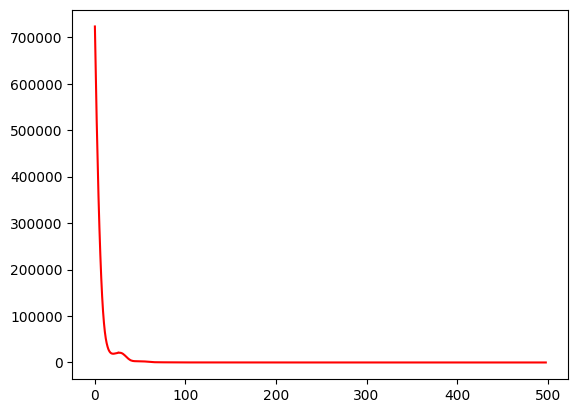

100%|█████████▉| 499/500 [01:48<00:00,  5.32it/s]

Dataset Name:  disney , AUC Score(benchmark/combined):  72.31638418079096
Dataset Name:  disney , AUC Score (contextual):  61.98347107438017
Dataset Name:  disney , AUC Score (structural):  54.617737003058096
Dataset Name:  disney , AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney , AUC Score (structure type):  58.71357888949973
Dataset Name:  disney  Best AUC Score(benchmark/combined):  72.59887005649718
Dataset Name:  disney  Best AUC Score (contextual):  94.21487603305786
Dataset Name:  disney  Best AUC Score (structural):  60.42813455657492
Dataset Name:  disney  Best AUC Score (joint-type):  82.92011019283746
Dataset Name:  disney  Best AUC Score (structure type):  62.616822429906534


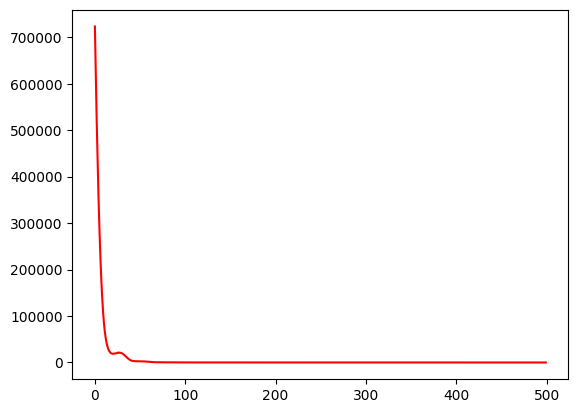

100%|██████████| 500/500 [01:48<00:00,  4.59it/s]


In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
parser = argparse.ArgumentParser(description='parameters')
parser.add_argument('-f')
parser.add_argument('--dataset', type=str, default="disney")
parser.add_argument('--lr', type=float, default=0.01)
parser.add_argument('--epoch_num', type=int, default=500)
parser.add_argument('--lambda_loss1', type=float, default=1e-2) #neighbor reconstruction loss weight
parser.add_argument('--lambda_loss2', type=float, default=0.1) #feature loss weight
parser.add_argument('--lambda_loss3', type=float, default=0.8) #degree loss weight
parser.add_argument('--sample_size', type=int, default=10)
parser.add_argument('--dimension', type=int, default=16)
parser.add_argument('--encoder', type=str, default="SAGE")
parser.add_argument('--loss_step', type=int, default=5000)
parser.add_argument('--real_loss', type=bool, default=False) #use real loss or adaptive loss
parser.add_argument('--neigh_loss', type=str, default="KL")
parser.add_argument('--h_loss_weight', type=float, default=1.0)#adaptive loss weight for h_loss
parser.add_argument('--feature_loss_weight', type=float, default=2.5) #adaptive loss weight for feature loss
parser.add_argument('--degree_loss_weight', type=float, default=1.0)#adaptive loss weight for degree loss
parser.add_argument('--calculate_contextual', type=bool, default=True)
parser.add_argument('--contextual_n', type=int, default=3)
parser.add_argument('--contextual_k', type=int, default=5)
parser.add_argument('--calculate_structural', type=bool, default=True)
parser.add_argument('--structural_n', type=int, default=3)
parser.add_argument('--structural_m', type=int, default=5)
parser.add_argument('--use_combine_outlier', type=bool, default=False)
parser.add_argument('--plot_loss', type=bool, default=True)
parser.add_argument('--normalize_feat', type=bool, default=False)



args = parser.parse_args()

print("GAD-NR: Graph Anomaly Detection via Neighborhood Reconstruction")
print("Dataset: ", args.dataset, "lr:", args.lr, "lambda_loss1 (neighbor):",args.lambda_loss1, "lambda_loss2 (feature):", args.lambda_loss2, "lambda_loss3 (degree):", args.lambda_loss3, "sample_size:", args.sample_size, "dimension:",args.dimension, "encoder:", args.encoder, "loss_step:", args.loss_step,"real_loss:", args.real_loss, "h_loss_weight:",args.h_loss_weight,"feature_loss_weight",args.feature_loss_weight,"degree_loss_weight:",args.degree_loss_weight,
"calculate_contextual",args.calculate_contextual,"calculate_structural",args.calculate_structural)


dataset_str = args.dataset
train_real_datasets(dataset_str=dataset_str, lr=args.lr, epoch_num=args.epoch_num, lambda_loss1=args.lambda_loss1, 
lambda_loss2=args.lambda_loss2, lambda_loss3=args.lambda_loss3, encoder=args.encoder, sample_size=args.sample_size, loss_step=args.loss_step, 
hidden_dim=args.dimension,real_loss=args.real_loss,calculate_contextual=args.calculate_contextual,calculate_structural=args.calculate_structural)